<span style="font-size:17pt; color:gold">Data Processing-Analysis - *Segmentation-based* </span> <br /> 
<span style="font-size:14pt; color:dodgerblue">Medulloblastoma *Resolve*, *Vizgen*, *Xenium*, *RNAScope* (add-on) comparison </span> <br /> 
<span style="font-size:14pt; color:gold">using segmented cells (Cellpose - Dragonfly imaging) </span> <br /> 
<span style="font-size:12pt; color:orange">..in `micron` space </span> <br />
<span style="font-size:11pt; color:hotpink; background-color:black">using several samples -> ***MB299, 295, 266, 263*** </span>  <br /> 
<span style="font-size:11pt; color:hotpink; background-color:black">using only -> ***MB295, 266*** samples for *Vizgen* (2nd run) </span>  <br /> 

In [1]:
### make sure all libs are installed a priori!
## load libs ----
    suppressPackageStartupMessages({
    library(ggplot2)
    library(ggdark)
    library(ggridges)
    library(ggpubr)
    library(scater)
    library(Seurat)
    library(dplyr)
    library(magrittr)
    library(png)
    library(cowplot)
    library(parallel)
    library(harmony)
    library(cetcolor)
    library(gridExtra)
    library(plotly)
    library(ggridges)
    library(jpeg)
    library(scales)    
    library(fields)
    library(spatstat)
    library(patchwork)
    library(Matrix)
    library(progressr)
    library(BiocParallel) 
    library(sf)    
})

In [2]:
# set R options, paths, object params, names, functions, etc..
message("Setting options, paths and object params..")
Sys.setenv(LANG = "en")
# ..to visualize huge array, standard notation vs scientific one, digits after comma.
options(max.print = 6e+5, scipen = 500, digits = 6)

# set maximum for object size
# [Parallelization in Seurat](https://satijalab.org/seurat/articles/future_vignette.html)
# for global variables size, if default limit is smaller..
message("Setting default limit for globar vars size: ", 
        paste0("~", round((50000 * 1024^2) / 1e+9), "G RAM"))
options(future.globals.maxSize = 50000 * 1024^2)

#' To get metadata df from sfe object
    #' @param object SFE or Seurat object
    #' @noRd
    getMeta <- function(object = NULL) {
      if (class(object) == "Seurat") {
        #is(object, "Seurat")
        # return Seurat metadata
        return(slot(object, name = "meta.data"))
        } else {
        #return(colData(object) |> slot(name = "listData") |> as.data.frame.list())
          return(colData(object) |> 
         methods::slot(name = "listData") |> 
         as.data.frame.list())
        }
      }

# set root dir
dir_working <- "./segmentation_based/"
dir_path <- file.path(dir_working, "objects")
setwd(dir_working)

# set object params & names ----
#assay.name <- "Vizgen_Resolve"
project.name <- "Medulloblastoma"

## some Resolve samples info
    # A2(W4A1, MB263)
    # B2 (W5A1, MB266)
    # C2-1 (W6A1, MB295) 
    # C2-2 (W6A2, MB295)
    # D2 (W7A1, MB299)
#sample.names <- paste0("mb", c(299, 295, 266, 263))

# font and other params ----
# set global options for ggrepel 
# [ggrepel](https://ggrepel.slowkow.com/articles/examples.html)
options(ggrepel.max.overlaps = 60)
if (!exists("family.base")) { family.base = "Arial" } # base family for plots
# to have ["sharp" plots](https://github.com/IRkernel/IRkernel/issues/604#issuecomment-736378482)
# ..[font for plots](https://github.com/IRkernel/IRkernel/issues/604#issuecomment-736640324)
Cairo::CairoFonts(
    regular = paste0(family.base,":style=Medium"),
    bold = paste0(family.base,":style=Bold"),
    italic = paste0(family.base,":style=Oblique"),
    bolditalic = paste0(family.base,":style=BoldOblique"),
    symbol = paste0(family.base,":style=Oblique"))
options(bitmapType = "cairo")

# set mc.cores from parallel packages
message("Total cores for parallelization with `parallel`: ", parallel::detectCores()) # how many cores in total
message("Total workers/cores for parallelization with `BiocParallel`: ", BiocParallel::multicoreWorkers())
# set 25% of total cores
mc.cores <- quantile(detectCores() %>% seq)[2] %>% round
message(names(mc.cores), " of total cores `parallel`: ", mc.cores)
bp.workers <- quantile(BiocParallel::multicoreWorkers() %>% seq)[2] %>% round 
message(names(bp.workers), " of total workers `BiocParallel`: ", bp.workers)


Setting options, paths and object params..

Setting default limit for globar vars size: ~52G RAM

Total cores for parallelization with `parallel`: 72

Total workers/cores for parallelization with `BiocParallel`: 70

25% of total cores `parallel`: 19

25% of total workers `BiocParallel`: 18



In [3]:
package.version("Seurat")
package.version("SeuratObject")

[1] "4.3.0.9002"

[1] "4.1.3"

In [4]:
# load modified subset function
source("./scripts/subset_obj_seurat_v2.R")

In [5]:
# Sanity function
sanity.seurat <- function(obj = NULL) {
  # check for genes
  gene.index <- c((GetAssayData(obj) %>% rowSums) == 0)
  if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj %<>% subset_opt(features = rownames(obj)[-n.genes])
  } else { message("Sanity passed:", "\n",
                   ">>> A single gene is expressed in least 1 cell", "\n", 
                   ">>> No genes have 0 expression in all cells") }
  
  # check for cells
  cell.index <- c((GetAssayData(obj) %>% colSums) == 0)
  if (cell.index %>% any) {
    message("Removing cell with 0 transcript counts")
    obj %<>% subset_opt(cells = -which(cell.index))
  } else { message("Sanity passed:", "\n", 
                   ">>> All transcript counts > 0") }
  return(obj)
}

#### <span style="font-size:12pt; color:gold"> Load *Xenium* objects </span>
<span style="font-size:10pt; color:tomato">***MB263, 266, 295, 299*** samples.. </span>

In [4]:
dir_xen <- "./xenium_data_MBEN/"
fov <- 
list.files(dir_xen) %>%
stringr::str_split(., pattern = "__") %>% unlist %>% 
grep("MB", ., value = TRUE) %>% tolower() %>% 
paste0(".Xenium")
fov

[1] "mb263.Xenium" "mb266.Xenium" "mb295.Xenium" "mb299.Xenium"

In [7]:
# load data
dir_xen %<>% list.files(full.names = TRUE)
start.time <- Sys.time()
# using lapply 
obj.xen_list <- 
  lapply(dir_xen %>% seq, function(i) {
    message("Creating/Loading object(s): ", "\n", fov[i])
    gc() %>% invisible() # collect garbage
        LoadXenium(data.dir = dir_xen[i],
                   fov = fov[i],
                   assay = "Xenium")
  })

end.time <- Sys.time()
message("Time taken to load object = ",
        round(end.time - start.time, digits = 2), " ", 
        attr(c(end.time - start.time), "units"))
obj.xen_list

Creating/Loading object(s): 
mb263.Xenium

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Creating/Loading object(s): 
mb266.Xenium

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Creating/Loading object(s): 
mb295.Xenium

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning

[[1]]
An object of class Seurat 
534 features across 133986 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb263.Xenium

[[2]]
An object of class Seurat 
534 features across 145016 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb266.Xenium

[[3]]
An object of class Seurat 
534 features across 211673 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb295.Xenium

[[4]]
An object of class Seurat 
534 features across 262183 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spati

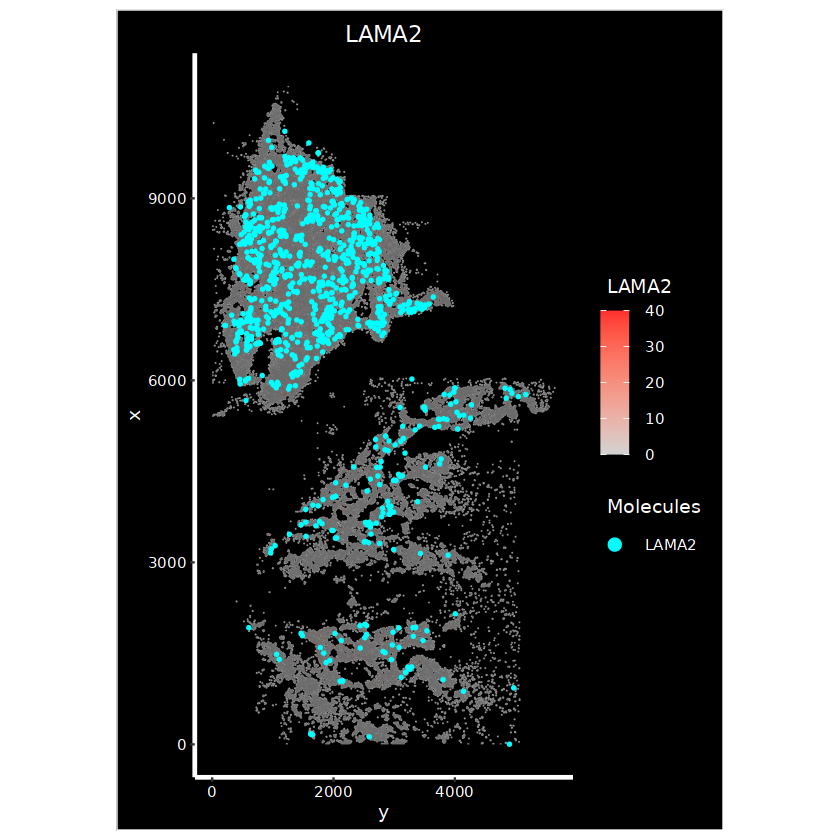

In [61]:
ImageFeaturePlot(obj.xen_list[[1]],
                 fov = Images(obj.xen_list[[1]]), # using cropped FOV for plotting.
                 features = "LAMA2",
                 molecules = "LAMA2",
                 mols.cols = "cyan1",
                 mols.size = 0.5,
                 nmols = 1000,
                 size = 1,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "segmentation",
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE)

In [19]:
# save list object Xenium data
dir_path <- "./segmentation_based/objects/"
saveRDS(object = obj.xen_list, file = file.path(dir_path, "xen_mben_list_objs.rds"))

#### <span style="font-size:12pt; color:gold">Load *Resolve* objects </span>
<span style="font-size:10pt; color:tomato">***MB299, 295, 266, 263*** samples.. </span> <br />

In [ ]:
# dir for objects loading 
dir_re <- "./MBEN_Results/objects/"

# list files
files2load <-
list.files(dir_re, pattern = ".rds|.RDS",
           all.files = TRUE, 
           full.names = TRUE,
           recursive = TRUE)
files2load

# load objs
gc() %>% invisible
start.time <- Sys.time()
obj.list <- 
    BiocParallel::bplapply(files2load %>% seq, function(i) { 
        readRDS(file = files2load[i]) }, 
        BPPARAM = BiocParallel::MulticoreParam(5, tasks = 10L, 
                                               force.GC = FALSE, 
                                               progressbar = TRUE))
#obj.list
end.time <- Sys.time()
end.time - start.time
gc() %>% invisible

obj.list

# prepare object names                     
obj.names <- 
list.files(dir_re, pattern = ".rds|.RDS",
           full.names = FALSE,
           recursive = TRUE)                  
obj.names <- 
lapply(obj.names %>% seq, function(i) {
    obj.names[[i]] %>% 
    gsub(pattern = "_|-|[.]", ".", .,) %>%
    substr(start = 1, stop = nchar(.) - 4) %>% 
    tolower
}
      )
#obj.names
names(obj.list) <- obj.names
obj.list %>% names

## some samples info
    # A2(W4A1, MB263)
    # B2 (W5A1, MB266)
    # C2-1 (W6A1, MB295) 
    # C2-2 (W6A2, MB295)
    # D2 (W7A1, MB299)

# add sample names to $orig.ident
if (grep("w4", obj.list %>% names) %>% any) {
    for (i in grep("w4", obj.list %>% names)) {
        obj.list[[i]]$orig.ident <- "mb263"
}} 
if (grep("w6", obj.list %>% names) %>% any) {
    for (i in grep("w6", obj.list %>% names)) {
        obj.list[[i]]$orig.ident <- "mb295"
}} 
if (grep("w5", obj.list %>% names) %>% any) {
    for (i in grep("w5", obj.list %>% names)) {
    obj.list[[i]]$orig.ident <- "mb266"
}} 
if (grep("w7", obj.list %>% names) %>% any) {
    for (i in grep("w7", obj.list %>% names)) {
    obj.list[[i]]$orig.ident <- "mb299"
}}
# check
lapply(obj.list %>% seq, function(i) obj.list[[i]]$orig.ident %>% table)

# merge objects - only A1-A2 CELLPOSE.DRAGONFLY objs - only MB295
if (grep("DRAGONFLY|dragonfly", obj.list %>% names) %>% any) {
    obj.list.index <- grep("DRAGONFLY|dragonfly", obj.list %>% names, value = TRUE) %>% 
       grep("CELLPOSE|cellpose", ., value = TRUE)
} else if (grep("CELLPOSE|cellpose", obj.list %>% names) %>% any) {
    obj.list.index <- grep("CELLPOSE|cellpose", obj.list %>% names, value = TRUE)
}

# all samples
obj.list.index %>% str
obj.re <- merge(x = obj.list[[obj.list.index[1]]], y = c(obj.list[obj.list.index[-1]]))
gc() %>% invisible

# rename FOVs in Resolve
names(obj.re@images) <- 
lapply(obj.list.index %>% seq, function(i) {
    gsub("cellpose.dragonfly", "", names(obj.list)[i]) %>%
    #tolower %>% 
    paste0(obj.list[[i]]$orig.ident %>% unique, 
           ., ".Resolve", collapse = ".") }) %>% unlist

# rename assay
if (!Assays(obj.re) == "Resolve") { obj.re %<>% RenameAssays(Spatial = "Resolve") }

# update metadata
obj.re$samples <- obj.re$sample_name
obj.re %<>% UpdateSeuratObject()
obj.re

In [8]:
# Sanity check
# intersect target genes per sample/obj
genes.in.all <-
# intersect target genes
lapply(obj.list %>% seq, function(i) rownames(obj.list[[i]]) %>% 
    grep("FP |Dupl", ., value = TRUE, invert = TRUE)) %>%
# only unique genes
#unlist %>% unique
purrr::reduce(., intersect)
message("Matched genes from all samples: ", genes.in.all %>% length())
genes.in.all %>% str

if (any(obj.re$nCount_Resolve == 0)) {
    message("Removing cells with 0 transcript counts")
    obj.re %<>% subset(subset = nCount_Resolve > 0)
}
obj.re

Matched genes from all samples: 95



 chr [1:95] "AIF1" "AQP4" "ASTN1" "BMPR1B" "BOC" "CA10" "CCR7" "CD14" ...


Removing cell with 0 transcript counts



An object of class Seurat 
127 features across 138516 samples within 1 assay 
Active assay: Resolve (127 features, 0 variable features)
 5 spatial fields of view present: mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

#### <span style="font-size:12pt; color:gold"> Load *Vizgen* objects </span>
<span style="font-size:10pt; color:tomato">***MB295, 266*** samples (2nd run).. </span> <br />

In [ ]:
# set dir for objects loading
# dir for objects loading
dir_vz <- "./vizgen_data/analyzed_data"
message("Working directory is set to:", "\n", dir_vz)
dir_use <- list.files(dir_vz, pattern = "-MB1", full.names = TRUE) %>% 
    list.files(pattern = "region_0|_1", full.names = TRUE)
message("Data will be loaded from:", "\n", paste(dir_use, "\n"))
dir_use

In [ ]:
# load objects (old and new) using lapply to a list - using `BiocParallel`
# set params
#mol.type <- "microns"
#z.stack <- 3L # z stack to use

# create Seurat obj
# re-load optimized `LoadVizgen()` & `ReadVizgen()`
#source("./scripts/read_load_vizgen_v2.R")
#message("Using optimized `LoadVizgen_opt()` function")

## name to store FOV
sample.names <- paste0("mb", c(295, 266))
# eg sample name or fusud sample name with `region.0`
use.fused.name <- TRUE # set to FALSE if to use sample name only!

# setup names
region.name <-
lapply(dir_use %>% seq, function(i) {
    stringr::str_split(dir_use[i], pattern = "/", simplify = TRUE) %>% 
    grep("region", ., value = TRUE) %>% 
    #gsub(pattern = "_", replacement = ".", .)}
    gsub(pattern = "_", replacement = "", .)}
      )
region.name
fov <- 
lapply(dir_use %>% seq, function(i) {
    if (use.fused.name) {
        paste0(tolower(sample.names[i]), ".", 
               region.name[i], ".Vizgen")
    } else {
        tolower(sample.names[i])
    }}
      )
fov

##
start.time <- Sys.time()
# using lapply 
obj.vz_list <- 
  lapply(dir_use %>% seq, function(i) {
    message("Creating/Loading object(s): ", "\n", fov[i])
    gc() %>% invisible() # collect garbage
    # renders progress of function
    #with_progress(
        #LoadVizgen_opt(data.dir = dir_use[i],
        LoadVizgen(data.dir = dir_use[i],
                   fov = fov[i],
                   assay = "Vizgen",
                   metadata = c("volume", "fov"), # add cell volume info
                   #mol.type = mol.type, # molecule coords in µm space
                   #type = c("boxes", "centroids"), # type of cell spatial coord matrices
                   type = c("segmentations", "centroids"), # type of cell spatial coord matrices
                   #type = c("centroids"), # type of cell spatial coord matrices
                   #filter = '^Blank-',
                   filter = NA_character_,
                   #z = z.stack,
                   add.zIndex = TRUE, # add z slice section to a cell
                   update.object = TRUE,
                   use.BiocParallel = TRUE,
                   workers.MulticoreParam = 14, # for `BiocParallel` processing
                   #use.furrr = TRUE, # when working with list use furrr or purrr
                   verbose = TRUE
                  )
   #)
    }
    )

end.time <- Sys.time()
message("Time taken to load object = ", 
        round(end.time - start.time, digits = 2), " ", 
        attr(c(end.time - start.time), "units"))
obj.vz_list

<span style="font-size:12pt; color:gold"> Merge (raw) *Vizgen* objs into single object </span> <br />

In [11]:
# add sample name to each obj$orig.ident
for (i in obj.vz_list %>% seq) { obj.vz_list[[i]]$orig.ident <- Images(obj.vz_list[[i]]) }

# merge objs
obj.vz <- merge(x = RenameAssays(obj.vz_list[[1]], Vizgen = "Spatial"),
                y = RenameAssays(obj.vz_list[[2]], Vizgen = "Spatial"),
                add.cell.ids = c(Images(obj.vz_list[[1]]), 
                                 Images(obj.vz_list[[2]]))
               )
obj.vz

Renaming default assay from Vizgen to Spatial

Warning message:
“Cannot add objects with duplicate keys (offending key: vizgen_) setting key to original value 'spatial_'”
Renaming default assay from Vizgen to Spatial

Warning message:
“Cannot add objects with duplicate keys (offending key: vizgen_) setting key to original value 'spatial_'”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”


An object of class Seurat 
180 features across 140253 samples within 1 assay 
Active assay: Spatial (180 features, 0 variable features)
 2 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen

#### <span style="font-size:12pt; color:gold"> Prefiltering, Updating metadata, Merging.. </span>
<span style="font-size:10pt; color:tomato">*Vizgen*, *Resolve* objects & MBEN *snRNAseq* </span> <br />

In [ ]:
# Prefiltering ----
gc() %>% invisible()
# Sanity check
if (any(obj.re$nCount_Resolve == 0)) {
    message("Removing cell with 0 transcript counts")
    obj.re %<>% subset(subset = nCount_Resolve > 0)
} else { message("All transcript counts > 0") }

if (any(obj.vz$nCount_Vizgen == 0)) {
    message("Removing cell with 0 transcript counts")
    obj.vz %<>% subset(subset = nCount_Vizgen > 0)
} else { message("All transcript counts > 0") }


All transcript counts > 0

All transcript counts > 0



<span style="font-size:12pt; color:gold"> Get genes per technology </span> <br />
<span style="font-size:10pt; color:steelblue"> ..all genes are kept </span> <br />

In [170]:
# all unique genes in Resolve and Vizgen (not matched)
g.full <- c(rownames(obj.vz), rownames(obj.re)) %>% unique
g.full %>% str

 chr [1:210] "CD4" "TLL1" "EPHA8" "CD69" "CDKN1A" "CCR7" "PDGFRA" "CD44" ...


<span style="font-size:10pt; color:steelblue"> ..matched target and background genes are kept </span> <br />

In [171]:
# matched target genes + tech-specific background genes
g.matched.bg <- 
    # same genes between techs
    intersect(rownames(obj.vz), rownames(obj.re)) %>% 
    # keep tech-specific bg genes
    c(., grep("Blank-|FP ", lapply(seq(2), 
                              function(i) 
                                  rownames(list(obj.re, obj.vz)[[i]])) %>% 
                              unlist %>% unique, value = TRUE))
g.matched.bg %>% str

 chr [1:164] "CD4" "TLL1" "EPHA8" "CD69" "CCR7" "CD44" "EGFR" "KHDRBS2" ...


<span style="font-size:10pt; color:steelblue"> ..matched target genes only are kept </span> <br />

In [172]:
# matched target genes
g.matched <- 
    # same genes between techs
    intersect(rownames(obj.vz), rownames(obj.re))
g.matched %>% str

 chr [1:97] "CD4" "TLL1" "EPHA8" "CD69" "CCR7" "CD44" "EGFR" "KHDRBS2" ...


<span style="font-size:12pt; color:gold"> Update metadata *before* merging.. </span> <br />

In [ ]:
## add to Resolve ----
obj.re$spatial_tech <- paste0("Resolve")
# add FOV names..
for (i in unique(obj.re$samples) %>% seq) {
    obj.re$orig.ident[which(obj.re$samples == unique(obj.re$samples)[i])] <- 
    Images(obj.re)[i]
}
# add meta vars
meta.vars.names <- c("spatial_tech", "segmentation_method")
meta.vars <- c("Resolve", "Cellpose")
meta.vars <- lapply(meta.vars %>% seq, function(i) 
{ rep_len(meta.vars[i], length.out = Cells(obj.re) %>% length) }
                   )
meta.vars %>% str
for (i in meta.vars.names %>% seq) {
    obj.re %<>% AddMetaData(metadata = meta.vars[[i]],
                            col.name = meta.vars.names[i])
        }

## add to Vizgen ----
meta.vars.names <- c("samples", "spatial_tech", "segmentation_method")
meta.vars <- c("Vizgen", "Cellpose")
meta.vars <- lapply(meta.vars %>% seq, function(i) 
{ rep_len(meta.vars[i], length.out = Cells(obj.vz) %>% length) }
                   )
meta.vars %>% str

# support for mutiple samples, if saved as FOV name of in $orig.ident
if (all(Images(obj.vz) == unique(obj.vz$orig.ident))) {
    samples.add <- 
    lapply(Images(obj.vz) %>% seq, function(i) {
        filter(getMeta(obj.vz), orig.ident == Images(obj.vz)[i]) %>% 
            select(orig.ident) %>% 
            pull(orig.ident)
    }) %>% unlist %>% unname
} 
samples.add %>% str
meta.vars %<>% c(list(samples.add), .)
# add..
for (i in meta.vars.names %>% seq) {
    obj.vz %<>% AddMetaData(metadata = meta.vars[[i]],
                            col.name = meta.vars.names[i])
        }
obj.vz$orig.ident <- obj.vz$samples
obj.vz$cell_id <- Cells(obj.vz)

obj.re %>% getMeta %>% str
obj.vz %>% getMeta %>% str

List of 2
 $ : chr [1:138516] "Resolve" "Resolve" "Resolve" "Resolve" ...
 $ : chr [1:138516] "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
List of 2
 $ : chr [1:140253] "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ : chr [1:140253] "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 chr [1:140253] "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
'data.frame':	138516 obs. of  11 variables:
 $ orig.ident         : chr  "mb263.w4a1.Resolve" "mb263.w4a1.Resolve" "mb263.w4a1.Resolve" "mb263.w4a1.Resolve" ...
 $ nCount_Resolve     : num  31 50 10 5 58 39 13 30 32 47 ...
 $ nFeature_Resolve   : int  16 21 7 3 16 12 9 12 16 12 ...
 $ cell_id            : chr  "cellpose.dragonfly.W4A1-cell-1" "cellpose.dragonfly.W4A1-cell-2" "cellpose.dragonfly.W4A1-cell-3" "cellpose.dragonfly.W4A1-cell-4" ...
 $ sample_name        : chr  "cellpose.dragonfly.W4A1" "cellpose.dragonfly.W4A1" "cellpose.dragonfly.W4A1" "cellpose.dragonfly.W4A1" ...
 $ region             : num  1 1 1 1 1 1 1 1 1 1 ...
 $ z            

<span style="font-size:12pt; color:gold"> Merge objects..</span> <br />
<span style="font-size:11pt; color:tomato"> ..make sure objects have the **same** assay names! </span> <br />

In [ ]:
gc() %>% invisible
obj.merged <- merge(x = { if (!any(Assays(obj.vz) == "Spatial")) {
                                RenameAssays(obj.vz, Vizgen = "Spatial")
                        } else { obj.vz }},
                    y = { if (!any(Assays(obj.re) == "Spatial")) {
                                RenameAssays(obj.re, Resolve = "Spatial")
                        } else { obj.re }},
                    add.cell.ids = c("Vz", "Re"))
obj.merged

Renaming default assay from Resolve to Spatial

Warning message:
“Cannot add objects with duplicate keys (offending key: resolve_) setting key to original value 'spatial_'”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”


An object of class Seurat 
210 features across 278769 samples within 1 assay 
Active assay: Spatial (210 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

<span style="font-size:12pt; color:gold"> Update metadata *after* merging.. </span> <br />

In [ ]:
# extract metadata
meta_df <- getMeta(obj.merged)
# remove metavars 
meta_df %<>% 
    select(!contains(c("nCount", "nFeature", "sample_name"))) %>%
    # rename some meta vars
    rename("cell_volume" = grep("volume", names(meta_df), value = TRUE))

#meta_df %<>% mutate_if(is.character, stringr::str_to_title)
# make a function to check if letter are lower case
is_lower.case <- function(vec = NULL) { 
    if (is.character(vec)) { 
        vec.low <- tolower(vec)
        c(vec == vec.low) %>% any
    }
}

# skip this part
# make title-like names for some char. vars (if some are uppercase)
run.it <- FALSE # set to TRUE to run it
if (run.it) {
    for (i in meta_df %>% names %>% seq) {
    if (is.character(meta_df[,i]) && 
        ifelse(is.empty(is_lower.case(meta_df[,i])), yes = TRUE, no = FALSE)) {
        meta_df[, i, drop = FALSE] <- meta_df[, i, drop = FALSE] %>% 
            as.character %>% 
            stringr::str_to_title(.)

    }
    }  
}
# ..or
if (run.it) {
    meta_df %<>%
        mutate_if(is.character,
                  stringr::str_to_title)
}

meta_df %<>% mutate(samples = orig.ident)
meta_df %>% str

'data.frame':	278769 obs. of  10 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume        : num  632 556 281 887 471 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...


<span style="font-size:12pt; color:gold"> Creating new pre-filtered object (ie, only with `nCount > 0`) & add FOVs </span> <br />

In [173]:
# Create new raw object
if (!assay.name == "VizRes") { assay.name <- "VizRes" }
gc() %>% invisible
obj <- 
    GetAssayData(obj.merged) %>%
    CreateSeuratObject(.,
                       # keep genes expressed at least in 1 cell
                       #min.cells = 1,                  
                       assay = assay.name, 
                       meta.data = meta_df)
obj
    
start.time <- Sys.time() 
# in a loop
for (i in Images(obj.merged) %>% seq) {
    obj[[Images(obj.merged)[i]]] <- obj.merged[[Images(obj.merged)[i]]]
}
end.time <- Sys.time() 
end.time - start.time

obj %<>% UpdateSeuratObject()
obj
obj %>% getMeta %>% str

An object of class Seurat 
210 features across 278769 samples within 1 assay 
Active assay: VizRes (210 features, 0 variable features)

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Cannot add objects with duplicate keys (offending key: Vizgen_), setting key to 'mb266.region1.vizgen_'”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mb266.region1.vizgen_ to mb266region1vizgen_”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Cannot add objects with duplicate keys (offending key: Resolve_), setting key to 'mb266.w5a1.resolve_'”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mb266.w5a1.resolve_ to mb266w5a1resolve_”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Cannot add ob

Time difference of 20.7988 secs

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version



An object of class Seurat 
210 features across 278769 samples within 1 assay 
Active assay: VizRes (210 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

'data.frame':	278769 obs. of  12 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ nCount_VizRes      : num  22 3 2 163 42 70 2 41 77 7 ...
 $ nFeature_VizRes    : int  14 3 2 43 26 30 2 23 42 7 ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume        : num  632 556 281 887 471 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num        

<span style="font-size:12pt; color:gold"> Sanity check on genes and cells </span> <br />
<span style="font-size:11pt; color:steelblue"> ..subset usning modified `subset` function
</span> <br />

In [207]:
# load modified subset function
source("./scripts/subset_obj_seurat_v2.R")

In [208]:
# Sanity
# check for genes
gene.index <- c((GetAssayData(obj) %>% rowSums) == 0)
if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj %<>% subset_opt(features = rownames(obj)[-n.genes])
    } else { message("Sanity passed:", "\n",
                     ">>> A single gene is expressed in least 1 cell", "\n", 
                     ">>> No genes have 0 expression in all cells") }

# check for cells
cell.index <- c((GetAssayData(obj) %>% colSums) == 0)
if (cell.index %>% any) {
    message("Removing cell with 0 transcript counts")
    obj %<>% subset_opt(cells = -which(cell.index))
} else { message("Sanity passed:", "\n", 
                 ">>> All transcript counts > 0") }

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Sanity passed:
>>> All transcript counts > 0



<span style="font-size:12pt; color:gold"> Subset obj(s) for each configuration of genes </span> <br />
<span style="font-size:11pt; color:steelblue"> .. using modified `subset` function
</span> <br />

In [176]:
# pre-filtered merged obj - all genes
# the full obj from above
# obj

In [120]:
# eg subset for 100 genes and 4 molecules
# NOTE, FOVs will be subsetted as well
if (FALSE) { # set to TRUE to run the test
    test <- 
    subset_opt(obj, 
               cells = Cells(obj)[1:100],
               features = rownames(obj)[1:4])
}


In [209]:
# pre-filtered merged obj - matched target genes + tech-specific background genes
obj.vzre.bg <-
# subset it..
    obj %>% subset_opt(features = g.matched.bg)
obj.vzre.bg

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data 

An object of class Seurat 
164 features across 278769 samples within 1 assay 
Active assay: VizRes (164 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

In [210]:
# Sanity
# check for genes
gene.index <- c((GetAssayData(obj.vzre.bg) %>% rowSums) == 0)
if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj.vzre.bg %<>% 
        subset_opt(features = rownames(obj.vzre.bg)[-n.genes])
    } else { message("Sanity passed:", "\n",
                     ">>> A single gene is expressed in least 1 cell", "\n", 
                     ">>> No genes have 0 expression in all cells") }

# check for cells
cell.index <- c((GetAssayData(obj.vzre.bg) %>% colSums) == 0)
if (cell.index %>% any) {
    message("Removing cells with 0 transcript counts")
    obj.vzre.bg %<>% subset_opt(cells = -which(cell.index))
} else { message("Sanity passed:", "\n", 
                 ">>> All transcript counts > 0") }
obj.vzre.bg

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Removing cells with 0 transcript counts

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't assoc

An object of class Seurat 
164 features across 278473 samples within 1 assay 
Active assay: VizRes (164 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

In [211]:
# check for FOVs
lapply(Images(obj.vzre.bg) %>% seq, 
       function(i) obj.vzre.bg[[Images(obj.vzre.bg)[i]]])
       

[[1]]
Spatial coordinates for 78432 cells and 137 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Vizgen 
Key: Vizgen_ 

[[2]]
Spatial coordinates for 61532 cells and 137 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Vizgen 
Key: mb266region1vizgen_ 

[[3]]
Spatial coordinates for 32106 cells and 123 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: segmentation 
 1 other segmentation boundaries present: centroids 
Associated assay: Resolve 
Key: Resolve_ 

[[4]]
Spatial coordinates for 34625 cells and 122 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: segmentation 
 1 other segmentation boundaries present: centroids 
Associa

In [212]:
# pre-filtered merged obj - matched target genes only
obj.vzre <-
# subset it..
    obj %>% subset_opt(features = g.matched)

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data 

In [213]:
# Sanity
# check for genes
gene.index <- c((GetAssayData(obj.vzre) %>% rowSums) == 0)
if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj.vzre %<>% 
        subset_opt(features = rownames(obj.vzre)[-n.genes])
    } else { message("Sanity passed:", "\n",
                     ">>> A single gene is expressed in least 1 cell", "\n", 
                     ">>> No genes have 0 expression in all cells") }

# check for cells
cell.index <- c((GetAssayData(obj.vzre) %>% colSums) == 0)
if (cell.index %>% any) {
    message("Removing cell with 0 transcript counts")
    obj.vzre %<>% subset_opt(cells = -which(cell.index))
} else { message("Sanity passed:", "\n", 
                 ">>> All transcript counts > 0") }

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Removing cell with 0 transcript counts

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associ

In [214]:
obj.vzre

An object of class Seurat 
97 features across 278425 samples within 1 assay 
Active assay: VizRes (97 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

In [215]:
# check for FOVs
lapply(Images(obj.vzre) %>% seq, 
       function(i) obj.vzre[[Images(obj.vzre)[i]]])
       

[[1]]
Spatial coordinates for 78402 cells and 97 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Vizgen 
Key: Vizgen_ 

[[2]]
Spatial coordinates for 61514 cells and 97 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Vizgen 
Key: mb266region1vizgen_ 

[[3]]
Spatial coordinates for 32106 cells and 96 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: segmentation 
 1 other segmentation boundaries present: centroids 
Associated assay: Resolve 
Key: Resolve_ 

[[4]]
Spatial coordinates for 34625 cells and 97 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: segmentation 
 1 other segmentation boundaries present: centroids 
Associated 

<span style="font-size:11pt; color:gold"> Load MBEN 10X *scRNAseq* obj </span> <br />
<span style="font-size:10pt; color:gold"> Merge it with *matched genes VzRe* object </span> <br />

In [219]:
# load full object 
file.sc <- 
    "./05_scRNAseq/mb_299.295.266.263_matched.rds"
obj.sc <- readRDS(file.sc)
obj.sc

# match genes ---- 
intersect(rownames(obj.vzre), rownames(obj.sc)) %>% str

# update metadata - scRNAseq ----
meta.df <- 
    obj.sc %>% 
    getMeta() %>%
    mutate(orig.ident = 
           gsub("ICGC_", "", orig.ident) %>% 
           tolower() %>% 
           paste0(".10Xsn"),
          samples = orig.ident,
          spatial_tech = paste0("10Xsn"),
          cell_id = Cells(obj.sc)) %>%
    rename(clusters.sc = seurat_clusters) %>%
    select(!contains(c("percent","nCount","nFeature")))
# replace metadata
obj.sc@meta.data <- meta.df

# update - VzRe
obj.vzre@meta.data %<>%
    select(!contains(c("nCount","nFeature")))

# merge objects
obj.vzre.sc <- merge(x = RenameAssays(obj.vzre, VizRes = "VizResSc"),
                    y = RenameAssays(obj.sc, RNA = "VizResSc"))
obj.vzre.sc
obj.vzre.sc %>% getMeta() %>% str


An object of class Seurat 
90 features across 17493 samples within 1 assay 
Active assay: RNA (90 features, 0 variable features)

 chr [1:90] "CD4" "TLL1" "EPHA8" "CD69" "CD44" "EGFR" "KHDRBS2" "DRAXIN" ...


Renaming default assay from VizRes to VizResSc

Warning message:
“Cannot add objects with duplicate keys (offending key: vizres_) setting key to original value 'vizressc_'”
Renaming default assay from RNA to VizResSc

Warning message:
“Cannot add objects with duplicate keys (offending key: rna_) setting key to original value 'vizressc_'”


An object of class Seurat 
97 features across 295918 samples within 1 assay 
Active assay: VizResSc (97 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

'data.frame':	295918 obs. of  13 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume        : num  632 556 281 887 471 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ nCount_VizResSc    : num  17 2 1 137 33 63 2 31 60 4 ...
 $ nFeature_Viz

In [220]:
# Sanity
# check for genes
gene.index <- c((GetAssayData(obj.vzre.sc) %>% rowSums) == 0)
if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj.vzre.sc %<>% 
        subset_opt(features = rownames(obj.vzre.sc)[-n.genes])
    } else { message("Sanity passed:", "\n",
                     ">>> A single gene is expressed in least 1 cell", "\n", 
                     ">>> No genes have 0 expression in all cells") }

# check for cells
cell.index <- c((GetAssayData(obj.vzre.sc) %>% colSums) == 0)
if (cell.index %>% any) {
    message("Removing cell with 0 transcript counts")
    obj.vzre.sc %<>% subset_opt(cells = -which(cell.index))
} else { message("Sanity passed:", "\n", 
                 ">>> All transcript counts > 0") }
obj.vzre.sc

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Sanity passed:
>>> All transcript counts > 0



An object of class Seurat 
97 features across 295918 samples within 1 assay 
Active assay: VizResSc (97 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

In [221]:
# save objects - in a loop
objs <-
    list(obj.vzre.sc,
         obj.vzre,
         obj.vzre.bg,
         obj)
names(objs) <- c("vz.re.sc_matched", 
                 "vz.re_matched",
                 "vz.re_matched_bg", 
                 "vz.re_full") %>% paste0(., ".rds")
dir_path <- "./segmentation_based/objects/"
if (!dir.exists(dir_path)) { dir.create(dir_path) }
pbapply::pboptions(type = "timer", style = 1, char = "=")
pbapply::pblapply(objs %>% seq, function(i) {
    message("Saving ... object: ", "\n", names(objs)[[i]])
    saveRDS(objs[[i]], file = paste0(dir_path, sep = "/", names(objs)[[i]]))
    }) %>% invisible()
message("Saving - done!")
list.files(dir_path)


  |                                                  | 0 % elapsed=00s   

Saving ... object: 
vz.re.sc_matched.rds



  |=============                                     | 25% elapsed=35s, remaining~01m 44s

Saving ... object: 
vz.re_matched.rds



  |=========================                         | 50% elapsed=01m 09s, remaining~01m 09s

Saving ... object: 
vz.re_matched_bg.rds



  |======================================            | 75% elapsed=01m 44s, remaining~35s

Saving ... object: 
vz.re_full.rds



  |==================================================| 100% elapsed=02m 22s, remaining~00s


Saving - done!



[1] "vz_MB295_266.rds"     "vz.re_full.rds"       "vz.re_matched_bg.rds"
[4] "vz.re_matched.rds"    "vz.re.sc_matched.rds"

#### <span style="font-size:12pt; color:gold"> Load merged pre-filtered object(s) (ie, only with `nCount > 0`) </span>
<span style="font-size:10pt; color:tomato">***MB295, 266*** samples (2nd run).. Vizgen </span> <br />
<span style="font-size:10pt; color:tomato">***MB299, 295, 266, 263*** samples..Resolve & 10X scRNAseq </span> <br />

In [7]:
dir_path <- "./segmentation_based/objects/"
file2load <- list.files(dir_path, pattern = "vz.re.sc_matched.rds", full.names = TRUE)

message("Loading ", "'", file2load %>% 
        gsub(pattern = paste0(dir_path, "|", "/"), replacement = "", .), "'", " object")
obj <- readRDS(file2load)
obj

Loading 'vz.re.sc_matched.rds' object



An object of class Seurat 
194 features across 295918 samples within 2 assays 
Active assay: SCT (97 features, 97 variable features)
 1 other assay present: VizResSc
 2 dimensional reductions calculated: pca, umap
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

In [8]:
obj %>% getMeta %>% str

'data.frame':	295918 obs. of  21 variables:
 $ orig.ident             : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                      : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume            : num  632 556 281 887 471 ...
 $ fov                    : logi  NA NA NA NA NA NA ...
 $ samples                : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech           : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method    : chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id                : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region                 : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num               : num  NA NA NA NA NA NA NA NA NA NA ...
 $ nCount_VizResSc        : num  17 2 1 137 33 63 2 31 60 4 ...
 $ 

#### <span style="font-size:11pt; color:gold"> Load MBEN *Xenium* list objs to merge with existing obj </span>

In [77]:
# load list object Xenium data
dir_path <- "./segmentation_based/objects/"
obj.xen_list <-
    readRDS(file = file.path(dir_path, "xen_mben_list_objs.rds"))
obj.xen_list

[[1]]
An object of class Seurat 
534 features across 133986 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb263.Xenium

[[2]]
An object of class Seurat 
534 features across 145016 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb266.Xenium

[[3]]
An object of class Seurat 
534 features across 211673 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb295.Xenium

[[4]]
An object of class Seurat 
534 features across 262183 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spati

In [78]:
obj.xen_list[[1]] %>% getMeta() %>% str

'data.frame':	133986 obs. of  9 variables:
 $ orig.ident              : Factor w/ 1 level "SeuratProject": 1 1 1 1 1 1 1 1 1 1 ...
 $ nCount_Xenium           : num  357 96 148 483 168 264 212 252 122 282 ...
 $ nFeature_Xenium         : int  100 51 59 120 73 92 81 85 59 88 ...
 $ nCount_BlankCodeword    : num  0 0 0 2 0 1 0 0 0 1 ...
 $ nFeature_BlankCodeword  : int  0 0 0 2 0 1 0 0 0 1 ...
 $ nCount_ControlCodeword  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ nFeature_ControlCodeword: int  0 0 0 0 0 0 0 0 0 0 ...
 $ nCount_ControlProbe     : num  1 0 0 0 0 0 0 0 0 0 ...
 $ nFeature_ControlProbe   : int  1 0 0 0 0 0 0 0 0 0 ...


In [6]:
# plot all samples - single gene
pl_all <- 
lapply(seq(obj.xen_list), function(i) {
    ImageFeaturePlot(obj.xen_list[[i]],
                 fov = Images(obj.xen_list[[i]]),
                 features = "nCount_Xenium", #"LAMA2",
                 #molecules = "LAMA2",
                 #mols.cols = "cyan1",
                 #mols.size = 0.5,
                 #nmols = 1000,
                 #min.cutoff = 1.5,        
                 size = 0.3,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 #scale = "none",    
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE) & ggtitle(Images(obj.xen_list[[i]]))
    })

In [7]:
pl_all[[1]]$data %>% pull(nCount_Xenium) %>% range
obj.xen_list[[1]]$nCount_Xenium %>% range

[1]    0 2727

[1]    0 2727

In [8]:
# order plotting var (eg, gene expression) in an increasing order
pl_all <- 
    lapply(pl_all, function(i) {
    i$data %<>% arrange(nCount_Xenium)
    i <- i & scale_fill_gradientn(colours = c("gray10", cet_pal(5, name = "fire")[-1]))   
    return(i)
    })

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


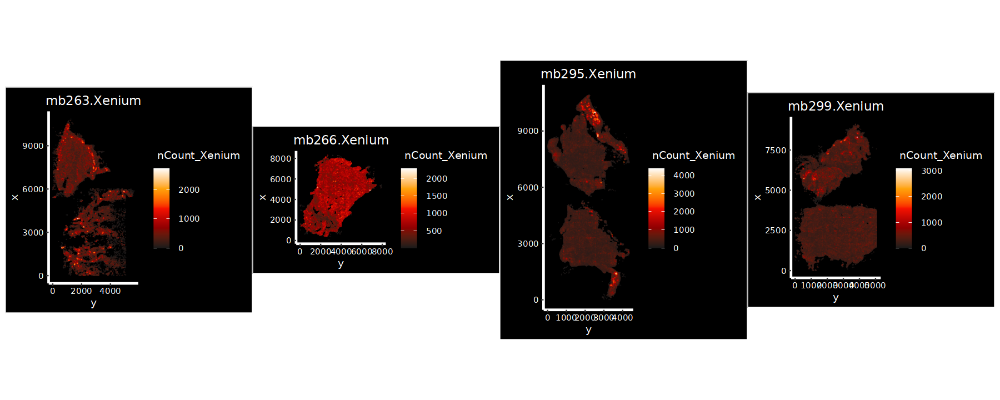

In [10]:
options(repr.plot.height = 6, repr.plot.width = 15)
patchwork::wrap_plots(pl_all, nrow = 1)

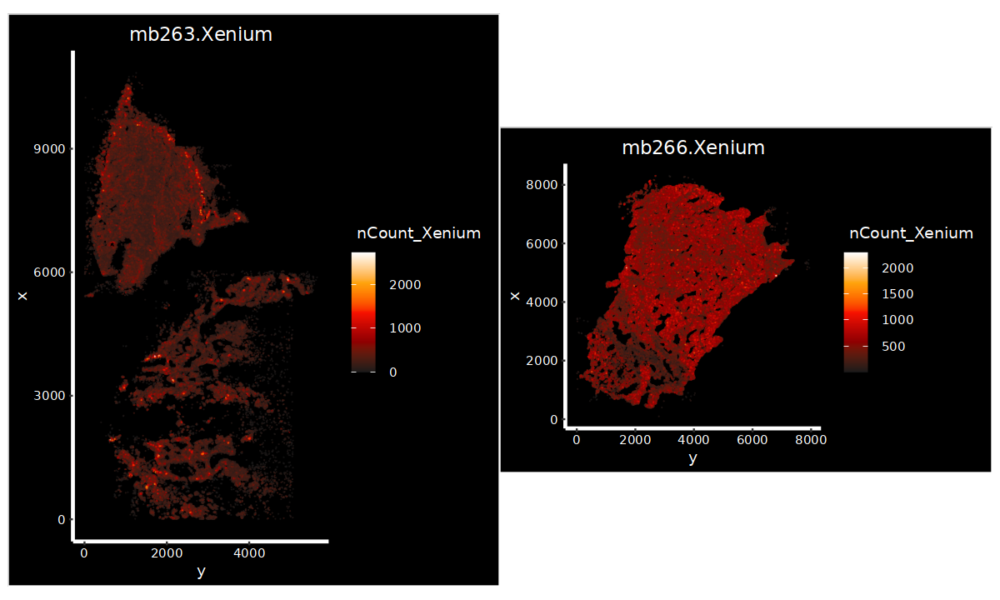

In [55]:
options(repr.plot.height = 6, repr.plot.width = 10)
patchwork::wrap_plots(pl_all[1:2], nrow = 1)

##### <span style="font-size:10pt; color:gold"> Crop Xenium obj **MB263 & 266** (lower part), removing potential tissue artifacts </span> <br />

In [4]:
# load modified subset function
#source("./scripts/subset_obj_seurat_v2.R")
# custom crop
source("./scripts/crop_seurat_v1.R")

In [81]:
# crop to cut out selected "good" region
xy_pts <- 
    list("mb263" = 
         data.frame("x" = c(5400, 11000, 5400, 6100, 7500, 11000),
                    "y" = c(0, 0, 1500, 2000, 4100, 4100)), 
         "mb266" = 
         data.frame("x" = c(3700, 9000, 9000, 9000, 2000, 2300),
                    "y" = c(1000, 1000, 9000, 4000, 5000, 3000))
        )

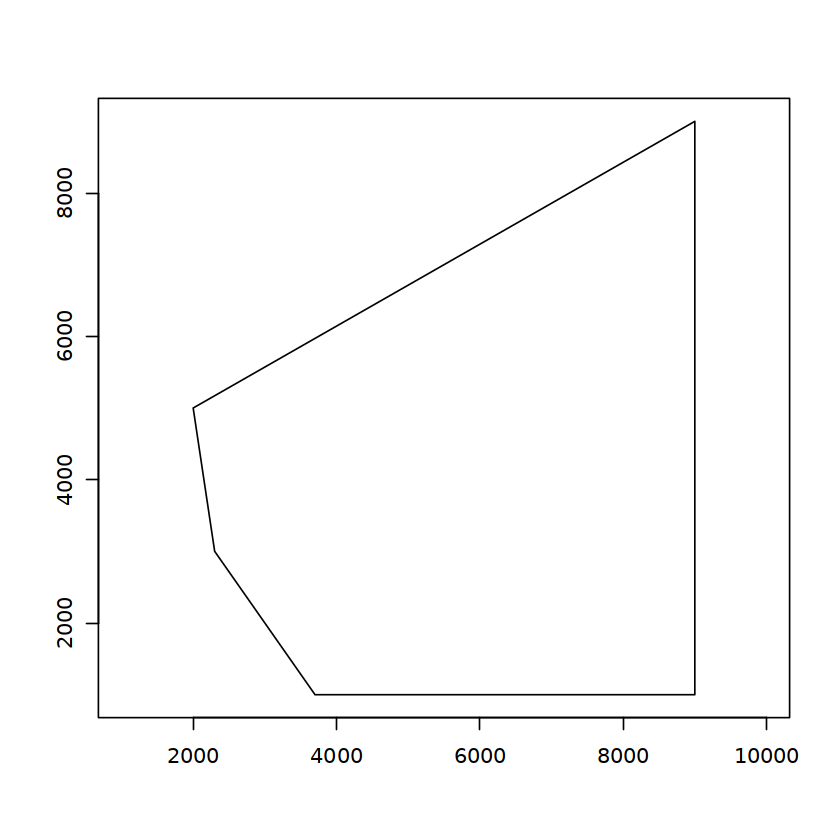

In [82]:
# check convex hull polygon for 2nd one
c_hull <- 
      st_as_sf(xy_pts[[2]], coords = c("x", "y")) %>% 
      st_combine() %>% st_convex_hull()
c_hull %>% plot(axes = TRUE)


In [87]:
# using subset 
samples_seq <- seq(2)
start_t <- Sys.time()
objs <-
  lapply(samples_seq, function(i) {
    Crop_custom(object = obj.xen_list[[i]], 
                col_id = c("cell"),
                xy_pts = xy_pts[[i]],
                c_hull_include = TRUE,
                crop_molecules = TRUE,
                BPPARAM = BiocParallel::MulticoreParam(5, tasks = 10L,
                                                       force.GC = FALSE,
                                                       progressbar = TRUE))
      
  })
end_t <- Sys.time()
end_t - start_t
objs

>>> Using `Seurat` object

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”
>>> Return output - `Seurat` object

>>> Cropping molecule coordinates - might take time!

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”


  |======================================================================| 100%



Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version

>>> Using `Seurat` object

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”
>>> Return output - `Seurat` object

>>> Cropping molecule coordinates - might take time!

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”


  |======================================================================| 100%



Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version



Time difference of 42.9708 mins

[[1]]
An object of class Seurat 
534 features across 83197 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb263.Xenium

[[2]]
An object of class Seurat 
534 features across 125057 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb266.Xenium


<span style="font-size:10pt; color:gold"> additional crop for MB295 selected "good" region </span> <br />

Warning message in brewer.pal(n = length(x = levels(x = molecules$molecule)), name = "Set1"):
“minimal value for n is 3, returning requested palette with 3 different levels
”


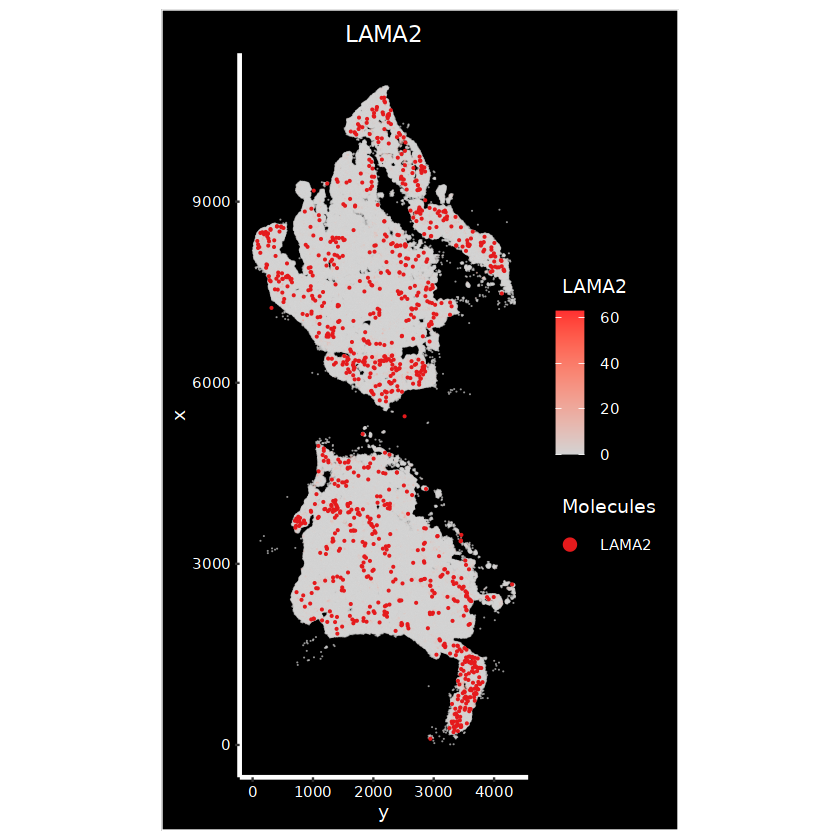

In [16]:
i <- 2
ImageFeaturePlot(obj.xen_list[[3]],
                 fov = Images(obj.xen_list[[3]])[1],
                 features = "LAMA2",
                 molecules = "LAMA2",
                 #mols.cols = "cyan1",
                 #mols.size = 0.5,
                 #nmols = 1000,
                 #min.cutoff = 1.5,        
                 size = 0.3,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 #scale = "none",    
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE)

In [9]:
# additional crop for MB295 selected "good" region
xy_pts <- 
    list("mb295_1" = 
         data.frame("x" = c(5200, 5500, 6500, 8000, 9000, 10000, 10100, 9000, 5800),
                    "y" = c(2200, 3500, 4000, 3000, 2200, 1700, 1700, 0, 5)), 
         "mb295_2" = 
         data.frame("x" = c(1300, 2000, 2800, 5500, 5500, 5),
                    "y" = c(3000, 3600, 5000, 2500, 5, 5))
        )

In [12]:
# using subset 
start_t <- Sys.time()
obj_295 <-
    Crop_custom(object = obj.xen_list[[3]], 
                col_id = c("cell"),
                xy_pts = xy_pts,
                c_hull_include = TRUE,
                crop_molecules = TRUE,
                BPPARAM = BiocParallel::MulticoreParam(8, tasks = 10L,
                                                       force.GC = FALSE,
                                                       progressbar = TRUE))
end_t <- Sys.time()
end_t - start_t
obj_295

>>> Using `Seurat` object

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”
>>> Return output - `Seurat` object

>>> Cropping molecule coordinates - might take time!



  |======================================================================| 100%



Time difference of 17.2294 mins

An object of class Seurat 
534 features across 181946 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb295.Xenium

Warning message in brewer.pal(n = length(x = levels(x = molecules$molecule)), name = "Set1"):
“minimal value for n is 3, returning requested palette with 3 different levels
”


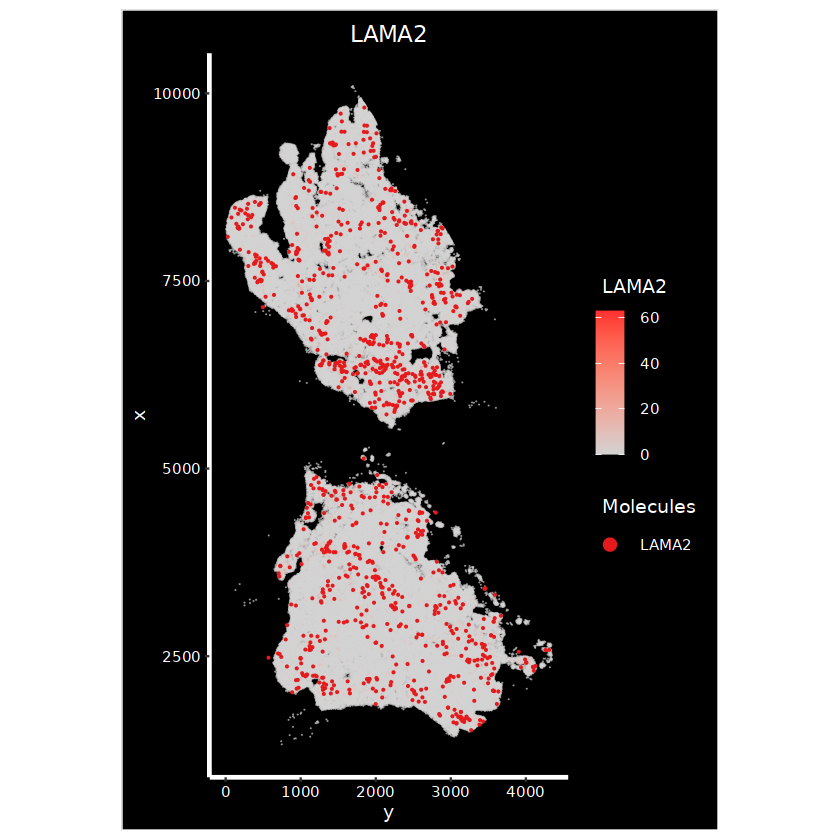

In [13]:
ImageFeaturePlot(obj_295,
                 fov = Images(obj_295)[1],
                 features = "LAMA2",
                 molecules = "LAMA2",
                 #mols.cols = "cyan1",
                 #mols.size = 0.5,
                 #nmols = 1000,
                 #min.cutoff = 1.5,        
                 size = 0.3,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 #scale = "none",    
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE)

In [68]:
# test cropping function on df as an input!
object <- obj.xen_list[[2]]
fov <- object[[Images(object)[1]]]
df_test <- fov[["molecule"]] %>% GetTissueCoordinates()
df_test %>% str

'data.frame':	40634263 obs. of  3 variables:
 $ x       : num  381 495 421 424 459 ...
 $ y       : num  1885 1943 2488 2488 2457 ...
 $ molecule: chr  "ABCC9" "ABCC9" "ABCC9" "ABCC9" ...


In [69]:
set.seed(0077)
df_test %<>% sample_frac(size = 0.001)
df_test %>% str

'data.frame':	40634 obs. of  3 variables:
 $ x       : num  4328 5557 4761 1589 5770 ...
 $ y       : num  4327 4700 1972 3810 5555 ...
 $ molecule: chr  "GPNMB" "MS4A6A" "SOX9" "NNAT" ...


In [75]:
# crop df with xy and any char var
i <- 2
df_out <- 
Crop_custom(x = df_test,
                col_id = c("molecule"),
                xy_pts = xy_pts[[i]],
                c_hull_include = TRUE,
                crop_molecules = TRUE,
                BPPARAM = BiocParallel::MulticoreParam(8, tasks = 10L,
                                                       force.GC = FALSE,
                                                       progressbar = TRUE))

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”
>>> Return output: `data.frame`



In [76]:
df_out %>% str

'data.frame':	40629 obs. of  3 variables:
 $ x       : num  4328 5557 4761 1589 5770 ...
 $ y       : num  4327 4700 1972 3810 5555 ...
 $ molecule: chr  "GPNMB" "MS4A6A" "SOX9" "NNAT" ...


In [77]:
sf_df_mols <- st_as_sf(df_out, coords = c("x", "y"))
sf_df_mols %>% str

Classes ‘sf’ and 'data.frame':	40629 obs. of  2 variables:
 $ molecule: chr  "GPNMB" "MS4A6A" "SOX9" "NNAT" ...
 $ geometry:sfc_POINT of length 40629; first list element:  'XY' num  4328 4327
 - attr(*, "sf_column")= chr "geometry"
 - attr(*, "agr")= Factor w/ 3 levels "constant","aggregate",..: NA
  ..- attr(*, "names")= chr "molecule"


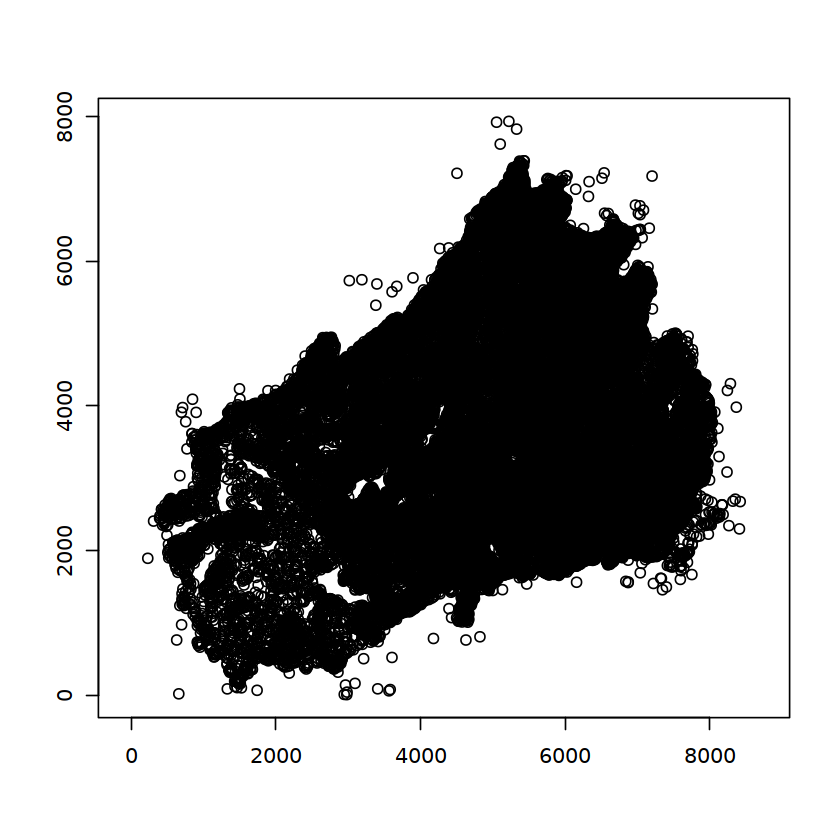

In [79]:
# plot
sf_df_mols %>% st_geometry %>% plot(axes = TRUE)

In [14]:
# replace objs in obj.xen_list
# this adds the first 2 cropped objs
if (FALSE) { obj.xen_list[1:2] <- objs }
# add 3rd sample
obj.xen_list[[3]] <- obj_295

In [15]:
# plot all samples - single gene
pl_all <- 
lapply(seq(obj.xen_list), function(i) {
    ImageFeaturePlot(obj.xen_list[[i]],
                 fov = Images(obj.xen_list[[i]]),
                 features = "nCount_Xenium", #"LAMA2",
                 #molecules = "LAMA2",
                 #mols.cols = "cyan1",
                 #mols.size = 0.5,
                 #nmols = 1000,
                 #min.cutoff = 1.5,        
                 size = 0.3,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 #scale = "none",    
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE) & ggtitle(Images(obj.xen_list[[i]]))
    })

In [16]:
# order plotting var (eg, gene expression) in an increasing order
pl_all <- 
    lapply(pl_all, function(i) {
    i$data %<>% arrange(nCount_Xenium)
    i <- i & scale_fill_gradientn(colours = c("gray10", cet_pal(5, name = "fire")[-1]))   
    return(i)
    })

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


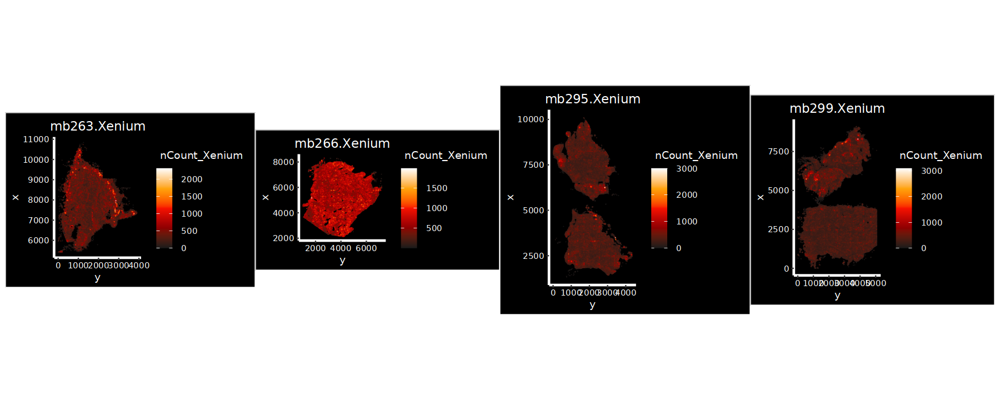

In [17]:
options(repr.plot.height = 6, repr.plot.width = 15)
patchwork::wrap_plots(pl_all, nrow = 1)

In [21]:
lapply(pl_all, function(i) {
    i$data %>% 
    #filter(nCount_Xenium < 2000) %>% 
    pull(nCount_Xenium) %>% mean
})


[[1]]
[1] 161.272

[[2]]
[1] 283.701

[[3]]
[1] 158.911

[[4]]
[1] 142.151

In [30]:
# save clean Xenium list objects
dir_path <- "./segmentation_based/objects/"
saveRDS(object = obj.xen_list, file = file.path(dir_path, "xen_mben_list_clean.rds"))

##### <span style="font-size:11pt; color:gold"> Load MBEN *Xenium* list objs - cropped </span> <br />

In [323]:
# load list clean object Xenium data
dir_path <- "./segmentation_based/objects/"
obj.xen_list <-
    readRDS(file = file.path(dir_path, "xen_mben_list_clean.rds"))
obj.xen_list

[[1]]
An object of class Seurat 
534 features across 83197 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb263.Xenium

[[2]]
An object of class Seurat 
534 features across 125057 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb266.Xenium

[[3]]
An object of class Seurat 
534 features across 181946 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: mb295.Xenium

[[4]]
An object of class Seurat 
534 features across 262183 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatia

##### <span style="font-size:10pt; color:gold"> Merge Xenium list objs into single object </span> <br />

In [10]:
# Vz, Resolve, 10Xsn
obj %>% getMeta %>% str

'data.frame':	295918 obs. of  21 variables:
 $ orig.ident             : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                      : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume            : num  632 556 281 887 471 ...
 $ fov                    : logi  NA NA NA NA NA NA ...
 $ samples                : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech           : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method    : chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id                : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region                 : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num               : num  NA NA NA NA NA NA NA NA NA NA ...
 $ nCount_VizResSc        : num  17 2 1 137 33 63 2 31 60 4 ...
 $ 

In [45]:
# clean up existing metadata
obj@meta.data %<>%
    select(!contains(c("SCT_snn","nFeature",
                       "nCount","cell_a", "cell_v")))

In [46]:
obj %>% getMeta %>% str

'data.frame':	295918 obs. of  11 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...


In [37]:
# update metadata of Xenium objects
for (i in seq(obj.xen_list)) {
    obj.xen_list[[i]]@meta.data %<>% 
    #getMeta() %>%
    mutate(orig.ident = Images(obj.xen_list[[i]]),
           samples = orig.ident,
           donors = samples,
           spatial_tech = "Xenium",
           segmentation_method = "XeniumRanger",
           cell_id = Cells(obj.xen_list[[i]]))
    }

In [38]:
obj.xen_list[[1]] %>% getMeta() %>% str

'data.frame':	83197 obs. of  14 variables:
 $ orig.ident              : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ nCount_Xenium           : num  24 116 220 428 184 70 22 325 40 144 ...
 $ nFeature_Xenium         : int  21 64 84 92 72 44 19 97 33 58 ...
 $ nCount_BlankCodeword    : num  0 0 1 2 0 0 0 1 0 2 ...
 $ nFeature_BlankCodeword  : int  0 0 1 2 0 0 0 1 0 2 ...
 $ nCount_ControlCodeword  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ nFeature_ControlCodeword: int  0 0 0 0 0 0 0 0 0 0 ...
 $ nCount_ControlProbe     : num  0 0 0 0 0 1 0 0 0 1 ...
 $ nFeature_ControlProbe   : int  0 0 0 0 0 1 0 0 0 1 ...
 $ samples                 : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ donors                  : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ spatial_tech            : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ segmentation_method     : chr  "XeniumRanger" "XeniumRanger" "XeniumRanger" "XeniumRanger" ...
 

In [39]:
# intersect target genes per sample/obj
genes.in.all <-
# intersect target genes
lapply(obj.xen_list %>% seq, function(i) 
    rownames(obj.xen_list[[i]])) %>%
    # only unique genes
    purrr::reduce(., intersect)
    message("Matched genes from all samples: ", genes.in.all %>% length())
genes.in.all %>% str

Matched genes from all samples: 345



 chr [1:345] "ABCC9" "ADAMTS12" "ADAMTS16" "ADAMTS3" "ADRA1A" "ADRA1B" ...


In [40]:
# merge objects
obj.xen <- merge(x = obj.xen_list[[1]],
                 y = obj.xen_list[-1])

Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [41]:
obj.xen
obj.xen %>% getMeta %>% str

An object of class Seurat 
534 features across 652383 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	652383 obs. of  14 variables:
 $ orig.ident              : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ nCount_Xenium           : num  24 116 220 428 184 70 22 325 40 144 ...
 $ nFeature_Xenium         : int  21 64 84 92 72 44 19 97 33 58 ...
 $ nCount_BlankCodeword    : num  0 0 1 2 0 0 0 1 0 2 ...
 $ nFeature_BlankCodeword  : int  0 0 1 2 0 0 0 1 0 2 ...
 $ nCount_ControlCodeword  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ nFeature_ControlCodeword: int  0 0 0 0 0 0 0 0 0 0 ...
 $ nCount_ControlProbe     : num  0 0 0 0 0 1 0 0 0 1 ...
 $ nFeature_ControlProbe   : int  0 0 0 0 0 1 0 0 0 1 ...
 $ samples                 : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ donors                  : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ spatial_tech            : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ segmentation_method     : chr  "XeniumRanger" "XeniumRanger" "XeniumRanger" "XeniumRanger" ...


In [42]:
# save raw merged object
dir_path <- "./segmentation_based/objects/"
saveRDS(object = obj.xen, file = file.path(dir_path, "xen_mben_raw.rds"))

In [ ]:
# merged object with only targeted genes
# for Xenium, remove other bg genes assays
# clean up obj, keep only main assay
obj.xen_list <- 
    lapply(obj.xen_list, function(i)
    DietSeurat(i, assays = "Xenium"))

In [71]:
# merge objects
obj.xen <- merge(x = obj.xen_list[[1]],
                 y = obj.xen_list[-1])

Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [78]:
obj.xen
obj.xen %>% getMeta %>% str

An object of class Seurat 
345 features across 652383 samples within 1 assay 
Active assay: Xenium (345 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	652383 obs. of  14 variables:
 $ orig.ident              : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ nCount_Xenium           : num  24 116 220 428 184 70 22 325 40 144 ...
 $ nFeature_Xenium         : int  21 64 84 92 72 44 19 97 33 58 ...
 $ nCount_BlankCodeword    : num  0 0 1 2 0 0 0 1 0 2 ...
 $ nFeature_BlankCodeword  : int  0 0 1 2 0 0 0 1 0 2 ...
 $ nCount_ControlCodeword  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ nFeature_ControlCodeword: int  0 0 0 0 0 0 0 0 0 0 ...
 $ nCount_ControlProbe     : num  0 0 0 0 0 1 0 0 0 1 ...
 $ nFeature_ControlProbe   : int  0 0 0 0 0 1 0 0 0 1 ...
 $ samples                 : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ donors                  : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ spatial_tech            : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ segmentation_method     : chr  "XeniumRanger" "XeniumRanger" "XeniumRanger" "XeniumRanger" ...


In [79]:
# remove cells with 0 counts
if (any(obj.xen$nCount_Xenium  == 0)) {
    message("Removing cells with 0 transcript counts")
    obj.xen %<>% subset(subset = nCount_Xenium > 0)
}
obj.xen

Removing cells with 0 transcript counts



An object of class Seurat 
345 features across 652376 samples within 1 assay 
Active assay: Xenium (345 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [80]:
# save merged object
dir_path <- "./segmentation_based/objects/"
saveRDS(object = obj.xen, file = file.path(dir_path, "xen_mben.rds"))

##### <span style="font-size:10pt; color:gold"> Merge Xenium obj(s) with already existing multitech object </span> <br />

In [90]:
obj.xen <- readRDS(file.path(dir_path, "xen_mben.rds"))
obj.xen 
obj.xen %>% getMeta %>% str

An object of class Seurat 
345 features across 652376 samples within 1 assay 
Active assay: Xenium (345 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	652376 obs. of  14 variables:
 $ orig.ident              : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ nCount_Xenium           : num  24 116 220 428 184 70 22 325 40 144 ...
 $ nFeature_Xenium         : int  21 64 84 92 72 44 19 97 33 58 ...
 $ nCount_BlankCodeword    : num  0 0 1 2 0 0 0 1 0 2 ...
 $ nFeature_BlankCodeword  : int  0 0 1 2 0 0 0 1 0 2 ...
 $ nCount_ControlCodeword  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ nFeature_ControlCodeword: int  0 0 0 0 0 0 0 0 0 0 ...
 $ nCount_ControlProbe     : num  0 0 0 0 0 1 0 0 0 1 ...
 $ nFeature_ControlProbe   : int  0 0 0 0 0 1 0 0 0 1 ...
 $ samples                 : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ donors                  : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ spatial_tech            : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ segmentation_method     : chr  "XeniumRanger" "XeniumRanger" "XeniumRanger" "XeniumRanger" ...


In [102]:
#..with only matching genes!
g.matched <- intersect(rownames(obj), rownames(obj.xen))
setdiff(rownames(obj), rownames(obj.xen))
g.matched %>% str

[1] "GYPA"

 chr [1:96] "CD4" "TLL1" "EPHA8" "CD69" "CCR7" "CD44" "EGFR" "KHDRBS2" ...


In [107]:
# clean up multitech object
DefaultAssay(obj) <- "VizResSc"
obj %<>% DietSeurat(assays = "VizResSc")
obj

An object of class Seurat 
97 features across 295918 samples within 1 assay 
Active assay: VizResSc (97 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

In [108]:
# keep only matched genes
obj %<>% subset_opt(features = g.matched)
obj

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data 

An object of class Seurat 
96 features across 295918 samples within 1 assay 
Active assay: VizResSc (96 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

In [109]:
# keep only matched genes
obj.xen %<>% subset_opt(features = g.matched)
obj.xen

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Subsetting FOVs..

Updating object..

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version

Object is ready!



An object of class Seurat 
96 features across 652376 samples within 1 assay 
Active assay: Xenium (96 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [110]:
# merge objects
obj.vzre.xen.sc <- merge(x = RenameAssays(obj, VizResSc = "MultiTech"), 
                         y = RenameAssays(obj.xen, Xenium = "MultiTech"))
obj.vzre.xen.sc

Renaming default assay from VizResSc to MultiTech

Warning message:
“Cannot add objects with duplicate keys (offending key: vizressc_) setting key to original value 'multitech_'”
Renaming default assay from Xenium to MultiTech

Warning message:
“Cannot add objects with duplicate keys (offending key: xenium_) setting key to original value 'multitech_'”


An object of class Seurat 
96 features across 948294 samples within 1 assay 
Active assay: MultiTech (96 features, 0 variable features)
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [111]:
obj.vzre.xen.sc_cloned <- obj.vzre.xen.sc

In [112]:
obj.vzre.xen.sc %>%
    getMeta() %>% str

'data.frame':	948294 obs. of  23 variables:
 $ orig.ident              : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                       : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                     : logi  NA NA NA NA NA NA ...
 $ samples                 : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech            : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method     : chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id                 : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region                  : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num                : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc             : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors                  : chr  "mb295.Vizgen

In [ ]:
# update metadata - final object 
# base R style
if (FALSE) {
    getMeta(obj.vzre.xen.sc)[,grep(c("Codeword|Probe|Viz|Xenium"), 
                               colnames(getMeta(obj.vzre.xen.sc)), 
                               invert = TRUE, 
                               value = TRUE), drop = FALSE] %>% str
    }

meta.df <- 
    obj.vzre.xen.sc %>%
    getMeta() %>%
    select(!contains(c("Codeword","Probe","Viz","Xenium"))) %>%
    mutate(cell_id = Cells(obj.vzre.xen.sc)) %>%
    # replace "Resolve" with "MC" Molecular Cartography
    mutate_if(is.character,
              ~ stringr::str_replace(., "Resolve", "MC"))
obj.vzre.xen.sc@meta.data <- meta.df

In [223]:
obj.vzre.xen.sc %>%
    getMeta() %>% str

'data.frame':	948294 obs. of  13 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100013" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizg

In [224]:
obj <- obj.vzre.xen.sc
rm(obj.vzre.xen.sc)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,79353882,4238.0,207550294,11084.4,207550294,11084.4
Vcells,1228357593,9371.7,2726427575,20801.0,2726424561,20801.0


In [225]:
# Sanity
# check for genes
gene.index <- c((GetAssayData(obj) %>% rowSums) == 0)
if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj %<>% subset_opt(features = rownames(obj)[-n.genes])
    } else { message("Sanity passed:", "\n",
                     ">>> A single gene is expressed in least 1 cell", "\n", 
                     ">>> No genes have 0 expression in all cells") }

# check for cells
cell.index <- c((GetAssayData(obj) %>% colSums) == 0)
if (cell.index %>% any) {
    message("Removing cell with 0 transcript counts")
    obj %<>% subset_opt(cells = -which(cell.index))
} else { message("Sanity passed:", "\n", 
                 ">>> All transcript counts > 0") }

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Removing cell with 0 transcript counts

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay

In [228]:
obj

An object of class Seurat 
96 features across 948244 samples within 1 assay 
Active assay: MultiTech (96 features, 0 variable features)
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [229]:
# save merged object
saveRDS(object = obj, file = file.path(dir_path, "vz.re.sc.xen_matched.rds"))

##### <span style="font-size:10pt; color:gold"> Make obj and keep matched genes + background genes </span>

In [6]:
# load previous obj with bg genes
if (!exists("obj.bg")) {
    obj.bg <- 
    readRDS(file = file.path(dir_path, "vz.re_matched_bg.rds"))
    }

In [333]:
obj.bg
obj.bg %>% getMeta %>% str

An object of class Seurat 
164 features across 278473 samples within 1 assay 
Active assay: VizRes (164 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

'data.frame':	278473 obs. of  12 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ nCount_VizRes      : num  17 2 1 140 34 64 2 32 60 4 ...
 $ nFeature_VizRes    : int  10 2 1 29 20 24 2 19 31 4 ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume        : num  632 556 281 887 471 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num        

In [394]:
# load list object Xenium data
obj.xen_raw <-
    readRDS(file = file.path(dir_path, "xen_mben_raw.rds"))
obj.xen_raw

An object of class Seurat 
534 features across 652383 samples within 4 assays 
Active assay: Xenium (345 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [395]:
obj.xen_raw %>% getMeta %>% str

'data.frame':	652383 obs. of  14 variables:
 $ orig.ident              : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ nCount_Xenium           : num  24 116 220 428 184 70 22 325 40 144 ...
 $ nFeature_Xenium         : int  21 64 84 92 72 44 19 97 33 58 ...
 $ nCount_BlankCodeword    : num  0 0 1 2 0 0 0 1 0 2 ...
 $ nFeature_BlankCodeword  : int  0 0 1 2 0 0 0 1 0 2 ...
 $ nCount_ControlCodeword  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ nFeature_ControlCodeword: int  0 0 0 0 0 0 0 0 0 0 ...
 $ nCount_ControlProbe     : num  0 0 0 0 0 1 0 0 0 1 ...
 $ nFeature_ControlProbe   : int  0 0 0 0 0 1 0 0 0 1 ...
 $ samples                 : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ donors                  : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ spatial_tech            : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ segmentation_method     : chr  "XeniumRanger" "XeniumRanger" "XeniumRanger" "XeniumRanger" ...


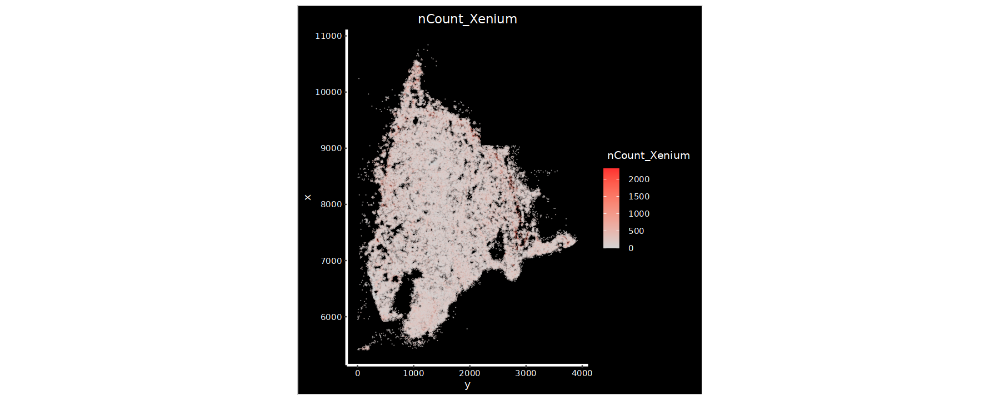

In [401]:
options(repr.plot.height = 6, repr.plot.width = 15)
ImageFeaturePlot(obj.xen_raw,
                 fov = Images(obj.xen_raw)[1],
                 features =  "nCount_Xenium", #"LAMA2",
                 #molecules = "LAMA2",
                 #mols.cols = "cyan1",
                 #mols.size = 0.5,
                 nmols = 1000,
                 #min.cutoff = 1.5,        
                 size = 0.3,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 #scale = "none",    
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE)

In [ ]:
# background genes matrices
cprobe_mat <-
GetAssayData(obj.xen_raw, 
             slot = "counts",
             assay = "ControlProbe")
blank_mat <-
GetAssayData(obj.xen_raw, 
             slot = "counts", 
             assay = "BlankCodeword")

In [413]:
bg_mat <- rbind(cprobe_mat, blank_mat)
bg_mat %>% str

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:141480] 24 24 118 9 118 12 24 118 124 118 ...
  ..@ p       : int [1:652384] 0 0 0 1 3 3 4 4 5 5 ...
  ..@ Dim     : int [1:2] 148 652383
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:148] "NegControlProbe-00042" "NegControlProbe-00041" "NegControlProbe-00039" "NegControlProbe-00035" ...
  .. ..$ : chr [1:652383] "aaliahnk-1_1" "aaljlebm-1_1" "aaljmpio-1_1" "aalkeggh-1_1" ...
  ..@ x       : num [1:141480] 1 1 1 1 1 1 1 1 1 1 ...
  ..@ factors : list()


In [414]:
# matched target and background genes between spatial techs!
# Xenium -> Negative control probes & UnassignedCodeword are background genes (false positive signal) in a specific assay
target.genes <- 
    grep("FP |Blank-", rownames(obj.bg), invert = TRUE, value = TRUE) %>%
    intersect(., rownames(obj.xen_raw))
bg.genes <- 
    c(grep("FP |Blank-", rownames(obj.bg), value = TRUE),
      grep("NegControlProbe|UnassignedCodeword", rownames(bg_mat), value = TRUE))
g.matched.bg <- c(target.genes, bg.genes)
g.matched.bg %>% str

 chr [1:311] "CD4" "TLL1" "EPHA8" "CD69" "CCR7" "CD44" "EGFR" "KHDRBS2" ...


In [434]:
# make Xenium single count matrix with matched target genes and background genes
target_mat <- 
GetAssayData(obj.xen_raw, 
             slot = "counts",
             assay = "Xenium")
combined_mat <- 
rbind(target_mat, bg_mat)
combined_mat %>% str
# subset to matched target genes and background genes
combined_mat <-
combined_mat[rownames(combined_mat) %in% g.matched.bg,]
combined_mat %>% str

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:42197840] 22 37 62 93 95 105 145 161 204 206 ...
  ..@ p       : int [1:652384] 0 21 85 170 264 336 381 400 498 531 ...
  ..@ Dim     : int [1:2] 493 652383
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:493] "ABCC9" "ADAMTS12" "ADAMTS16" "ADAMTS3" ...
  .. ..$ : chr [1:652383] "aaliahnk-1_1" "aaljlebm-1_1" "aaljmpio-1_1" "aalkeggh-1_1" ...
  ..@ x       : num [1:42197840] 1 2 1 2 1 1 1 1 1 1 ...
  ..@ factors : list()
Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:15020114] 4 6 26 27 66 68 71 75 85 87 ...
  ..@ p       : int [1:652384] 0 10 27 53 79 94 104 115 146 153 ...
  ..@ Dim     : int [1:2] 244 652383
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:244] "AIF1" "AQP4" "ASTN1" "BMPR1B" ...
  .. ..$ : chr [1:652383] "aaliahnk-1_1" "aaljlebm-1_1" "aaljmpio-1_1" "aalkeggh-1_1" ...
  ..@ x       : num [1:15020114] 1 2 2 1 1 1 1 1 1 1 ...
  ..@ factors : list()


In [438]:
# make a new obj with matched target genes and background genes
obj.bg_new <- CreateSeuratObject(counts = combined_mat, 
                                    assay = "Xenium")
obj.bg_new@meta.data <-
    obj.xen_raw %>% getMeta %>%
    select(!contains(c("Codeword","Probe","Viz","Xenium"))) %>%
    mutate(cell_id = Cells(obj.xen_raw))
obj.bg_new

An object of class Seurat 
244 features across 652383 samples within 1 assay 
Active assay: Xenium (244 features, 0 variable features)

In [463]:
# match cell ids and add FOVs to new obj -> obj.bg
for (i in Images(obj.xen_raw) %>% seq) {
    obj.bg_new[[Images(obj.xen_raw)[i]]] <- 
        obj.xen_raw[[Images(obj.xen_raw)[i]]]    
}

Warning message:
“Cannot add objects with duplicate keys (offending key: Xenium_), setting key to 'mb266.xenium_'”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mb266.xenium_ to mb266xenium_”
Warning message:
“Cannot add objects with duplicate keys (offending key: Xenium_), setting key to 'mb295.xenium_'”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mb295.xenium_ to mb295xenium_”
Warning message:
“Cannot add objects with duplicate keys (offending key: Xenium_), setting key to 'mb299.xenium_'”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mb299.xenium_ to mb299xenium_”


In [464]:
obj.bg_new

An object of class Seurat 
244 features across 652383 samples within 1 assay 
Active assay: Xenium (244 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [485]:
obj.bg_new[[Images(obj.bg_new)[1]]] 

Spatial coordinates for 83197 cells and 541 molecules
 First 10 molecules: ABCC9, ADAMTS12, ADAMTS16, ADAMTS3, ADRA1A, ADRA1B
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Xenium 
Key: Xenium_ 

In [ ]:
# subset obj or FOV of the xenium raw object -> obj.xen_raw
obj.bg_new_sub <- subset_opt(obj.bg_new, features = rownames(obj.bg_new)                   

In [476]:
obj.bg_new_sub

An object of class Seurat 
244 features across 652383 samples within 1 assay 
Active assay: Xenium (244 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [483]:
obj.bg_new_sub[[Images(obj.bg_new_sub)[1]]] # only 96 genes

Spatial coordinates for 83197 cells and 96 molecules
 First 10 molecules: AIF1, AQP4, ASTN1, BMPR1B, BOC, CA10
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Xenium 
Key: Xenium_ 

In [467]:
# plot all samples - single gene
pl_all <- 
lapply(seq(Images(obj.bg_new)), function(i) {
    ImageFeaturePlot(obj.bg_new,
                 fov = Images(obj.bg_new)[i],
                 features = "LAMA2",
                 molecules = "LAMA2",
                 mols.cols = "cyan1",
                 #mols.size = 0.5,
                 #nmols = 1000,
                 #min.cutoff = 1.5,        
                 size = 0.3,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 #scale = "none",    
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE) & ggtitle(Images(obj.bg_new)[i])
    })

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


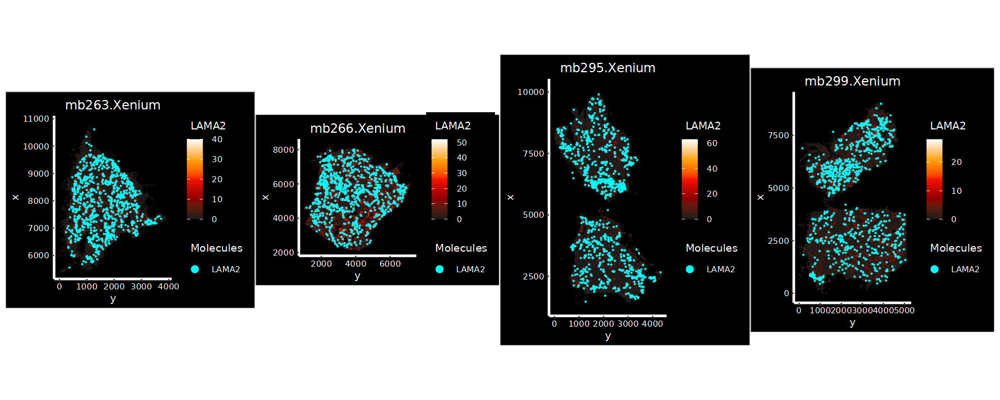

In [468]:
# order plotting var (eg, gene expression) in an increasing order
pl_all <- 
    lapply(pl_all, function(i) {
    i$data %<>% arrange(LAMA2)
    i <- i & scale_fill_gradientn(colours = c("gray10", cet_pal(5, name = "fire")[-1]))   
    return(i)
    })
options(repr.plot.height = 6, repr.plot.width = 15)
patchwork::wrap_plots(pl_all, nrow = 1)

In [441]:
# subset object of Vizgen and Resolve
obj.bg %<>% subset_opt(features = c(target.genes, 
                                        grep("FP |Blank-", rownames(obj.bg), value = TRUE)))

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data 

In [442]:
obj.bg
obj.bg %>% getMeta %>% str

An object of class Seurat 
163 features across 278473 samples within 1 assay 
Active assay: VizRes (163 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

'data.frame':	278473 obs. of  12 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ nCount_VizRes      : num  17 2 1 140 34 64 2 32 60 4 ...
 $ nFeature_VizRes    : int  10 2 1 29 20 24 2 19 31 4 ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume        : num  632 556 281 887 471 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num        

In [487]:
obj.bg[[Images(obj.bg)[3]]]

Spatial coordinates for 32106 cells and 122 molecules
 First 10 molecules: CD4, TLL1, EPHA8, CD69, CCR7, CD44
Default segmentation boundary: segmentation 
 1 other segmentation boundaries present: centroids 
Associated assay: Resolve 
Key: Resolve_ 

In [488]:
# clone in case needed later
#obj.bg_cloned <- obj.bg

In [490]:
# merge
obj.bg_merged <- merge(x = RenameAssays(obj.bg, VizRes = "MultiTech"), 
                       y = RenameAssays(obj.bg_new, Xenium = "MultiTech"))

Renaming default assay from VizRes to MultiTech

Warning message:
“Cannot add objects with duplicate keys (offending key: vizres_) setting key to original value 'multitech_'”
Renaming default assay from Xenium to MultiTech

Warning message:
“Cannot add objects with duplicate keys (offending key: xenium_) setting key to original value 'multitech_'”


In [491]:
obj.bg_merged

An object of class Seurat 
311 features across 930856 samples within 1 assay 
Active assay: MultiTech (311 features, 0 variable features)
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [494]:
# update metadata
obj.bg_merged@meta.data %<>%
    select(!contains(c("_Xenium","_VizRes",
                       "_SCT","cell_", "Codeword", "Probe"))) %>%
    mutate(cell_id = Cells(obj.bg_merged),
           donors = samples) %>%
    mutate_if(is.character,
              ~ stringr::str_replace(., "Resolve", "MC"))

In [495]:
obj.bg_merged %>% getMeta() %>% str

'data.frame':	930856 obs. of  12 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ nCount_MultiTech   : num  17 2 1 140 34 64 2 32 60 4 ...
 $ nFeature_MultiTech : int  10 2 1 29 20 24 2 19 31 4 ...
 $ donors             : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ cell_id            : chr  "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.r

In [496]:
# cloned obj if needed
obj.bg_merged_cloned <- obj.bg_merged

In [497]:
# Sanity
obj.bg_merged %<>% sanity.seurat()

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Removing cell with 0 transcript counts

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay

In [498]:
obj.bg_merged

An object of class Seurat 
311 features across 930800 samples within 1 assay 
Active assay: MultiTech (311 features, 0 variable features)
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [504]:
obj.bg_merged[[Images(obj.bg_merged)[9]]]
obj.bg_merged[[Images(obj.bg_merged)[11]]]

Spatial coordinates for 125056 cells and 541 molecules
 First 10 molecules: ABCC9, ADAMTS12, ADAMTS16, ADAMTS3, ADRA1A, ADRA1B
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Xenium 
Key: mb266xenium_ 

Spatial coordinates for 262162 cells and 541 molecules
 First 10 molecules: ABCC9, ADAMTS12, ADAMTS16, ADAMTS3, ADRA1A, ADRA1B
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Xenium 
Key: mb299xenium_ 

In [507]:
obj.bg_merged %>% getMeta() %>% str

'data.frame':	930800 obs. of  12 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ nCount_MultiTech   : num  17 2 1 140 34 64 2 32 60 4 ...
 $ nFeature_MultiTech : int  10 2 1 29 20 24 2 19 31 4 ...
 $ donors             : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ cell_id            : chr  "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.r

In [508]:
# save object pre-filtered object (all genes + bg)
saveRDS(object = obj.bg_merged,
        file = file.path(dir_path, "vz.re.xen_matched_bg.rds"))

In [ ]:
# optional only!
if (!any(Assays(obj.bg_merged) == "SCT")) {
  message(">>> running `SCTransform`")
  start.time <- Sys.time()
  # fast analysis
  obj.bg_merged %<>% 
    SCTransform(assay = Assays(obj.bg_merged), 
                #clip.range = c(-10, 10),
                verbose = FALSE)
  end.time <- Sys.time()
  end.time - start.time
} else { 
  message("SCT assay is already present")
}
obj.bg_merged

In [ ]:
# save object pre-filtered object (all genes + bg) - with SCT assay
saveRDS(object = obj.bg_merged,
        file = file.path(dir_path, "vz.re.xen_matched_bg_SCT.rds"))

#### <span style="font-size:12pt; color:gold"> Load merged pre-filtered object(s) (ie, only with `nCount > 0`) - with Xenium </span>
<span style="font-size:10pt; color:tomato">***MB295, 266*** samples (2nd run).. Vizgen </span> <br />
<span style="font-size:10pt; color:tomato">***MB299, 295, 266, 263*** samples..Resolve & 10X scRNAseq & Xenium </span> <br />

In [6]:
obj <- readRDS(file.path(dir_path, "vz.re.sc.xen_matched.rds"))

In [7]:
obj
obj %>% getMeta %>% str

An object of class Seurat 
192 features across 948244 samples within 2 assays 
Active assay: SCT (96 features, 96 variable features)
 1 other assay present: MultiTech
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	948244 obs. of  15 variables:
 $ orig.ident         : chr  "mb295.region0.MERFISH" "mb295.region0.MERFISH" "mb295.region0.MERFISH" "mb295.region0.MERFISH" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" ...
 $ spatial_tech       : chr  "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "Vz_mb295.region0.MERFISH_112833000000100009" "Vz_mb295.region0.MERFISH_112833000000100013" "Vz_mb295.region0.MERFISH_112833000000100016" "Vz_mb295.region0.MERFISH_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.M

#### <span style="font-size:11pt; color:gold"> Update metadata and `SCT` Normalize if needed </span>


In [8]:
# simplified sample names
simple.custom <- FALSE # set to TRUE to modify sample names
if (simple.custom) {
    message("Updating some metadata variables")
    # support for multiple - same name - samples
    obj$samples %<>%
        stringi::stri_replace_all_regex(., 
                                        pattern = "region[0-1].|w(.)[^:][0-9].", # merge 295 sample
                                        #pattern = "region[0-1].|w[4,,5,7]a1.",
                                        replacement = "")
    # add donors
    obj$donors <- obj$samples # data comes from the same patient/sample
    }

if (FALSE) {
    # replace tech names
obj@meta.data %<>%
mutate_if(is.character,
              ~ stringr::str_replace_all(., c("Resolve" = "MC", "Vizgen" = "MERFISH")))
}
obj$samples %>% table
obj$samples %>% table %>% str
#obj %>% getMeta %>% str

.
  mb263.10Xsn      mb263.MC  mb263.Xenium   mb266.10Xsn      mb266.MC 
         2937         32106         83174          3015         34625 
mb266.MERFISH  mb266.Xenium   mb295.10Xsn      mb295.MC mb295.MERFISH 
        61514        125056          5966         40816         78402 
 mb295.Xenium   mb299.10Xsn      mb299.MC  mb299.Xenium 
       181935          5575         30962        262161 

 'table' int [1:14(1d)] 2937 32106 83174 3015 34625 61514 125056 5966 40816 78402 ...
 - attr(*, "dimnames")=List of 1
  ..$ .: chr [1:14] "mb263.10Xsn" "mb263.MC" "mb263.Xenium" "mb266.10Xsn" ...


#### <span style="font-size:12pt; color:gold"> Normalize data </span>
<span style="font-size:10pt; color:tomato"> `SCTransform` </span> 

In [11]:
start.time <- Sys.time()
  # fast analysis
  obj %<>% 
    SCTransform(assay = "MultiTech", 
                verbose = FALSE)
  end.time <- Sys.time()
  end.time - start.time
obj

Time difference of 2.03037 mins

An object of class Seurat 
192 features across 948244 samples within 2 assays 
Active assay: SCT (96 features, 96 variable features)
 1 other assay present: MultiTech
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [9]:
# clone obj to keep it in the gloval env
obj_techs <- obj

In [10]:
obj %>% getMeta %>% str

'data.frame':	948244 obs. of  15 variables:
 $ orig.ident         : chr  "mb295.region0.MERFISH" "mb295.region0.MERFISH" "mb295.region0.MERFISH" "mb295.region0.MERFISH" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" ...
 $ spatial_tech       : chr  "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id            : chr  "Vz_mb295.region0.MERFISH_112833000000100009" "Vz_mb295.region0.MERFISH_112833000000100013" "Vz_mb295.region0.MERFISH_112833000000100016" "Vz_mb295.region0.MERFISH_112833000000100020" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.M

In [11]:
if (FALSE) {
# save normalized obj
saveRDS(object = obj, 
        file = file.path(dir_path, "vz.re.sc.xen_matched.rds"))
}

#### <span style="font-size:12pt; color:gold"> QCs </span>
<span style="font-size:10pt; color:tomato"> Sanity checks </span> 

<span style="font-size:11pt; color:tomato"> Sanity check on transcipt counts </span> <br /> 

In [ ]:
# quick check on transcipt counts
GetAssayData(obj, slot = "counts") %>% str
GetAssayData(obj, slot = "counts")@x %>% str
GetAssayData(obj, slot = "counts")@x %>% range # non-zero counts only, should start from 1.

# test count matrix 
mat_temp <- GetAssayData(obj, slot = "counts")[10:15, 1000:1010]

# total transcripts counts per gene across all cells
Matrix::rowSums(mat_temp) %>% cbind
# total cell counts per gene with transcripts counts > 0
Matrix::rowSums(mat_temp > 0) %>% cbind

# total transcripts counts per cell
Matrix::colSums(mat_temp) %>% cbind # nCount_*
# total gene counts (with transcripts counts > 0) per cell
Matrix::colSums(mat_temp > 0) %>% cbind # nFeature_Spatial ie genes per spot

# total counts per gene
Matrix::rowSums(GetAssayData(obj, slot = "counts")) %>% str 
Matrix::rowSums(GetAssayData(obj, slot = "counts")) %>% range # min and max of total counts

# nCount_* ie total transcript counts per cell
Matrix::colSums(GetAssayData(obj, slot = "counts")) %>% str 
Matrix::colSums(GetAssayData(obj, slot = "counts")) %>% range

# get top expressed genes
use.all.genes <- TRUE
if (!use.all.genes) {
    # use first `n` genes
    n.genes <- 10 # eg first 10 genes
} else {
    # use all genes
    n.genes <- rownames(obj) %>% length
}
top.genes <- Matrix::rowSums(GetAssayData(obj, slot = "counts")) %>% 
sort(decreasing = TRUE) %>% head(n = n.genes) %>% names
top.genes %>% head
# re-check
df.expr <- FetchData(obj, vars = top.genes, slot = "counts")
df.expr %>% str
# get total counts `sum()` for all cells
cbind(df.expr %>% names, sapply(df.expr %>% seq, function(i) df.expr[,i] %>% sum))

In [29]:
# Sanity check
nCount <- 
    grep("nCount", getMeta(obj) %>% names, 
         value = TRUE) %>% 
    grep("SCT", ., value = TRUE, invert = TRUE)
  if (any(obj[[nCount]] == 0)) {
      message(">>> filtering object - keeping cells with counts > 0")
    obj %<>% subset(subset = !!base::as.symbol(nCount) > 0)
  } else { message(">>> all counts are > 0") }

message("Checking raw counts per sample..")
meta.var <- "samples"
assay <- Assays(obj) %>% grep("SCT", ., value = TRUE, invert = TRUE)
DefaultAssay(obj) <- assay
slot <- "counts" # raw UMI counts
# examples -> [R sparse matrix](https://www.r-bloggers.com/2020/03/what-is-a-dgcmatrix-object-made-of-sparse-matrix-format-in-r/)
# obj[["RNA"]]@counts@x all matrix elements ate the non-zero values..
source("./scripts/subset_obj_seurat_v2.R")
out <- 
mclapply(seq(names(table(obj[[meta.var]]))), function(i) 
{ (subset_opt(obj, 
              cells = Cells(obj)[which(obj[[meta.var]][,] %in% names(table(obj[[meta.var]]))[i])]) %>% 
   GetAssayData(assay = assay, slot = slot))@x %>% range 
}, mc.cores = 20
        ) %>% suppressMessages
gc() %>% invisible() # collect garbage
#out <- do.call("rbind", out)
#rownames(out) <- names(table(obj[[meta.var]]))
names(out) <- names(table(obj[[meta.var]]))
out # range should start from 1 transcript count
# check if there are any samples with counts < 1 | !==2
out_checks <- c(lapply(seq(out), function(i)
    any(!range(out[[i]]) %% 1 == 0, !min(range(out[[i]])) == 1)) %>% unlist)
# print them
if (any(out_checks == TRUE)) {
    for (i in which(out_checks == TRUE))
    message(paste0(names(out)[i], ", "), 
            "raw counts start from: ", min(out[[i]]))
    stop("raw counts DO NOT start from: 1")
} else { message("all raw counts start from: ", 
                 c(lapply(seq(out), 
                          function(i) min(out[[i]])) %>% unlist %>% unique))
    }            


>>> all counts are > 0

Checking raw counts per sample..



$mb263.10Xsn
[1]  1 60

$mb263.MC
[1]   1 221

$mb263.Xenium
[1]   1 106

$mb266.10Xsn
[1]  1 47

$mb266.MC
[1]   1 178

$mb266.Vizgen
[1]   1 293

$mb266.Xenium
[1]   1 170

$mb295.10Xsn
[1]  1 54

$mb295.MC
[1]   1 247

$mb295.Vizgen
[1]   1 259

$mb295.Xenium
[1]   1 152

$mb299.10Xsn
[1]  1 26

$mb299.MC
[1]   1 177

$mb299.Xenium
[1]   1 150

all raw counts start from: 1



<span style="font-size:12pt; color:tomato"> QCs - *per cell* </span> <br /> 

In [30]:
# if to add proportions/percentage expressed genes per cell
add.percent.genes <- TRUE
if (add.percent.genes) {
  # check mitochondrial, ribosomal, red-blood cell contamination, and background genes contents..
  gene.pattern <- c("^MT-", "^RP[SL]", 
                    "^HB[^(P)]", "^Blank-[0-9]|^FP [0-9]")                       
  col.name <- c("percent_mito", "percent_ribo",
                "percent_hb", "percent_bg")
  if (lapply(gene.pattern %>% seq, function(i) { 
      grep(pattern = gene.pattern[i], 
           x = rownames(obj), value = TRUE) %>% is.empty() }
             ) %>% unlist %>% any) {
      message("No genes are present for:", 
              paste0("\n", ">>> ", col.name))
  } else {
      # add to meta
      for (i in seq(gene.pattern)) {
          obj %<>% 
          PercentageFeatureSet(pattern = gene.pattern[i], 
                               col.name = col.name[i])
      }
      col.name.added <- 
          match.arg(names(getMeta(obj)), col.name, several.ok = TRUE)
      message("Added:", paste0("\n", ">>> ", col.name.added))
  }
    
  # add cell cycle scores ----
  # match genes present in the obj
  if (lapply(cc.genes %>% seq, function (i) 
      is.empty(which(rownames(obj) %in% cc.genes[[i]]))) %>% unlist %>% all) {
    message("Adding cell cycle scores..")
    obj %<>% CellCycleScoring(s.features = cc.genes$s.genes,
                              g2m.features = cc.genes$g2m.genes,
                              set.ident = FALSE)
    obj$cc.difference <- obj$S.Score - obj$G2M.Score  
  } else {
    message("Not enough cell cycle genes are present in the object", " \n",
            "cell cycle scores won't be calculated")
  }
  
  #obj %<>% UpdateSeuratObject()
}
             

No genes are present for:
>>> percent_mito
>>> percent_ribo
>>> percent_hb
>>> percent_bg

Not enough cell cycle genes are present in the object 
cell cycle scores won't be calculated



In [31]:
# add zero to NaN?
# replace for NAs or NaNs in percent_* meta variables - add zeros
meta.vars <- grep("percent_", names(getMeta(obj)), value = TRUE)
if (!is.empty(meta.var)) {
    for (i in meta.vars %>% seq) {
    if (is.nan(obj[[meta.vars[i]]][[1]]) %>% any) {
        message("Adding zeros `0` to all `NaN` or `NA` values to: ", meta.vars[i])
        obj[[meta.vars[i]]][[1]][is.na(obj[[meta.vars[i]]][[1]])] <- 0L # add zero to NaN
    }
    }
}

#### <span style="font-size:12pt; color:tomato"> Set QC variables and plot params.. </span>
<span style="font-size:10pt; color:crimson"> NOTE: always run it! </span> <br /> 

In [68]:
# QC variables and plot params         
message("Setting QC variables and plot params..")
meta.vars <- grep("nCount_|nFeature_|percent_", names(getMeta(obj)), value = TRUE)
message("QC variables are :", paste0("\n", ">>> ", meta.vars))

# if TRUE - using whole obj name, else other metadata var.. 
meta.var.use <- c("orig.ident", "samples", "spatial_tech")
use.orig.ident <- FALSE
if (use.orig.ident) { meta.var <- "orig.ident" } else { meta.var <- "samples" }
#meta.var <- "spatial_tech"
meta.var

# add colors for meta var (ie samples) 
meta.var.col <- colorRampPalette(RColorBrewer::brewer.pal(10, "Paired"))(table(obj[[meta.var]]) %>%
 names %>% length)
meta.var.col %>% glimpse()

# title for meta.var
#paste0(substring(meta.var, 1, 1) %>% toupper, substring(meta.var, 2, nchar(meta.var)))
meta.var.title <- stringr::str_to_title(meta.var)

# custom text sizes for plots
legend.text.size <- 16
base_size <- 18
axis.text.size <- 14
   
# choose plot theme, eg dark or white
use.dark.theme <- FALSE # if FALSE - white bg is used for plots

# choose plot colors scheme..
use.colors.opt <- "fire" # options are: "inferno" or "fire"
# colors/fill scale gradient
if (use.dark.theme && use.colors.opt == "fire") {
    scale.col <- 
        cet_pal(11, name = use.colors.opt)[4:11] %>% .[c(1,3,5,6:8)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "fire") {
    scale.col <-
        cet_pal(11, name = use.colors.opt)[1:9] %>% .[c(1,3,5,6,7,9)] %>% rev
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:9)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:8)] %>% 
        rev %>% c("gray4")
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
}

# transparent theme for white bg
theme_transparent_2 <- theme(panel.background = element_rect(fill = "transparent"),
                             plot.background = element_rect(fill = "transparent", color = NA),
                             panel.grid.major = element_blank(), 
                             panel.grid.minor = element_blank(), 
                             legend.background = element_rect(fill = "transparent"))


Setting QC variables and plot params..

QC variables are :
>>> nCount_MultiTech
>>> nFeature_MultiTech



[1] "samples"

 chr [1:18] "#A6CEE3" "#5EA0CA" "#277EB1" "#75B49B" "#A3D77E" "#5FB64D" ...


Using White Theme & 'fire' color scale



#### <span style="font-size:12pt; color:gold"> Make Seurat obj _10_ target genes only - (adding RNAScope) </span>
<span style="font-size:11pt; color:tomato"> merge..Vizgen, Resolve, 10Xsn, RNAScope </span> <br />

In [ ]:
# load objects
dir_rs <- "./04_RNAscope"
files2load <- 
    list.files(dir_rs,
               recursive = TRUE,
               full.names = TRUE) %>% 
    grep(".rds", ., value = TRUE)
files2load

# load objs
gc() %>% invisible
start.time <- Sys.time()
obj.list <- 
    BiocParallel::bplapply(files2load %>% seq, function(i) { 
        readRDS(file = files2load[i]) }, 
        BPPARAM = BiocParallel::MulticoreParam(5, tasks = 10L, 
                                               force.GC = FALSE, 
                                               progressbar = TRUE))
#obj.list
end.time <- Sys.time()
end.time - start.time
gc() %>% invisible

# update metadata                
obj.names <- 
lapply(obj.list%>% seq, function(i) {
    obj.list[[i]] %>% Images() %>% tolower}
      )
names(obj.list) <- obj.names
obj.list

# add orig.ident
for (i in obj.list %>% names %>% seq) {
    obj.list[[i]]$orig.ident <- names(obj.list)[i]
} 
# check
lapply(obj.list %>% seq, function(i) obj.list[[i]]$orig.ident %>% table)

# merge 
obj.rs <- merge(obj.list[[1]], obj.list[-1])
obj.rs
obj.rs %>% getMeta() %>% str

# rename FOVs 
names(obj.rs@images) <- 
       obj.rs@images %>% 
       names %>% 
       tolower %>%
       paste0(".RNAScope")

# update metadata
obj.rs@meta.data %<>%
       rename(samples = sample_name) %>%
       select(!contains("RNAscope"))
       
# rename assay
obj.rs %<>% RenameAssays(RNAscope = "RNAScope")
obj.rs %<>% UpdateSeuratObject()

In [11]:
obj.rs
obj.rs %>% getMeta() %>% str

An object of class Seurat 
12 features across 145659 samples within 1 assay 
Active assay: RNAScope (12 features, 0 variable features)
 3 spatial fields of view present: mb266.RNAScope mb295.RNAScope mb299.RNAScope

'data.frame':	145659 obs. of  8 variables:
 $ orig.ident       : chr  "mb266" "mb266" "mb266" "mb266" ...
 $ cell_id          : chr  "MB266-cell-1" "MB266-cell-2" "MB266-cell-3" "MB266-cell-4" ...
 $ samples          : chr  "MB266" "MB266" "MB266" "MB266" ...
 $ region           : num  1 1 1 1 1 1 1 1 1 1 ...
 $ z                : num  0 0 0 0 0 0 0 0 0 0 ...
 $ tile_num         : num  0 0 0 0 0 0 0 0 0 0 ...
 $ nCount_RNAScope  : num  5 6 15 29 9 86 8 11 20 23 ...
 $ nFeature_RNAScope: int  4 4 5 9 4 10 4 6 7 6 ...


In [12]:
# Prefiltering ----
gc() %>% invisible()
# Sanity check
if (any(obj.rs$nCount_RNAScope == 0)) {
    message("Removing cell with 0 transcript counts")
    obj.rs %<>% subset(subset = nCount_RNAScope > 0)
} else { message("All transcript counts > 0") }


Removing cell with 0 transcript counts

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”


<span style="font-size:11pt; color:gold"> Get 10 unique RNAScope genes per technology </span> <br />
<span style="font-size:10pt; color:steelblue"> ..matched target </span> <br />

In [13]:
# matched target genes
g.matched <- 
    # same genes between techs
    intersect(rownames(obj), rownames(obj.rs))
g.matched %>% str

 chr [1:10] "CNTN2" "PTCH1" "PBX3" "TRPM3" "DIAPH3" "LAMA2" "NRXN3" "GLI1" ...


In [14]:
# Subset to keep only 10 genes ----
# subset obj and FOVs
# load modified subset function
source("./scripts/subset_obj_seurat_v2.R")
obj %<>% subset_opt(features = g.matched)
obj
obj %>% getMeta() %>% str

obj.rs %<>% subset_opt(features = g.matched)
obj.rs

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data 

An object of class Seurat 
20 features across 295918 samples within 2 assays 
Active assay: SCT (10 features, 10 variable features)
 1 other assay present: VizResSc
 2 dimensional reductions calculated: pca, umap
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve

'data.frame':	295918 obs. of  21 variables:
 $ orig.ident             : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                      : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume            : num  632 556 281 887 471 ...
 $ fov                    : logi  NA NA NA NA NA NA ...
 $ samples                : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech           : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method    : chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ cell_id                : chr  "mb295.region0.Vizgen_112833000000100009" "mb295.region0.Vizgen_112833000000100013" "mb295.region0.Vizgen_112833000000100016" "mb295.region0.Vizgen_112833000000100020" ...
 $ region                 : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num               : num  NA NA NA NA NA NA NA NA NA NA ...
 $ nCount_VizResSc        : num  2 0 1 4 3 5 0 2 9 0 ...
 $ nFeatur

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Subsetting FOVs..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Updating object..

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version

Object is ready!



An object of class Seurat 
10 features across 145150 samples within 1 assay 
Active assay: RNAScope (10 features, 0 variable features)
 3 spatial fields of view present: mb266.RNAScope mb295.RNAScope mb299.RNAScope

In [ ]:
DefaultAssay(obj) <- 
    Assays(obj) %>% 
    grep("SCT", ., value = TRUE, invert = TRUE)
# Sanity
# check for genes
gene.index <- c((GetAssayData(obj) %>% rowSums) == 0)
if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj %<>% 
        subset_opt(features = rownames(obj)[-n.genes])
    } else { message("Sanity passed:", "\n",
                     ">>> A single gene is expressed in least 1 cell", "\n", 
                     ">>> No genes have 0 expression in all cells") }

# check for cells
cell.index <- c((GetAssayData(obj) %>% colSums) == 0)
if (cell.index %>% any) {
    message("Removing cell with 0 transcript counts")
    obj %<>% subset_opt(cells = -which(cell.index))
} else { message("Sanity passed:", "\n", 
                 ">>> All transcript counts > 0") }

In [16]:
# update metadata - RNAScope ----
obj.rs@meta.data %<>%
    mutate(samples = paste0(samples, ".RNAScope"),
           donors = orig.ident,
           spatial_tech = "RNAScope",
           segmentation_method = "Cellpose"
          ) %>%
    select(!contains(c("percent","nCount","nFeature")))

# merge objects
obj.vzre.sc.rs <- merge(x = RenameAssays(obj, VizResSc = "VizResScRs"),
                         y = RenameAssays(obj.rs, RNAScope = "VizResScRs"))

# keep only Assay-specific metadata
obj.vzre.sc.rs@meta.data %<>%
    select(!ends_with(c("cell_id","_VizResSc", "SCT")))

Renaming default assay from VizResSc to VizResScRs

Warning message:
“Cannot add objects with duplicate keys (offending key: vizressc_) setting key to original value 'vizresscrs_'”
Renaming default assay from RNAScope to VizResScRs

Warning message:
“Cannot add objects with duplicate keys (offending key: rnascopesb_) setting key to original value 'vizresscrs_'”
Warning message:
“Attempting to merge an SCTAssay with another Assay type 
Converting all to standard Assay objects.”


In [17]:
obj.vzre.sc.rs
obj.vzre.sc.rs %>% getMeta() %>% str

An object of class Seurat 
20 features across 429026 samples within 2 assays 
Active assay: VizResScRs (10 features, 0 variable features)
 1 other assay present: SCT
 10 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope

'data.frame':	429026 obs. of  18 variables:
 $ orig.ident             : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                      : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume            : num  632 281 887 471 532 ...
 $ fov                    : logi  NA NA NA NA NA NA ...
 $ samples                : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech           : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method    : chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region                 : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num               : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc            : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors                 : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ cell_area              : num  60.2 26.7 84.5 44.9 50.6 ...
 $ SCT_snn_res.0.1.louvain: chr  "2" "3" "2" "

In [18]:
DefaultAssay(obj.vzre.sc.rs) <- 
    Assays(obj.vzre.sc.rs) %>% 
    grep("SCT", ., value = TRUE, invert = TRUE)
# Sanity
# check for genes
gene.index <- c((GetAssayData(obj.vzre.sc.rs) %>% rowSums) == 0)
if (gene.index %>% any) {
    n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")
    obj.vzre.sc.rs %<>% 
        subset_opt(features = rownames(obj.vzre.sc.rs)[-n.genes])
    } else { message("Sanity passed:", "\n",
                     ">>> A single gene is expressed in least 1 cell", "\n", 
                     ">>> No genes have 0 expression in all cells") }

# check for cells
cell.index <- c((GetAssayData(obj.vzre.sc.rs) %>% colSums) == 0)
if (cell.index %>% any) {
    message("Removing cell with 0 transcript counts")
    obj.vzre.sc.rs %<>% subset_opt(cells = -which(cell.index))
} else { message("Sanity passed:", "\n", 
                 ">>> All transcript counts > 0") }

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Removing cell with 0 transcript counts

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay

##### <span style="font-size:12pt; color:gold"> Normalize data </span>
<span style="font-size:10pt; color:tomato"> `SCTransform` </span> 

In [19]:
start.time <- Sys.time()
# fast analysis
obj.vzre.sc.rs %<>% 
    SCTransform(assay = "VizResScRs", 
                #clip.range = c(-10, 10), 
                verbose = FALSE)
end.time <- Sys.time()
end.time - start.time
obj.vzre.sc.rs

Time difference of 28.2735 secs

An object of class Seurat 
20 features across 428478 samples within 2 assays 
Active assay: SCT (10 features, 10 variable features)
 1 other assay present: VizResScRs
 10 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope

In [20]:
# remove clusters from previous analysis
obj.vzre.sc.rs@meta.data %<>%
    select(!starts_with(c("SCT_snn")))

In [21]:
obj.vzre.sc.rs
obj.vzre.sc.rs %>% getMeta %>% str

An object of class Seurat 
20 features across 428478 samples within 2 assays 
Active assay: SCT (10 features, 10 variable features)
 1 other assay present: VizResScRs
 10 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope

'data.frame':	428478 obs. of  16 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume        : num  632 281 887 471 532 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ cell_area          : num  60.2 26.7 84.5 44.9 50.6 ...
 $ nCount_VizResScRs  : num  2 1 4 3 5 2 9 13 5 2 ...
 $ nFeature_VizResScRs: int  2 1 2 2 5 2

In [22]:
obj.vzre.sc.rs$samples %>% table

.
       mb263.10Xsn      mb263.Resolve        mb266.10Xsn      mb266.Resolve 
              2932              31371               2989              33485 
    MB266.RNAScope       mb266.Vizgen        mb295.10Xsn     MB295.RNAScope 
             25858              58855               5819              70470 
      mb295.Vizgen mb295.w6a1.Resolve mb295.w6a2.Resolve        mb299.10Xsn 
             73568              18676              20665               5302 
     mb299.Resolve     MB299.RNAScope 
             30214              48274 

##### <span style="font-size:11pt; color:gold"> Save object </span>


In [23]:
# save object
dir_path <- "./segmentation_based/objects/"
saveRDS(obj.vzre.sc.rs, file = paste0(dir_path, sep = "/", "vz.re.sc.rs_matched.rds"))
list.files(dir_path)

[1] "vz_MB295_266.rds"               "vz.re_full.rds"                
[3] "vz.re_matched_bg.rds"           "vz.re_matched.rds"             
[5] "vz.re.sc_matched.mb295_266.rds" "vz.re.sc_matched.rds"          
[7] "vz.re.sc.rs_matched.rds"

#### <span style="font-size:12pt; color:gold"> Load merged pre-filtered object `VizResScRs` (ie, only with `nCount > 0`) </span>
<span style="font-size:10pt; color:tomato">***MB295, 266*** samples (2nd run).. Vizgen </span> <br />
<span style="font-size:10pt; color:tomato">***MB299, 295, 266, 263*** samples..Resolve & 10X scRNAseq </span> <br />
<span style="font-size:10pt; color:tomato"> ***MB299, 295, 266*** samples.. RNAScope </span> <br />

In [7]:
dir_path <- "./segmentation_based/objects/"
file2load <- list.files(dir_path, pattern = "vz.re.sc.rs_matched", full.names = TRUE)
message("Loading ", "'", file2load %>% 
        gsub(pattern = paste0(dir_path, "|", "/"), replacement = "", .), "'", " object")
obj <- readRDS(file2load)
obj
obj %>% getMeta %>% str

Loading 'vz.re.sc.rs_matched.rds' object



An object of class Seurat 
20 features across 428478 samples within 2 assays 
Active assay: SCT (10 features, 10 variable features)
 1 other assay present: VizResScRs
 10 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope

'data.frame':	428478 obs. of  16 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ cell_volume        : num  632 281 887 471 532 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ cell_area          : num  60.2 26.7 84.5 44.9 50.6 ...
 $ nCount_VizResScRs  : num  2 1 4 3 5 2 9 13 5 2 ...
 $ nFeature_VizResScRs: int  2 1 2 2 5 2

In [11]:
# clean up metadata
obj@meta.data %<>%
    select(!contains(c("SCT_snn","nFeature",
                       "nCount","cell_"))) %>%
    mutate_if(is.character,
              ~ stringr::str_replace(., "Resolve", "MC"))

In [15]:
obj %>% getMeta %>% str

'data.frame':	428478 obs. of  10 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...


In [14]:
# clean object
DefaultAssay(obj) <- "VizResScRs"
obj %<>% DietSeurat(assays = "VizResScRs")
obj

An object of class Seurat 
10 features across 428478 samples within 1 assay 
Active assay: VizResScRs (10 features, 0 variable features)
 10 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope

##### <span style="font-size:11pt; color:gold"> Make Seurat obj _10_ target genes only - (adding Xenium) </span>
<span style="font-size:10pt; color:tomato"> merge pre-filtered object `VizResScRs` with Xenium </span> <br />

In [23]:
obj.xen <- readRDS(file.path(dir_path, "xen_mben.rds"))

In [27]:
# clean metadata
obj.xen@meta.data %<>%
    select(!contains(c("nCount", "nFeature")))

In [28]:
obj.xen
obj.xen %>% getMeta %>% str

An object of class Seurat 
345 features across 652376 samples within 1 assay 
Active assay: Xenium (345 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	652376 obs. of  6 variables:
 $ orig.ident         : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ samples            : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ donors             : chr  "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" "mb263.Xenium" ...
 $ spatial_tech       : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ segmentation_method: chr  "XeniumRanger" "XeniumRanger" "XeniumRanger" "XeniumRanger" ...
 $ cell_id            : chr  "aaliahnk-1" "aaljlebm-1" "aaljmpio-1" "aalkeggh-1" ...


In [29]:
g.matched <- intersect(rownames(obj), rownames(obj.xen))
g.matched %>% str

 chr [1:10] "CNTN2" "PTCH1" "PBX3" "TRPM3" "DIAPH3" "LAMA2" "NRXN3" "GLI1" ...


In [30]:
# subset to matched 10 genes
obj.xen %<>% subset_opt(features = g.matched)
obj.xen

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Subsetting FOVs..

Updating object..

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version

Object is ready!



An object of class Seurat 
10 features across 652376 samples within 1 assay 
Active assay: Xenium (10 features, 0 variable features)
 4 spatial fields of view present: mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [31]:
# merge 
obj_merged <- merge(x = RenameAssays(obj, VizResScRs = "MultiTech"), 
                    y = RenameAssays(obj.xen, Xenium = "MultiTech"))

Renaming default assay from VizResScRs to MultiTech

Warning message:
“Cannot add objects with duplicate keys (offending key: vizresscrs_) setting key to original value 'multitech_'”
Renaming default assay from Xenium to MultiTech

Warning message:
“Cannot add objects with duplicate keys (offending key: xenium_) setting key to original value 'multitech_'”


In [38]:
obj_merged

An object of class Seurat 
10 features across 1080854 samples within 1 assay 
Active assay: MultiTech (10 features, 0 variable features)
 14 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [37]:
# update metadata
obj_merged@meta.data %<>%
    select(!contains(c("_Xenium"))) %>%
    mutate(cell_id = Cells(obj_merged))

In [43]:
obj_merged %>% getMeta %>% str

'data.frame':	1080854 obs. of  13 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ nCount_MultiTech   : num  2 1 4 3 5 2 9 13 5 2 ...
 $ nFeature_MultiTech : int  2 1 2 2 5 2 3 5 1 1 ...
 $ cell_id            : chr  "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizge

In [44]:
obj_merged_cloned <- obj_merged

In [45]:
obj_merged <- sanity.seurat(obj = obj_merged)
obj_merged
obj_merged %>% getMeta %>% str

Sanity passed:
>>> A single gene is expressed in least 1 cell
>>> No genes have 0 expression in all cells

Removing cell with 0 transcript counts

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found in all FOVs!
Subsetting object..

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay

An object of class Seurat 
10 features across 1066132 samples within 1 assay 
Active assay: MultiTech (10 features, 0 variable features)
 14 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	1066132 obs. of  13 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" "mb295.Vizgen" ...
 $ nCount_MultiTech   : num  2 1 4 3 5 2 9 13 5 2 ...
 $ nFeature_MultiTech : int  2 1 2 2 5 2 3 5 1 1 ...
 $ cell_id            : chr  "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizge

In [46]:
saveRDS(object = obj_merged, 
        file = file.path(dir_path, "vz.re.sc.rs.xen_matched.rds"))

#### <span style="font-size:12pt; color:gold"> Load merged pre-filtered object `VizResScRsXen` (ie, only with `nCount > 0`) - with Xenium </span>
<span style="font-size:10pt; color:tomato">***MB295, 266*** samples (2nd run).. Vizgen </span> <br />
<span style="font-size:10pt; color:tomato">***MB299, 295, 266, 263*** samples..Resolve & 10X scRNAseq & Xenium </span> <br />
<span style="font-size:10pt; color:tomato"> ***MB299, 295, 266*** samples.. RNAScope </span> <br />

In [38]:
obj <- readRDS(file.path(dir_path, "vz.re.sc.rs.xen_matched.rds"))

In [39]:
if (FALSE) {
    # replace tech names
    obj@meta.data %<>%
    mutate_if(is.character,
              ~ stringr::str_replace_all(., c("Resolve" = "MC", "Vizgen" = "MERFISH")))
    }

In [40]:
obj$samples %>% table

.
   mb263.10Xsn       mb263.MC   mb263.Xenium    mb266.10Xsn       mb266.MC 
          2932          31371          81415           2989          33485 
 mb266.MERFISH MB266.RNAScope   mb266.Xenium    mb295.10Xsn  mb295.MERFISH 
         58855          25858         123394           5819          73568 
MB295.RNAScope  mb295.w6a1.MC  mb295.w6a2.MC   mb295.Xenium    mb299.10Xsn 
         70470          18676          20665         178183           5302 
      mb299.MC MB299.RNAScope   mb299.Xenium 
         30214          48274         254662 

In [41]:
obj
obj %>% getMeta %>% str

An object of class Seurat 
10 features across 1066132 samples within 1 assay 
Active assay: MultiTech (10 features, 0 variable features)
 14 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb266.RNAScope mb295.RNAScope mb299.RNAScope mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	1066132 obs. of  13 variables:
 $ orig.ident         : chr  "mb295.region0.MERFISH" "mb295.region0.MERFISH" "mb295.region0.MERFISH" "mb295.region0.MERFISH" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" ...
 $ spatial_tech       : chr  "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ clusters.sc        : int  NA NA NA NA NA NA NA NA NA NA ...
 $ donors             : chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" ...
 $ nCount_MultiTech   : num  2 1 4 3 5 2 9 13 5 2 ...
 $ nFeature_MultiTech : int  2 1 2 2 5 2 3 5 1 1 ...
 $ cell_id            : chr  "Vz_mb295.region0.MERFISH_112833000000100009" "Vz_mb

In [42]:
obj_rs <- obj

In [31]:
if (FALSE) {
saveRDS(object = obj, 
        file = file.path(dir_path, "vz.re.sc.rs.xen_matched.rds"))
}

#### <span style="font-size:12pt; color:gold"> QCs - *per gene* </span>
<span style="font-size:10pt; color:tomato">..using Mean per technology accross samples ***MB295, 266*** </span>
##### comparison is:
- Xenium vs snRNAseq
- Vizgen vs snRNAseq
- Resolve vs snRNAseq
- Vizgen vs Resolve
- Xenium vs Resolve
- Xenium vs Vizgen

In [ ]:
# prepare additional QC metrics - only checks, not need to run
## some examples:

#..as from [STutility QC](https://ludvigla.github.io/STUtility_web_site/Quality_Control.html)
# how to calcualte additional QC metrics, example below:
# eg we have 6 (genes) x 10 (cells) matrix
assay.name <- 
    grep("SCT", Assays(obj), 
         invert = TRUE, 
         value = TRUE)
set.seed(4567)
g.index <- sample(dim(obj)[1] %>% seq, size = 6) # 6 genes
c.index <- sample(dim(obj)[2] %>% seq, size = 10) # 10 cells
mat_temp <- GetAssayData(obj, slot = "counts", assay = assay.name)[g.index,c.index] 
mat_temp %>% dim
mat_temp

# calculate total Transcript counts: 
Matrix::rowSums(mat_temp) %>% cbind # per gene
Matrix::colSums(mat_temp) %>% cbind # per cell - nCount_* ie total Transcript counts per cell
Matrix::colSums(mat_temp) %>% cbind # per cell - mean Transcript counts per cell
apply(mat_temp, 2, mean) %>% cbind # per cell - mean Transcript counts per cell
apply(mat_temp, 2, median) %>% cbind # per cell - median Transcript counts per cell
apply(mat_temp, 1, mean) %>% cbind # per gene - mean Transcript counts per gene
                 
# calcuate total positive (+) Cells (nCells) with Transcript counts > 0 :
Matrix::rowSums(mat_temp > 0) %>% cbind # per gene
Matrix::colSums(mat_temp > 0) %>% cbind # per cell - nFeature_* ie genes per cell

# total Transcript counts - per gene
Matrix::rowSums(GetAssayData(obj, slot = "counts", assay = assay.name)) %>% str
# count Cells with Transcript counts > 0 - per gene
# eg total expression(+) cells - per gene
Matrix::rowSums(GetAssayData(obj, slot = "counts", assay = assay.name) > 0) %>% str 
                    

##### <span style="font-size:12pt; color:tomato"> Prepara data and generate scatter plots - *genes* </span> <br />

In [12]:
# calculate QC metrics - per technology accross 2 samples per gene!
meta.var <- "spatial_tech"
assay.name <- 
    grep("SCT", Assays(obj), 
         invert = TRUE, 
         value = TRUE)
index.df <-
    getMeta(obj) %>%
    select(samples, spatial_tech) %>%
    # merge MB285, update 10X namings
    mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = "") %>%
                     gsub(pattern = "10Xsn", 
                          replacement = "snRNA", .),
           spatial_tech = stringi::stri_replace_all_regex(spatial_tech, 
                                pattern = "10Xsn", 
                                replacement = "snRNA"))
index.samples <- 
lapply(seq(index.df$samples %>% unique %>% 
           grep("295|266", ., value = TRUE)), function(i) {
    which(index.df$samples %in% c(index.df$samples %>% unique %>% 
           grep("295|266", ., value = TRUE))[i])}
       )
names(index.samples) <- 
    index.df$samples %>% unique %>% 
    grep("295|266", ., value = TRUE)

# generate df - loop per sample
# get count matrix
mat_expr <- GetAssayData(obj, slot = "counts", assay = assay.name)
mat_expr %>% str

df.gene.tech <- 
mclapply(seq(index.df$spatial_tech %>% unique), function(i) 
    tibble(
        nCount_perGene = (mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>%     
              Matrix::rowSums()),
        nCell_perGene = ((mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] > 0) %>% 
              Matrix::rowSums()),
        meanCount_perGene = (mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>% 
              Matrix::rowMeans()),
        meanCell_perGene = ((mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] > 0) %>% 
              Matrix::rowMeans()),
        gene = mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>% 
              Matrix::rowMeans() %>% names,
        meanCount_perGene.log10 = (mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>% 
              Matrix::rowMeans()) %>% log10, 
        meanCell_perGene.log10 = ((mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] > 0) %>% 
              Matrix::rowMeans()) %>% log10,
        samples = rep(index.samples %>%
                      names %>% 
                      # there are only 2 samples -> repeat merged name only for 1st
                      grep((index.df$spatial_tech %>% unique)[1], ., value = TRUE) %>% 
                      gsub("[a-z]|.[A-Z]", "", .) %>%
                      c("mb", .) %>%
                      paste0(collapse = "."),
                      nrow(mat_expr)),
        spatial_tech = rep((index.df$spatial_tech %>% unique)[i],
                           nrow(mat_expr))
    ), mc.cores = 15
         )

# add spatial_tech name to colnames
for (i in df.gene.tech %>% seq) {
    colnames(df.gene.tech[[i]])[-c(df.gene.tech[[1]] %>% 
                                   colnames %>% 
                                   grep("samples|gene", .,)
                                  )] <- 
    c(df.gene.tech[[i]] %>% 
      colnames %>% 
      grep("samples|gene", ., 
           invert = TRUE,
           value = TRUE) %>%
      paste0(".", df.gene.tech[[i]] %>% 
             pull(spatial_tech) %>%
             unique))
    }

# combine
df.gene.tech %<>% 
    #do.call("cbind", .) %>%
    purrr::reduce(., inner_join) %>%
    # remove duplicated cols
    select(colnames(.) %>% unique())
df.gene.tech %>% glimpse()


# optional
if (FALSE) {
    # filtering for ranges of counts

df.gene.tech %>% select(contains(c("snRNA"))) %>% 
select_if(where(is.numeric)) %>% apply(., 2, range)

df.gene.tech %>% 
          select(meanCount_perGene.MC,
                 meanCount_perGene.snRNA, 
                 gene) %>%
          filter(meanCount_perGene.MC > 5 | 
                 meanCount_perGene.snRNA > 1.5) %>%
          distinct() %>% str

# genes having 0 counts for snRNA
df.gene.tech %>% #select(contains(c("snRNA"))) %>% 
    #select_if(where(is.numeric)) %>% 
    filter(meanCount_perGene.snRNA == 0) %>% pull(gene)
    
}


Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:20808431] 13 16 23 28 55 66 69 80 87 89 ...
  ..@ p       : int [1:948245] 0 10 12 13 39 58 81 83 101 132 ...
  ..@ Dim     : int [1:2] 96 948244
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:96] "CD4" "TLL1" "EPHA8" "CD69" ...
  .. ..$ : chr [1:948244] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100013" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" ...
  ..@ x       : num [1:20808431] 1 3 1 2 1 3 1 1 3 1 ...
  ..@ factors : list()


Joining with `by = join_by(gene, samples)`
Joining with `by = join_by(gene, samples)`
Joining with `by = join_by(gene, samples)`


Rows: 96
Columns: 30
$ nCount_perGene.MERFISH          <dbl> 59445, 186541, 16887, 2947, 9499, 6427…
$ nCell_perGene.MERFISH           <int> 35516, 63233, 13305, 2730, 8746, 31595…
$ meanCount_perGene.MERFISH       <dbl> 0.4248621, 1.3332357, 0.1206938, 0.021…
$ meanCell_perGene.MERFISH        <dbl> 0.2538380, 0.4519354, 0.0950928, 0.019…
$ gene                            <chr> "CD4", "TLL1", "EPHA8", "CD69", "CCR7"…
$ meanCount_perGene.log10.MERFISH <dbl> -0.3717520, 0.1249069, -0.9183149, -1.…
$ meanCell_perGene.log10.MERFISH  <dbl> -0.5954433, -0.3449236, -1.0218525, -1…
$ samples                         <chr> "mb.295.266", "mb.295.266", "mb.295.26…
$ spatial_tech.MERFISH            <chr> "MERFISH", "MERFISH", "MERFISH", "MERF…
$ nCount_perGene.MC               <dbl> 31962, 108831, 7504, 4, 93, 16958, 784…
$ nCell_perGene.MC                <int> 14445, 30599, 6013, 4, 75, 11249, 3897…
$ meanCount_perGene.MC            <dbl> 0.4236688273, 1.4425975265, 0.09946845…
$ meanCell_perGene.

##### <span style="font-size:12pt; color:tomato"> Xenium vs snRNA </span>

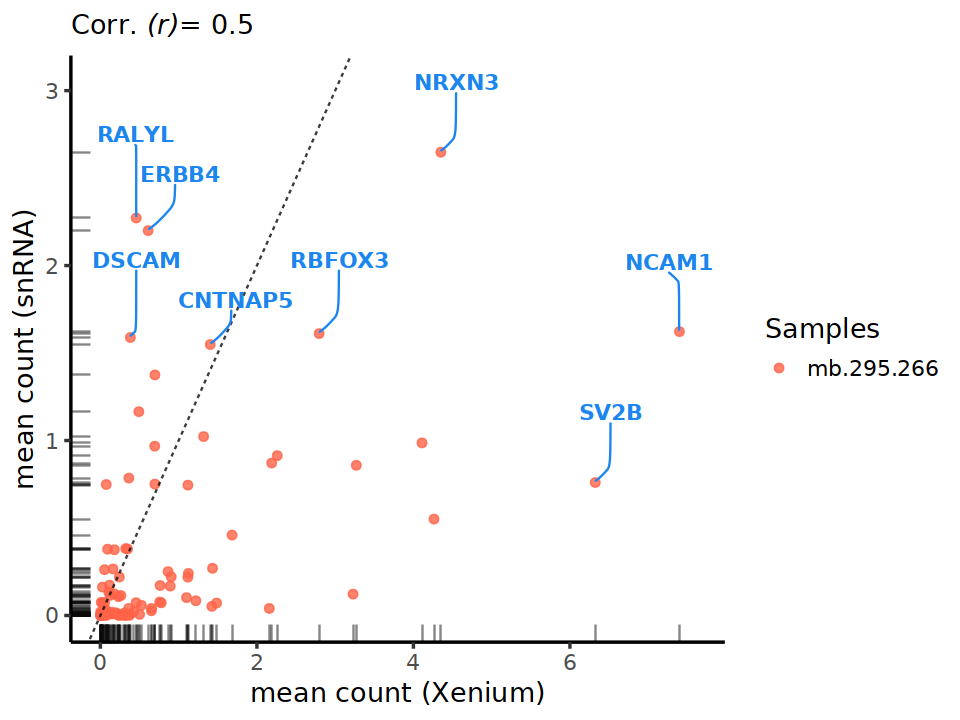

In [43]:
# Xenium vs snRNA ----
pl1.1 <- 
  df.gene.tech %>% 
    # filter for > 50 cells per gene
    #filter(nCell_perGene.Xenium > 50 &
    #       nCell_perGene.snRNA > 50) %>%
  ggplot(aes(x = meanCount_perGene.Xenium,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", #slope = 0.2,
              color = "gray4", alpha = 0.8) &   
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 10, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.Xenium,
                 meanCount_perGene.snRNA,
                 gene) %>%
          filter(meanCount_perGene.Xenium > 5 | 
                 #meanCount_perGene.snRNA == 10^-3 |
                 meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = 0.2, nudge_y = 0.4,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &
  #xlim(c(0, 16)) &
  #ylim(c(0, 16)) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (Xenium)", y = "mean count (snRNA)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.1

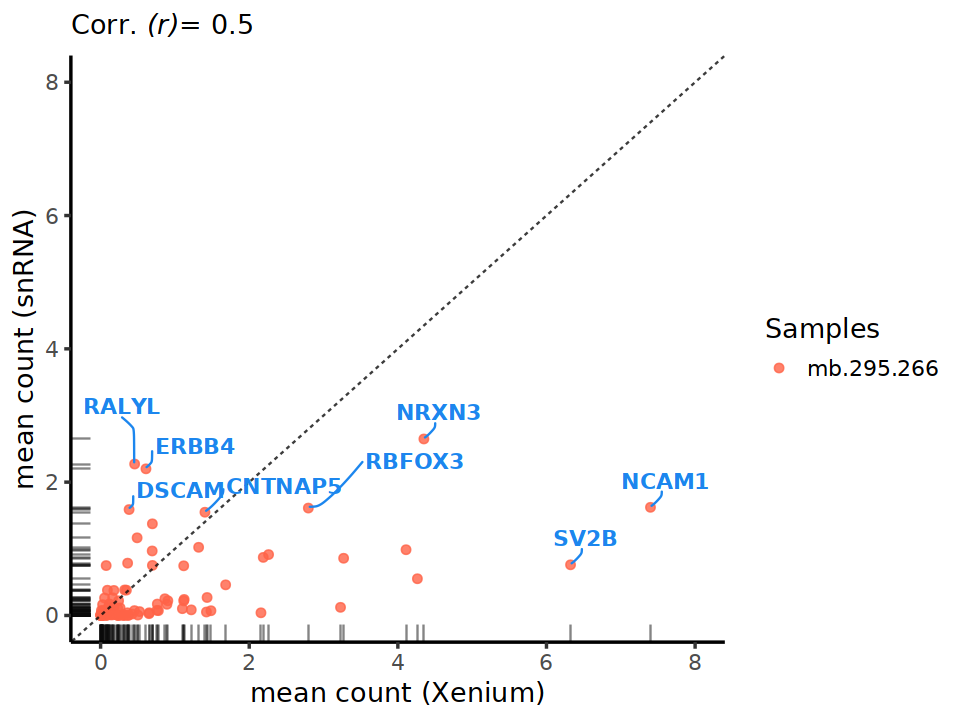

In [44]:
pl1.1 <-
pl1.1 & 
    xlim(c(0, 8)) &
    ylim(c(0, 8)) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (Xenium)", y = "mean count (snRNA)")
pl1.1

Warning message:
“There were 4 warnings in `mutate()`.
The first warning was:
ℹ In argument: `meanCount_perGene.log10.MERFISH = (structure(function (..., .x
  = ..1, .y = ..2, . = ..1) ...`.
Caused by warning in `(.x + pseudocount) %>% log10`:
! NaNs produced
ℹ Run `dplyr::last_dplyr_warnings()` to see the 3 remaining warnings.”


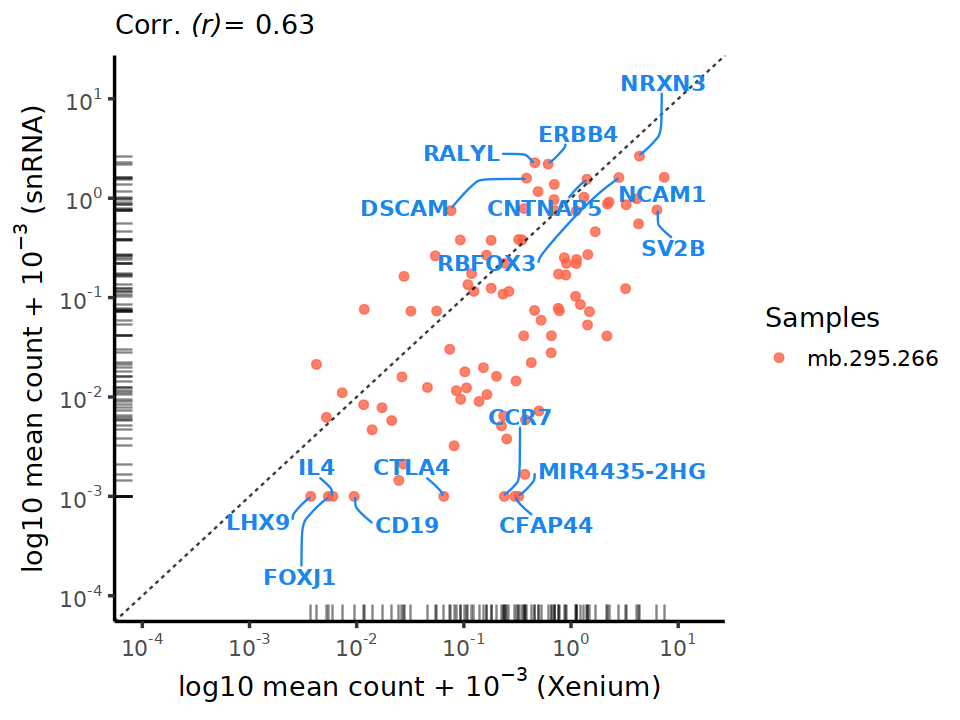

In [45]:
# Xenium vs snRNA - log10(+ pseudocount) scale ----
# set a pseudocount
pseudocount <- 10^-3
pl1.2 <- 
  df.gene.tech %>% 
    # add pseudocount to all and log10 transform
    mutate_at(vars(matches("meanCount")),  ~ (.x + pseudocount)) %>%
  ggplot(aes(x = meanCount_perGene.Xenium,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  { if (FALSE) {
      stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
              formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
              level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5))
  }} & 
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
  scale_x_continuous(trans = "log10", 
                     # add custom limits to have same scale
                     limits = c(10^-4, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  scale_y_continuous(trans = "log10", 
                     limits = c(10^-4, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>%
      # add pseudocount to selected values
      mutate_at(vars(matches("meanCount")), 
                                  ~ (.x + pseudocount)) %>%  
          select(meanCount_perGene.Xenium,
                 meanCount_perGene.snRNA,
                 gene) %>%
          filter(meanCount_perGene.Xenium > 5 | 
                 meanCount_perGene.snRNA == 10^-3 |
                 meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.4, nudge_y = 0.4,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.8,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>%
                        # add pseudocount to all and log10 transform
                        mutate_at(vars(matches("meanCount")), 
                                  ~ (.x + pseudocount) %>% log10) %>%  
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.snRNA) %>%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = expression("log10 mean count +" ~ 10^-3*" (Xenium)"), 
       y = expression("log10 mean count +" ~ 10^-3*" (snRNA)"))
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

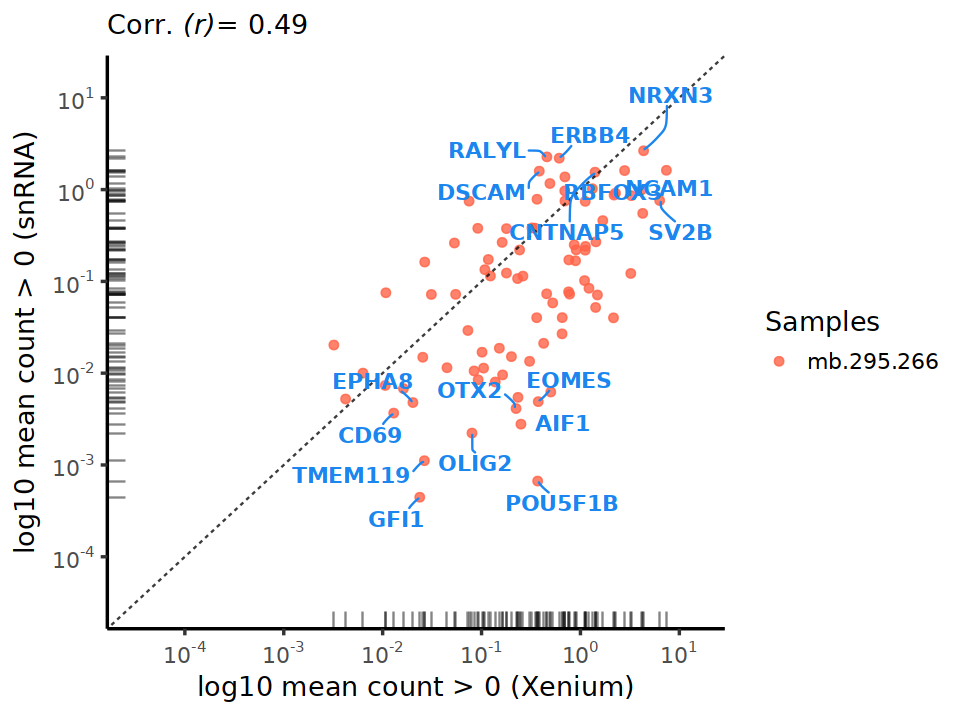

In [46]:
# Xenium vs snRNA - log10 scale (remove genes with 0 counts) ----
pl1.3 <- 
  df.gene.tech %>% 
    filter(meanCount_perGene.snRNA > 0) %>%
  ggplot(aes(x = meanCount_perGene.Xenium,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
  { if (FALSE) {
    stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
              formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
              level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5))
  }} & 
  scale_x_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  scale_y_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  #annotation_logticks() &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &                     
  theme_classic(base_size = 16) &
  ggrepel::geom_text_repel(
    data =
      df.gene.tech %>% 
          select(meanCount_perGene.Xenium,
                 meanCount_perGene.snRNA, 
                 gene) %>%
          filter_all(all_vars(. > 0)) %>%
          filter(meanCount_perGene.Xenium > 5 | 
                 between(meanCount_perGene.Xenium, 10^-4.5, 10^-3) |
                 between(meanCount_perGene.snRNA, 10^-4.5, 10^-2.3) |
                 meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.3, nudge_y = 0.6,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.snRNA) %>%
                        filter_all(all_vars(. > 0)) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = expression("log10 mean count >" ~ 0 *" (Xenium)"),
           y = expression("log10 mean count >" ~ 0*" (snRNA)")) 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.3

<span style="font-size:11pt; color:gold"> Save scatter plots - (Xenium vs snRNA) *genes* </span> 

In [47]:
## save plots
dir_path <- "./fig3/panel_A/"
#.pdf
pl1 <- 
    list(pl1.1, pl1.2, pl1.3)
message("..saving plots - `.pdf`")  
mclapply(pl1 %>% seq, function(i) {
    ggsave(pl1[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.Xenium.snRNA_scaled_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.Resolve.snRNA_scaled_1.pdf" "mben.Resolve.snRNA_scaled_2.pdf"
[3] "mben.Resolve.snRNA_scaled_3.pdf" "mben.Xenium.snRNA_scaled_1.pdf" 
[5] "mben.Xenium.snRNA_scaled_2.pdf"  "mben.Xenium.snRNA_scaled_3.pdf"

##### <span style="font-size:12pt; color:tomato"> Resolve vs snRNA </span>

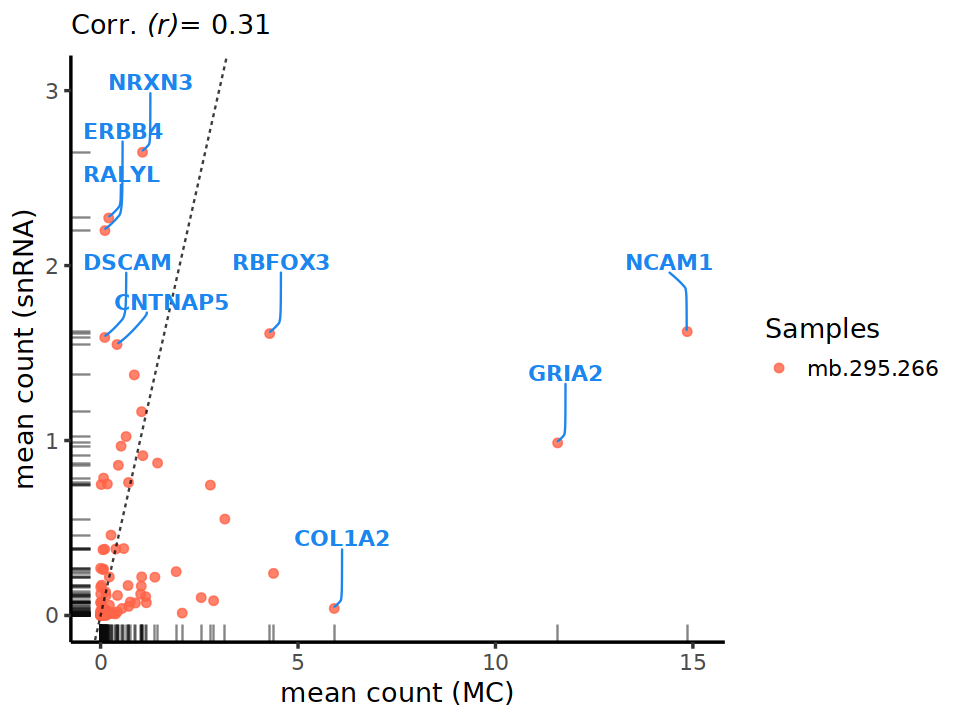

In [48]:
pl1.1 <- 
  df.gene.tech %>% 
    # filter for > 50 cells per gene
    #filter(nCell_perGene.Resolve > 50 &
    #       nCell_perGene.snRNA > 50) %>%
  ggplot(aes(x = meanCount_perGene.MC,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", #slope = 0.2,
              color = "gray4", alpha = 0.8) &   
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 10, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.MC,
                 meanCount_perGene.snRNA,
                 gene) %>%
          filter(meanCount_perGene.MC > 5 | 
                 #meanCount_perGene.snRNA == 10^-3 |
                 meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = 0.2, nudge_y = 0.4,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &
  #xlim(c(0, 16)) &
  #ylim(c(0, 16)) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.MC,
                               meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (MC)", y = "mean count (snRNA)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.1

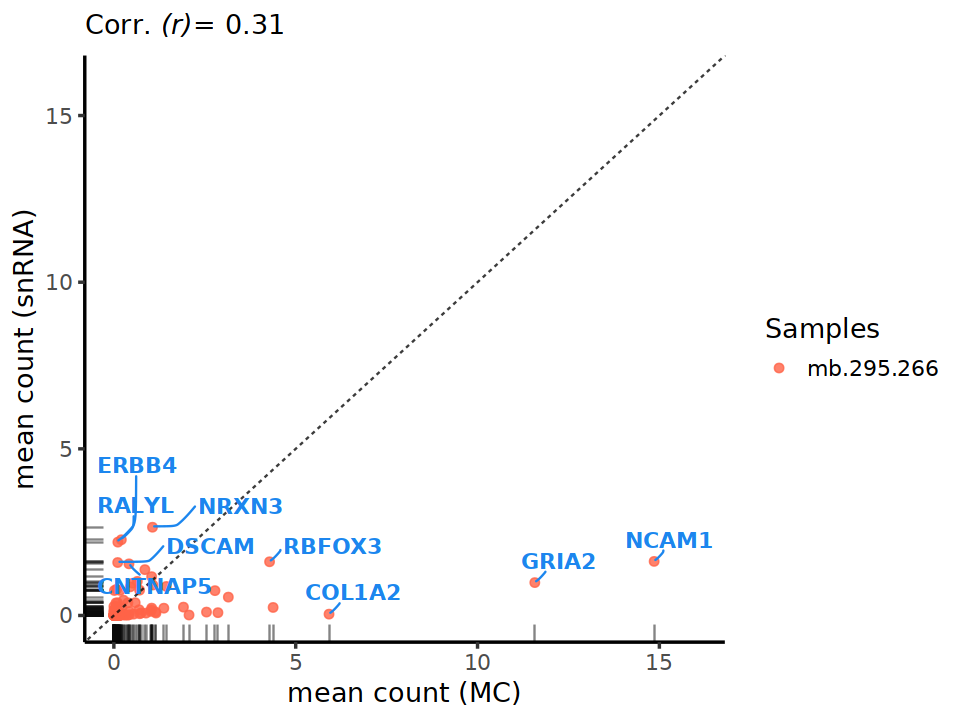

In [50]:
pl1.1 <-
pl1.1 & 
    xlim(c(0, 16)) &
    ylim(c(0, 16)) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.MC,
                               meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (MC)", y = "mean count (snRNA)")
pl1.1

Warning message:
“There were 4 warnings in `mutate()`.
The first warning was:
ℹ In argument: `meanCount_perGene.log10.MERFISH = (structure(function (..., .x
  = ..1, .y = ..2, . = ..1) ...`.
Caused by warning in `(.x + pseudocount) %>% log10`:
! NaNs produced
ℹ Run `dplyr::last_dplyr_warnings()` to see the 3 remaining warnings.”


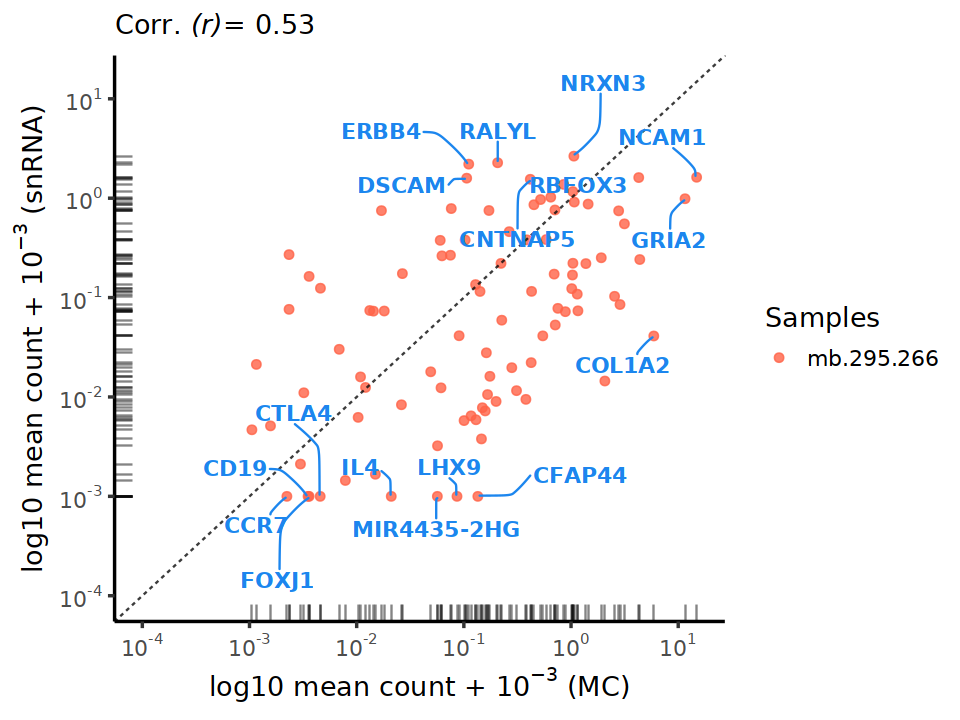

In [51]:
# Resolve vs snRNA - log10(+ pseudocount) scale ----
# set a pseudocount
pseudocount <- 10^-3
pl1.2 <- 
  df.gene.tech %>% 
    # add pseudocount to all and log10 transform
    mutate_at(vars(matches("meanCount")),  ~ (.x + pseudocount)) %>%
  ggplot(aes(x = meanCount_perGene.MC,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  { if (FALSE) {
      stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
              formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
              level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5))
  }} & 
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
  scale_x_continuous(trans = "log10", 
                     # add custom limits to have same scale
                     limits = c(10^-4, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  scale_y_continuous(trans = "log10", 
                     limits = c(10^-4, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>%
      # add pseudocount to selected values
      mutate_at(vars(matches("meanCount")), 
                                  ~ (.x + pseudocount)) %>%  
          select(meanCount_perGene.MC,
                 meanCount_perGene.snRNA,
                 gene) %>%
          filter(meanCount_perGene.MC > 5 | 
                 meanCount_perGene.snRNA == 10^-3 |
                 meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.4, nudge_y = 0.4,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.8,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>%
                        # add pseudocount to all and log10 transform
                        mutate_at(vars(matches("meanCount")), 
                                  ~ (.x + pseudocount) %>% log10) %>%  
                        select(meanCount_perGene.MC,
                               meanCount_perGene.snRNA) %>%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = expression("log10 mean count +" ~ 10^-3*" (MC)"), 
       y = expression("log10 mean count +" ~ 10^-3*" (snRNA)"))
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

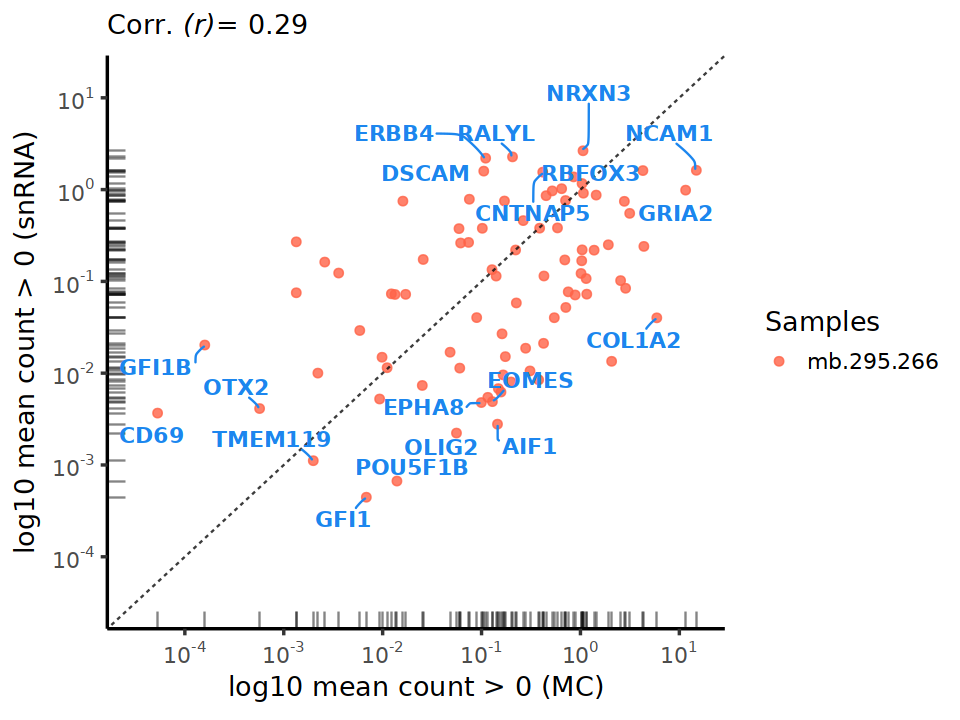

In [52]:
# Resolve vs snRNA - log10 scale (remove genes with 0 counts) ----
pl1.3 <- 
  df.gene.tech %>% 
    filter(meanCount_perGene.snRNA > 0) %>%
  ggplot(aes(x = meanCount_perGene.MC,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
  { if (FALSE) {
    stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
              formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
              level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5))
  }} & 
  scale_x_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  scale_y_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  #annotation_logticks() &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &                     
  theme_classic(base_size = 16) &
  ggrepel::geom_text_repel(
    data =
      df.gene.tech %>% 
          select(meanCount_perGene.MC,
                 meanCount_perGene.snRNA, 
                 gene) %>%
          filter_all(all_vars(. > 0)) %>%
          filter(meanCount_perGene.MC > 5 | 
                 between(meanCount_perGene.MC, 10^-4.5, 10^-3) |
                 between(meanCount_perGene.snRNA, 10^-4.5, 10^-2.3) |
                 meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.3, nudge_y = 0.6,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.MC,
                               meanCount_perGene.snRNA) %>%
                        filter_all(all_vars(. > 0)) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = expression("log10 mean count >" ~ 0 *" (MC)"),
           y = expression("log10 mean count >" ~ 0*" (snRNA)")) 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.3

<span style="font-size:11pt; color:gold"> Save scatter plots - (Resolve vs snRNA) *genes* </span> 

In [53]:
## save plots
dir_path <- "./fig3/panel_A/"
#.pdf
pl1 <- 
    list(pl1.1, pl1.2, pl1.3)
message("..saving plots - `.pdf`")  
mclapply(pl1 %>% seq, function(i) {
    ggsave(pl1[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.Resolve.snRNA_scaled_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.Resolve.snRNA_scaled_1.pdf" "mben.Resolve.snRNA_scaled_2.pdf"
[3] "mben.Resolve.snRNA_scaled_3.pdf" "mben.Xenium.snRNA_scaled_1.pdf" 
[5] "mben.Xenium.snRNA_scaled_2.pdf"  "mben.Xenium.snRNA_scaled_3.pdf"

##### <span style="font-size:12pt; color:tomato"> Vizgen vs snRNA </span>

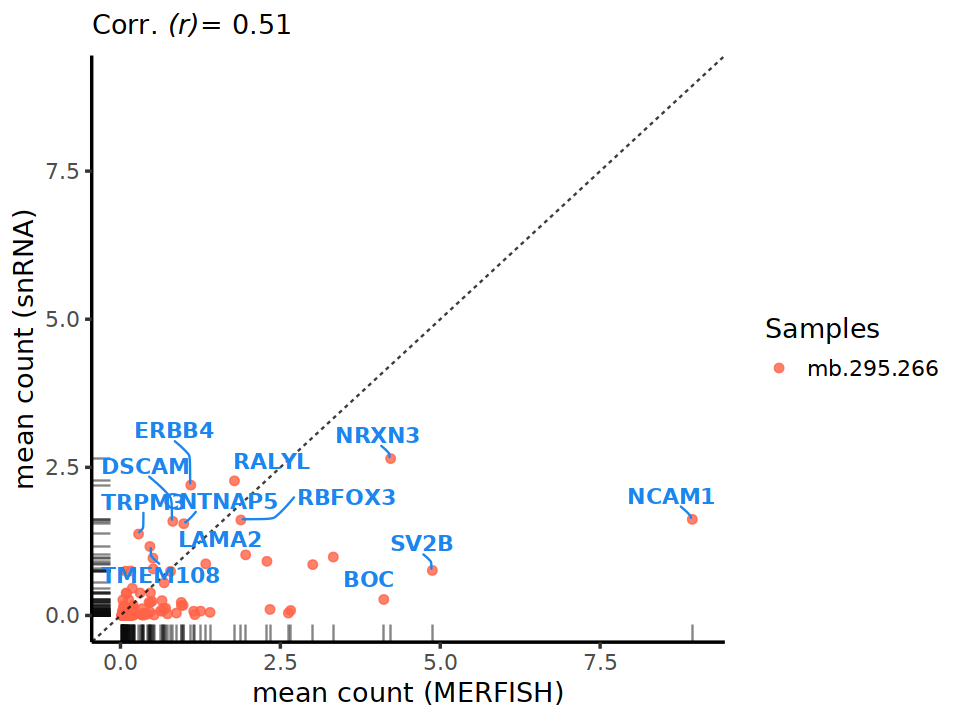

In [55]:
# Vizgen vs snRNA ----
pl1.1 <- 
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.MERFISH,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 10, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
 geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &  
 theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.MERFISH,
                 meanCount_perGene.snRNA, 
                 gene) %>%
          filter(meanCount_perGene.MERFISH > 4 | 
                 meanCount_perGene.snRNA > 1) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = -0.2, nudge_y = 0.4,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.4,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &
  xlim(c(0, 9)) &
  ylim(c(0, 9)) &   
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.MERFISH,
                               meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (MERFISH)", y = "mean count (snRNA)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.1

Warning message:
“There were 4 warnings in `mutate()`.
The first warning was:
ℹ In argument: `meanCount_perGene.log10.MERFISH = (structure(function (..., .x
  = ..1, .y = ..2, . = ..1) ...`.
Caused by warning in `(.x + pseudocount) %>% log10`:
! NaNs produced
ℹ Run `dplyr::last_dplyr_warnings()` to see the 3 remaining warnings.”


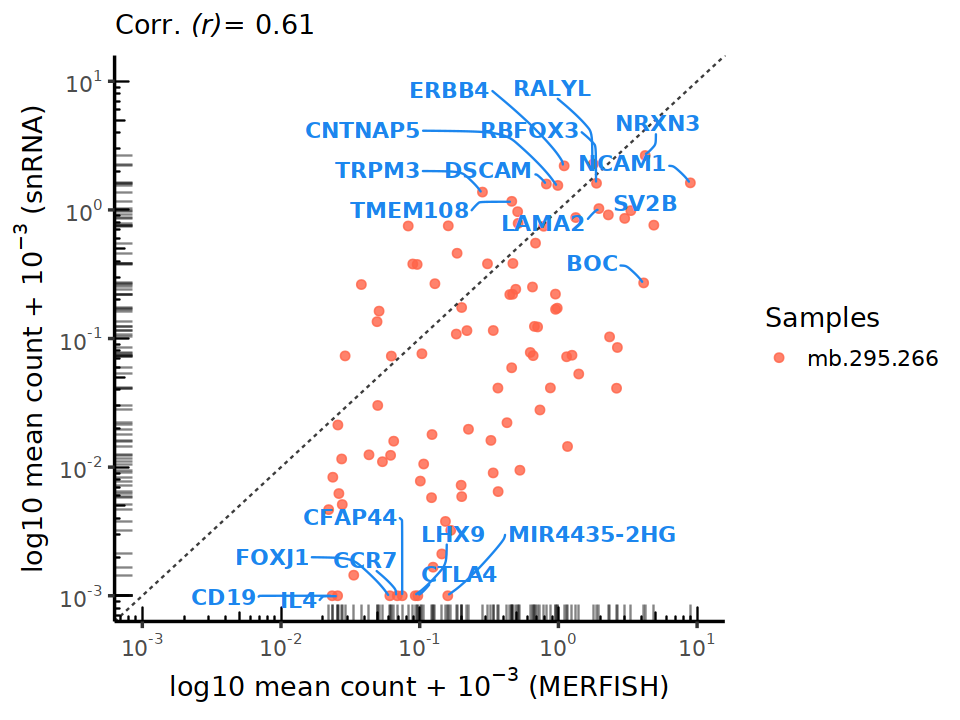

In [56]:
# Vizgen vs snRNA - log10(+ pseudocount) scale ----
pseudocount <- 10^-3 # 0.001
pl1.2 <- 
  df.gene.tech %>% 
  # add pseudocount to all and log10 transform
  mutate_at(vars(matches("meanCount")),  ~ (.x + pseudocount)) %>%
  ggplot(aes(x = meanCount_perGene.MERFISH,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
 geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
 scale_x_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-3, 10),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  scale_y_continuous(trans = "log10",
                     limits = c(10^-3, 10),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples",
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          # add pseudocount to selected values
  mutate_at(vars(matches("meanCount")), 
            ~ (.x + pseudocount)) %>%  
  select(meanCount_perGene.MERFISH,
         meanCount_perGene.snRNA,
         gene) %>%
  filter(meanCount_perGene.MERFISH > 4 | 
           meanCount_perGene.snRNA == 10^-3 |
           meanCount_perGene.snRNA > 1) %>%
  distinct(),
    aes(label = gene), # data point size
    nudge_x = -0.4, nudge_y = 0.2,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        # add pseudocount to all and log10 transform
                    mutate_at(vars(matches("meanCount")), 
                              ~ (.x + pseudocount) %>% log10) %>% 
                    select(meanCount_perGene.MERFISH, 
                           meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x =  expression("log10 mean count +" ~ 10^-3*" (MERFISH)"), 
       y = expression("log10 mean count +" ~ 10^-3*" (snRNA)")) 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

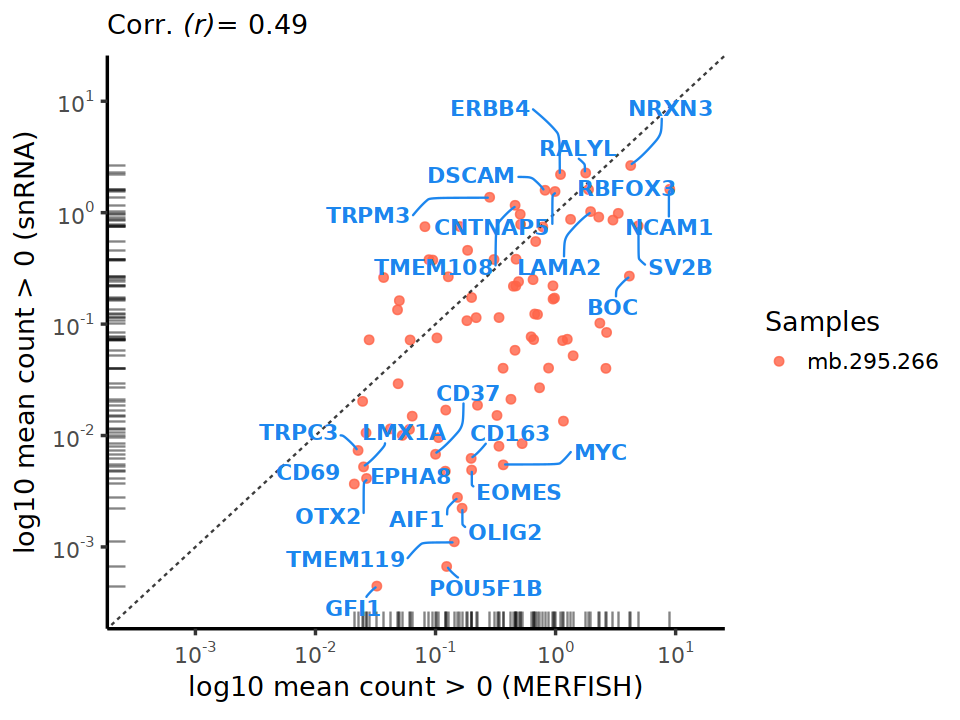

In [57]:
# Vizgen vs snRNA - log10 scale (remove genes with 0 counts) ----
pl1.3 <- 
  df.gene.tech %>% 
    filter(meanCount_perGene.snRNA > 0) %>%
  ggplot(aes(x = meanCount_perGene.MERFISH,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
  { if (FALSE) {
    stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
              formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
              level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5))
  }} & 
  scale_x_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-3.5, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  scale_y_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-3.5, 15),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  #annotation_logticks() &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &                     
  theme_classic(base_size = 16) &
  ggrepel::geom_text_repel(
    data =
      df.gene.tech %>%     
          select(meanCount_perGene.MERFISH,
                 meanCount_perGene.snRNA, 
                 gene) %>%
          filter_all(all_vars(. > 0)) %>%
          filter(meanCount_perGene.MERFISH > 4 |
                 between(meanCount_perGene.snRNA, 10^-3.5, 10^-2.1) |
                 between(meanCount_perGene.MERFISH, 10^-3.5, 10^-1.8) |
                 meanCount_perGene.snRNA > 1) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.4, nudge_y = 0.6,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.MERFISH,
                               meanCount_perGene.snRNA) %>%
                        filter_all(all_vars(. > 0)) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = expression("log10 mean count >" ~ 0 *" (MERFISH)"), 
           y = expression("log10 mean count >" ~ 0*" (snRNA)")) 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.3

<span style="font-size:11pt; color:gold"> Save scatter plots - (Vizgen vs snRNA) *genes* </span> 

In [58]:
## save plots
dir_path <- "./fig3/panel_A/"
#.pdf
pl1 <- 
    list(pl1.1, pl1.2, pl1.3)
message("..saving plots - `.pdf`")
mclapply(pl1 %>% seq, function(i) {
    ggsave(pl1[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.MERFISH.snRNA_scaled_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.MERFISH.snRNA_scaled_1.pdf" "mben.MERFISH.snRNA_scaled_2.pdf"
[3] "mben.MERFISH.snRNA_scaled_3.pdf" "mben.Resolve.snRNA_scaled_1.pdf"
[5] "mben.Resolve.snRNA_scaled_2.pdf" "mben.Resolve.snRNA_scaled_3.pdf"
[7] "mben.Xenium.snRNA_scaled_1.pdf"  "mben.Xenium.snRNA_scaled_2.pdf" 
[9] "mben.Xenium.snRNA_scaled_3.pdf"

##### <span style="font-size:12pt; color:tomato"> Vizgen vs Resolve </span>

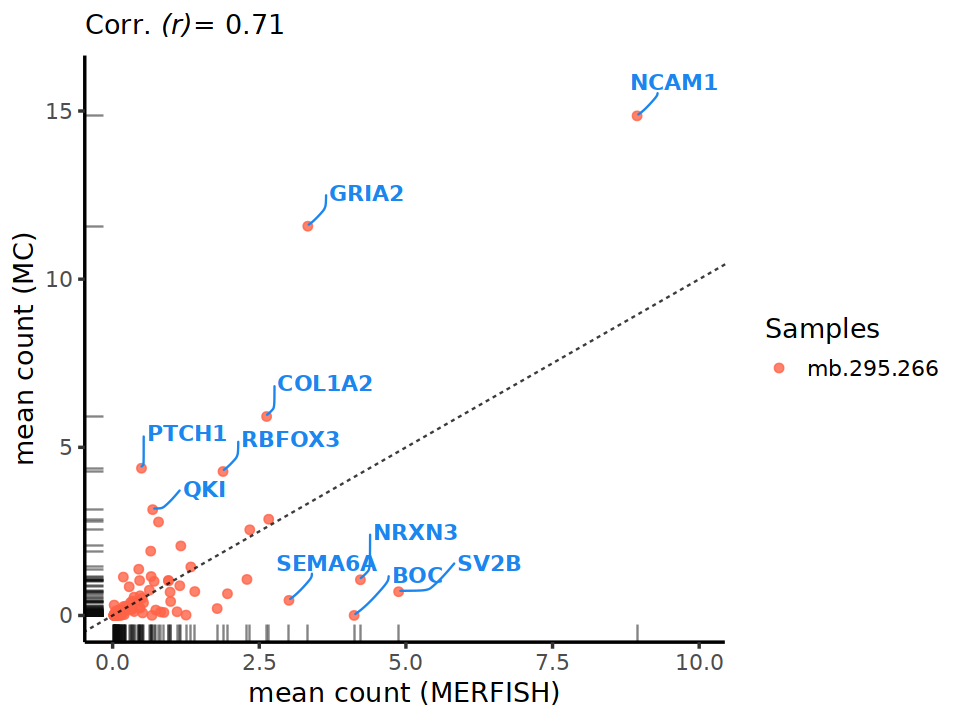

In [70]:
# Vizgen vs Resolve ----
pl1.1 <- 
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.MERFISH,
             y = meanCount_perGene.MC,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &  
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.MERFISH,
                 meanCount_perGene.MC, 
                 gene) %>%
          filter(meanCount_perGene.MERFISH > 3 | 
                 meanCount_perGene.MC > 3) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = 1, nudge_y = 1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.3,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & 
  #xlim(c(0, 16)) &
  #ylim(c(0, 16)) &   
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.MERFISH,
                               meanCount_perGene.MC) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (MERFISH)", y = "mean count (MC)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.1

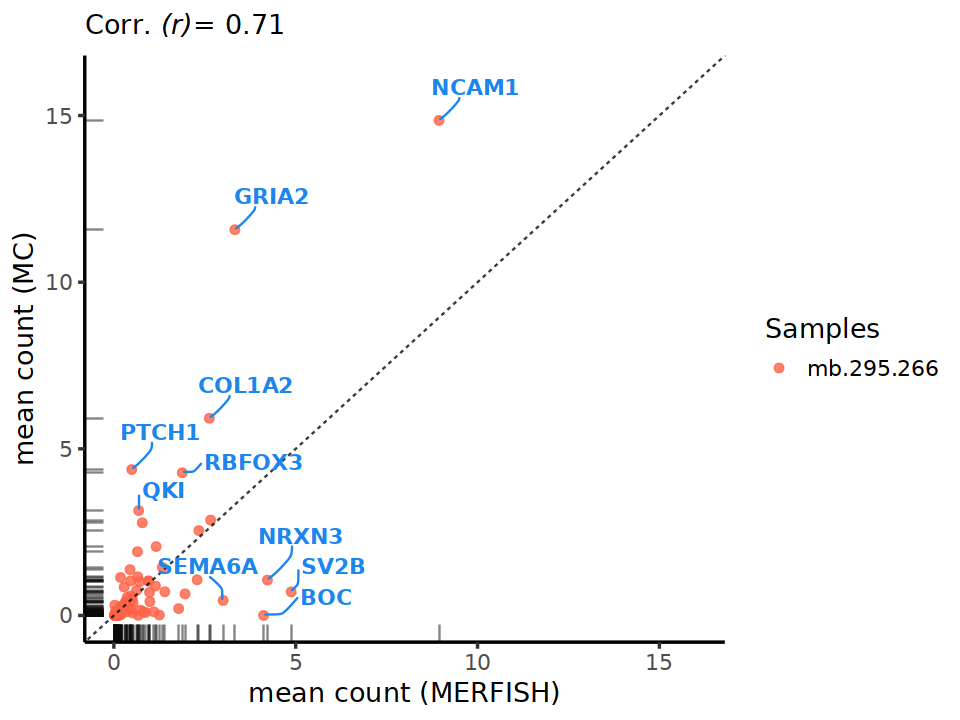

In [71]:
pl1.1 <- 
pl1.1 & 
    xlim(c(0, 16)) &
    ylim(c(0, 16)) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.MERFISH,
                               meanCount_perGene.MC) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (MERFISH)", y = "mean count (MC)") 
pl1.1

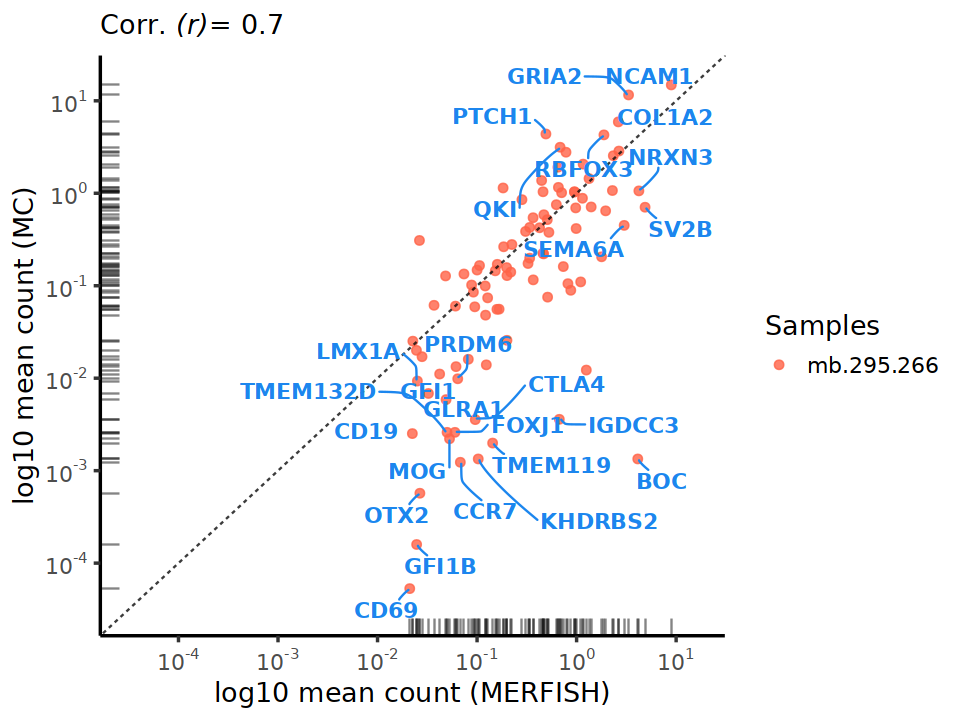

In [72]:
# MERFISH vs Resolve - log10 scale ----
pl1.2 <-
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.MERFISH,
             y = meanCount_perGene.MC,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &
  scale_x_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 16),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  scale_y_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 16),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          select(meanCount_perGene.MERFISH,
                 meanCount_perGene.MC, 
                 gene) %>%
          filter(meanCount_perGene.MERFISH > 3 | 
                 between(meanCount_perGene.MC, 10^-4.5, 10^-2) |
                 between(meanCount_perGene.MERFISH, 10^-4.5, 10^-2) |
                 meanCount_perGene.MC > 3) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.1, 
    #nudge_y = -0.1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>%
                        select(meanCount_perGene.MERFISH,
                               meanCount_perGene.MC) %>%
                        # add pseudo count to all and log10 transform
                        mutate_all(., ~ .x %>% log10) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "log10 mean count (MERFISH)", y = "log10 mean count (MC)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

In [73]:
## save plots
dir_path <- "./fig3/panel_A/"
#.pdf
pl1 <- 
    list(pl1.1, pl1.2)
message("..saving plots - `.pdf`")  
mclapply(pl1 %>% seq, function(i) {
    ggsave(pl1[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.MERFISH.MC_scaled_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.MERFISH.MC_scaled_1.pdf"    "mben.MERFISH.MC_scaled_2.pdf"   
 [3] "mben.MERFISH.snRNA_scaled_1.pdf" "mben.MERFISH.snRNA_scaled_2.pdf"
 [5] "mben.MERFISH.snRNA_scaled_3.pdf" "mben.Resolve.snRNA_scaled_1.pdf"
 [7] "mben.Resolve.snRNA_scaled_2.pdf" "mben.Resolve.snRNA_scaled_3.pdf"
 [9] "mben.Xenium.snRNA_scaled_1.pdf"  "mben.Xenium.snRNA_scaled_2.pdf" 
[11] "mben.Xenium.snRNA_scaled_3.pdf"

##### <span style="font-size:12pt; color:tomato"> Xenium vs Resolve </span>

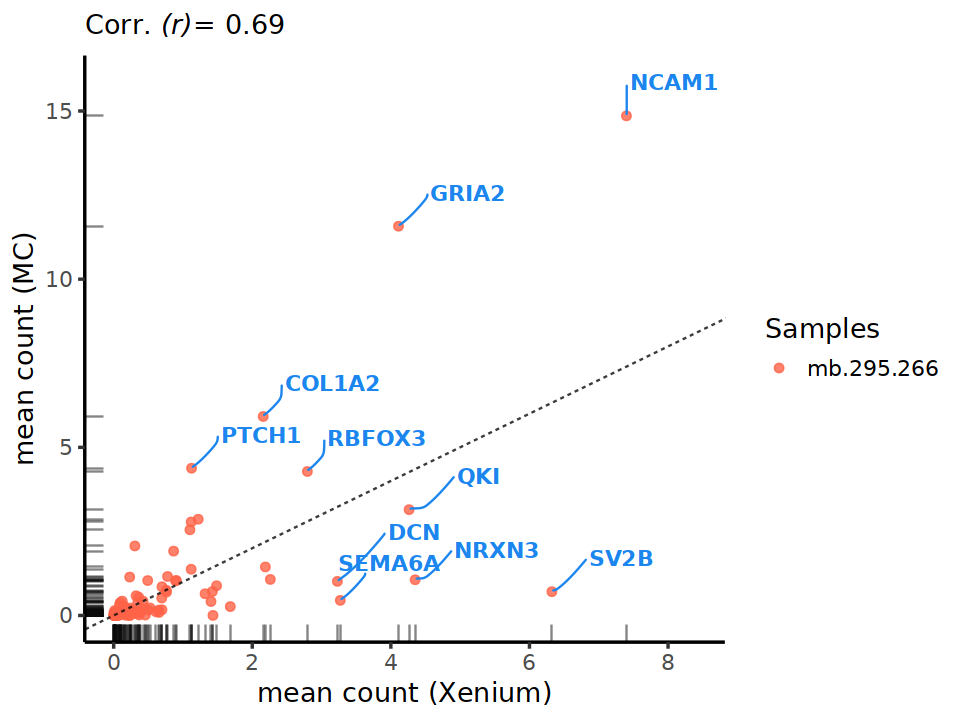

In [75]:
# Xenium vs Resolve ----
pl1.1 <- 
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.Xenium,
             y = meanCount_perGene.MC,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &  
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.Xenium,
                 meanCount_perGene.MC, 
                 gene) %>%
          filter(meanCount_perGene.Xenium > 3 | 
                 meanCount_perGene.MC > 3) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = 1, nudge_y = 1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.3,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & 
  #xlim(c(0, 16)) &
  #ylim(c(0, 16)) &   
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.MC) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (Xenium)", y = "mean count (MC)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.1

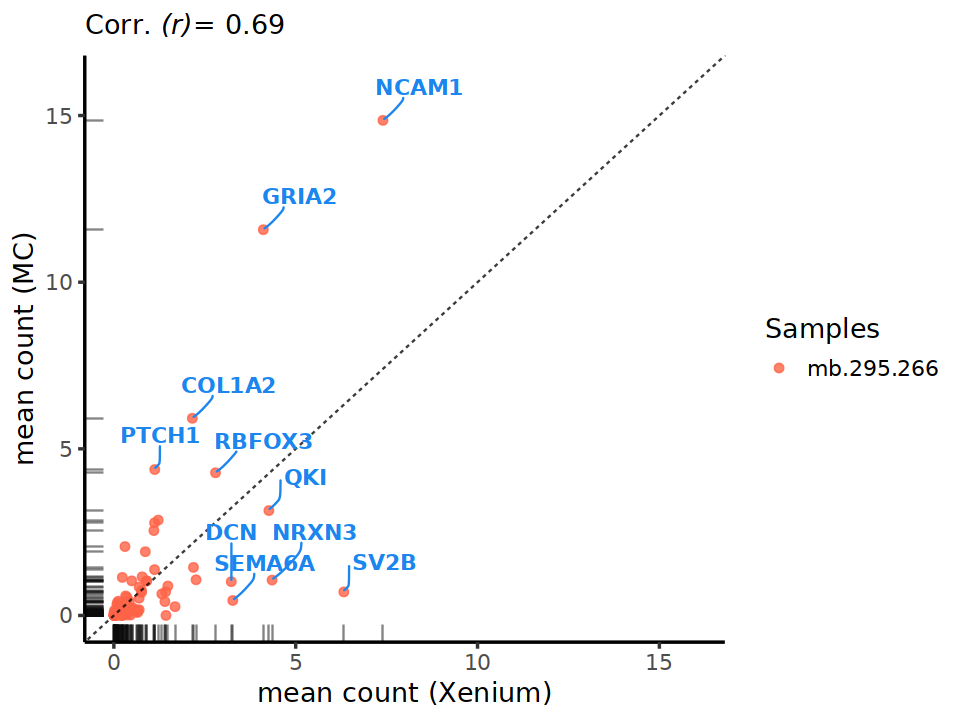

In [76]:
pl1.1 <- 
pl1.1 & 
    xlim(c(0, 16)) &
    ylim(c(0, 16)) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.MC) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (Xenium)", y = "mean count (MC)") 
pl1.1

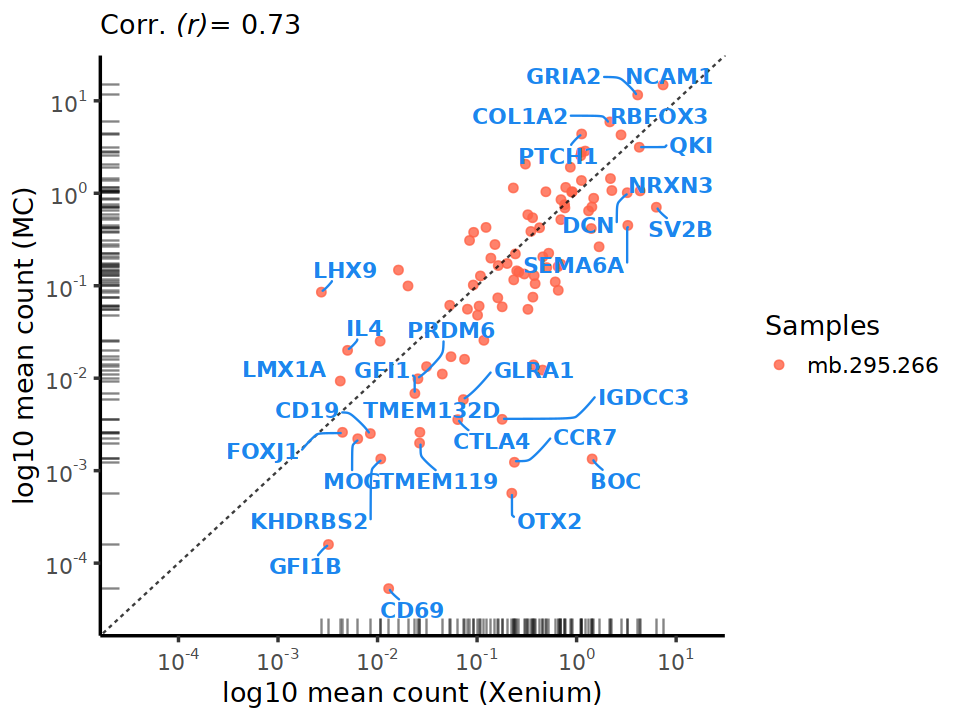

In [77]:
# Xenium vs Resolve - log10 scale ----
pl1.2 <-
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.Xenium,
             y = meanCount_perGene.MC,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &
  scale_x_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 16),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  scale_y_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 16),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          select(meanCount_perGene.Xenium,
                 meanCount_perGene.MC, 
                 gene) %>%
          filter(meanCount_perGene.Xenium > 3 | 
                 between(meanCount_perGene.MC, 10^-4.5, 10^-2) |
                 between(meanCount_perGene.Xenium, 10^-4.5, 10^-2) |
                 meanCount_perGene.MC > 3) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.1, 
    #nudge_y = -0.1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>%
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.MC) %>%
                        # add pseudo count to all and log10 transform
                        mutate_all(., ~ .x %>% log10) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "log10 mean count (Xenium)", y = "log10 mean count (MC)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

In [78]:
## save plots
dir_path <- "./fig3/panel_A/"
#.pdf
pl1 <- 
    list(pl1.1, pl1.2)
message("..saving plots - `.pdf`")  
mclapply(pl1 %>% seq, function(i) {
    ggsave(pl1[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.Xenium.MC_scaled_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.MERFISH.MC_scaled_1.pdf"    "mben.MERFISH.MC_scaled_2.pdf"   
 [3] "mben.MERFISH.snRNA_scaled_1.pdf" "mben.MERFISH.snRNA_scaled_2.pdf"
 [5] "mben.MERFISH.snRNA_scaled_3.pdf" "mben.Resolve.snRNA_scaled_1.pdf"
 [7] "mben.Resolve.snRNA_scaled_2.pdf" "mben.Resolve.snRNA_scaled_3.pdf"
 [9] "mben.Xenium.MC_scaled_1.pdf"     "mben.Xenium.MC_scaled_2.pdf"    
[11] "mben.Xenium.snRNA_scaled_1.pdf"  "mben.Xenium.snRNA_scaled_2.pdf" 
[13] "mben.Xenium.snRNA_scaled_3.pdf"

##### <span style="font-size:12pt; color:tomato"> Xenium vs Vizgen </span>

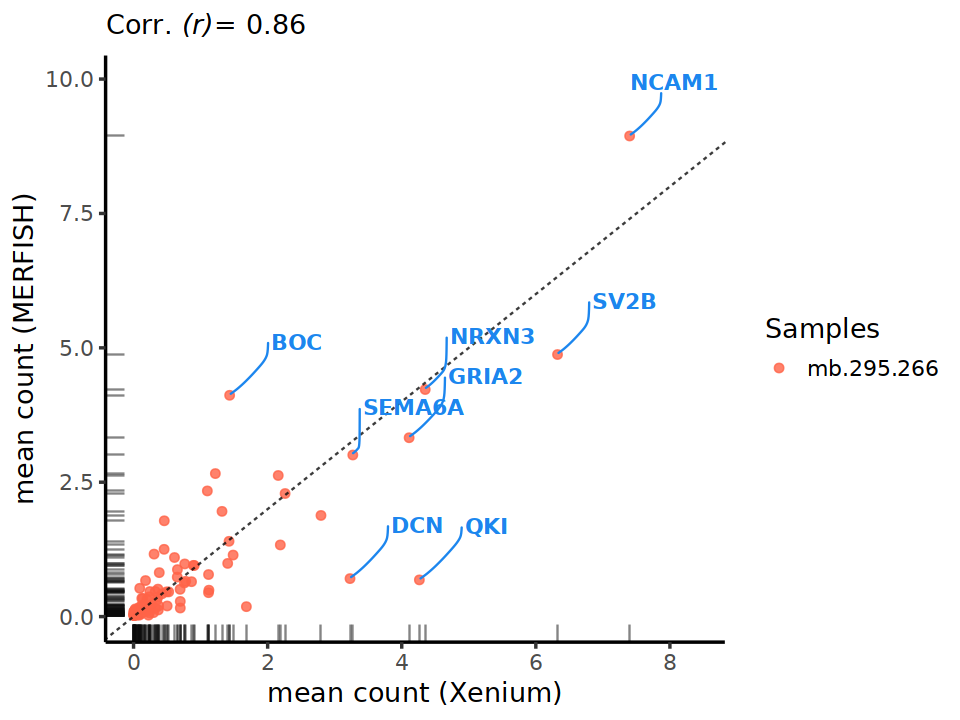

In [79]:
# Xenium vs Vizgen ----
pl1.1 <- 
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.Xenium,
             y = meanCount_perGene.MERFISH,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &  
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.Xenium,
                 meanCount_perGene.MERFISH, 
                 gene) %>%
          filter(meanCount_perGene.Xenium > 3 | 
                 meanCount_perGene.MERFISH > 3) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = 1, nudge_y = 1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.3,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & 
  #xlim(c(0, 16)) &
  #ylim(c(0, 16)) &   
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.MERFISH) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (Xenium)", y = "mean count (MERFISH)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.1

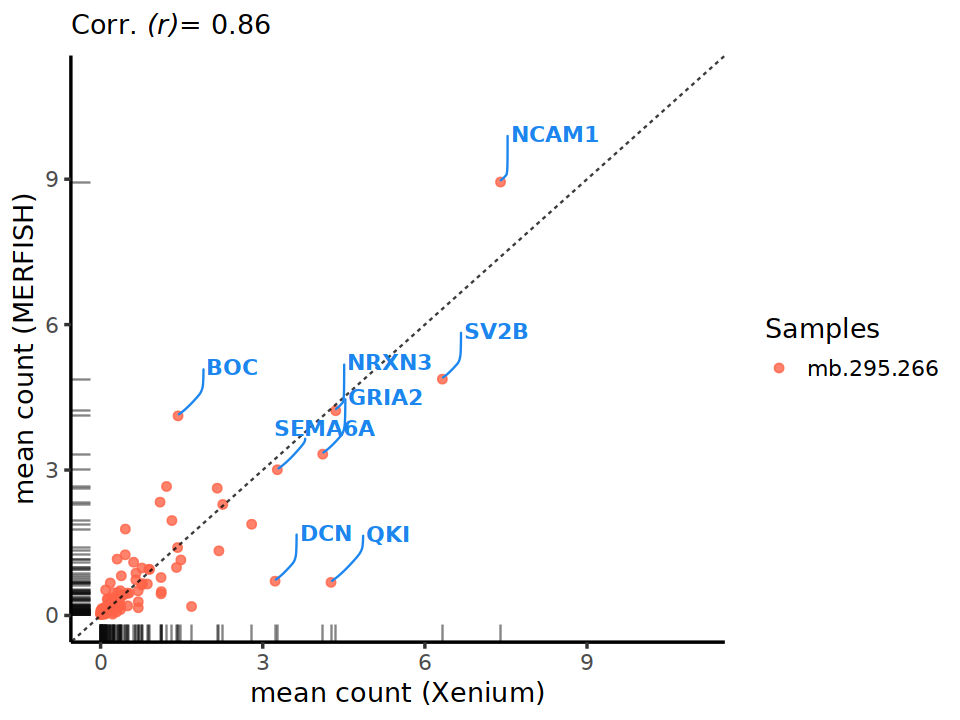

In [80]:
pl1.1 <- 
pl1.1 & 
    xlim(c(0, 11)) &
    ylim(c(0, 11)) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.MERFISH) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (Xenium)", y = "mean count (MERFISH)") 
pl1.1

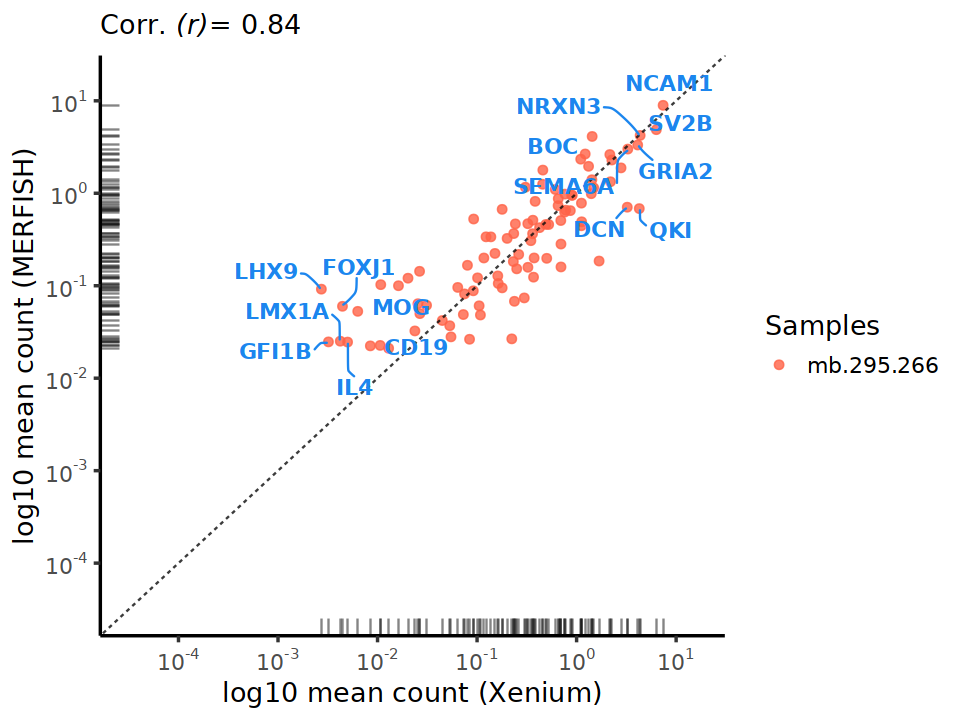

In [81]:
# Xenium vs Resolve - log10 scale ----
pl1.2 <-
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.Xenium,
             y = meanCount_perGene.MERFISH,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2), 
  #                size = 0.6, bins = 10) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 20, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &
  scale_x_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 16),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  scale_y_continuous(trans = "log10",
                     # add custom limits to have same scale
                     limits = c(10^-4.5, 16),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          select(meanCount_perGene.Xenium,
                 meanCount_perGene.MERFISH, 
                 gene) %>%
          filter(meanCount_perGene.Xenium > 3 | 
                 between(meanCount_perGene.MERFISH, 10^-4.5, 10^-2) |
                 between(meanCount_perGene.Xenium, 10^-4.5, 10^-2) |
                 meanCount_perGene.MERFISH > 3) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.1, 
    #nudge_y = -0.1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>%
                        select(meanCount_perGene.Xenium,
                               meanCount_perGene.MERFISH) %>%
                        # add pseudo count to all and log10 transform
                        mutate_all(., ~ .x %>% log10) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "log10 mean count (Xenium)", y = "log10 mean count (MERFISH)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

In [82]:
## save plots
dir_path <- "./fig3/panel_A/"
#.pdf
pl1 <- 
    list(pl1.1, pl1.2)
message("..saving plots - `.pdf`")  
mclapply(pl1 %>% seq, function(i) {
    ggsave(pl1[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.Xenium.MERFISH_scaled_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.MERFISH.MC_scaled_1.pdf"     "mben.MERFISH.MC_scaled_2.pdf"    
 [3] "mben.MERFISH.snRNA_scaled_1.pdf"  "mben.MERFISH.snRNA_scaled_2.pdf" 
 [5] "mben.MERFISH.snRNA_scaled_3.pdf"  "mben.Resolve.snRNA_scaled_1.pdf" 
 [7] "mben.Resolve.snRNA_scaled_2.pdf"  "mben.Resolve.snRNA_scaled_3.pdf" 
 [9] "mben.Xenium.MC_scaled_1.pdf"      "mben.Xenium.MC_scaled_2.pdf"     
[11] "mben.Xenium.MERFISH_scaled_1.pdf" "mben.Xenium.MERFISH_scaled_2.pdf"
[13] "mben.Xenium.snRNA_scaled_1.pdf"   "mben.Xenium.snRNA_scaled_2.pdf"  
[15] "mben.Xenium.snRNA_scaled_3.pdf"

#### <span style="font-size:12pt; color:gold"> QCs - RNAScope *per gene* </span>
<span style="font-size:10pt; color:tomato">..using Mean per technology accross samples ***MB295, 266*** </span>
##### comparison is:
- RNAScope vs Xenium
- RNAScope vs snRNAseq
- RNAScope vs Resolve
- RNAScope vs Vizgen

In [ ]:
# prepare additional QC metrics - checks only, no need to run
## some examples:

#..as from [STutility QC](https://ludvigla.github.io/STUtility_web_site/Quality_Control.html)
# how to calcualte additional QC metrics, example below:
# eg we have 6 (genes) x 10 (cells) matrix
assay.name <- 
    grep("SCT", Assays(obj), 
         invert = TRUE, 
         value = TRUE)
set.seed(4567)
g.index <- sample(dim(obj)[1] %>% seq, size = 6) # 6 genes
c.index <- sample(dim(obj)[2] %>% seq, size = 10) # 10 cells
mat_temp <- GetAssayData(obj, slot = "counts", assay = assay.name)[g.index,c.index] 
mat_temp %>% dim
mat_temp

# calculate total Transcript counts: 
Matrix::rowSums(mat_temp) %>% cbind # per gene
Matrix::colSums(mat_temp) %>% cbind # per cell - nCount_* ie total Transcript counts per cell
Matrix::colSums(mat_temp) %>% cbind # per cell - mean Transcript counts per cell
apply(mat_temp, 2, mean) %>% cbind # per cell - mean Transcript counts per cell
apply(mat_temp, 2, median) %>% cbind # per cell - median Transcript counts per cell
apply(mat_temp, 1, mean) %>% cbind # per gene - mean Transcript counts per gene
                 
# calcuate total positive (+) Cells (nCells) with Transcript counts > 0 :
Matrix::rowSums(mat_temp > 0) %>% cbind # per gene
Matrix::colSums(mat_temp > 0) %>% cbind # per cell - nFeature_* ie genes per cell

# total Transcript counts - per gene
Matrix::rowSums(GetAssayData(obj, slot = "counts", assay = assay.name)) %>% str
# count Cells with Transcript counts > 0 - per gene
# eg total expression(+) cells - per gene
Matrix::rowSums(GetAssayData(obj, slot = "counts", assay = assay.name) > 0) %>% str 
                    

##### <span style="font-size:12pt; color:tomato"> Prepara data and generate scatter plots - *genes* </span> <br />

In [91]:
# calculate QC metrics - per technology accross 2 samples per gene!
meta.var <- "spatial_tech"
assay.name <- 
    grep("SCT", Assays(obj), 
         invert = TRUE, 
         value = TRUE)
index.df <-
    getMeta(obj) %>%
    select(samples, spatial_tech) %>%
    # merge MB285, update 10X namings
    mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = "") %>%
                     gsub(pattern = "10Xsn", 
                          replacement = "snRNA", .) %>%
                     gsub("MB", "mb", .),
           spatial_tech = stringi::stri_replace_all_regex(spatial_tech, 
                                pattern = "10Xsn", 
                                replacement = "snRNA"))
index.samples <- 
lapply(seq(index.df$samples %>% unique %>% 
           grep("295|266", ., value = TRUE)), function(i) {
    which(index.df$samples %in% c(index.df$samples %>% unique %>% 
           grep("295|266", ., value = TRUE))[i])}
       )
names(index.samples) <- 
    index.df$samples %>% unique %>% 
    grep("295|266", ., value = TRUE)

# generate df - loop per sample
# get count matrix
mat_expr <- GetAssayData(obj, slot = "counts", assay = assay.name)
mat_expr %>% str

df.gene.tech <- 
mclapply(seq(index.df$spatial_tech %>% unique), function(i) 
    tibble(
        nCount_perGene = (mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>%     
              Matrix::rowSums()),
        nCell_perGene = ((mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] > 0) %>% 
              Matrix::rowSums()),
        meanCount_perGene = (mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>% 
              Matrix::rowMeans()),
        meanCell_perGene = ((mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] > 0) %>% 
              Matrix::rowMeans()),
        gene = mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>% 
              Matrix::rowMeans() %>% names,
        meanCount_perGene.log10 = (mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] %>% 
              Matrix::rowMeans()) %>% log10, 
        meanCell_perGene.log10 = ((mat_expr[,index.samples[index.samples %>% 
              names %>% 
              grep((index.df$spatial_tech %>% unique)[i], .)] %>% unlist] > 0) %>% 
              Matrix::rowMeans()) %>% log10,
        samples = rep(index.samples %>%
                      names %>% 
                      # there are only 2 samples -> repeat merged name only for 1st
                      grep((index.df$spatial_tech %>% unique)[1], ., value = TRUE) %>% 
                      gsub("[a-z]|.[A-Z]", "", .) %>%
                      c("mb", .) %>%
                      paste0(collapse = "."),
                      nrow(mat_expr)),
        spatial_tech = rep((index.df$spatial_tech %>% unique)[i],
                           nrow(mat_expr))
    ), mc.cores = 15
         )

# add spatial_tech name to colnames
for (i in df.gene.tech %>% seq) {
    colnames(df.gene.tech[[i]])[-c(df.gene.tech[[1]] %>% 
                                   colnames %>% 
                                   grep("samples|gene", .,)
                                  )] <- 
    c(df.gene.tech[[i]] %>% 
      colnames %>% 
      grep("samples|gene", ., 
           invert = TRUE,
           value = TRUE) %>%
      paste0(".", df.gene.tech[[i]] %>% 
             pull(spatial_tech) %>%
             unique))
    }

# combine
df.gene.tech %<>% 
    #do.call("cbind", .) %>%
    purrr::reduce(., inner_join) %>%
    # remove duplicated cols
    select(colnames(.) %>% unique())
df.gene.tech %>% glimpse()

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:4047117] 0 6 8 1 7 1 5 0 1 4 ...
  ..@ p       : int [1:1066133] 0 2 3 5 7 12 14 17 22 23 ...
  ..@ Dim     : int [1:2] 10 1066132
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:10] "CNTN2" "PTCH1" "PBX3" "TRPM3" ...
  .. ..$ : chr [1:1066132] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" "Vz_mb295.region0.Vizgen_112833000000100021" ...
  ..@ x       : num [1:4047117] 1 1 1 3 1 1 2 1 1 1 ...
  ..@ factors : list()


Joining with `by = join_by(gene, samples)`
Joining with `by = join_by(gene, samples)`
Joining with `by = join_by(gene, samples)`
Joining with `by = join_by(gene, samples)`


Rows: 10
Columns: 37
$ nCount_perGene.MERFISH           <dbl> 372327, 68798, 70999, 39519, 6751, 27…
$ nCell_perGene.MERFISH            <int> 87878, 45228, 45327, 24440, 6086, 534…
$ meanCount_perGene.MERFISH        <dbl> 2.8116490, 0.5195321, 0.5361531, 0.29…
$ meanCell_perGene.MERFISH         <dbl> 0.6636158, 0.3415419, 0.3422895, 0.18…
$ gene                             <chr> "CNTN2", "PTCH1", "PBX3", "TRPM3", "D…
$ meanCount_perGene.log10.MERFISH  <dbl> 0.448961, -0.284388, -0.270711, -0.52…
$ meanCell_perGene.log10.MERFISH   <dbl> -0.178083, -0.466556, -0.465606, -0.7…
$ samples                          <chr> "mb.295.266", "mb.295.266", "mb.295.2…
$ spatial_tech.MERFISH             <chr> "MERFISH", "MERFISH", "MERFISH", "MER…
$ nCount_perGene.MC                <dbl> 215903, 330339, 39118, 64367, 9628, 4…
$ nCell_perGene.MC                 <int> 45413, 57366, 21320, 27187, 5625, 183…
$ meanCount_perGene.MC             <dbl> 2.9646417, 4.5360036, 0.5371433, 0.88…
$ meanCell_perGene.

##### <span style="font-size:12pt; color:tomato"> RNAScope vs Xenium </span>

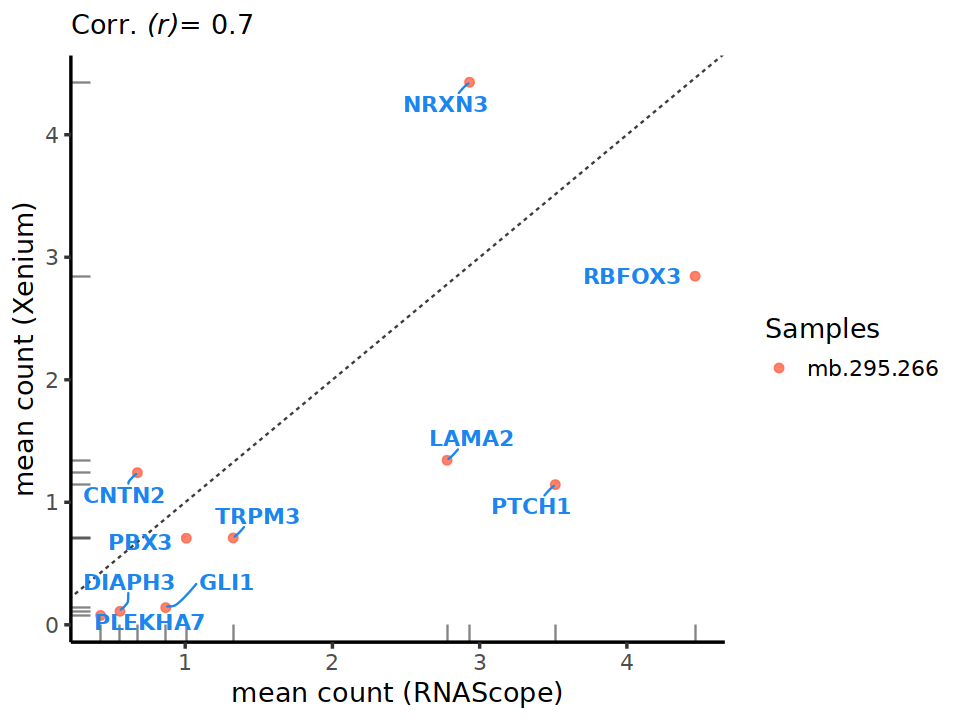

In [124]:
# RNAScope vs Xenium ----
pl1 <- 
  df.gene.tech %>% 
    # filter for > 50 cells per gene
    #filter(nCell_perGene.RNAScope > 50 &
    #       nCell_perGene.snRNA > 50) %>%
  ggplot(aes(x = meanCount_perGene.RNAScope,
             y = meanCount_perGene.Xenium,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &  
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6),
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 10, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.Xenium, 
                 gene) %>%
          #filter(meanCount_perGene.RNAScope > 5 | 
          #       meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.2, nudge_y = 0.2,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.Xenium) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (Xenium)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1

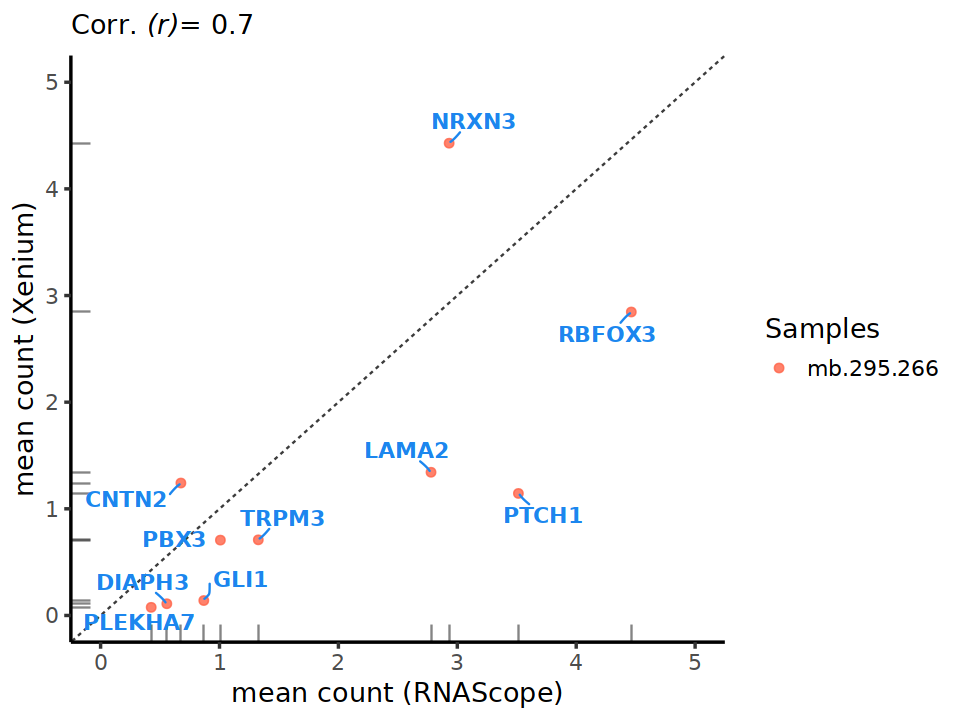

In [125]:
pl1.1 <-
pl1 & 
    xlim(c(0, 5)) &
    ylim(c(0, 5)) &
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.Xenium) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (Xenium)")
pl1.1

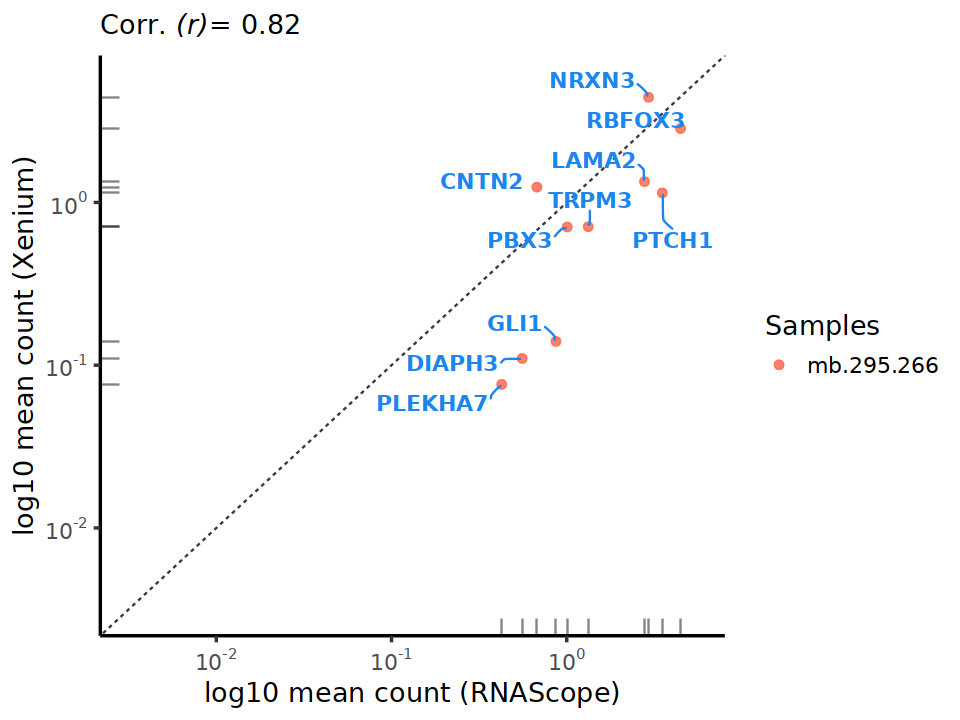

In [129]:
# RNAScope vs snRNA - log10 scale ----
pl1.2 <- 
  df.gene.tech %>%
  ggplot(aes(x = meanCount_perGene.RNAScope,
             y = meanCount_perGene.Xenium,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2),
  #                size = 0.6, bins = 15) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 5, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
  scale_x_continuous(trans = "log10", 
                     # add custom limits to have same scale
                     limits = c(10^-2.5, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  scale_y_continuous(trans = "log10", 
                     limits = c(10^-2.5, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.Xenium, 
                 gene) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = -0.2, nudge_y = 0.01,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.Xenium) %>%
                        # add pseudo count to all and log10 transform
                        mutate_all(., ~ (.x %>% log10)) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "log10 mean count (RNAScope)", y = "log10 mean count (Xenium)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

<span style="font-size:11pt; color:gold"> Save scatter plots - (RNAScope vs Xenium) *genes* </span> 

In [130]:
## save plots
dir_path <- "./fig4/panel_X/"
#.pdf
pl <- 
    list(pl1.1, pl1.2)
message("..saving plots - `.pdf`")  
mclapply(pl %>% seq, function(i) {
    ggsave(pl[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.RNAScope.Xenium_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.RNAScope.MC_1.pdf"      "mben.RNAScope.MC_2.pdf"     
[3] "mben.RNAScope.MERFISH_1.pdf" "mben.RNAScope.MERFISH_2.pdf"
[5] "mben.RNAScope.snRNA_1.pdf"   "mben.RNAScope.snRNA_2.pdf"  
[7] "mben.RNAScope.Xenium_1.pdf"  "mben.RNAScope.Xenium_2.pdf"

##### <span style="font-size:12pt; color:tomato"> RNAScope vs snRNA </span>

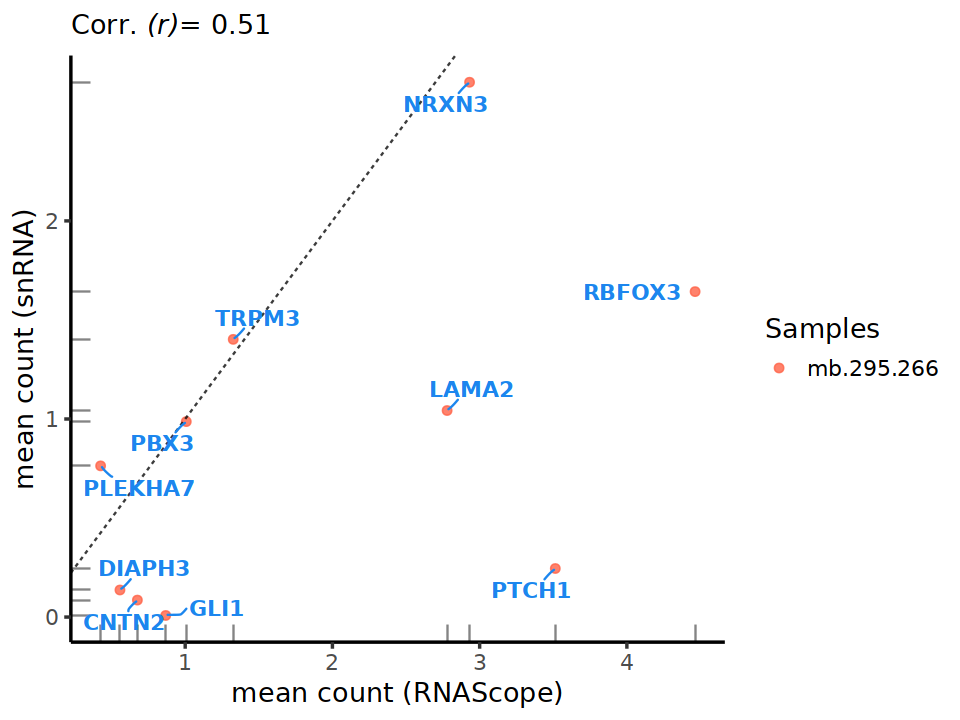

In [93]:
# RNAScope vs snRNA ----
pl1 <- 
  df.gene.tech %>% 
    # filter for > 50 cells per gene
    #filter(nCell_perGene.RNAScope > 50 &
    #       nCell_perGene.snRNA > 50) %>%
  ggplot(aes(x = meanCount_perGene.RNAScope,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &  
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6),
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 10, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.snRNA, 
                 gene) %>%
          #filter(meanCount_perGene.RNAScope > 5 | 
          #       meanCount_perGene.snRNA > 1.5) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.2, nudge_y = 0.2,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) & 
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (snRNA)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1

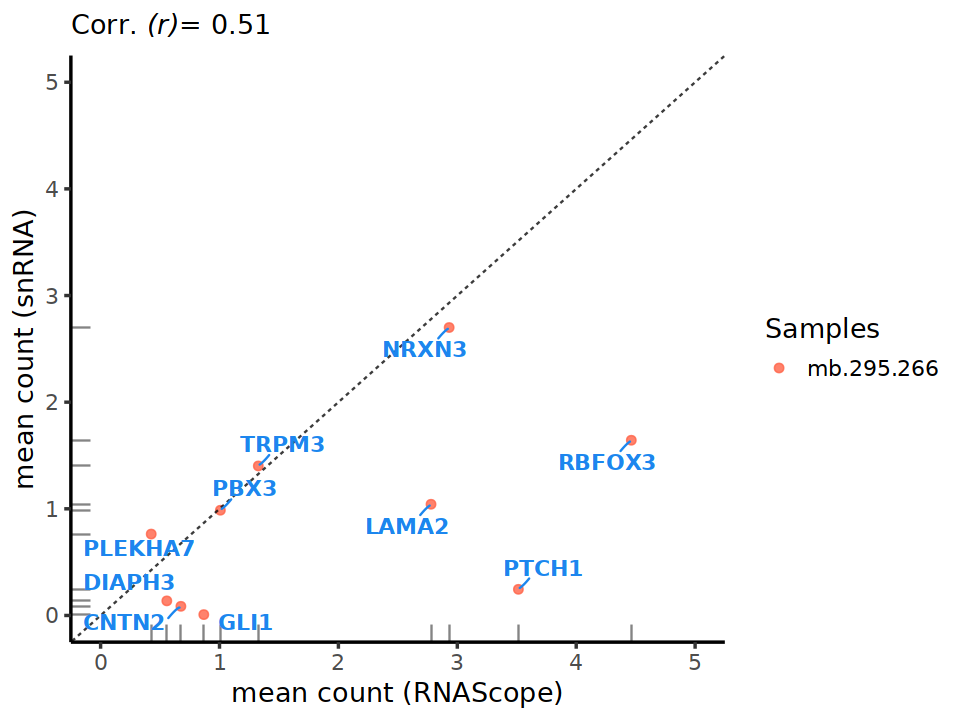

In [94]:
pl1.1 <-
pl1 & 
    xlim(c(0, 5)) &
    ylim(c(0, 5)) &
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.snRNA) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (snRNA)")
pl1.1

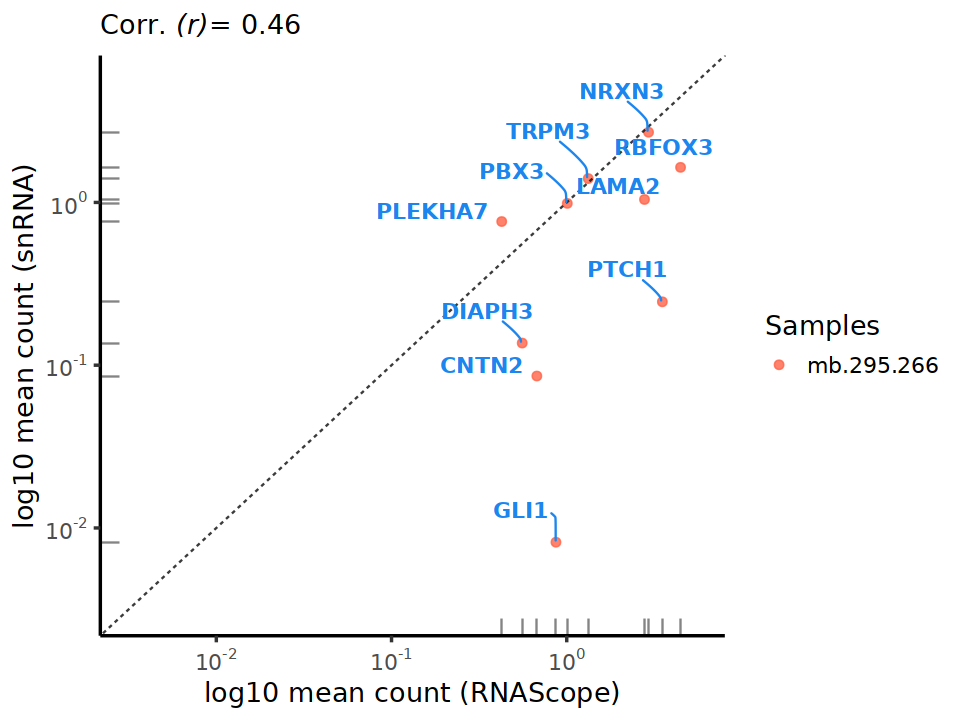

In [96]:
# RNAScope vs snRNA - log10 scale ----
pl1.2 <- 
  df.gene.tech %>%
  ggplot(aes(x = meanCount_perGene.RNAScope,
             y = meanCount_perGene.snRNA,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2),
  #                size = 0.6, bins = 15) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 5, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
  scale_x_continuous(trans = "log10", 
                     # add custom limits to have same scale
                     limits = c(10^-2.5, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  scale_y_continuous(trans = "log10", 
                     limits = c(10^-2.5, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.snRNA, 
                 gene) %>%
          distinct(),
    aes(label = gene), # data point size
    nudge_x = -0.2, nudge_y = 0.2,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.snRNA) %>%
                        # add pseudo count to all and log10 transform
                        mutate_all(., ~ (.x %>% log10)) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "log10 mean count (RNAScope)", y = "log10 mean count (snRNA)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

<span style="font-size:11pt; color:gold"> Save scatter plots - (RNAScope vs snRNA) *genes* </span> 

In [99]:
## save plots
dir_path <- "./fig4/panel_X/"
#.pdf
pl <- 
    list(pl1.1, pl1.2)
message("..saving plots - `.pdf`")  
mclapply(pl %>% seq, function(i) {
    ggsave(pl[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.RNAScope.snRNA_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.RNAScope.snRNA_1.pdf" "mben.RNAScope.snRNA_2.pdf"

##### <span style="font-size:12pt; color:tomato"> RNAScope vs Vizgen </span>

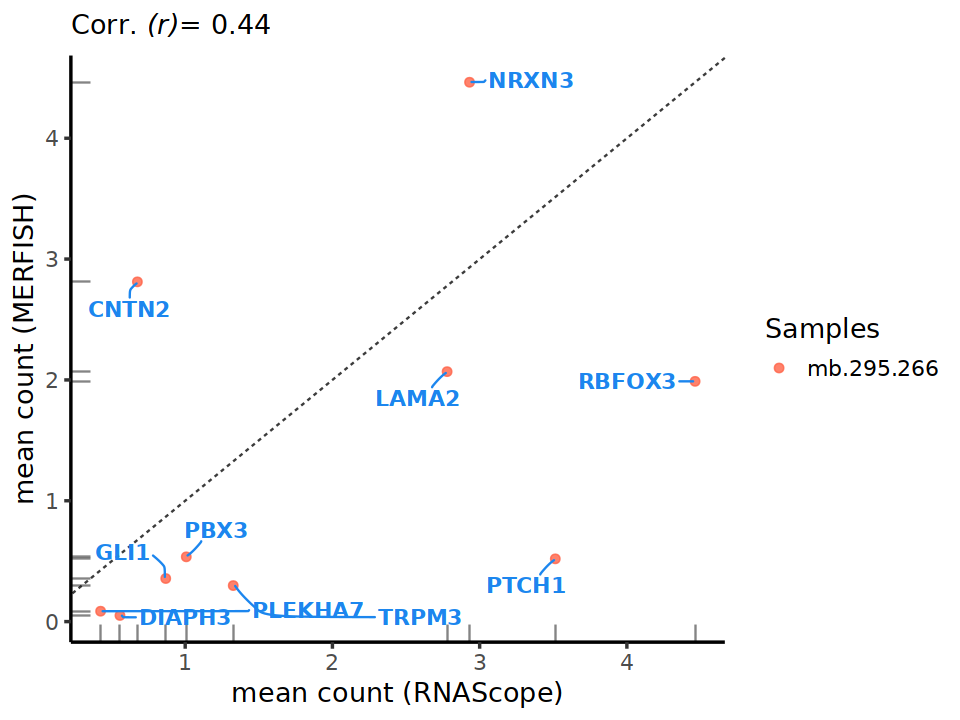

In [101]:
# RNAScope vs Vizgen ----
pl1 <- 
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.RNAScope,
             y = meanCount_perGene.MERFISH,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 5, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.MERFISH, 
                 gene) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = 0.6, nudge_y = 0.1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.7,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &   
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.MERFISH) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (MERFISH)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1

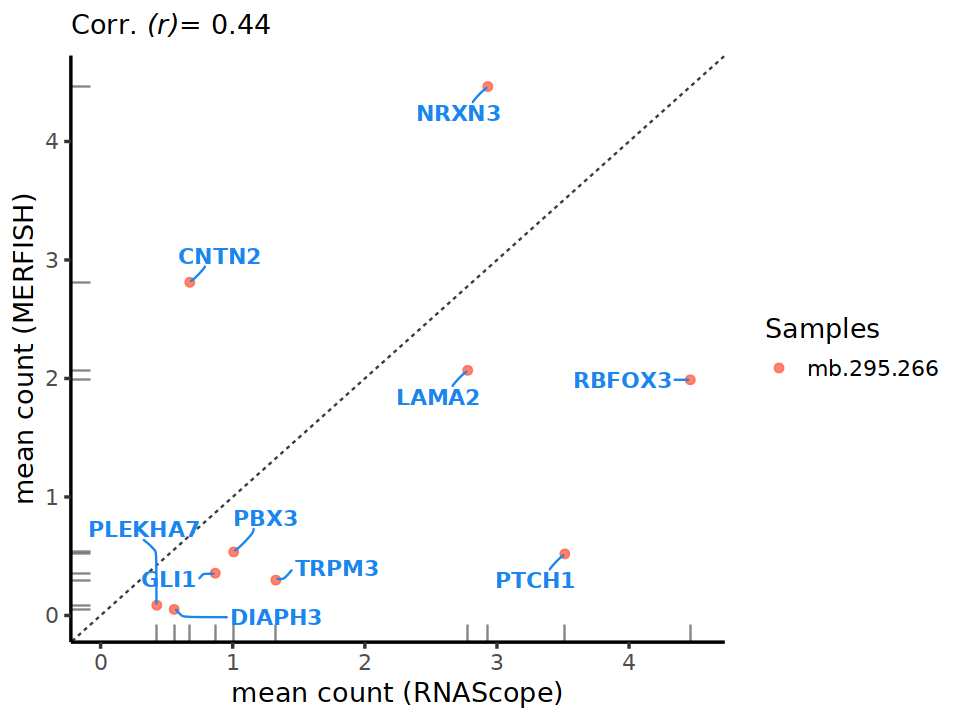

In [103]:
pl1.1 <-
pl1 & 
    xlim(c(0, 4.5)) &
    ylim(c(0, 4.5)) &
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.MERFISH) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (MERFISH)")
pl1.1

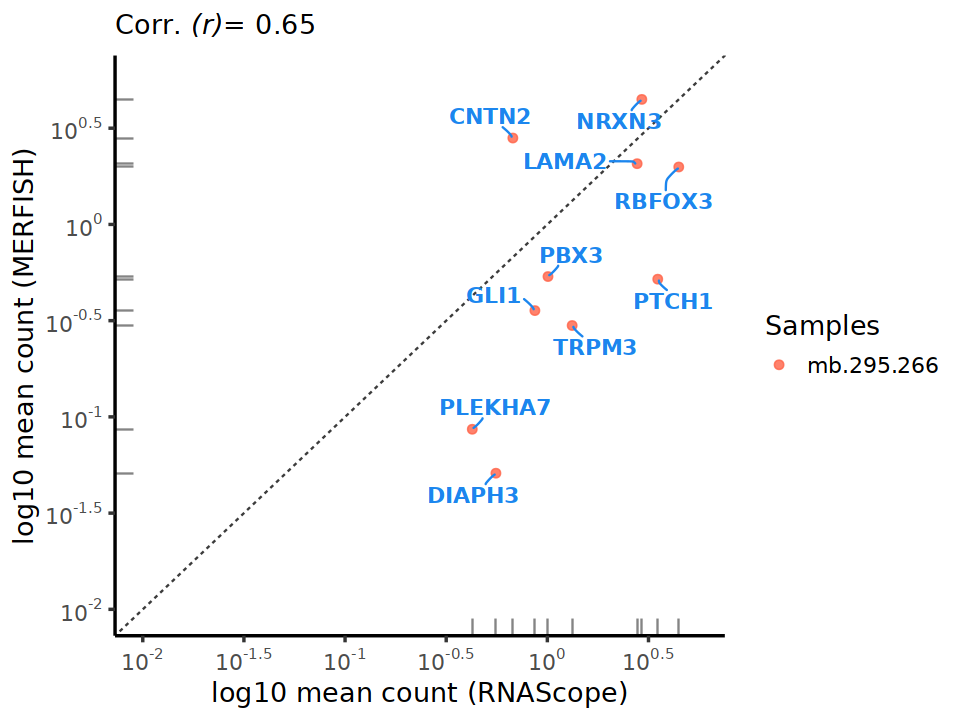

In [104]:
# RNAScope vs Vizgen - log10 scale ----
pl1.2 <- 
  df.gene.tech %>%
  ggplot(aes(x = meanCount_perGene.RNAScope ,
             y = meanCount_perGene.MERFISH,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2),
  #                size = 0.6, bins = 15) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) & 
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 5, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
  scale_x_continuous(trans = "log10", 
                     # add custom limits to have same scale
                     limits = c(10^-2, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  scale_y_continuous(trans = "log10", 
                     limits = c(10^-2, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.MERFISH, 
                 gene) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.2, nudge_y = 0.2,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.MERFISH) %>%
                        # add pseudo count to all and log10 transform
                        mutate_all(., ~ (.x %>% log10)) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "log10 mean count (RNAScope)", y = "log10 mean count (MERFISH)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

<span style="font-size:11pt; color:gold"> Save scatter plots - (RNAScope vs Vizgen) *genes* </span> 

In [105]:
## save plots
dir_path <- "./fig4/panel_X/"
#.pdf
pl <- 
    list(pl1.1, pl1.2)
message("..saving plots - `.pdf`")  
mclapply(pl %>% seq, function(i) {
    ggsave(pl[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.RNAScope.MERFISH_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.RNAScope.MERFISH_1.pdf" "mben.RNAScope.MERFISH_2.pdf"
[3] "mben.RNAScope.snRNA_1.pdf"   "mben.RNAScope.snRNA_2.pdf"

##### <span style="font-size:12pt; color:tomato"> RNAScope vs Resolve </span>

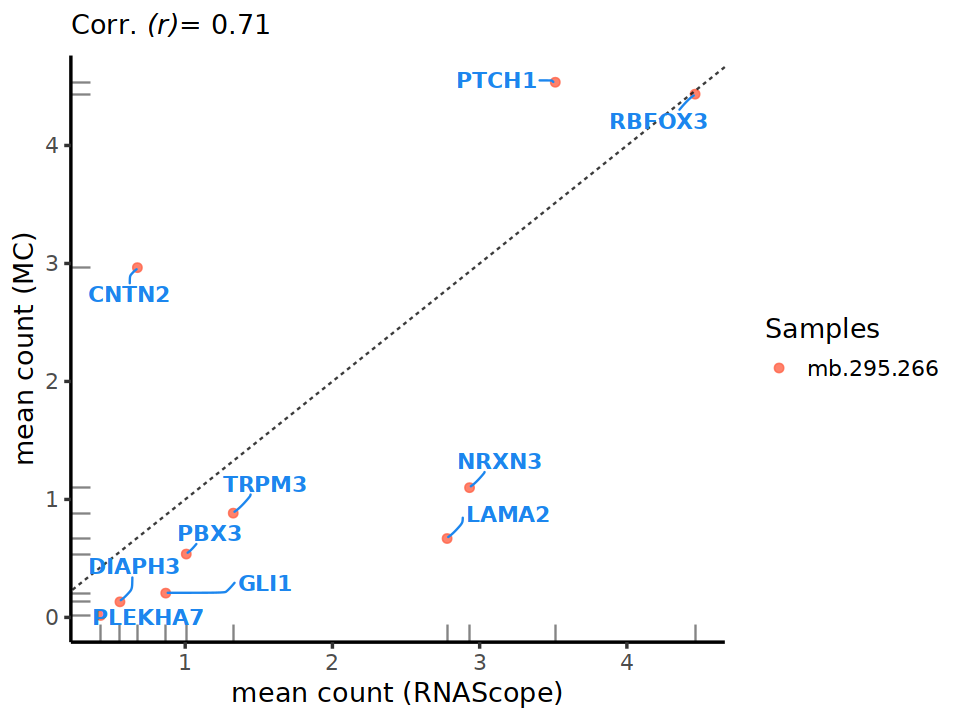

In [115]:
# RNAScope vs Resolve ----
pl1 <- 
  df.gene.tech %>% 
  ggplot(aes(x = meanCount_perGene.RNAScope,
             y = meanCount_perGene.MC,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("dodgerblue2", 0.6), 
  #                size = 0.6, bins = 30) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 5, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.MC, 
                 gene) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = 0.6, nudge_y = 0.1,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.7,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &   
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.MC) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (MC)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1

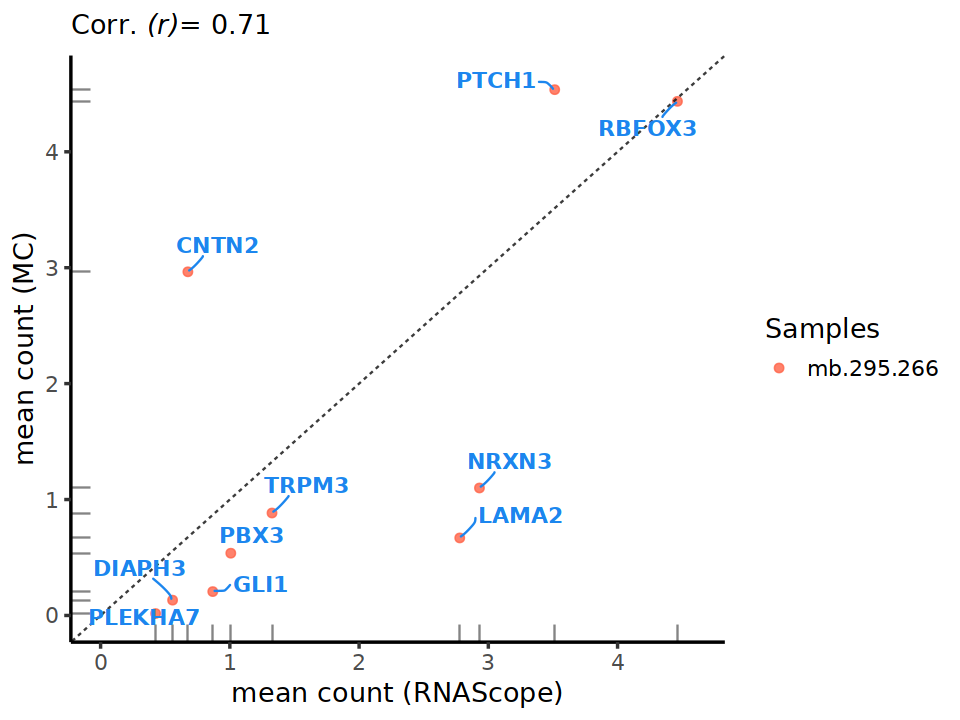

In [116]:
pl1.1 <-
pl1 & 
    xlim(c(0, 4.6)) &
    ylim(c(0, 4.6)) &
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.MC) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "mean count (RNAScope)", y = "mean count (MC)")
pl1.1

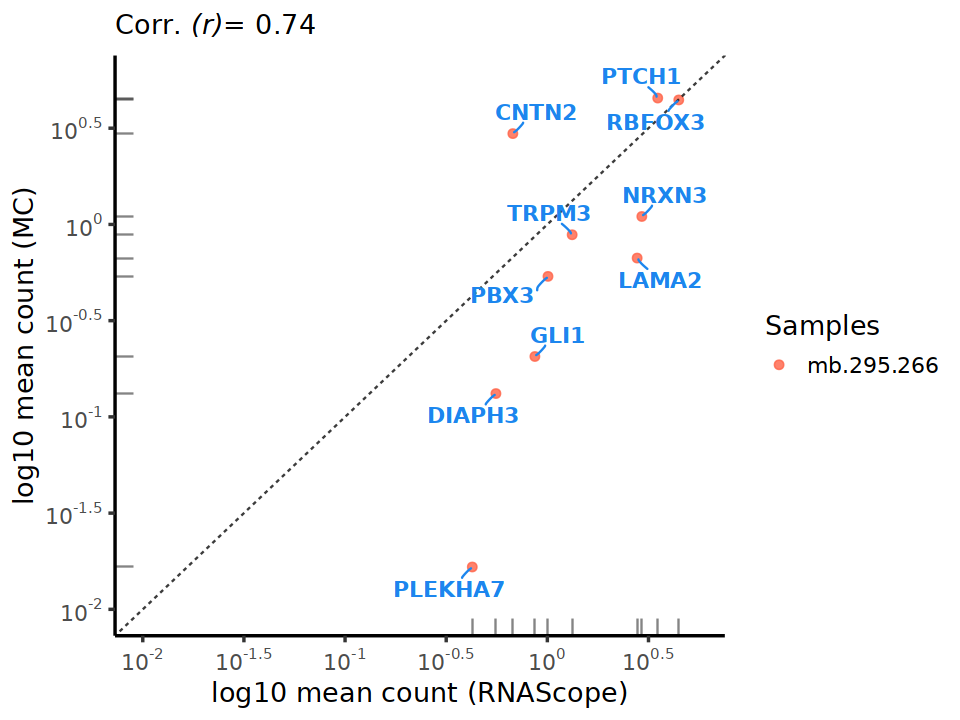

In [117]:
# RNAScope vs Resolve - log10 scale ----
pl1.2 <- 
  df.gene.tech %>%
  ggplot(aes(x = meanCount_perGene.RNAScope,
             y = meanCount_perGene.MC,
             color = samples
  )) &
  geom_point(size = 2,
             shape = 19) &
  #geom_density_2d(linetype = "longdash",
  #                col = alpha("gray4", 0.2),
  #                size = 0.6, bins = 15) &
  geom_rug(sides = "bl", color = alpha("gray4", 0.5)) &
  geom_abline(intercept = 0, linetype = "dashed", 
              color = "gray4", alpha = 0.8) &
  #stat_smooth(method = "gam", size = 0.8, se = TRUE, linetype = "solid",
  #            formula = y ~ s(x, k = 5, bs = "cr"), n = 40, na.rm = TRUE, 
  #            level = 0.95, alpha = 0.5, colour = alpha("gray4", 0.5)) & 
  scale_x_continuous(trans = "log10", 
                     # add custom limits to have same scale
                     limits = c(10^-2, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  scale_y_continuous(trans = "log10", 
                     limits = c(10^-2, 5.5),
                     breaks = trans_breaks("log10", function(x) 10^x),
                     labels = trans_format("log10", math_format(10^.x))
                                          ) &
  #annotation_logticks() &
  theme_classic(base_size = 16) &
  scale_color_manual(name = "Samples", 
                     values = alpha("tomato", 0.8)) &  
  ggrepel::geom_text_repel(
    data = 
      df.gene.tech %>% 
          select(meanCount_perGene.RNAScope,
                 meanCount_perGene.MC, 
                 gene) %>%
          distinct(),
    aes(label = gene), # data point size
    #nudge_x = -0.2, nudge_y = 0.2,                     
    color = alpha("dodgerblue2", 1), 
    size = 4.5, # font size in the text labels
    box.padding = 0.5,
    segment.curvature = -0.2,
    segment.linetype = 1,
    #max.overlaps = Inf,
    segment.ncp = 4,
    segment.angle = 20,
    fontface = "bold"
  ) &               
  labs(subtitle = 
         bquote("Corr." ~ italic("(r)=") ~ 
                  .(df.gene.tech %>% 
                        select(meanCount_perGene.RNAScope,
                               meanCount_perGene.MC) %>%
                        # add pseudo count to all and log10 transform
                        mutate_all(., ~ (.x %>% log10)) %$%
                        cor(x = ., y = .) %>% .[2] %>% 
                        round(digits = 2))),
       x = "log10 mean count (RNAScope)", y = "log10 mean count (MC)") 
options(repr.plot.height = 6, repr.plot.width = 8)
pl1.2

<span style="font-size:11pt; color:gold"> Save scatter plots - (RNAScope vs Resolve) *genes* </span> 

In [118]:
## save plots
dir_path <- "./fig4/panel_X/"
#.pdf
pl <- 
    list(pl1.1, pl1.2)
message("..saving plots - `.pdf`")  
mclapply(pl %>% seq, function(i) {
    ggsave(pl[[i]] &
               theme(plot.background = element_rect(fill = "white", color = "white")),
           file = paste0(dir_path, "mben.RNAScope.MC_", i, ".pdf"), 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 9, dpi = 200)
    }, mc.cores = mc.cores) %>% invisible
dev.off()
message("..saving plots - done!")
list.files(dir_path)

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



[1] "mben.RNAScope.MC_1.pdf"      "mben.RNAScope.MC_2.pdf"     
[3] "mben.RNAScope.MERFISH_1.pdf" "mben.RNAScope.MERFISH_2.pdf"
[5] "mben.RNAScope.snRNA_1.pdf"   "mben.RNAScope.snRNA_2.pdf"

#### <span style="font-size:12pt; color:gold"> QCs - *per cell* </span>
<span style="font-size:10pt; color:tomato"> Prepara data for plots - *cells* </span> <br /> 

In [195]:
# subset object metadata with selected vars..
df.data <- 
    getMeta(obj) %>%
    select(all_of(c(meta.vars, meta.var.use))) %>%
    # merge MB285, update 10X namings
    mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = "") %>%
                     gsub(pattern = "10Xsn", 
                          replacement = "snRNA", .),
           spatial_tech = stringi::stri_replace_all_regex(spatial_tech, 
                                pattern = "10Xsn", 
                                replacement = "snRNA"))

# check if percent_* metavars exist in the object
if (!any(grep("percent_", names(df.data)))) {
  message("`percent_*` metavars are not present..", "\n", 
          "consider running `PercentageFeatureSet()` ")
} else {  
  message("Already present:", 
          paste0("\n", ">>> ", grep("percent_", names(df.data), value = TRUE)))
  # add log10 scale to percent_*
  add.logs <- TRUE # if TRUE, will. calculate log10(x + 1)
  if (add.logs) {
    df.id <- grep("percent_", names(df.data))
    for (i in df.id %>% length %>% seq) {
      if (!any(paste0(names(df.data[df.id[i]]), ".", "log10_1p") == names(df.data))) {
        if (any(df.data[[df.id[i]]] == 0)) {
          # convert and add pseudocount  
          df.data[[paste0(names(df.data[df.id[i]]), ".", "log10_1p")]] <- log10(df.data[[df.id[i]]] + 1)
        } else { df.data[[paste0(names(df.data[df.id[i]]), ".", "log10_1p")]] <- log10(df.data[[df.id[i]]]) }
      }
    }
  }
}

## for spatial_tech and samples
# bring same samples together
samples.merge <- 
    df.data %>% 
    pull(samples) %>% 
    unique #%>% 
    #gsub("mb", x = ., "")
# start with mb263 and mb299
# order snRNA-seq, Visium (if present), RNAscope, MC, MERFISH and Xenium
samples.merge <- 
    list(
samples.merge %>% 
    #unique %>% 
    rev %>%
    grep("263", ., value = TRUE) %>% .[c(2,3,1)],
samples.merge %>% 
    #unique %>% 
    rev %>%
    grep("299", ., value = TRUE) %>% .[c(2,3,1)],

samples.merge %>% 
    #unique %>% 
    rev %>%
    grep("263|299", ., value = TRUE, invert = TRUE) %>%
    grep("266", ., value = T) %>% .[c(2,3,4,1)],

samples.merge %>% 
    #unique %>% 
    rev %>%
    grep("263|299", ., value = TRUE, invert = TRUE) %>%
    grep("295", ., value = TRUE) %>% .[c(2,3,4,1)]

) %>% unlist
samples.merge %>% str

df.data %<>% 
    #..sample names as factors
    mutate(samples = 
           factor(samples, levels = 
                  samples.merge %>% unique),
           #..spatial techs as factors
           spatial_tech = factor(spatial_tech, levels = 
                                 spatial_tech %>% 
                                 unique %>% rev)) %>%
    # add total cell number per sample
    group_by(samples) %>%
    group_split() %>%
    purrr::map(., ~ mutate(., nCells.samples = summarize(., n.cells = n()) %>% 
                           pull(n.cells))) %>% 
    data.table::rbindlist(.)
df.data %>% str

# re-set QC variables adding percent_* at log scale
if (any(grep(".log", names(df.data)))) {
    meta.vars.df <- unique(c(meta.vars, grep("nCount_|nFeature_|percent_|nCells", names(df.data), value = TRUE)))
    message("Re-set QC variables", "\n",  "New QC variables are:", paste0("\n", ">>> ", meta.vars.df))
} else { meta.vars.df <- unique(c(meta.vars, grep("nCount_|nFeature_|nCells", names(df.data), value = TRUE))) }

# generate breaks and limits for color scale
# examples -> [biscale breaks](https://cran.r-project.org/web/packages/biscale/vignettes/breaks.html) 
#[lemon legends](https://cran.r-project.org/web/packages/biscale/vignettes/breaks.html)
n.pretty <- 40
breaks.col <- 
lapply(seq(meta.vars.df),
       function(i) { 
           classInt::classIntervals(c(min(df.data[[meta.vars.df[i]]][!is.na(df.data[[meta.vars.df[i]]])]), 
                                      pretty(df.data[[meta.vars.df[i]]][!is.na(df.data[[meta.vars.df[i]]])], n = n.pretty)[-1] %>% 
                                      sort %>% unique),
                                    n = 2, style = "quantile")$brks %>% ceiling %>% unique }
      )
breaks.col  

adjust.logs <- TRUE # if TRUE, will adjust values for log10 only
if (adjust.logs && exists("add.logs")) {
  if (any(grep("log10", meta.vars.df))) {
    for (j in grep("log10", meta.vars.df)) {
      breaks.col[[j]] <- 
        classInt::classIntervals(c(min(df.data[[meta.vars.df[j]]][!is.na(df.data[[meta.vars.df[j]]])]), 
                                   pretty(df.data[[meta.vars.df[j]]][!is.na(df.data[[meta.vars.df[j]]])], n = n.pretty)[-1] %>% 
                                     sort %>% unique), 
                                 n = 2, style = "quantile")$brks %>% round(digits = 2) %>% unique 
    }
  }
  breaks.col
}

# round breaks.col and add K to breaks.col.label for large values > 1000
breaks.col.label <- breaks.col 
breaks.col.label <- 
lapply(breaks.col.label, function(i) 
    scales::number(i, 
               scale_cut = scales::cut_long_scale()))
#for (i in seq(breaks.col)) {
#    if (isFALSE(length(lapply(seq(breaks.col), function(i) which(breaks.col[[i]] >= 1000))[[i]]) == 0))
#        { breaks.col.label[[i]] <- c(breaks.col[[i]][which(breaks.col[[i]] < 1000)] %>% round(),
#                                     paste0(c(breaks.col[[i]][which(breaks.col[[i]] >= 1000)] / 1000) %>% 
#                                            round(digits = 1), "K"))
#        } else { breaks.col.label[[i]] %<>% as.character }
#}                                                       
breaks.col.label
                              
# fuse log and non-log scaled values
if (exists("add.logs")) {
  for (i in grep(".log", meta.vars.df)) {
    # add 0(1), ie log scale(real value)
    #breaks.col.label[[i]][1] <- paste0(breaks.col.label[[i]][1], "(", 1, ")")
    
    if (any(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)) {
      breaks.col.label[[i]][which(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)] <- 
        paste0(breaks.col.label[[i]][which(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)], "(", 
               paste0(c(10^breaks.col[[i]][which(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)] / 1000) %>% 
                        round(digits = 1), "K"), ")") 
    }
    if (any(10^breaks.col[[i]] >= 1e6)) 
    { breaks.col.label[[i]][which(10^breaks.col[[i]] >= 1e6)] <- 
      paste0(breaks.col[[i]][which(10^breaks.col[[i]] >= 1e6)], "(", 
             paste0(c(10^breaks.col[[i]][which(10^breaks.col[[i]] >= 1e6)] / 1e6) %>% 
                      round(digits = 1), "M"), ")")
    } else if (any(10^breaks.col[[i]] < 1000)) { 
      breaks.col.label[[i]][which(10^breaks.col[[i]] < 1000)] <- 
        paste0(breaks.col.label[[i]][which(10^breaks.col[[i]] < 1000)], "(", 
               10^breaks.col[[i]][which(10^breaks.col[[i]] < 1000)] %>% ceiling, ")") 
    }
  }
}
breaks.col.label
                              
# add limits
limits <- lapply(seq(meta.vars.df), function(i) 
    #c(min(breaks.col[[i]]), max(breaks.col[[i]]))
    range(breaks.col[[i]])
                 )
limits

message("Calculating summary stats - median")
# median values per sample
df.data.filt <- 
df.data %>%
dplyr::group_by_at(meta.var) %>% 
summarize_if(is.numeric, ~ median(.) %>% round(digits = 0), na.rm = TRUE)
df.data.filt

message("Calculating summary stats - sd")
# sd or variance values per sample
df.data %>%
dplyr::group_by_at(meta.var) %>% 
summarise_if(is.numeric, ~ sd(.) %>% round(digits = 0), na.rm = TRUE)
                 
message("..using metadata variable - ", meta.var,
       if (use.dark.theme) { 
           "\n..using Dark Theme" }
       else { "\n..using White Theme" } , "\n",
        paste0("'", use.colors.opt, "'"), " color scale")
                              

`percent_*` metavars are not present..
consider running `PercentageFeatureSet()` 



 chr [1:14] "mb263.snRNA" "mb263.MC" "mb263.Xenium" "mb299.snRNA" ...
Classes ‘data.table’ and 'data.frame':	948244 obs. of  8 variables:
 $ nCount_MultiTech  : num  17 30 15 77 50 44 54 25 38 35 ...
 $ nFeature_MultiTech: int  10 16 11 28 14 20 12 14 19 22 ...
 $ nCount_SCT        : num  41 50 45 64 53 52 56 50 51 52 ...
 $ nFeature_SCT      : int  11 16 14 28 14 20 12 15 19 22 ...
 $ orig.ident        : chr  "mb263.10Xsn" "mb263.10Xsn" "mb263.10Xsn" "mb263.10Xsn" ...
 $ samples           : Factor w/ 14 levels "mb263.snRNA",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ spatial_tech      : Factor w/ 4 levels "Xenium","snRNA",..: 2 2 2 2 2 2 2 2 2 2 ...
 $ nCells.samples    : int  2937 2937 2937 2937 2937 2937 2937 2937 2937 2937 ...
 - attr(*, ".internal.selfref")=<externalptr> 


[[1]]
[1]    1  650 1300

[[2]]
[1]  1 38 76

[[3]]
[1] 29 52 74

[[4]]
[1]  1 24 47

[[5]]
[1]   2937 132500 265000

[[1]]
[1] "1"   "650" "1K" 

[[2]]
[1] "1"  "38" "76"

[[3]]
[1] "29" "52" "74"

[[4]]
[1] "1"  "24" "47"

[[5]]
[1] "3K"   "132K" "265K"

[[1]]
[1] "1"   "650" "1K" 

[[2]]
[1] "1"  "38" "76"

[[3]]
[1] "29" "52" "74"

[[4]]
[1] "1"  "24" "47"

[[5]]
[1] "3K"   "132K" "265K"

[[1]]
[1]    1 1300

[[2]]
[1]  1 76

[[3]]
[1] 29 74

[[4]]
[1]  1 47

[[5]]
[1]   2937 265000

Calculating summary stats - median



samples,nCount_MultiTech,nFeature_MultiTech,nCount_SCT,nFeature_SCT,nCells.samples
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
mb263.snRNA,30,15,50,15,2937
mb263.MC,53,15,55,15,32106
mb263.Xenium,50,21,54,21,83174
mb299.snRNA,15,10,43,14,5575
mb299.MC,69,18,60,17,30962
mb299.Xenium,49,20,54,20,262161
mb266.snRNA,35,15,51,16,3015
mb266.MC,63,19,60,18,34625
mb266.MERFISH,77,26,61,22,61514


Calculating summary stats - sd



samples,nCount_MultiTech,nFeature_MultiTech,nCount_SCT,nFeature_SCT,nCells.samples
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
mb263.snRNA,18,5,6,4,0
mb263.MC,39,6,8,4,0
mb263.Xenium,44,8,7,6,0
mb299.snRNA,11,5,5,3,0
mb299.MC,39,6,6,4,0
mb299.Xenium,32,7,7,6,0
mb266.snRNA,19,5,6,4,0
mb266.MC,38,6,7,5,0
mb266.MERFISH,76,12,9,6,0


..using metadata variable - samples
..using White Theme
'fire' color scale



<span style="font-size:12pt; color:tomato"> Generate density plots - *cells* </span>  <br /> 
<span style="font-size:10pt; color:steelblue">..density colors are number of cells per sample! </span>

In [196]:
# Density colors are number of cells per sample!
# added QC variables for percent_* at log10 (+ pseudocount if any zeros) scale
message("Generate density plots per meta variable: ", meta.var, "\n",  
        "New QC variables are:", paste0("\n", ">>> ", meta.vars.df))

# ..legend/title for meta vars
meta.vars.legend <- gsub(pattern = paste0("_", Assays(obj) %>% 
                                              grep("SCT", ., 
                                                   value = TRUE, 
                                                   invert = TRUE)), 
                         replacement = "", meta.vars.df)
#meta.vars.legend <-
#c(grep("^n", meta.vars.legend, value = TRUE), 
#  gsub(pattern = "percent_", replacement = "", grep("percent_", meta.vars.legend, value = TRUE)) %>%
#  stringr::str_to_title() %>% paste0(". content (%)"))
# adjust for log meta vars
if (any(grep(".log", meta.vars.legend))) { 
    for (i in grep("log", meta.vars.legend)) { 
        meta.vars.legend[i] <- 
        gsub(pattern = ". content|[(%)]", replacement = "", meta.vars.legend[i]) %>% 
        paste0("(%) content")
    }
}

# for stat_density_ridges
scale.param <- c(rep(0.9, length(meta.vars.df)))
#scale.param <- c(1.3, rep(1, 4))

# for geom_text_repel label
# NOTE: custom labels, need to be optimized then added samples or vars
nudge_x <- c(30, 13, 8, 8, 8)
nudge_y <- c(0.4, 0.6, 0.6, 0.6, 0.6)

# function to check if any meta vars have logs
check.if.log <- function(x) { grep(".log", meta.vars.df[x]) }

# breaks for total samples per cell
breaks.label.samples <- 
    scales::number(df.data$nCells.samples %>% unique %>% sort, accuracy = 0.1, 
                   scale_cut = scales::cut_long_scale())

# generate plots 
set.seed(47654)
pl1 <- lapply(seq(meta.vars.df)[-5], # irnoge the last var
              function(i) df.data %>%
              ggplot(aes_string(x = meta.vars.df[i], y = meta.var, fill = "factor(nCells.samples)")) &
              stat_density_ridges(geom = "density_ridges_gradient", 
                                  quantile_lines = TRUE, 
                                  quantile_fun = function(x, ...) 
                                      { median(x) %>% round(digits = 0) }, # add median value
                                  bandwidth = NULL,
                                  scale = scale.param[i],
                                  aes_string(point_fill = "nCells.samples", 
                                             point_color = "nCells.samples"),
                                  point_size = 0.05,
                                  point_shape = 19, point_alpha = 1,
                                  # cut the long tail at ~200 for the count and at ~60 for the feature plot
                                  to = c(200, 60, 20, 10, 10)[i],
                                      #df.data %>% 
                                      #pull(meta.vars.df[i]) %>% 
                                      #max(na.rm = TRUE) %>% 
                                      #round(digits = 1),
                                  color = color.dens %>% alpha(0), 
                                  #size = 0.1, linetype = "solid",
                                  jittered_points = FALSE, # NOTE, if a lot of cells, set it to FASLE
                                  position = position_raincloud(height = 0.1)
                                 ) & 
              # add ticks
              { if (any(check.if.log(i))) {
                  annotation_logticks(color = axis.text.col, sides = "b") 
              }} &
              #scale_x_continuous(limits = limits[[i]], 
              #                   breaks = if (!any(check.if.log(i))) { breaks.col[[i]] } else { waiver() },
              #                   labels = if (!any(check.if.log(i))) { breaks.col.label[[i]] } else { waiver() }
              #                   ) &
              scale_point_color_gradient(low = low.col,
                                         high = high.col,
                                         limits = limits[[5]], 
                                         breaks = if (!any(check.if.log(i))) { breaks.col[[5]] } else { waiver() },
                                         labels = if (!any(check.if.log(i))) { breaks.col.label[[5]] } else { waiver() }
                                        ) &
              scale_fill_manual(name = c("Total Cells"), 
                                labels = breaks.label.samples,
                                values = cet_pal(20, name = use.colors.opt)[-2]) &
              theme2use &
              theme(legend.text = element_text(size = legend.text.size),
                    axis.text = element_text(color = axis.text.col, size = axis.text.size),
                    legend.position = "right",
                    legend.key.height = grid::unit(0.5,"cm"),
                    legend.key.width = grid::unit(0.8,"cm")) & 
              labs(title = meta.vars.legend[i],
                   subtitle = rep("per Cell", meta.vars.df %>% length)[i],
                   x = NULL, y = NULL, fill = NA) &
              ggrepel::geom_text_repel(data = df.data.filt, # add pre-calculated median line and value
                                       aes_string(x = meta.vars.df[i], 
                                                  y = meta.var, label = meta.vars.df[i]),
                                       size = 5, nudge_x = nudge_x[i], nudge_y = nudge_y[i],
                                       color = color.dens,
                                       box.padding = 0.2,
                                       segment.curvature = -0.4,
                                       segment.linetype = 2,
                                       max.overlaps = Inf,
                                       segment.ncp = 4,
                                       segment.angle = 20,
                                       fontface = "bold"
                                      )
             )

Generate density plots per meta variable: samples
New QC variables are:
>>> nCount_MultiTech
>>> nFeature_MultiTech
>>> nCount_SCT
>>> nFeature_SCT
>>> nCells.samples



Picking joint bandwidth of 0.736



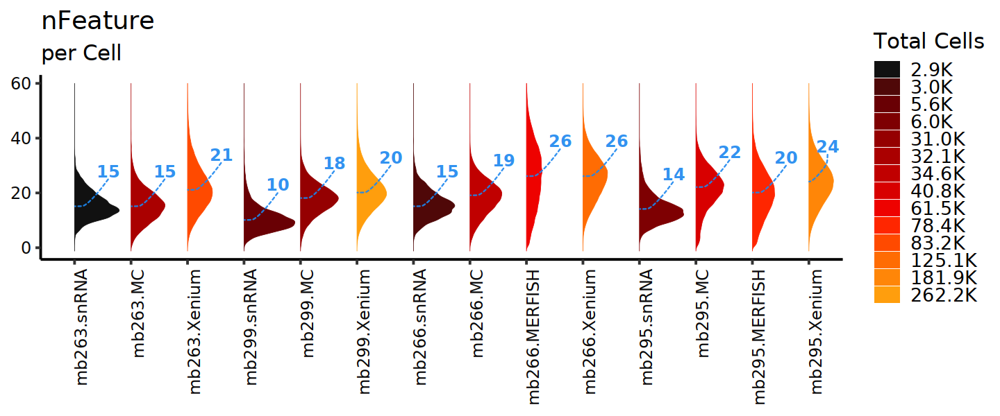

In [198]:
options(repr.plot.height = 5, repr.plot.width = 12)
i <- 2
pl1[[i]] & 
    theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
          plot.background = element_rect(fill = "white", color = "white")
         ) &
    coord_flip()

In [ ]:
# Density colors are number of cells per sample - Violin plot
# added QC variables for percent_* at log10 (+ pseudocount if any zeros) scale
message("Generate density plots per meta variable: ", meta.var, "\n",  
        "New QC variables are:", paste0("\n", ">>> ", meta.vars.df))

# ..legend/title for meta vars
meta.vars.legend <- gsub(pattern = paste0("_", Assays(obj) %>% 
                                              grep("SCT", ., 
                                                   value = TRUE, 
                                                   invert = TRUE)), 
                         replacement = "", meta.vars.df)
#meta.vars.legend <-
#c(grep("^n", meta.vars.legend, value = TRUE), 
#  gsub(pattern = "percent_", replacement = "", grep("percent_", meta.vars.legend, value = TRUE)) %>%
#  stringr::str_to_title() %>% paste0(". content (%)"))
# adjust for log meta vars
if (any(grep(".log", meta.vars.legend))) { 
    for (i in grep("log", meta.vars.legend)) { 
        meta.vars.legend[i] <- 
        gsub(pattern = ". content|[(%)]", replacement = "", meta.vars.legend[i]) %>% 
        paste0("(%) content")
    }
}

# for geom_text_repel label
# NOTE: custom labels, need to be optimized then added samples or vars
nudge_x <- c(110, 13, 8, 8, 8)
nudge_y <- c(0.5, 0.4, 0.6, 0.6, 0.6)

# function to check if any meta vars have logs
check.if.log <- function(x) { grep(".log", meta.vars.df[x]) }

# breaks for total samples per cell
breaks.label.samples <- 
    scales::number(df.data$nCells.samples %>% unique %>% sort, accuracy = 0.1, 
                   scale_cut = scales::cut_long_scale())

# generate plots
set.seed(47654)
pl1 <- lapply(seq(meta.vars.df)[-5], # irnoge the last var
              function(i) df.data %>%
              ggplot(aes_string(x = meta.vars.df[i], y = meta.var)) &
              geom_violin(aes_string(fill = "factor(nCells.samples)"), scale = "width") &
              # add ticks
              { if (any(check.if.log(i))) {
                  annotation_logticks(color = axis.text.col, sides = "b") 
              }} &
              scale_x_continuous(limits = limits[[i]], 
                                 breaks = if (!any(check.if.log(i))) { breaks.col[[i]] } else { waiver() },
                                 labels = if (!any(check.if.log(i))) { breaks.col.label[[i]] } else { waiver() }
                                 ) &
              scale_fill_manual(name = c("Total Cells"), 
                                labels = breaks.label.samples,
                                values = cet_pal(20, name = use.colors.opt)[-2]) &
              theme2use &
              theme(legend.text = element_text(size = legend.text.size),
                    axis.text = element_text(color = axis.text.col, size = axis.text.size),
                    legend.position = "right",
                    legend.key.height = grid::unit(0.6,"cm"),
                    legend.key.width = grid::unit(0.4,"cm")) & 
              labs(title = meta.vars.legend[i],
                   subtitle = rep("per Cell", meta.vars.df %>% length)[i],
                   x = NULL, y = NULL, fill = NA) &
              ggrepel::geom_text_repel(data = df.data.filt, # add pre-calculated median line and value
                                       aes_string(x = meta.vars.df[i], 
                                                  y = meta.var, label = meta.vars.df[i]),
                                       size = 5, nudge_x = nudge_x[i], nudge_y = nudge_y[i],
                                       color = color.dens,
                                       box.padding = 0.2,
                                       segment.curvature = -0.4,
                                       segment.linetype = 2,
                                       max.overlaps = Inf,
                                       segment.ncp = 4,
                                       segment.angle = 20,
                                       fontface = "bold"
                                      )
             )

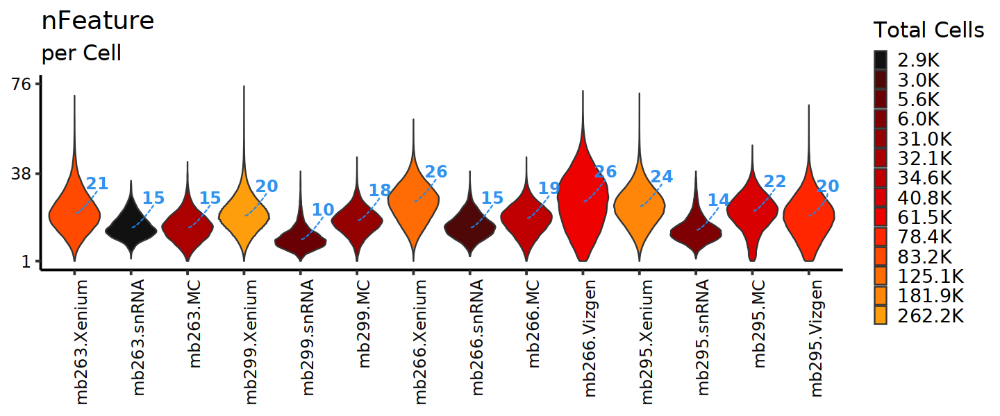

In [34]:
# Violins instead
options(repr.plot.height = 5, repr.plot.width = 12)
i <- 2
pl1[[i]] & 
    theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
          plot.background = element_rect(fill = "white", color = "white")
         ) &
    coord_flip()

##### <span style="font-size:12pt; color:gold"> Save QC plots - per meta variable</span>
<span style="font-size:11pt; color:tomato"> ..density plots - *cells* </span> 

In [200]:
## save plots
dir_path <- "./fig3/panel_C/"
if (FALSE) { # set to TRUE to save .png as well
  #.png
  message("..saving plots - `.png`")  
  mclapply(pl1 %>% seq, function(i) {
    ggsave({ if (use.dark.theme) { 
      pl1[[i]] & 
        theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
              plot.background = element_rect(fill = "black", 
                                             color = "black")) & 
        coord_flip()
    } else { pl1[[i]] & 
        theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
              plot.background = element_rect(fill = "white", color = "white")) & 
        coord_flip() }
    },
    file = paste0(dir_path, "mben.", meta.vars.df, "_white", ".png")[i], 
    device = "png",
    #bg = "transparent",
    height = 5, width = 10, dpi = 200)
  }, mc.cores = mc.cores) %>% invisible
  } 

#.pdf only first 2 plots
message("..saving plots - `.pdf`")  
mclapply(pl1[1:2] %>% seq, function(i) {
    ggsave({ if (use.dark.theme) { 
        pl1[[i]] & 
        theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
              plot.background = element_rect(fill = "black", 
                                             color = "black")) & 
        coord_flip()
    } else { pl1[[i]] & 
            theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
                 plot.background = element_rect(fill = "white", color = "white")) & 
            coord_flip() }
            },
           file = paste0(dir_path, "mben.", meta.vars.df, "_white", ".pdf")[i], 
           device = cairo_pdf,
           #bg = "transparent",
           height = 5, width = 10, dpi = 200)
}, mc.cores = mc.cores) %>% invisible

dev.off()
message("..saving plots - done!")

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



#### <span style="font-size:12pt; color:gold"> QCs - *per cell* (including RNAscope 10 genes obj) </span>
<span style="font-size:10pt; color:tomato"> Prepara data for plots - *cells* </span> <br /> 

In [202]:
# QC variables and plot params         
message("Setting QC variables and plot params..")
meta.vars <- grep("nCount_|nFeature_|percent_", names(getMeta(obj)), value = TRUE)
message("QC variables are :", paste0("\n", ">>> ", meta.vars))

# if TRUE - using whole obj name, else other metadata var.. 
meta.var.use <- c("orig.ident", "samples", "spatial_tech")
use.orig.ident <- FALSE
if (use.orig.ident) { meta.var <- "orig.ident" } else { meta.var <- "samples" }
#meta.var <- "spatial_tech"
meta.var

# add colors for meta var (ie samples) 
meta.var.col <- colorRampPalette(RColorBrewer::brewer.pal(10, "Paired"))(table(obj[[meta.var]]) %>%
 names %>% length)
meta.var.col %>% glimpse()

# title for meta.var
#paste0(substring(meta.var, 1, 1) %>% toupper, substring(meta.var, 2, nchar(meta.var)))
meta.var.title <- stringr::str_to_title(meta.var)

# custom text sizes for plots
legend.text.size <- 16
base_size <- 18
axis.text.size <- 14
   
# choose plot theme, eg dark or white
use.dark.theme <- FALSE # if FALSE - white bg is used for plots

# choose plot colors scheme..
use.colors.opt <- "fire" # options are: "inferno" or "fire"
# colors/fill scale gradient
if (use.dark.theme && use.colors.opt == "fire") {
    scale.col <- 
        cet_pal(11, name = use.colors.opt)[4:11] %>% .[c(1,3,5,6:8)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "fire") {
    scale.col <-
        cet_pal(11, name = use.colors.opt)[1:9] %>% .[c(1,3,5,6,7,9)] %>% rev
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:9)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:8)] %>% 
        rev %>% c("gray4")
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
}

# transparent theme for white bg
theme_transparent_2 <- theme(panel.background = element_rect(fill = "transparent"),
                             plot.background = element_rect(fill = "transparent", color = NA),
                             panel.grid.major = element_blank(), 
                             panel.grid.minor = element_blank(), 
                             legend.background = element_rect(fill = "transparent"))


Setting QC variables and plot params..

QC variables are :
>>> nCount_MultiTech
>>> nFeature_MultiTech



[1] "samples"

 chr [1:18] "#A6CEE3" "#5EA0CA" "#277EB1" "#75B49B" "#A3D77E" "#5FB64D" ...


Using White Theme & 'fire' color scale



In [203]:
# subset object metadata with selected vars..
df.data <- 
    getMeta(obj) %>%
    select(all_of(c(meta.vars, meta.var.use))) %>%
    # merge MB285, update 10X namings
    mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = "") %>%
                     gsub(pattern = "10Xsn", 
                          replacement = "snRNA", .) %>%
                     gsub("MB", "mb", .),
           spatial_tech = stringi::stri_replace_all_regex(spatial_tech, 
                                pattern = "10Xsn", 
                                replacement = "snRNA"))

# check if percent_* metavars exist in the object
if (!any(grep("percent_", names(df.data)))) {
  message("`percent_*` metavars are not present..", "\n", 
          "consider running `PercentageFeatureSet()` ")
} else {  
  message("Already present:", 
          paste0("\n", ">>> ", grep("percent_", names(df.data), value = TRUE)))
  # add log10 scale to percent_*
  add.logs <- TRUE # if TRUE, will. calculate log10(x + 1)
  if (add.logs) {
    df.id <- grep("percent_", names(df.data))
    for (i in df.id %>% length %>% seq) {
      if (!any(paste0(names(df.data[df.id[i]]), ".", "log10_1p") == names(df.data))) {
        if (any(df.data[[df.id[i]]] == 0)) {
          # convert and add pseudocount  
          df.data[[paste0(names(df.data[df.id[i]]), ".", "log10_1p")]] <- log10(df.data[[df.id[i]]] + 1)
        } else { df.data[[paste0(names(df.data[df.id[i]]), ".", "log10_1p")]] <- log10(df.data[[df.id[i]]]) }
      }
    }
  }
}

## for spatial_tech and samples
# bring same samples together
samples.merge <- 
    df.data %>% 
    pull(samples) %>% 
    unique
# start with mb263 and mb299
# order snRNA-seq, Visium (if present), RNAscope, MC, MERFISH and Xenium
samples.merge <- 
    list(
samples.merge %>% 
    #unique %>% 
    rev %>%
    grep("263", ., value = TRUE) %>% .[c(2,3,1)],
        
samples.merge %>%
    grep("299", ., value = TRUE) %>% .[c(2,3,1,4)],
        
samples.merge %>%
    grep("266", ., value = TRUE) %>% .[c(3,4,2,1,5)],
        
samples.merge %>%
    grep("295", ., value = TRUE) %>% .[c(3,4,2,1,5)]

) %>% unlist
samples.merge %>% str

df.data %<>% 
    #..sample names as factors
    mutate(samples = 
           factor(samples, levels = 
                  samples.merge %>% unique),
           #..spatial techs as factors
           spatial_tech = factor(spatial_tech, levels = 
                                 spatial_tech %>% 
                                 unique %>% rev)) %>%
    # add total cell number per sample
    group_by(samples) %>%
    group_split() %>%
    purrr::map(., ~ mutate(., nCells.samples = summarize(., n.cells = n()) %>% 
                           pull(n.cells))) %>% 
    data.table::rbindlist(.)
df.data %>% str

# re-set QC variables adding percent_* at log scale
if (any(grep(".log", names(df.data)))) {
    meta.vars.df <- unique(c(meta.vars, grep("nCount_|nFeature_|percent_|nCells", names(df.data), value = TRUE)))
    message("Re-set QC variables", "\n",  "New QC variables are:", paste0("\n", ">>> ", meta.vars.df))
} else { meta.vars.df <- unique(c(meta.vars, grep("nCount_|nFeature_|nCells", names(df.data), value = TRUE))) }

# generate breaks and limits for color scale
# examples -> [biscale breaks](https://cran.r-project.org/web/packages/biscale/vignettes/breaks.html) 
#[lemon legends](https://cran.r-project.org/web/packages/biscale/vignettes/breaks.html)
n.pretty <- 40
breaks.col <- 
lapply(seq(meta.vars.df),
       function(i) { 
           classInt::classIntervals(c(min(df.data[[meta.vars.df[i]]][!is.na(df.data[[meta.vars.df[i]]])]), 
                                      pretty(df.data[[meta.vars.df[i]]][!is.na(df.data[[meta.vars.df[i]]])], n = n.pretty)[-1] %>% 
                                      sort %>% unique),
                                    n = 2, style = "quantile")$brks %>% ceiling %>% unique }
      )
breaks.col  

adjust.logs <- TRUE # if TRUE, will adjust values for log10 only
if (adjust.logs && exists("add.logs")) {
  if (any(grep("log10", meta.vars.df))) {
    for (j in grep("log10", meta.vars.df)) {
      breaks.col[[j]] <- 
        classInt::classIntervals(c(min(df.data[[meta.vars.df[j]]][!is.na(df.data[[meta.vars.df[j]]])]), 
                                   pretty(df.data[[meta.vars.df[j]]][!is.na(df.data[[meta.vars.df[j]]])], n = n.pretty)[-1] %>% 
                                     sort %>% unique), 
                                 n = 2, style = "quantile")$brks %>% round(digits = 2) %>% unique 
    }
  }
  breaks.col
}

# round breaks.col and add K to breaks.col.label for large values > 1000
breaks.col.label <- breaks.col 
breaks.col.label <- 
lapply(breaks.col.label, function(i) 
    scales::number(i, 
               scale_cut = scales::cut_long_scale()))
#for (i in seq(breaks.col)) {
#    if (isFALSE(length(lapply(seq(breaks.col), function(i) which(breaks.col[[i]] >= 1000))[[i]]) == 0))
#        { breaks.col.label[[i]] <- c(breaks.col[[i]][which(breaks.col[[i]] < 1000)] %>% round(),
#                                     paste0(c(breaks.col[[i]][which(breaks.col[[i]] >= 1000)] / 1000) %>% 
#                                            round(digits = 1), "K"))
#        } else { breaks.col.label[[i]] %<>% as.character }
#}                                                                                                       
breaks.col.label
                              
# fuse log and non-log scaled values
if (exists("add.logs")) {
  for (i in grep(".log", meta.vars.df)) {
    # add 0(1), ie log scale(real value)
    #breaks.col.label[[i]][1] <- paste0(breaks.col.label[[i]][1], "(", 1, ")")
    
    if (any(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)) {
      breaks.col.label[[i]][which(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)] <- 
        paste0(breaks.col.label[[i]][which(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)], "(", 
               paste0(c(10^breaks.col[[i]][which(10^breaks.col[[i]] >= 1000 & !10^breaks.col[[i]] >= 1e6)] / 1000) %>% 
                        round(digits = 1), "K"), ")") 
    }
    if (any(10^breaks.col[[i]] >= 1e6)) 
    { breaks.col.label[[i]][which(10^breaks.col[[i]] >= 1e6)] <- 
      paste0(breaks.col[[i]][which(10^breaks.col[[i]] >= 1e6)], "(", 
             paste0(c(10^breaks.col[[i]][which(10^breaks.col[[i]] >= 1e6)] / 1e6) %>% 
                      round(digits = 1), "M"), ")")
    } else if (any(10^breaks.col[[i]] < 1000)) { 
      breaks.col.label[[i]][which(10^breaks.col[[i]] < 1000)] <- 
        paste0(breaks.col.label[[i]][which(10^breaks.col[[i]] < 1000)], "(", 
               10^breaks.col[[i]][which(10^breaks.col[[i]] < 1000)] %>% ceiling, ")") 
    }
  }
}
breaks.col.label
                              
# add limits
limits <- lapply(seq(meta.vars.df), function(i) 
    #c(min(breaks.col[[i]]), max(breaks.col[[i]]))
    range(breaks.col[[i]])
                 )
limits

message("Calculating summary stats - median")
# median values per sample
df.data.filt <- 
df.data %>%
dplyr::group_by_at(meta.var) %>% 
summarize_if(is.numeric, ~ median(.) %>% round(digits = 0), na.rm = TRUE)
df.data.filt

message("Calculating summary stats - sd")
# sd or variance values per sample
df.data %>%
dplyr::group_by_at(meta.var) %>% 
summarise_if(is.numeric, ~ sd(.) %>% round(digits = 0), na.rm = TRUE)
                 
message("..using metadata variable - ", meta.var,
       if (use.dark.theme) { 
           "\n..using Dark Theme" }
       else { "\n..using White Theme" } , "\n",
        paste0("'", use.colors.opt, "'"), " color scale")
                              

`percent_*` metavars are not present..
consider running `PercentageFeatureSet()` 



 chr [1:17] "mb263.snRNA" "mb263.MC" "mb263.Xenium" "mb299.snRNA" ...
Classes ‘data.table’ and 'data.frame':	1066132 obs. of  6 variables:
 $ nCount_MultiTech  : num  7 7 5 24 6 17 27 11 13 9 ...
 $ nFeature_MultiTech: int  2 3 4 5 2 3 3 2 3 5 ...
 $ orig.ident        : chr  "mb263.10Xsn" "mb263.10Xsn" "mb263.10Xsn" "mb263.10Xsn" ...
 $ samples           : Factor w/ 17 levels "mb263.snRNA",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ spatial_tech      : Factor w/ 5 levels "Xenium","RNAScope",..: 3 3 3 3 3 3 3 3 3 3 ...
 $ nCells.samples    : int  2932 2932 2932 2932 2932 2932 2932 2932 2932 2932 ...
 - attr(*, ".internal.selfref")=<externalptr> 


[[1]]
[1]   1 128 255

[[2]]
[1]  1  6 10

[[3]]
[1]   2932 127500 255000

[[1]]
[1] "1"   "128" "255"

[[2]]
[1] "1"  "6"  "10"

[[3]]
[1] "3K"   "128K" "255K"

[[1]]
[1] "1"   "128" "255"

[[2]]
[1] "1"  "6"  "10"

[[3]]
[1] "3K"   "128K" "255K"

[[1]]
[1]   1 255

[[2]]
[1]  1 10

[[3]]
[1]   2932 255000

Calculating summary stats - median



samples,nCount_MultiTech,nFeature_MultiTech,nCells.samples
<fct>,<dbl>,<dbl>,<dbl>
mb263.snRNA,10,3,2932
mb263.MC,11,3,31371
mb263.Xenium,8,4,81415
mb299.snRNA,5,3,5302
mb299.RNAScope,16,6,48274
mb299.MC,17,4,30214
mb299.Xenium,9,3,254662
mb266.snRNA,11,3,2989
mb266.RNAScope,22,6,25858


Calculating summary stats - sd



samples,nCount_MultiTech,nFeature_MultiTech,nCells.samples
<fct>,<dbl>,<dbl>,<dbl>
mb263.snRNA,7,1,0
mb263.MC,9,1,0
mb263.Xenium,8,2,0
mb299.snRNA,5,1,0
mb299.RNAScope,12,2,0
mb299.MC,13,1,0
mb299.Xenium,8,1,0
mb266.snRNA,7,1,0
mb266.RNAScope,15,2,0


..using metadata variable - samples
..using White Theme
'fire' color scale



<span style="font-size:12pt; color:tomato"> Generate density plots - *cells* </span>  <br /> 
<span style="font-size:10pt; color:steelblue">..density colors are number of cells per sample! </span>

In [204]:
# Density colors are number of cells per sample!
# added QC variables for percent_* at log10 (+ pseudocount if any zeros) scale
message("Generate density plots per meta variable: ", meta.var, "\n",  
        "New QC variables are:", paste0("\n", ">>> ", meta.vars.df))

# ..legend/title for meta vars
meta.vars.legend <- gsub(pattern = paste0("_", Assays(obj) %>% 
                                              grep("SCT", ., 
                                                   value = TRUE, 
                                                   invert = TRUE)), 
                         replacement = "", meta.vars.df)
#meta.vars.legend <-
#c(grep("^n", meta.vars.legend, value = TRUE), 
#  gsub(pattern = "percent_", replacement = "", grep("percent_", meta.vars.legend, value = TRUE)) %>%
#  stringr::str_to_title() %>% paste0(". content (%)"))
# adjust for log meta vars
if (any(grep(".log", meta.vars.legend))) { 
    for (i in grep("log", meta.vars.legend)) { 
        meta.vars.legend[i] <- 
        gsub(pattern = ". content|[(%)]", replacement = "", meta.vars.legend[i]) %>% 
        paste0("(%) content")
    }
}

# for stat_density_ridges
scale.param <- c(rep(0.9, length(meta.vars.df)))
#scale.param <- c(1.3, rep(1, 4))

# for geom_text_repel label
# NOTE: custom labels, need to be optimized then added samples or vars
nudge_x <- c(10, 4, 8, 8, 8)
nudge_y <- c(0.5, 0.5, 0.6, 0.6, 0.6)

# function to check if any meta vars have logs
check.if.log <- function(x) { grep(".log", meta.vars.df[x]) }

# breaks for total samples per cell
breaks.label.samples <- 
    scales::number(df.data$nCells.samples %>% unique %>% sort, accuracy = 0.1, 
                   scale_cut = scales::cut_long_scale())

# generate plots 
set.seed(47654)
pl1 <- lapply(seq(meta.vars.df)[-3], # irnoge the last var
              function(i) df.data %>%
              ggplot(aes_string(x = meta.vars.df[i], y = meta.var, fill = "factor(nCells.samples)")) &
              stat_density_ridges(geom = "density_ridges_gradient", 
                                  quantile_lines = TRUE, 
                                  quantile_fun = function(x, ...) 
                                      { median(x) %>% round(digits = 0) }, # add median value
                                  bandwidth = 0.8, # make distributions bit smooth
                                  scale = scale.param[i],
                                  aes_string(point_fill = "nCells.samples", 
                                             point_color = "nCells.samples"),
                                  point_size = 0.05,
                                  point_shape = 19, point_alpha = 1,
                                  # cut the long tail at ~200 for the count and at ~60 for the feature plot
                                  to = c(60, 10)[i],
                                      #df.data %>% 
                                      #pull(meta.vars.df[i]) %>% 
                                      #max(na.rm = TRUE) %>% 
                                      #round(digits = 1),
                                  color = color.dens %>% alpha(0), 
                                  #size = 0.1, linetype = "solid",
                                  jittered_points = FALSE, # NOTE, if a lot of cells, set it to FASLE
                                  position = position_raincloud(height = 0.1)
                                 ) & 
              # add ticks
              { if (any(check.if.log(i))) {
                  annotation_logticks(color = axis.text.col, sides = "b") 
              }} &
              #scale_x_continuous(limits = limits[[i]], 
              #                   breaks = if (!any(check.if.log(i))) { breaks.col[[i]] } else { waiver() },
              #                   labels = if (!any(check.if.log(i))) { breaks.col.label[[i]] } else { waiver() }
              #                   ) &
              scale_point_color_gradient(low = low.col,
                                         high = high.col,
                                         limits = limits[[3]], 
                                         breaks = if (!any(check.if.log(i))) { breaks.col[[3]] } else { waiver() },
                                         labels = if (!any(check.if.log(i))) { breaks.col.label[[3]] } else { waiver() }
                                        ) &
              scale_fill_manual(name = c("Total Cells"), 
                                labels = breaks.label.samples,
                                values = cet_pal(20, name = use.colors.opt)[-2]) &
              theme2use &
              theme(legend.text = element_text(size = legend.text.size),
                    axis.text = element_text(color = axis.text.col, size = axis.text.size),
                    legend.position = "right",
                    legend.key.height = grid::unit(0.5,"cm"),
                    legend.key.width = grid::unit(0.8,"cm")) & 
              labs(title = meta.vars.legend[i],
                   subtitle = rep("per Cell", meta.vars.df %>% length)[i],
                   x = NULL, y = NULL, fill = NA) &
              ggrepel::geom_text_repel(data = df.data.filt, # add pre-calculated median line and value
                                       aes_string(x = meta.vars.df[i], 
                                                  y = meta.var, label = meta.vars.df[i]),
                                       size = 5, nudge_x = nudge_x[i], nudge_y = nudge_y[i],
                                       color = color.dens,
                                       box.padding = 0.2,
                                       segment.curvature = -0.4,
                                       segment.linetype = 2,
                                       max.overlaps = Inf,
                                       segment.ncp = 4,
                                       segment.angle = 20,
                                       fontface = "bold"
                                      )
             )

Generate density plots per meta variable: samples
New QC variables are:
>>> nCount_MultiTech
>>> nFeature_MultiTech
>>> nCells.samples



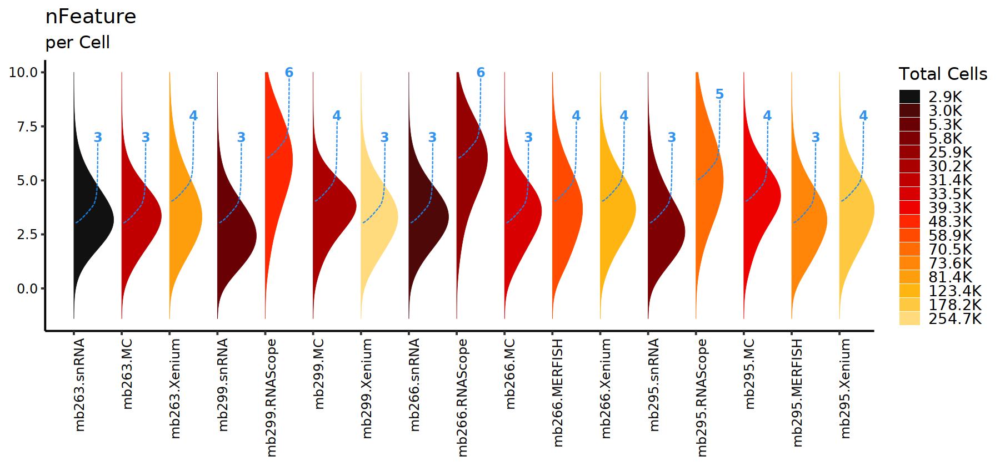

In [205]:
options(repr.plot.height = 7, repr.plot.width = 15)
i <- 2
pl1[[i]] & 
    theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
          plot.background = element_rect(fill = "white", color = "white")
         ) &
    coord_flip()

##### <span style="font-size:12pt; color:gold"> Save QC plots - per meta variable</span>
<span style="font-size:11pt; color:tomato"> ..density plots - *cells* </span> 

In [207]:
## save plots
dir_path <- "./fig3/panel_X_RNAScope/"
if (FALSE) { # set to TRUE to save .png as well
  #.png
  message("..saving plots - `.png`")
  mclapply(pl1 %>% seq, function(i) {
    ggsave({ if (use.dark.theme) { 
      pl1[[i]] & 
        theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
              plot.background = element_rect(fill = "black", 
                                             color = "black")) & 
        coord_flip()
    } else { pl1[[i]] & 
        theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
              plot.background = element_rect(fill = "white", color = "white")) & 
        coord_flip() }
    },
    file = paste0(dir_path, "mben.", meta.vars.df, "_white", ".png")[i], 
    device = "png",
    #bg = "transparent",
    height = 5, width = 10, dpi = 200)
  }, mc.cores = mc.cores) %>% invisible
  } 

#.pdf only first 2 plots
message("..saving plots - `.pdf`")  
mclapply(pl1[1:2] %>% seq, function(i) {
    ggsave({ if (use.dark.theme) { 
        pl1[[i]] & 
        theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
              plot.background = element_rect(fill = "black", 
                                             color = "black")) & 
        coord_flip()
    } else { pl1[[i]] & 
            theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
                 plot.background = element_rect(fill = "white", color = "white")) & 
            coord_flip() }
            },
           file = paste0(dir_path, "mben.", meta.vars.df, "_white", ".pdf")[i], 
           device = cairo_pdf,
           #bg = "transparent",
           height = 7, width = 15, dpi = 200)
}, mc.cores = mc.cores) %>% invisible

dev.off()
message("..saving plots - done!")

..saving plots - `.pdf`



null device 
          1

..saving plots - done!



#### <span style="font-size:11pt; color:gold"> Preliminary estimation of false positive target genes... </span>
<span style="font-size:11pt; color:tomato"> false positives -> target genes within bg genes </span> <br /> 
<span style="font-size:11pt; color:tomato"> true positives -> target genes NOT within bg genes </span> <br /> 

<span style="font-size:11pt; color:gold"> Load objs - with background genes </span> <br /> 
<span style="font-size:10pt; color:tomato">***MB295, 266*** samples (2nd run).. Vizgen </span> <br />
<span style="font-size:10pt; color:tomato">***MB299, 295, 266, 263*** samples..Resolve </span> <br />


In [35]:
obj.bg <- 
    readRDS(file = "./segmentation_based/objects/vz.re.xen_matched_bg.rds")

In [36]:
obj.bg

An object of class Seurat 
311 features across 1059354 samples within 1 assay 
Active assay: MultiTech (311 features, 0 variable features)
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

In [557]:
# update metadata
obj.bg@meta.data %<>%
    mutate(donor = samples) %>%
    mutate_if(is.character,
              ~ stringr::str_replace_all(., c("Resolve" = "MC", "Vizgen" = "MERFISH")))

In [ ]:
obj.bg$samples %>% table

In [ ]:
obj.bg %>% getMeta %>% str

In [40]:
# clone obj
obj.bg_cloned <- obj.bg

<span style="font-size:10pt; color:gold"> Subset obj to ***MB295, 266*** samples </span> <br />


In [41]:
# Subset to keep only 2 samples - mb295 and mb266 ----
cells.use <- 
  obj.bg %>%
  getMeta %>% 
  slice(pull(., samples) %>% grep("295|266", .)) %>% rownames

# subset obj and FOVs ----
# load modified subset function
source("./scripts/subset_obj_seurat_v2.R")
obj.bg %<>% subset_opt(cells = cells.use)

# Update metadata ----
obj.bg@meta.data %<>%
  mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = ""))
obj.bg

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found only in FOV: 
mb295.region0.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.region1.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.w5a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a2.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.Xenium

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.Xenium

Subsetting Centroids..

Removing FOVs where cells are NOT found: 
mb263.w4a1.Resolve
mb299.w7a1.Resolve
mb263.Xenium
mb299.Xenium


Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“A

An object of class Seurat 
311 features across 594706 samples within 1 assay 
Active assay: MultiTech (311 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb266.Xenium mb295.Xenium

In [595]:
obj.bg$samples %>% table

.
     mb266.MC mb266.MERFISH  mb266.Xenium      mb295.MC mb295.MERFISH 
        34625         61532        125056         40816         78432 
 mb295.Xenium 
       181935 

In [ ]:
# check if any cells have 0 expression
# check for genes
  gene.index <- c((GetAssayData(obj.bg, slot = "counts") %>% rowSums) == 0)
if (gene.index %>% any) {
   n.genes <- which(gene.index)
    message("Total of ", n.genes %>% length, 
            " have 0 expression in all cells", "\n",
            ">>> removing these genes..")}
# check for cells
  cell.index <- c((GetAssayData(obj.bg, slot = "counts") %>% colSums) == 0)
    if (cell.index %>% any) {
    message("cell with 0 transcript counts are found")}

<span style="font-size:12pt; color:gold"> Normalize data </span> <br >
<span style="font-size:10pt; color:tomato"> `SCTransform` </span> 

In [42]:
# skip this, has some errors!
if (!any(Assays(obj.bg) == "SCT")) {
  start.time <- Sys.time()
  # fast analysis
  obj.bg %<>% 
    SCTransform(assay = Assays(obj.bg), 
                #clip.range = c(-10, 10), 
                verbose = FALSE)
  end.time <- Sys.time()
  end.time - start.time
} else { 
  message("SCT assay is already present")
}
obj.bg

In [528]:
obj.bg

An object of class Seurat 
311 features across 522396 samples within 1 assay 
Active assay: MultiTech (311 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb266.Xenium mb295.Xenium

In [596]:
# set raw/un-normalized assay
DefaultAssay(obj.bg) <- grep("SCT", Assays(obj.bg), 
                             invert = TRUE, value = TRUE)
DefaultAssay(obj.bg)

[1] "MultiTech"

<span style="font-size:11pt; color:tomato"> Get Highly Expressed Genes (HEG) plot(s) per *sample* or *technology* </span> <br /> 

In [562]:
# get HEGs - sorted high expressed genes 
df.expr <- 
FetchData(obj.bg, vars = rownames(obj.bg), slot = "counts") %>%
    # add samples/FOV names, and spatial tech
    mutate(spatial_tech = obj.bg$spatial_tech, 
           samples = obj.bg$samples)
df.expr %>% str

# make new df adding some calculations
df.expr.sum <-
df.expr %>%
    # convert from wide to long format
    reshape2::melt(.) %>%
    # rename vars
    rename(genes = variable, transcript_counts = value) %>%
    # group by vars
    group_by(samples, spatial_tech, genes, .drop = FALSE) %>%
    # sum all expression from all cells..
    summarise(sum.counts = sum(transcript_counts)) %>%
    ungroup() %>% 
    group_by(samples) %>%
    group_split() %>%
    purrr::map(., ~ mutate(., ranks = 
                         data.table::frank(., sum.counts, 
                                           ties.method = "dense"),
                          genes = as.character.factor(genes))) %>%
    data.table::rbindlist() %>%
    ungroup %>%
    # order value high-to-low
    arrange(desc(sum.counts))

df.expr.sum %>% str
df.expr.sum %>% head


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.2 GiB”


'data.frame':	522396 obs. of  313 variables:
 $ CD4                    : num  0 0 0 0 0 0 0 0 1 0 ...
 $ TLL1                   : num  0 0 0 0 0 0 0 0 0 0 ...
 $ EPHA8                  : num  0 0 0 1 0 0 0 0 1 0 ...
 $ CD69                   : num  0 0 0 0 0 0 0 0 0 0 ...
 $ CCR7                   : num  0 0 0 0 0 0 0 0 0 0 ...
 $ CD44                   : num  0 0 0 0 0 0 0 0 1 1 ...
 $ EGFR                   : num  0 0 0 8 1 5 0 2 0 0 ...
 $ KHDRBS2                : num  0 0 0 0 0 0 0 0 0 0 ...
 $ DRAXIN                 : num  0 0 0 0 0 0 0 1 1 0 ...
 $ LMX1A                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ IGFBP7                 : num  0 0 0 0 0 0 0 0 0 1 ...
 $ EOMES                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ CTLA4                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ HHIP                   : num  1 0 0 5 0 2 0 1 1 0 ...
 $ COL1A2                 : num  0 0 0 5 2 0 0 2 2 0 ...
 $ IGF1                   : num  0 0 0 0 0 0 0 0 0 0 ...
 $ NCAM1                  : num  3 1 0 14 1

Using spatial_tech, samples as id variables

`summarise()` has grouped output by 'samples', 'spatial_tech'. You can override
using the `.groups` argument.


Classes ‘data.table’ and 'data.frame':	1866 obs. of  5 variables:
 $ samples     : chr  "mb295.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ spatial_tech: chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ genes       : chr  "NCAM1" "SV2B" "NCAM1" "NRXN3" ...
 $ sum.counts  : num  1396767 1225162 874793 837977 766071 ...
 $ ranks       : int  206 211 210 209 208 205 204 137 203 113 ...
 - attr(*, ".internal.selfref")=<externalptr> 


samples,spatial_tech,genes,sum.counts,ranks
<chr>,<chr>,<chr>,<dbl>,<int>
mb295.Xenium,Xenium,NCAM1,1396767,206
mb266.Xenium,Xenium,SV2B,1225162,211
mb266.Xenium,Xenium,NCAM1,874793,210
mb266.Xenium,Xenium,NRXN3,837977,209
mb266.Xenium,Xenium,QKI,766071,208
mb295.Xenium,Xenium,GRIA2,726399,205


In [563]:
df.expr.sum$samples %>% table
df.expr.sum$genes %>% unique

.
     mb266.MC mb266.MERFISH  mb266.Xenium      mb295.MC mb295.MERFISH 
          311           311           311           311           311 
 mb295.Xenium 
          311 

[1] "NCAM1"                   "SV2B"                   
  [3] "NRXN3"                   "QKI"                    
  [5] "GRIA2"                   "SEMA6A"                 
  [7] "DCN"                     "RBFOX3"                 
  [9] "CA10"                    "COL1A2"                 
 [11] "TLL1"                    "MYCN"                   
 [13] "CNTNAP5"                 "BOC"                    
 [15] "IGFBP7"                  "LAMA2"                  
 [17] "PTPRO"                   "PTCH1"                  
 [19] "MEIS2"                   "HHIP"                   
 [21] "CNTN2"                   "PBX3"                   
 [23] "EZH2"                    "EGFR"                   
 [25] "RALYL"                   "GABRA5"                 
 [27] "NNAT"                    "GLI2"                   
 [29] "DRAXIN"                  "ERBB4"                  
 [31] "TRPM3"                   "DDX31"                  
 [33] "AQP4"                    "ASTN1"                  
 [35] "MKI67"                   "NCAM2"                  
 [37] "CD44"                    "TOP2A"                  
 [39] "TMEM108"                 "CD163"                  
 [41] "SLC35F3"                 "SRC"                    
 [43] "MIR4435-2HG"             "ESRRG"                  
 [45] "CD4"                     "DSCAM"                  
 [47] "BMPR1B"                  "POU5F1B"                
 [49] "GRIN2B"                  "EOMES"                  
 [51] "OTX2"                    "TNC"                    
 [53] "FOXP2"                   "IGDCC3"                 
 [55] "AIF1"                    "CD14"                   
 [57] "CFAP44"                  "MYC"                    
 [59] "CCR7"                    "NCKAP5"                 
 [61] "CD83"                    "GLI1"                   
 [63] "HS6ST3"                  "PTPRC"                  
 [65] "GRM8"                    "ZFHX3"                  
 [67] "DCAF4"                   "Blank-39"               
 [69] "DIAPH3"                  "TULP1"                  
 [71] "ITGAM"                   "NPAS3"                  
 [73] "OLIG2"                   "Blank-14"               
 [75] "IGF1"                    "GLRA1"                  
 [77] "EPHA5"                   "EPHA8"                  
 [79] "PLEKHA7"                 "TMEM119"                
 [81] "KHDRBS2"                 "CTLA4"                  
 [83] "Blank-21"                "Blank-30"               
 [85] "CD37"                    "GPC5"                   
 [87] "LHX9"                    "UnassignedCodeword-0290"
 [89] "FCGR3A"                  "Blank-28"               
 [91] "PRDM6"                   "Blank-7"                
 [93] "Blank-18"                "TMEM132D"               
 [95] "RIT2"                    "Blank-34"               
 [97] "UnassignedCodeword-0370" "Blank-9"                
 [99] "GFI1"                    "Blank-17"               
[101] "Blank-29"                "Blank-8"                
[103] "FOXJ1"                   "Blank-25"               
[105] "Blank-27"                "Blank-31"               
[107] "UnassignedCodeword-0321" "MOG"                    
[109] "Blank-5"                 "Blank-36"               
[111] "Blank-20"                "NegControlProbe-00017"  
[113] "Blank-32"                "Blank-35"               
[115] "Blank-2"                 "UnassignedCodeword-0012"
[117] "Blank-26"                "Blank-10"               
[119] "Blank-4"                 "Blank-37"               
[121] "Blank-23"                "Blank-38"               
[123] "CD69"                    "UnassignedCodeword-0031"
[125] "Blank-12"                "LMX1A"                  
[127] "Blank-11"                "Blank-1"                
[129] "GFI1B"                   "FP 83"                  
[131] "IL4"                     "NegControlProbe-00025"  
[133] "TRPC3"                   "Blank-16"               
[135] "CD19"                    "Blank-33"               
[137] "Blank-3"                 "Blank-13"               


In [564]:
# prepare breaks 
# use summed expression - no pseudocount + 1
breaks.y <- 
classInt::classIntervals(c(min(
df.expr.sum %>% 
    pull(sum.counts)),
    pretty(df.expr.sum %>% pull(sum.counts), n = 40)[-1] %>% 
                             sort %>% unique),
                         n = 2, style = "quantile")$brks %>% ceiling %>% unique
breaks.y

#breaks.y.label <- 
#    scales::number(breaks.y, accuracy = 0.5
#               scale_cut = scales::cut_long_scale())
breaks.y.label <-
  # for values > 1K
  if (any(breaks.y > 1000)) {
    c(breaks.y[which(!breaks.y > 1000)],
      paste0((breaks.y[which(breaks.y > 1000 & breaks.y < 1e6)] / 1000), "K"),
      # for values > 1M
      if (any(breaks.y > 1e6)) { paste0((breaks.y[which(breaks.y > 1e6)] / 1e6), "M") }
      )
  }
breaks.y.label


[1]       0  700000 1400000

[1] "0"    "700K" "1.4M"

In [565]:
# QC variables and plot params         
message("Setting QC variables and plot params..")
meta.vars <- grep("nCount_|nFeature_|percent_", names(getMeta(obj.bg)), value = TRUE)
message("QC variables are :", paste0("\n", ">>> ", meta.vars))

# if TRUE - using whole obj name, else other metadata var.. 
meta.var.use <- c("orig.ident", "samples", "spatial_tech")
use.orig.ident <- FALSE
if (use.orig.ident) { meta.var <- "orig.ident" } else { meta.var <- "samples" }
#meta.var <- "spatial_tech"
meta.var

# add colors for meta var (ie samples) 
meta.var.col <- colorRampPalette(RColorBrewer::brewer.pal(10, "Paired"))(table(obj.bg[[meta.var]]) %>%
 names %>% length)
meta.var.col %>% glimpse()

# title for meta.var
#paste0(substring(meta.var, 1, 1) %>% toupper, substring(meta.var, 2, nchar(meta.var)))
meta.var.title <- stringr::str_to_title(meta.var)

# custom text sizes for plots
legend.text.size <- 16
base_size <- 18
axis.text.size <- 14
   
# choose plot theme, eg dark or white
use.dark.theme <- FALSE # if FALSE - white bg is used for plots

# choose plot colors scheme..
use.colors.opt <- "fire" # options are: "inferno" or "fire"
# colors/fill scale gradient
if (use.dark.theme && use.colors.opt == "fire") {
    scale.col <- 
        cet_pal(11, name = use.colors.opt)[4:11] %>% .[c(1,3,5,6:8)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "fire") {
    scale.col <-
        cet_pal(11, name = use.colors.opt)[1:9] %>% .[c(1,3,5,6,7,9)] %>% rev
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:9)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:8)] %>% 
        rev %>% c("gray4")
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
}

# transparent theme for white bg
theme_transparent_2 <- theme(panel.background = element_rect(fill = "transparent"),
                             plot.background = element_rect(fill = "transparent", color = NA),
                             panel.grid.major = element_blank(), 
                             panel.grid.minor = element_blank(), 
                             legend.background = element_rect(fill = "transparent"))


Setting QC variables and plot params..

QC variables are :
>>> nCount_MultiTech
>>> nFeature_MultiTech



[1] "samples"

 chr [1:6] "#A6CEE3" "#94CA92" "#AB9C6D" "#ED5C3D" "#F4892A" "#6A3D9A"


Using White Theme & 'fire' color scale



In [566]:
# per sample
cols <- c("gray50", "red", "black")
#cols <- scale.col
#c(alpha("gray10", 0.7), cet_pal(16, name = use.colors.opt))

pl1_bg <-
# keep only target genes
df.expr.sum %>% 
    ggplot(aes(x = ranks,
               y = sum.counts, 
               #size = sum.counts, 
               color = sum.counts,
               #color = samples,
               #fill = sum.counts
               #group = samples
                     )) &
    geom_point(alpha = 0.6, shape = 19) &
    theme_classic(base_size = 16) &
    ggrepel::geom_text_repel(data = 
                           df.expr.sum %>%
                           filter(sum.counts > 1e5),
                           aes_string(x = "ranks",
                                      y = "sum.counts", 
                                      label = "genes"),
                           size = 4, #alpha = 0.6,
                           nudge_x = -40,
                           box.padding = 0.3,
                           nudge_y = 50,
                           segment.curvature = -0.2,
                           segment.ncp = 3,
                           segment.angle = 20,
                           segment.linetype = 2,
                           segment.size = 0.5,
                           #arrow = arrow(length = unit(0.03, "npc")), # arrow head size
                           #point.padding = 0.5, # add space between arrow/line and the point
                           segment.alpha = 1,
                           max.overlaps = Inf,
                           #min.segment.length = 0,
                           fontface = "bold"
                           ) &
    scale_y_continuous(breaks = breaks.y,
                           labels = breaks.y.label,
                           limits = breaks.y %>% range) &
    scale_color_gradientn(name = NULL, colours = cols, 
                          breaks = breaks.y, 
                          labels = breaks.y.label,
                          limits = breaks.y %>% range
                          ) &
    #scale_radius(breaks = breaks.y,
    #             labels = breaks.y.label,
    #             limits = breaks.y %>% range,
    #             range = c(1.5, 11)
    #             ) &
    theme(plot.subtitle = element_text(size = 14),
          axis.text = element_text(color = axis.text.col,
                                   size = axis.text.size),
          legend.text = element_text(size = legend.text.size),
          legend.position = "right",
          legend.key.height = grid::unit(0.8,"cm"),
          legend.key.width = grid::unit(0.4,"cm")
         ) &              
    #guides(size = guide_legend(title = "Sum counts", order = 1),
    #       color = guide_colorbar(order = 2)) &
   labs(subtitle = NULL,
         x = "Ranked sum counts",
         y = "Sum counts") &
    facet_wrap(~ samples) & 
    theme(strip.background = element_rect(fill = "gray80"))

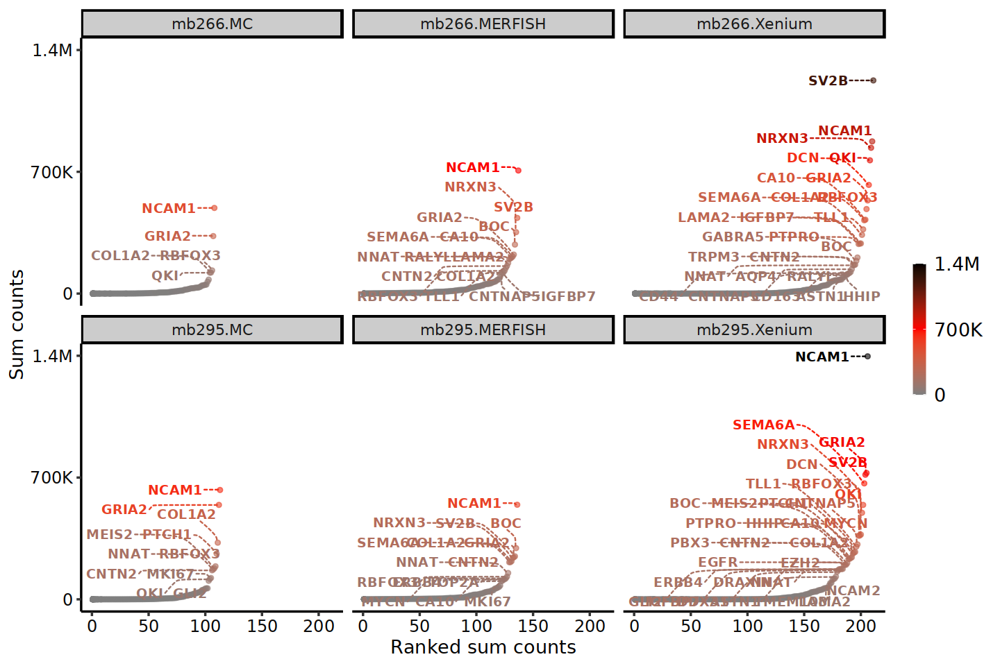

In [567]:
options(repr.plot.height = 8, repr.plot.width = 12)
pl1_bg

In [568]:
# filter dfs to keep only bg genes specific to samples/FOVs or technology (target genes are kept as well!)
# filtering - per tech
gene.patterns <- c("Blank|FP ", 
                   "NegControlProbe|UnassignedCodeword|FP ", 
                   "NegControlProbe|UnassignedCodeword|Blank")
df.expr.sum.tech <- 
    lapply(df.expr.sum$spatial_tech %>% unique() %>% seq(), function(i) {
        df.expr.sum %>%
            filter(spatial_tech == c(spatial_tech %>% unique())[i]) %>% 
            slice(c(genes %>% grep(gene.patterns[i], ., invert = TRUE)))
})
df.expr.sum.tech %>% str

List of 3
 $ :Classes ‘data.table’ and 'data.frame':	488 obs. of  5 variables:
  ..$ samples     : chr [1:488] "mb295.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
  ..$ spatial_tech: chr [1:488] "Xenium" "Xenium" "Xenium" "Xenium" ...
  ..$ genes       : chr [1:488] "NCAM1" "SV2B" "NCAM1" "NRXN3" ...
  ..$ sum.counts  : num [1:488] 1396767 1225162 874793 837977 766071 ...
  ..$ ranks       : int [1:488] 206 211 210 209 208 205 204 203 207 202 ...
  ..- attr(*, ".internal.selfref")=<externalptr> 
 $ :Classes ‘data.table’ and 'data.frame':	272 obs. of  5 variables:
  ..$ samples     : chr [1:272] "mb266.MERFISH" "mb295.MERFISH" "mb266.MERFISH" "mb266.MERFISH" ...
  ..$ spatial_tech: chr [1:272] "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
  ..$ genes       : chr [1:272] "NCAM1" "NCAM1" "SV2B" "NRXN3" ...
  ..$ sum.counts  : num [1:272] 707359 543664 434980 352996 294541 ...
  ..$ ranks       : int [1:272] 137 136 136 135 135 134 134 133 132 133 ...
  ..- attr(*, ".internal.sel

In [569]:
# make per sample
df.expr.sum.sample <-
    lapply(df.expr.sum.tech, function(i) {
        split(i, i$samples)
    }) %>% do.call(c, .)
df.expr.sum.sample %>% str


List of 6
 $ mb266.Xenium :Classes ‘data.table’ and 'data.frame':	244 obs. of  5 variables:
  ..$ samples     : chr [1:244] "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
  ..$ spatial_tech: chr [1:244] "Xenium" "Xenium" "Xenium" "Xenium" ...
  ..$ genes       : chr [1:244] "SV2B" "NCAM1" "NRXN3" "QKI" ...
  ..$ sum.counts  : num [1:244] 1225162 874793 837977 766071 624679 ...
  ..$ ranks       : int [1:244] 211 210 209 208 207 206 205 204 203 202 ...
  ..- attr(*, ".internal.selfref")=<externalptr> 
 $ mb295.Xenium :Classes ‘data.table’ and 'data.frame':	244 obs. of  5 variables:
  ..$ samples     : chr [1:244] "mb295.Xenium" "mb295.Xenium" "mb295.Xenium" "mb295.Xenium" ...
  ..$ spatial_tech: chr [1:244] "Xenium" "Xenium" "Xenium" "Xenium" ...
  ..$ genes       : chr [1:244] "NCAM1" "GRIA2" "SV2B" "SEMA6A" ...
  ..$ sum.counts  : num [1:244] 1396767 726399 716193 666450 542633 ...
  ..$ ranks       : int [1:244] 206 205 204 203 202 201 200 199 198 197 ...
  ..- attr(

In [570]:
# check genes for 1st sample.
df.expr.sum.sample[[1]] %>%
    pull(genes) %>%
    unique %>%
    grep("Blank|FP ", ., invert = TRUE, value = TRUE)

[1] "SV2B"                    "NCAM1"                  
  [3] "NRXN3"                   "QKI"                    
  [5] "DCN"                     "GRIA2"                  
  [7] "RBFOX3"                  "CA10"                   
  [9] "COL1A2"                  "TLL1"                   
 [11] "SEMA6A"                  "IGFBP7"                 
 [13] "LAMA2"                   "PTPRO"                  
 [15] "BOC"                     "GABRA5"                 
 [17] "CNTN2"                   "TRPM3"                  
 [19] "NNAT"                    "AQP4"                   
 [21] "RALYL"                   "CD44"                   
 [23] "CNTNAP5"                 "CD163"                  
 [25] "HHIP"                    "ASTN1"                  
 [27] "NCAM2"                   "GLI2"                   
 [29] "MEIS2"                   "DDX31"                  
 [31] "EGFR"                    "MIR4435-2HG"            
 [33] "ESRRG"                   "CD4"                    
 [35] "EZH2"                    "PTCH1"                  
 [37] "MYCN"                    "BMPR1B"                 
 [39] "EOMES"                   "DRAXIN"                 
 [41] "DSCAM"                   "AIF1"                   
 [43] "POU5F1B"                 "CFAP44"                 
 [45] "TOP2A"                   "FOXP2"                  
 [47] "TNC"                     "TMEM108"                
 [49] "HS6ST3"                  "PTPRC"                  
 [51] "GRM8"                    "CCR7"                   
 [53] "CD83"                    "SRC"                    
 [55] "MKI67"                   "MYC"                    
 [57] "GLI1"                    "ZFHX3"                  
 [59] "DCAF4"                   "IGDCC3"                 
 [61] "CD14"                    "ITGAM"                  
 [63] "NPAS3"                   "IGF1"                   
 [65] "GLRA1"                   "PBX3"                   
 [67] "ERBB4"                   "SLC35F3"                
 [69] "EPHA5"                   "OTX2"                   
 [71] "DIAPH3"                  "PLEKHA7"                
 [73] "GRIN2B"                  "NCKAP5"                 
 [75] "CTLA4"                   "TULP1"                  
 [77] "UnassignedCodeword-0290" "GPC5"                   
 [79] "OLIG2"                   "FCGR3A"                 
 [81] "PRDM6"                   "UnassignedCodeword-0370"
 [83] "TMEM119"                 "GFI1"                   
 [85] "RIT2"                    "EPHA8"                  
 [87] "CD37"                    "UnassignedCodeword-0321"
 [89] "TMEM132D"                "UnassignedCodeword-0031"
 [91] "KHDRBS2"                 "NegControlProbe-00017"  
 [93] "UnassignedCodeword-0012" "NegControlProbe-00025"  
 [95] "TRPC3"                   "CD69"                   
 [97] "UnassignedCodeword-0293" "UnassignedCodeword-0368"
 [99] "CD19"                    "FOXJ1"                  
[101] "UnassignedCodeword-0317" "UnassignedCodeword-0028"
[103] "UnassignedCodeword-0376" "NegControlProbe-00022"  
[105] "NegControlProbe-00016"   "NegControlProbe-00014"  
[107] "NegControlProbe-00003"   "IL4"                    
[109] "MOG"                     "UnassignedCodeword-0054"
[111] "LMX1A"                   "UnassignedCodeword-0143"
[113] "UnassignedCodeword-0097" "NegControlProbe-00013"  
[115] "NegControlProbe-00012"   "NegControlProbe-00009"  
[117] "GFI1B"                   "UnassignedCodeword-0058"
[119] "NegControlProbe-00042"   "UnassignedCodeword-0179"
[121] "LHX9"                    "UnassignedCodeword-0381"
[123] "UnassignedCodeword-0366" "UnassignedCodeword-0251"
[125] "UnassignedCodeword-0136" "UnassignedCodeword-0192"
[127] "NegControlProbe-00035"   "UnassignedCodeword-0039"
[129] "NegControlProbe-00019"   "UnassignedCodeword-0274"
[131] "UnassignedCodeword-0055" "UnassignedCodeword-0068"
[133] "UnassignedCodeword-0346" "UnassignedCodeword-0272"
[135] "UnassignedCodeword-0024" "NegControlProbe-00041"  
[137] "NegControlProbe-00002"   "UnassignedCodeword-0139"


In [571]:
## filtering - per sample for top genes and ranges
# keep HEGs, bg genes, and probed genes within bg genes range
bg.genes <-
  lapply(df.expr.sum.sample %>% seq(), function(i) {
      grep("^FP |^Blank-|NegControlProbe|UnassignedCodeword", df.expr.sum.sample[[i]]$genes, value = TRUE) })
bg.genes.index <-
    lapply(df.expr.sum.sample %>% seq(), function(i) {
        grep("^FP |^Blank-|NegControlProbe|UnassignedCodeword", df.expr.sum.sample[[i]]$genes) })
bg.genes.range <- 
    lapply(df.expr.sum.sample %>% seq(), function(i) {
        c(bg.genes[[i]] %>% head(n = 1), bg.genes[[i]] %>% tail(n = 1)) })

In [572]:
df.tp.fp <-
list(
# add col for TP.FP.BG
# True Posivites target genes - per sample
lapply(df.expr.sum.sample %>% seq, function(i) {
    df.expr.sum.sample[[i]] %>%
    slice(seq(1, bg.genes.index[[i]] %>% min)) %>%
    filter(!genes %in% bg.genes[[i]]) %>%
    mutate(TP.FP.BG = "TP")
    }) %>% data.table::rbindlist(),
    
# False Posivites target genes - per sample
lapply(df.expr.sum.sample %>% seq, function(i) {
    df.expr.sum.sample[[i]] %>%
    slice(seq(bg.genes.index[[i]] %>% min, bg.genes.index[[i]] %>% max)) %>% # range of 1st and last bg.gene
    filter(!genes %in% bg.genes[[i]]) %>% 
    mutate(TP.FP.BG = "FP")
    }) %>% data.table::rbindlist(),

# Background genes - per sample
lapply(df.expr.sum.sample %>% seq, function(i) {
    df.expr.sum.sample[[i]] %>%
    filter(genes %in% bg.genes[[i]]) %>%
    mutate(TP.FP.BG = "BG")
    }) %>% data.table::rbindlist()
    ) %>% 
data.table::rbindlist() %>%
mutate(genes = factor(genes, 
                          levels = genes %>% unique))
df.tp.fp %>% str


Classes ‘data.table’ and 'data.frame':	1006 obs. of  6 variables:
 $ samples     : chr  "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ spatial_tech: chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ genes       : Factor w/ 311 levels "SV2B","NCAM1",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ sum.counts  : num  1225162 874793 837977 766071 624679 ...
 $ ranks       : int  211 210 209 208 207 206 205 204 203 202 ...
 $ TP.FP.BG    : chr  "TP" "TP" "TP" "TP" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [573]:
# add new var with only target genes and BG genes
df.tp.fp %<>% 
    mutate(TG.BG = case_when(TP.FP.BG == "FP" ~ "Target",
                             TP.FP.BG == "TP" ~ "Target", 
                             TP.FP.BG == "BG" ~ "Background"))

In [574]:
df.tp.fp %>% str

Classes ‘data.table’ and 'data.frame':	1006 obs. of  7 variables:
 $ samples     : chr  "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ spatial_tech: chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ genes       : Factor w/ 311 levels "SV2B","NCAM1",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ sum.counts  : num  1225162 874793 837977 766071 624679 ...
 $ ranks       : int  211 210 209 208 207 206 205 204 203 202 ...
 $ TP.FP.BG    : chr  "TP" "TP" "TP" "TP" ...
 $ TG.BG       : chr  "Target" "Target" "Target" "Target" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [575]:
# some checks on genes per sample
lapply(df.tp.fp$samples %>% unique %>% seq, 
       function(i) df.tp.fp %>% 
       filter(samples == pull(., samples) %>% unique %>% .[i]) %>% 
       pull(genes) %>% 
       as.character.factor %>% unique) %>% str

List of 6
 $ : chr [1:244] "SV2B" "NCAM1" "NRXN3" "QKI" ...
 $ : chr [1:244] "NCAM1" "GRIA2" "SV2B" "SEMA6A" ...
 $ : chr [1:136] "NCAM1" "SV2B" "NRXN3" "BOC" ...
 $ : chr [1:136] "NCAM1" "BOC" "SV2B" "GRIA2" ...
 $ : chr [1:123] "NCAM1" "GRIA2" "RBFOX3" "COL1A2" ...
 $ : chr [1:123] "NCAM1" "GRIA2" "COL1A2" "PTCH1" ...


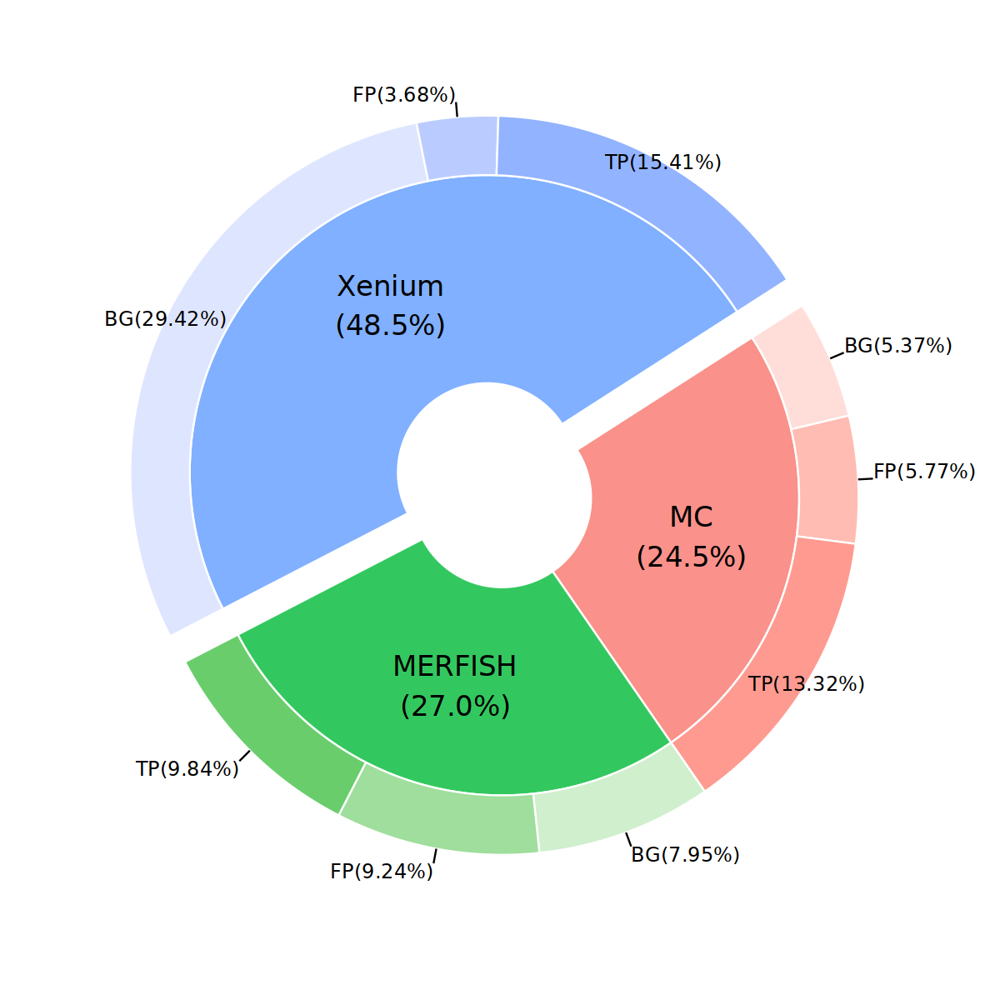

In [576]:
library(moonBook)
library(webr)
library(ggforce)
library(grid)

options(repr.plot.height = 10, repr.plot.width = 10)
pl_donut <- PieDonut(df.tp.fp, aes(spatial_tech, TP.FP.BG), labelposition = 4, 
                     labelpositionThreshold = 0.1, pieAlpha = 0.8, donutAlpha = 1, 
                     showRatioThreshold = 0.001, pieLabelSize = 7, donutLabelSize = 5,
                     explode = c(3), r0 = 0.3, start = 1, 
                     #start = 4*pi/2,
                     showPieName = F, family = "Arial", 
                     explodeDonut = F, ratioByGroup = F, title = NULL, titlesize = 1)


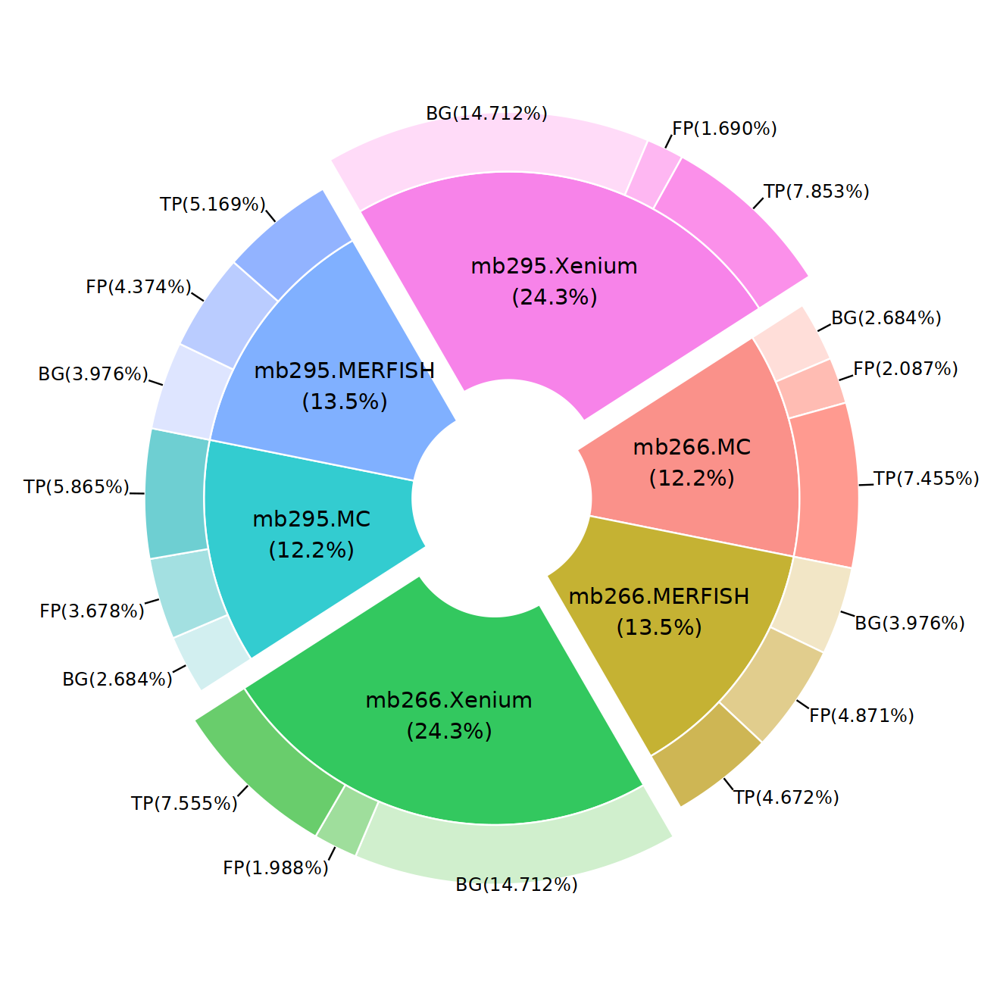

In [577]:
options(repr.plot.height = 11, repr.plot.width = 11)
pl_donut <- PieDonut(df.tp.fp, aes(samples, TP.FP.BG), labelposition = 4, 
                     labelpositionThreshold = 0.1, pieAlpha = 0.8, donutAlpha = 1, 
                     showRatioThreshold = 0.01, pieLabelSize = 6, donutLabelSize = 5,
                     explode = c(3,6), 
                     r0 = 0.3, start = 1, showPieName = F, family = "Arial", 
                     explodeDonut = F, ratioByGroup = F, title = NULL, titlesize = 1)

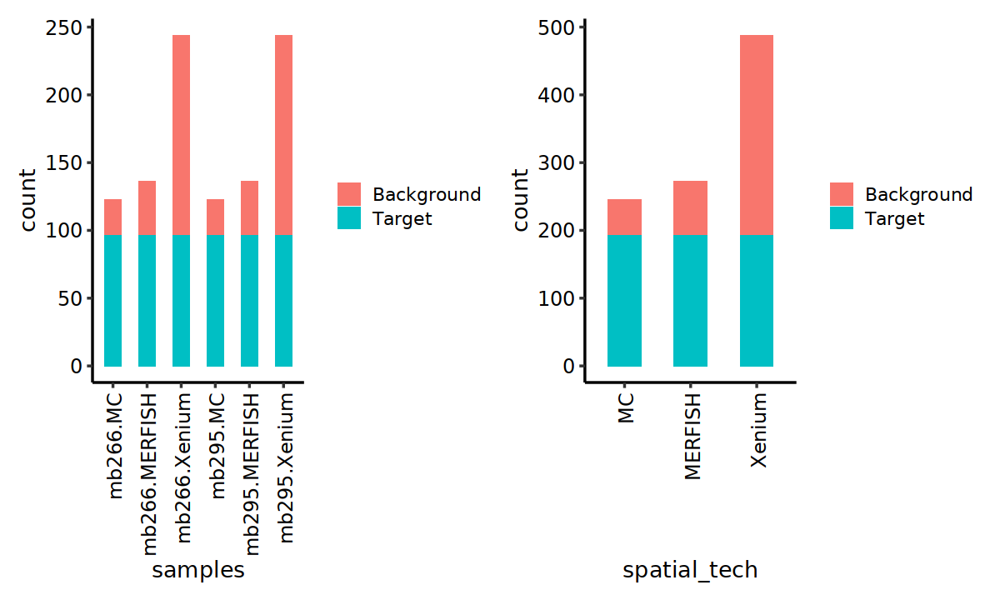

In [578]:
# bar plot of TP and FP genes
options(repr.plot.height = 6, repr.plot.width = 10)
list(
df.tp.fp %>% 
    #group_by(spatial_tech, samples, TG.BG) %>%
    #summarise(total.TP.FP = n()) %>% 
    #ungroup() %>%
    #ggplot(aes(samples, fill = TP.FP.BG)) &
    ggplot(aes(samples, fill = TG.BG)) &
    geom_bar(width = 0.5) &
    theme_classic(base_size = 16) &
    theme(axis.text = element_text(size = 14, color = "black"),
          axis.text.x = element_text(angle = 90, vjust = 0.6, hjust = 1)) &
    guides(fill = guide_legend(title = NULL, order = 1)),
df.tp.fp %>% 
    #ggplot(aes(samples, fill = TP.FP.BG)) &
    ggplot(aes(spatial_tech, fill = TG.BG)) &
    geom_bar(width = 0.5) &
    theme_classic(base_size = 16) &
    theme(axis.text = element_text(size = 14, color = "black"),
          axis.text.x = element_text(angle = 90, vjust = 0.6, hjust = 1)) &
    guides(fill = guide_legend(title = NULL, order = 1))
) %>% wrap_plots(nrow = 1)

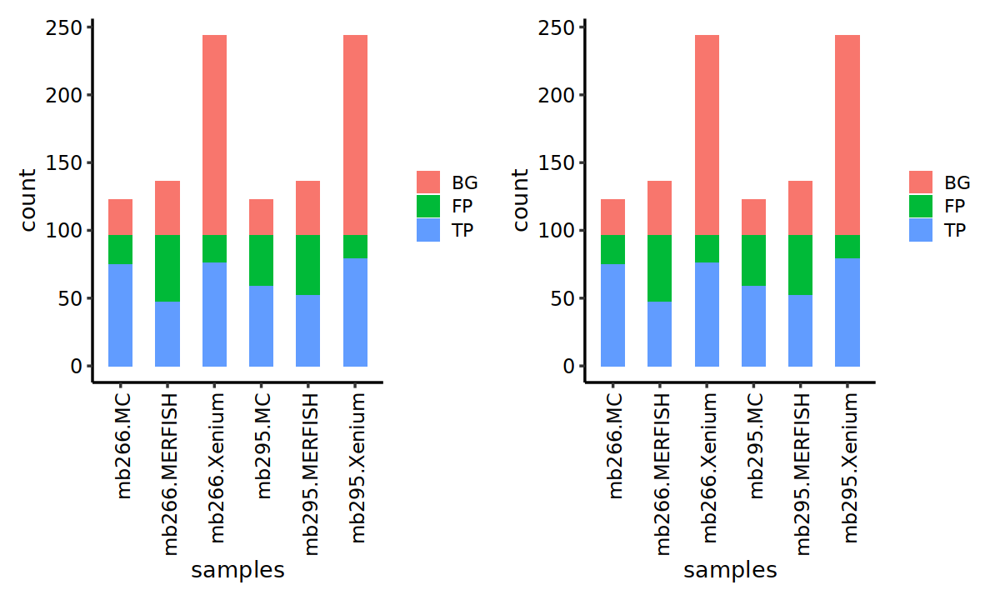

In [579]:
# bar plot of TP and FP genes
options(repr.plot.height = 6, repr.plot.width = 10)
list(
df.tp.fp %>% 
    #group_by(spatial_tech, samples, TG.BG) %>%
    #summarise(total.TP.FP = n()) %>% 
    #ungroup() %>%
    ggplot(aes(samples, fill = TP.FP.BG)) &
    #ggplot(aes(samples, fill = TG.BG)) &
    geom_bar(width = 0.5) &
    theme_classic(base_size = 16) &
    theme(axis.text = element_text(size = 14, color = "black"),
          axis.text.x = element_text(angle = 90, vjust = 0.6, hjust = 1)) &
    guides(fill = guide_legend(title = NULL, order = 1)),
df.tp.fp %>% 
    ggplot(aes(samples, fill = TP.FP.BG)) &
    #gplot(aes(spatial_tech, fill = TG.BG)) &
    geom_bar(width = 0.5) &
    theme_classic(base_size = 16) &
    theme(axis.text = element_text(size = 14, color = "black"),
          axis.text.x = element_text(angle = 90, vjust = 0.6, hjust = 1)) &
    guides(fill = guide_legend(title = NULL, order = 1))
) %>% wrap_plots(nrow = 1)

In [597]:
# summary stats of TP.FP.BG
df.tp.fp %>% 
    group_by(samples, TP.FP.BG, TG.BG) %>%
    summarise(total = n()) %>% 
    ungroup

`summarise()` has grouped output by 'samples', 'TP.FP.BG'. You can override
using the `.groups` argument.


samples,TP.FP.BG,TG.BG,total
<chr>,<chr>,<chr>,<int>
mb266.MC,BG,Background,27
mb266.MC,FP,Target,21
mb266.MC,TP,Target,75
mb266.MERFISH,BG,Background,40
mb266.MERFISH,FP,Target,49
mb266.MERFISH,TP,Target,47
mb266.Xenium,BG,Background,148
mb266.Xenium,FP,Target,20
mb266.Xenium,TP,Target,76


In [581]:
# prepare breaks 
# use summed expression - no pseudocount + 1
breaks.y <- 
classInt::classIntervals(c(min(
df.tp.fp %>% pull(sum.counts)), pretty(df.tp.fp %>%
                                    pull(sum.counts), n = 40)[-1] %>% 
                             sort %>% unique),
                         n = 2, style = "quantile")$brks %>% ceiling %>% unique
breaks.y

breaks.y.label <-
  # for values > 1K
  if (any(breaks.y > 1000)) {
    c(breaks.y[which(!breaks.y > 1000)],
      paste0((breaks.y[which(breaks.y > 1000 & breaks.y < 1e6)] / 1000), "K"),
      # for values > 1M
      if (any(breaks.y > 1e6)) { paste0((breaks.y[which(breaks.y > 1e6)] / 1e6), "M") }
      )
  }
breaks.y.label

breaks.x <- 
classInt::classIntervals(c(min(
df.tp.fp %>% pull(ranks)), pretty(df.tp.fp %>%
                                    pull(ranks), n = 40)[-1] %>% 
                             sort %>% unique),
                         n = 2, style = "quantile")$brks %>% ceiling %>% unique
breaks.x

breaks.x.label <-
  # for values > 1K
  if (any(breaks.x > 1000)) {
    c(breaks.x[which(!breaks.x > 1000)],
      paste0((breaks.x[which(breaks.x > 1000 & breaks.x < 1e6)] / 1000), "K"),
      # for values > 1M
      if (any(breaks.x > 1e6)) { paste0((breaks.x[which(breaks.x > 1e6)] / 1e6), "M") }
      )
  } else { breaks.x %>% as.character() }

breaks.x.label

[1]       0  700000 1400000

[1] "0"    "700K" "1.4M"

[1]   1 108 215

[1] "1"   "108" "215"

In [582]:
# per sample -> color TP, FP and BG
#cols <- c("orangered", "gold", alpha("gray8", 0.6))
cols <- c("orangered", alpha("gray8", 0.6))
pl1_bg_samples <-
# keep only target genes
df.tp.fp %>% 
    #mutate(
    #genes = factor(as.character.factor(genes), 
    #                      levels = genes %>% as.character.factor %>% unique)) %>%
    ggplot(aes_string(x = "ranks", 
                      y = "sum.counts", 
                      #size = "sum.counts", 
                      #color = "TP.FP.BG"
                      color = "TG.BG"
                      #color = "samples",
                      #fill = "sum.counts"
                      #group = "samples"
                     )) & 
    geom_point(#alpha = 0.6, 
               shape = 19) &
    theme_classic(base_size = 16) &
    ggrepel::geom_text_repel(data = 
                           df.tp.fp %>%
                           filter(sum.counts > 1.2e5),
                           aes_string(x = "ranks",
                                      y = "sum.counts", 
                                      label = unique("genes")),
                           size = 4, alpha = 1,
                           nudge_x = -10,
                           box.padding = 0.4,
                           nudge_y = 20,
                           segment.curvature = -0.2,
                           segment.ncp = 3,
                           segment.angle = 20,
                           segment.linetype = 2,
                           segment.size = 0.5,
                           #arrow = arrow(length = unit(0.03, "npc")), # arrow head size
                           #point.padding = 0.5, # add space between arrow/line and the point
                           segment.alpha = 1,
                           max.overlaps = Inf,
                           #min.segment.length = 0,
                           fontface = "bold"
                           ) &
    scale_y_continuous(breaks = breaks.y,
                           labels = breaks.y.label,
                           limits = breaks.y %>% range) &
    scale_x_continuous(breaks = breaks.x,
                           labels = breaks.x.label,
                           limits = breaks.x %>% range) &
    scale_color_manual(name = NULL, values = cols) &
    #scale_radius(breaks = breaks.y,
     #            labels = breaks.y.label,
     #            limits = breaks.y %>% range,
     #            range = c(1.5, 11)
     #            ) &
    theme(plot.subtitle = element_text(size = 14),
          axis.text = element_text(color = axis.text.col,
                                   size = axis.text.size),
          legend.text = element_text(size = legend.text.size),
          legend.position = "right",
          legend.key.height = grid::unit(0.8,"cm"),
          legend.key.width = grid::unit(0.4,"cm")
         ) &    
    guides(#size = guide_legend(title = "Sum counts", override.aes = list(alpha = 0.6), order = 1),
           color = guide_legend(override.aes = list(size = 5, alpha = 1), order = 2)) &
   labs(subtitle = NULL,
         x = "Ranked sum counts",
         y = "Sum counts") &
    facet_wrap(~ samples) &
    theme(strip.background = element_rect(fill = "gray80"))


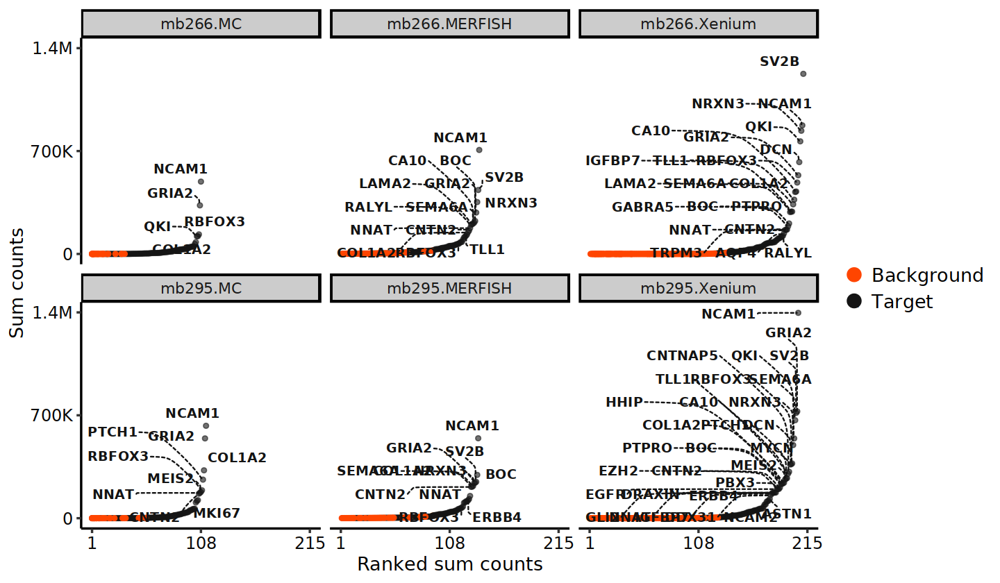

In [583]:
options(repr.plot.height = 7, repr.plot.width = 12)
pl1_bg_samples

In [584]:
# per sample -> color TP, FP and BG
#cols <- c("orangered", "gold", alpha("gray8", 0.6))
cols <- c("orangered", alpha("gray8", 0.6))
pl1_bg_samples <-
# keep only target genes
df.tp.fp %>% 
    #mutate(
    #genes = factor(as.character.factor(genes), 
    #                      levels = genes %>% as.character.factor %>% unique)) %>%
    ggplot(aes_string(x = "log10(ranks + 1)", 
                      y = "log10(sum.counts + 1)", 
                      #size = "sum.counts", 
                      #color = "TP.FP.BG"
                      color = "TG.BG"
                      #color = "samples",
                      #fill = "sum.counts"
                      #group = "samples"
                     )) & 
    geom_point(#alpha = 0.6, 
               shape = 19) &
    theme_classic(base_size = 16) &
    ggrepel::geom_text_repel(data = 
                           df.tp.fp %>%
                           # 10 selected genes  
                           #filter(genes %in% c("CNTN2", "NRXN3", "RBFOX3",
                           #                    "PBX3", "PTCH1", "LAMA2", "TRPM3",
                           #                    "GLI1", "PLEKHA7", "DIAPH3")),
                           filter(genes %in% c("NCAM1", "LAMA2", "SV2B", 
                                               "NRXN3", "QKI", "BOC")),
                           aes_string(x = "log10(ranks + 1)",
                                      y = "log10(sum.counts + 1)", 
                                      label = unique("genes")),
                           size = 4, alpha = 1,
                           nudge_x = -0.2,
                           box.padding = 0.4,
                           nudge_y = 0.5,
                           segment.curvature = -0.2,
                           segment.ncp = 3,
                           segment.angle = 20,
                           segment.linetype = 2,
                           segment.size = 0.5,
                           #arrow = arrow(length = unit(0.03, "npc")), # arrow head size
                           #point.padding = 0.5, # add space between arrow/line and the point
                           segment.alpha = 1,
                           max.overlaps = Inf,
                           #min.segment.length = 0,
                           fontface = "bold"
                           ) &
    scale_color_manual(name = NULL, values = cols) &
    #scale_radius(breaks = breaks.y,
     #            labels = breaks.y.label,
     #            limits = breaks.y %>% range,
     #            range = c(1.5, 11)
     #            ) &
    theme(plot.subtitle = element_text(size = 14),
          axis.text = element_text(color = axis.text.col,
                                   size = axis.text.size),
          legend.text = element_text(size = legend.text.size),
          legend.position = "right",
          legend.key.height = grid::unit(0.8,"cm"),
          legend.key.width = grid::unit(0.4,"cm")
         ) &    
    guides(#size = guide_legend(title = "Sum counts", override.aes = list(alpha = 0.6), order = 1),
           color = guide_legend(override.aes = list(size = 5, alpha = 1), order = 2)) &
   labs(subtitle = NULL,
         x = "log10(Ranked sum counts + 1)",
         y = "log10(Sum counts + 1)") &
    facet_wrap(~ samples) &
    theme(strip.background = element_rect(fill = "gray80"))


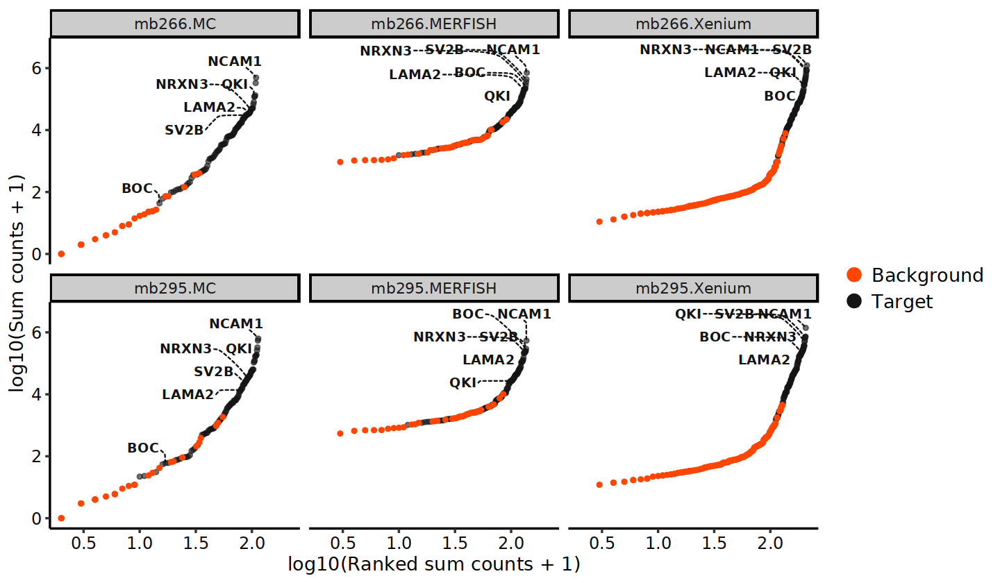

In [585]:
options(repr.plot.height = 7, repr.plot.width = 12)
pl1_bg_samples

In [586]:
# knee-plot
# per sample -> color TP, FP and BG
#cols <- c("orangered", "gold", alpha("gray8", 0.6))
cols <- c("orangered", alpha("gray8", 0.6))
pl2_bg_samples <-
# keep only target genes
df.tp.fp %>% 
    #mutate(
    #genes = factor(as.character.factor(genes), 
    #                      levels = genes %>% as.character.factor %>% unique)) %>%
    ggplot(aes_string(y = "log10(ranks + 1)", 
                      x = "log10(sum.counts + 1)", 
                      #size = "sum.counts", 
                      #color = "TP.FP.BG"
                      color = "TG.BG"
                      #color = "samples",
                      #fill = "sum.counts"
                      #group = "samples"
                     )) & 
    geom_point(#alpha = 0.6, 
               shape = 19) &
    theme_classic(base_size = 16) &
    ggrepel::geom_text_repel(data = 
                           df.tp.fp %>%
                           # 10 selected genes  
                           #filter(genes %in% c("CNTN2", "NRXN3", "RBFOX3",
                           #                    "PBX3", "PTCH1", "LAMA2", "TRPM3",
                           #                    "GLI1", "PLEKHA7", "DIAPH3")),
                           filter(genes %in% c("NCAM1", "LAMA2", "SV2B", 
                                               "NRXN3", "QKI", "BOC")),
                           aes_string(y = "log10(ranks + 1)",
                                      x = "log10(sum.counts + 1)", 
                                      label = unique("genes")),
                           size = 4, alpha = 1,
                           nudge_x = 0.4,
                           box.padding = 0.1,
                           nudge_y = -0.5,
                           segment.curvature = 0.2,
                           #segment.ncp = 3,
                           #segment.angle = 10,
                           segment.linetype = 2,
                           segment.size = 0.5,
                           #arrow = arrow(length = unit(0.03, "npc")), # arrow head size
                           #point.padding = 0.5, # add space between arrow/line and the point
                           segment.alpha = 1,
                           max.overlaps = Inf,
                           #min.segment.length = 0,
                           fontface = "bold"
                           ) &
    scale_color_manual(name = NULL, values = cols) &
    #scale_radius(breaks = breaks.y,
     #            labels = breaks.y.label,
     #            limits = breaks.y %>% range,
     #            range = c(1.5, 11)
     #            ) &
    theme(plot.subtitle = element_text(size = 14),
          axis.text = element_text(color = axis.text.col,
                                   size = axis.text.size),
          legend.text = element_text(size = legend.text.size),
          legend.position = "right",
          legend.key.height = grid::unit(0.8,"cm"),
          legend.key.width = grid::unit(0.4,"cm")
         ) &    
    guides(#size = guide_legend(title = "Sum counts", override.aes = list(alpha = 0.6), order = 1),
           color = guide_legend(override.aes = list(size = 5, alpha = 1), order = 2)) &
   labs(subtitle = NULL#,
         #x = "log10(Ranked sum counts + 1)",
         #y = "log10(Sum counts + 1)"
       ) &
    facet_wrap(~ samples) &
    theme(strip.background = element_rect(fill = "gray80"))


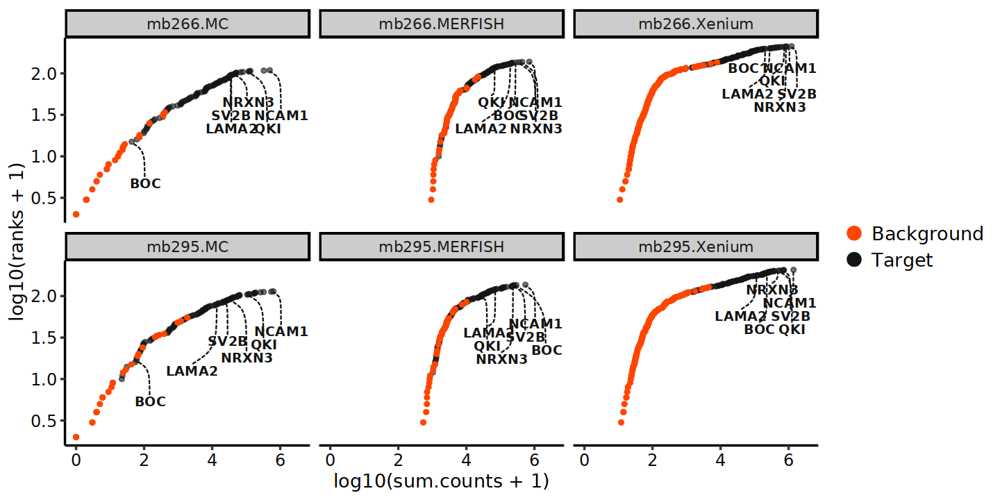

In [587]:
options(repr.plot.height = 6, repr.plot.width = 12)
pl2_bg_samples

In [588]:
df.tp.fp %>% 
    filter(genes == "BOC")

samples,spatial_tech,genes,sum.counts,ranks,TP.FP.BG,TG.BG
<chr>,<chr>,<fct>,<dbl>,<int>,<chr>,<chr>
mb266.Xenium,Xenium,BOC,207247,197,TP,Target
mb295.Xenium,Xenium,BOC,232666,190,TP,Target
mb266.MERFISH,MERFISH,BOC,281540,134,TP,Target
mb295.MERFISH,MERFISH,BOC,294541,135,TP,Target
mb266.MC,MC,BOC,42,14,FP,Target
mb295.MC,MC,BOC,59,16,FP,Target


In [591]:
# export plot
ggsave(pl2_bg_samples,
       file = "./fig4/panel_B/tp_bg_knee.pdf", 
       device = cairo_pdf,
       height = 6, width = 12, dpi = 200)

In [598]:
# export table
data.table::fwrite(df.tp.fp, file = "./fig4/panel_B/table4plot.csv")

In [593]:
# FP genes (ie, targeted within the background gene range) overlap between all samples
FP.in.all <-
# intersect FP target genes
df.tp.fp %>% 
    mutate_if(is.factor, as.character.factor) %>%
    filter(TP.FP.BG == "FP") %>%
    group_by(samples) %>%
    group_split() %>%
    purrr::map(., ~ pull(., genes)) %>%
    purrr::reduce(., intersect)
message("Matched genes from all samples: ", FP.in.all %>% length())
FP.in.all

Matched genes from all samples: 9



[1] "GFI1"    "LMX1A"   "IL4"     "FOXJ1"   "CD19"    "TMEM119" "MOG"    
[8] "CD69"    "GFI1B"

In [599]:
df.tp.fp %>% str

Classes ‘data.table’ and 'data.frame':	1006 obs. of  7 variables:
 $ samples     : chr  "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ spatial_tech: chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ genes       : Factor w/ 311 levels "SV2B","NCAM1",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ sum.counts  : num  1225162 874793 837977 766071 624679 ...
 $ ranks       : int  211 210 209 208 207 206 205 204 203 202 ...
 $ TP.FP.BG    : chr  "TP" "TP" "TP" "TP" ...
 $ TG.BG       : chr  "Target" "Target" "Target" "Target" ...
 - attr(*, ".internal.selfref")=<externalptr> 


#### <span style="font-size:11pt; color:gold"> Spatial-Autocorrelation *Moran's I* </span>

In [6]:
# load obj with bg genes
if (!exists("obj.bg")) {
    obj.bg <- 
    readRDS(file = "./segmentation_based/objects/vz.re.xen_matched_bg.rds")
    }

In [7]:
obj.bg
obj.bg %>% getMeta %>% str

An object of class Seurat 
311 features across 930800 samples within 1 assay 
Active assay: MultiTech (311 features, 0 variable features)
 11 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb263.w4a1.Resolve mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb299.w7a1.Resolve mb263.Xenium mb266.Xenium mb295.Xenium mb299.Xenium

'data.frame':	930800 obs. of  12 variables:
 $ orig.ident         : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ z                  : num  3 3 3 3 3 3 3 3 3 3 ...
 $ fov                : logi  NA NA NA NA NA NA ...
 $ samples            : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ spatial_tech       : chr  "Vizgen" "Vizgen" "Vizgen" "Vizgen" ...
 $ segmentation_method: chr  "Cellpose" "Cellpose" "Cellpose" "Cellpose" ...
 $ region             : num  NA NA NA NA NA NA NA NA NA NA ...
 $ tile_num           : num  NA NA NA NA NA NA NA NA NA NA ...
 $ nCount_MultiTech   : num  17 2 1 140 34 64 2 32 60 4 ...
 $ nFeature_MultiTech : int  10 2 1 29 20 24 2 19 31 4 ...
 $ donors             : chr  "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" "mb295.region0.Vizgen" ...
 $ cell_id            : chr  "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.r

In [8]:
obj.bg[[Images(obj.bg)[1]]][["centroids"]] %>% str

Formal class 'Centroids' [package "SeuratObject"] with 7 slots
  ..@ cells      : chr [1:78432] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100013" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" ...
  ..@ nsides     : int 0
  ..@ radius     : num 43.9
  ..@ theta      : num 0
  ..@ coords     : num [1:78432, 1:2] 6811 6840 6845 6856 6824 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : NULL
  .. .. ..$ : chr [1:2] "x" "y"
  ..@ bbox       : num [1:2, 1:2] 6407 6007 10193 10989
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:2] "x" "y"
  .. .. ..$ : chr [1:2] "min" "max"
  ..@ proj4string:Formal class 'CRS' [package "sp"] with 1 slot
  .. .. ..@ projargs: chr NA


In [9]:
obj.bg[[Images(obj.bg)[1]]][["molecules"]] %>% .[[1]] %>% str

Formal class 'SpatialPoints' [package "sp"] with 3 slots
  ..@ coords     : num [1:5520, 1:2] 9892 9823 9887 9825 9941 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : NULL
  .. .. ..$ : chr [1:2] "x" "y"
  ..@ bbox       : num [1:2, 1:2] 6412 6019 9988 10836
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:2] "x" "y"
  .. .. ..$ : chr [1:2] "min" "max"
  ..@ proj4string:Formal class 'CRS' [package "sp"] with 1 slot
  .. .. ..@ projargs: chr NA


In [10]:
obj.bg[[Images(obj.bg)[1]]][["segmentation"]] %>% .@polygons %>% .[[1]] %>% str

Formal class 'Polygons' [package "sp"] with 5 slots
  ..@ Polygons :List of 1
  .. ..$ :Formal class 'Polygon' [package "sp"] with 5 slots
  .. .. .. ..@ labpt  : num [1:2] 6811 6409
  .. .. .. ..@ area   : num 60.2
  .. .. .. ..@ hole   : logi FALSE
  .. .. .. ..@ ringDir: int 1
  .. .. .. ..@ coords : num [1:14, 1:2] 6807 6810 6811 6812 6814 ...
  .. .. .. .. ..- attr(*, "dimnames")=List of 2
  .. .. .. .. .. ..$ : NULL
  .. .. .. .. .. ..$ : chr [1:2] "x" "y"
  ..@ plotOrder: int 1
  ..@ labpt    : num [1:2] 6811 6409
  ..@ ID       : chr "Vz_mb295.region0.Vizgen_112833000000100009"
  ..@ area     : num 60.2


<span style="font-size:10pt; color:gold"> (optional) Subset obj to ***MB295, 266*** samples </span> <br />


In [11]:
# if not already subsetted, -> Subset to keep only 2 samples - mb295 and mb266 ----
subset_obj <- TRUE
if (subset_obj) {
    cells.use <- 
  obj.bg %>%
  getMeta %>%  
  slice(pull(., samples) %>% grep("295|266", .)) %>% rownames

# subset obj and FOVs ----
# load modified subset function
source("./scripts/subset_obj_seurat_v2.R")
obj.bg %<>% subset_opt(cells = cells.use)

# Update metadata ----
obj.bg@meta.data %<>%
  mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = ""))
    }

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found only in FOV: 
mb295.region0.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.region1.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.w5a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a2.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.Xenium

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.Xenium

Subsetting Centroids..

Removing FOVs where cells are NOT found: 
mb263.w4a1.Resolve
mb299.w7a1.Resolve
mb263.Xenium
mb299.Xenium


Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“A

In [12]:
obj.bg

An object of class Seurat 
311 features across 522396 samples within 1 assay 
Active assay: MultiTech (311 features, 0 variable features)
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb266.Xenium mb295.Xenium

In [13]:
# FOVs or geometries info
obj.bg[[Images(obj.bg)[7]]]

Spatial coordinates for 181935 cells and 541 molecules
 First 10 molecules: ABCC9, ADAMTS12, ADAMTS16, ADAMTS3, ADRA1A, ADRA1B
Default segmentation boundary: centroids 
 1 other segmentation boundaries present: segmentation 
Associated assay: Xenium 
Key: mb295xenium_ 

In [14]:
obj.bg %>% getMeta %>% 
    pull(samples) %>% table

.
    mb266.MC mb266.Vizgen mb266.Xenium     mb295.MC mb295.Vizgen mb295.Xenium 
       34625        61532       125056        40816        78432       181935 

In [ ]:
#obj.bg %>% rownames

In [9]:
# keep original obj
#obj.bg_cloned <- obj.bg

In [37]:
# QC variables and plot params         
message("Setting QC variables and plot params..")
meta.vars <- grep("nCount_|nFeature_|percent_", names(getMeta(obj.bg)), value = TRUE)
message("QC variables are :", paste0("\n", ">>> ", meta.vars))

# if TRUE - using whole obj name, else other metadata var.. 
meta.var.use <- c("orig.ident", "samples", "spatial_tech")
use.orig.ident <- FALSE
if (use.orig.ident) { meta.var <- "orig.ident" } else { meta.var <- "samples" }
#meta.var <- "spatial_tech"
meta.var

# add colors for meta var (ie samples) 
meta.var.col <- colorRampPalette(RColorBrewer::brewer.pal(10, "Paired"))(table(obj.bg[[meta.var]]) %>%
 names %>% length)
meta.var.col %>% glimpse()

# title for meta.var
#paste0(substring(meta.var, 1, 1) %>% toupper, substring(meta.var, 2, nchar(meta.var)))
meta.var.title <- stringr::str_to_title(meta.var)

# custom text sizes for plots
legend.text.size <- 16
base_size <- 18
axis.text.size <- 14
   
# choose plot theme, eg dark or white
use.dark.theme <- FALSE # if FALSE - white bg is used for plots

# choose plot colors scheme..
use.colors.opt <- "fire" # options are: "inferno" or "fire"
# colors/fill scale gradient
if (use.dark.theme && use.colors.opt == "fire") {
    scale.col <- 
        cet_pal(11, name = use.colors.opt)[4:11] %>% .[c(1,3,5,6:8)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "fire") {
    scale.col <-
        cet_pal(11, name = use.colors.opt)[1:9] %>% .[c(1,3,5,6,7,9)] %>% rev
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:9)]
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size) %>% dark_mode
    axis.text.col <- "gray96"
    gam.line.col <- alpha("green1", 0.9)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using Dark Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
} else if (!use.dark.theme && use.colors.opt == "inferno") {
    scale.col <- 
        c(viridis::viridis(11, option = use.colors.opt))[3:11] %>% .[c(1,3,5,7:8)] %>% 
        rev %>% c("gray4")
    low.col <- scale.col[1:3]
    high.col <- scale.col[4:6]
    theme2use <- theme_classic(base_size = base_size)
    axis.text.col <- "gray4"
    gam.line.col <- alpha("green4", 0.7)
    color.dens <- alpha("dodgerblue2", 0.9)
    message("Using White Theme & ", paste0("'", use.colors.opt, "'"), " color scale")
}

# transparent theme for white bg
theme_transparent_2 <- theme(panel.background = element_rect(fill = "transparent"),
                             plot.background = element_rect(fill = "transparent", color = NA),
                             panel.grid.major = element_blank(), 
                             panel.grid.minor = element_blank(), 
                             legend.background = element_rect(fill = "transparent"))


Setting QC variables and plot params..

QC variables are :
>>> nCount_MultiTech
>>> nFeature_MultiTech



[1] "samples"

 chr [1:6] "#A6CEE3" "#94CA92" "#AB9C6D" "#ED5C3D" "#F4892A" "#6A3D9A"


Using White Theme & 'fire' color scale



##### <span style="font-size:11pt; color:gold"> Run `moranfast::moranfast` </span>
<span style="font-size:10pt; color:tomato">..on raw or `SCT` normalized assay </span> 

In [157]:
# set assay to use
assay_use <- "MultiTech"
#assay_use <- "SCT"
message("Assay: ", assay_use, " will be used for count matrix")
count_matrix <- GetAssayData(obj.bg, assay = assay_use, slot = "counts")
count_matrix %>% str

Assay: MultiTech will be used for count matrix



Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:12538924] 13 16 23 28 55 66 69 80 87 89 ...
  ..@ p       : int [1:594707] 0 10 12 13 42 62 86 88 107 138 ...
  ..@ Dim     : int [1:2] 311 594706
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:311] "CD4" "TLL1" "EPHA8" "CD69" ...
  .. ..$ : chr [1:594706] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100013" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" ...
  ..@ x       : num [1:12538924] 1 3 1 2 1 3 1 1 3 1 ...
  ..@ factors : list()


In [31]:
pl_test <- ImageFeaturePlot(obj.bg,
                 fov = Images(obj.bg)[7],
                 features = "LAMA2",     
                 size = 0.3,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 #scale = "none",    
                 alpha = 0.7,
                 axes = TRUE,
                 combine = TRUE)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


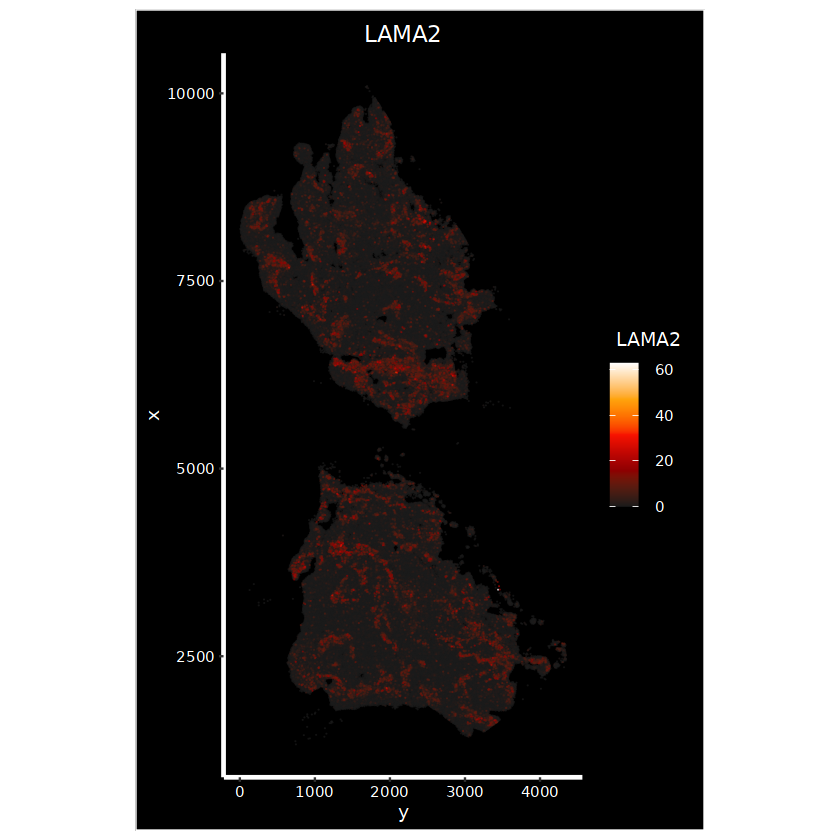

In [32]:
pl_test$data %<>% arrange(LAMA2) # sort in increasing/ascending pattern
pl_test & scale_fill_gradientn(colours = c("gray10", cet_pal(5, name = "fire")[-1])) 

In [ ]:
# Run Spatial Autocorrelation using Moran's I 
# moran's I (global) -> compute per sample section/FOV
start.time <- Sys.time()
pbapply::pboptions(type = "timer", style = 1, char = "=")
obj.moransI.fast <-
  pbapply::pblapply(obj.bg %>% 
                      Images() %>% seq, 
                    function(im) { 
                      BiocParallel::bplapply(obj.bg %>% rownames %>% seq, function(i) {
                        msi <-  
                        moranfast::moranfast(x = 
                                             # count matrix per sample
                                             # using raw or normalized assay
                                             count_matrix %>%  
                                               .[i, match(obj.bg[[Images(obj.bg)[im]]] %>% Cells(),
                                                          obj.bg %>% Cells()) %>% na.omit()],
                                             c1 = obj.bg[[Images(obj.bg)[im]]][["centroids"]] %>% 
                                               GetTissueCoordinates() %>% pull(x),
                                             c2 = obj.bg[[Images(obj.bg)[im]]][["centroids"]] %>% 
                                               GetTissueCoordinates() %>% pull(y),
                                             alternative = "greater")   
                       # add total counts of a gene in all cells - per sample section/FOV   
                       sum.counts <- 
                          count_matrix %>% .[i, match(obj.bg[[Images(obj.bg)[im]]] %>% Cells(),
                             obj.bg %>% Cells()) %>% na.omit()] %>% sum
                       msi$sum.counts <- sum.counts
                       return(msi)
                      }, BPPARAM = BiocParallel::MulticoreParam(18, tasks = 20L,
                                                                force.GC = FALSE,
                                                                progressbar = TRUE)
                      ) %>%
                        # convert/make df data
                        data.table::rbindlist(.) %>%
                        mutate(samples = Images(obj.bg)[im],
                               genes = rownames(obj.bg),
                               genes_group = 
                                 case_when(
                                   grepl(pattern = "Blank-|FP |NegControlProbe|UnassignedCodeword", x = rownames(obj.bg)) ~ "Background",
                                   !grepl(pattern = "Blank-|FP |NegControlProbe|UnassignedCodeword", x = rownames(obj.bg)) ~ "Target"))
                    })

end.time <- Sys.time()
end.time - start.time

In [183]:
obj.moransI.fast_cloned <- obj.moransI.fast

In [184]:
# save temp out
saveRDS(object = obj.moransI.fast, file = "./test/obj.moransI.fast_list.rds")

In [198]:
# update and make a dataframe
obj.moransI.fast %<>%
    data.table::rbindlist() %>%
    mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w[4,5,7]a..|", 
                                replacement = ""),
           spatial_tech = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].|mb2[6-9][3-9].", 
                                replacement = ""),
           spatial_statistic = "Morans_I") %>% 
    mutate_if(is.character,
              ~ stringr::str_replace_all(., c("Resolve" = "MC", "Vizgen" = "MERFISH"))) %>% 
    arrange(observed %>% desc)

In [199]:
obj.moransI.fast %>% str

Classes ‘data.table’ and 'data.frame':	2177 obs. of  10 variables:
 $ observed         : num  0.0835 0.0727 0.0683 0.0671 0.0669 ...
 $ expected         : num  -0.000008 -0.0000163 -0.0000163 -0.0000128 -0.0000128 ...
 $ sd               : num  0.0000214 0.0000425 0.0000425 0.0000341 0.0000341 ...
 $ p.value          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ sum.counts       : num  105538 281540 81554 294541 114447 ...
 $ samples          : chr  "mb266.Xenium" "mb266.MERFISH" "mb266.MERFISH" "mb295.MERFISH" ...
 $ genes            : chr  "HHIP" "BOC" "MYCN" "BOC" ...
 $ genes_group      : chr  "Target" "Target" "Target" "Target" ...
 $ spatial_tech     : chr  "Xenium" "MERFISH" "MERFISH" "MERFISH" ...
 $ spatial_statistic: chr  "Morans_I" "Morans_I" "Morans_I" "Morans_I" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [200]:
# save .csv
data.table::fwrite(obj.moransI.fast, file = "./test/spatial_autocorr_moransI.csv")

##### <span style="font-size:11pt; color:gold"> If run on HPC, load saved table of Spatial autocorrelation results </span>

In [12]:
# if run on HPC, load saved table
obj.moransI.fast <- 
    data.table::fread./test/ob.   #data.table::fread(file = ".)    
obj.moransI.fast %>% str

Classes ‘data.table’ and 'data.frame':	2177 obs. of  10 variables:
 $ observed         : num  0.0835 0.0727 0.0683 0.0671 0.0669 ...
 $ expected         : num  -0.000008 -0.0000163 -0.0000163 -0.0000128 -0.0000128 ...
 $ sd               : num  0.0000214 0.0000425 0.0000425 0.0000341 0.0000341 ...
 $ p.value          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ sum.counts       : int  105538 281540 81554 294541 114447 125096 238074 39759 84316 33779 ...
 $ samples          : chr  "mb266.Xenium" "mb266.MERFISH" "mb266.MERFISH" "mb295.MERFISH" ...
 $ genes            : chr  "HHIP" "BOC" "MYCN" "BOC" ...
 $ genes_group      : chr  "Target" "Target" "Target" "Target" ...
 $ spatial_tech     : chr  "Xenium" "MERFISH" "MERFISH" "MERFISH" ...
 $ spatial_statistic: chr  "Morans_I" "Morans_I" "Morans_I" "Morans_I" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [15]:
# FP genes as of all techs together.
# provided that df.tp.fp exists
if (exists("df.tp.fp")) {
    } else { 
        # load it
        df.tp.fp <- 
            data.table::fread(file = "./spatial_techs_compare/fig4/panel_B/table4plot.csv")
    }
df.tp.fp %>% str

Classes ‘data.table’ and 'data.frame':	1006 obs. of  7 variables:
 $ samples     : chr  "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ spatial_tech: chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ genes       : chr  "SV2B" "NCAM1" "NRXN3" "QKI" ...
 $ sum.counts  : int  1225162 874793 837977 766071 624679 535411 485805 424709 421297 369208 ...
 $ ranks       : int  211 210 209 208 207 206 205 204 203 202 ...
 $ TP.FP.BG    : chr  "TP" "TP" "TP" "TP" ...
 $ TG.BG       : chr  "Target" "Target" "Target" "Target" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [16]:
fp_genes <-
lapply(df.tp.fp$spatial_tech %>% unique %>% seq, function(i) {
    df.tp.fp %>%
    mutate_if(is.factor, as.character.factor) %>%
    filter(spatial_tech == c(spatial_tech %>% unique)[i], 
           TP.FP.BG == "FP") %>% select(genes, spatial_tech, TP.FP.BG)})
fp_genes %>% str

List of 3
 $ :Classes ‘data.table’ and 'data.frame':	37 obs. of  3 variables:
  ..$ genes       : chr [1:37] "GPC5" "OLIG2" "FCGR3A" "PRDM6" ...
  ..$ spatial_tech: chr [1:37] "Xenium" "Xenium" "Xenium" "Xenium" ...
  ..$ TP.FP.BG    : chr [1:37] "FP" "FP" "FP" "FP" ...
  ..- attr(*, ".internal.selfref")=<externalptr> 
 $ :Classes ‘data.table’ and 'data.frame':	93 obs. of  3 variables:
  ..$ genes       : chr [1:93] "PBX3" "DCAF4" "CD163" "GRIN2B" ...
  ..$ spatial_tech: chr [1:93] "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
  ..$ TP.FP.BG    : chr [1:93] "FP" "FP" "FP" "FP" ...
  ..- attr(*, ".internal.selfref")=<externalptr> 
 $ :Classes ‘data.table’ and 'data.frame':	58 obs. of  3 variables:
  ..$ genes       : chr [1:58] "GLRA1" "EPHA5" "GFI1" "FCGR3A" ...
  ..$ spatial_tech: chr [1:58] "MC" "MC" "MC" "MC" ...
  ..$ TP.FP.BG    : chr [1:58] "FP" "FP" "FP" "FP" ...
  ..- attr(*, ".internal.selfref")=<externalptr> 


In [17]:
# make sure FP genes are FP per tech!!
obj.moransI.fast <-
lapply(seq(fp_genes), function(i) {
    obj.moransI.fast %>% 
    filter(spatial_tech == c(spatial_tech %>% unique)[i]) %>%
    mutate(genes_group = case_when(grepl(pattern = "Blank-|FP |NegControlProbe|UnassignedCodeword", 
                                         x = genes) ~ "Background",
                        !grepl(pattern = "Blank-|FP |NegControlProbe|UnassignedCodeword", 
                               x = genes) ~ "Target"),
           TP_FP_BG = genes_group,
           TP_FP_BG = case_when(genes %in% fp_genes[[i]]$genes ~ "FP", 
                                genes_group == "Target" ~ "TP",
                                genes_group == "Background" ~ "BG"))
}) %>% data.table::rbindlist()
obj.moransI.fast %<>% 
    # normalized moransI $observed from min-max
    mutate(observed_scaled = scales::rescale(observed))
obj.moransI.fast %>% str

Classes ‘data.table’ and 'data.frame':	2177 obs. of  12 variables:
 $ observed         : num  0.0835 0.0432 0.0386 0.0376 0.0373 ...
 $ expected         : num  -0.000008 -0.000008 -0.000008 -0.000008 -0.000008 ...
 $ sd               : num  0.0000214 0.0000214 0.0000214 0.0000214 0.0000214 ...
 $ p.value          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ sum.counts       : int  105538 1225162 71133 207247 837977 485805 237723 366079 369208 91479 ...
 $ samples          : chr  "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ genes            : chr  "HHIP" "SV2B" "MYCN" "BOC" ...
 $ genes_group      : chr  "Target" "Target" "Target" "Target" ...
 $ spatial_tech     : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ spatial_statistic: chr  "Morans_I" "Morans_I" "Morans_I" "Morans_I" ...
 $ TP_FP_BG         : chr  "TP" "TP" "TP" "TP" ...
 $ observed_scaled  : num  1 0.518 0.464 0.452 0.448 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [18]:
# export as table .csv 
data.table::fwrite(obj.moransI.fast, 
                   file = "./spatial_techs_compare/fig4/panel_C/spatial_autocorr_moransI.csv")

In [283]:
#plot of gene expression (sum.counts) as a function of spatial autocorrelation
options(repr.plot.height = 5, repr.plot.width = 25)
test <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05) %>%
    arrange(desc(observed_scaled)) %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    ggplot(aes(x = observed_scaled, y = sum.counts) &
    geom_point(aes(fill = "genes_group")) &
    theme_classic(base_size = 20)       
           

ERROR: Error in parse(text = x, srcfile = src): <text>:13:0: unexpected end of input
11:     theme_classic(base_size = 20)       
12:            
   ^


In [ ]:
options(repr.plot.height = 5, repr.plot.width = 5)
test

In [21]:
# all target genes
# heatmap plot
pl1_sa <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05 & genes_group == "Target") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - matched target genes", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

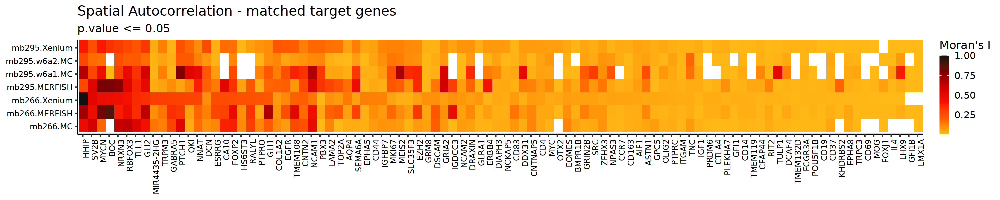

In [22]:
options(repr.plot.height = 5, repr.plot.width = 25)
pl1_sa

In [23]:
# export as pdf
ggsave(pl1_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_96genes.pdf", 
       device = cairo_pdf,
       height = 5, width = 25, dpi = 200)

In [24]:
# plot only TP genes
pl2_sa <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05 & TP_FP_BG == "TP") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - TP genes only", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

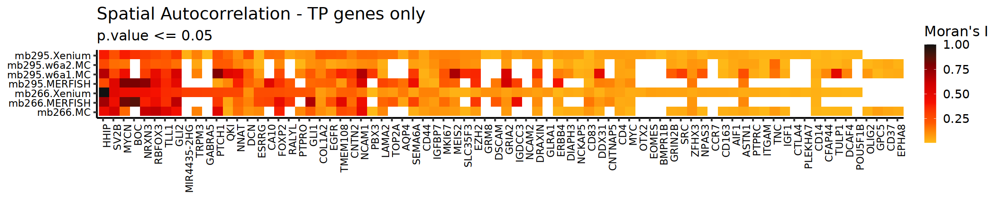

In [25]:
options(repr.plot.height = 4, repr.plot.width = 20)
pl2_sa

In [26]:
# export as pdf
ggsave(pl2_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_TP.pdf", 
       device = cairo_pdf,
       height = 4, width = 20, dpi = 200)

In [27]:
# plot only FP genes
pl3_sa <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05 & TP_FP_BG == "FP") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - FP genes only", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

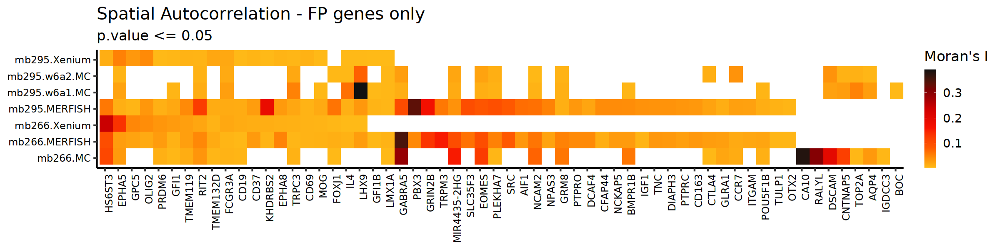

In [28]:
options(repr.plot.height = 5, repr.plot.width = 20)
pl3_sa

In [29]:
# export as pdf
ggsave(pl3_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_FP.pdf", 
       device = cairo_pdf,
       height = 5, width = 20, dpi = 200)

In [30]:
# plot only BG genes
pl4_sa <-
obj.moransI.fast %>%
    filter(TP_FP_BG == "BG") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - BG genes only", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

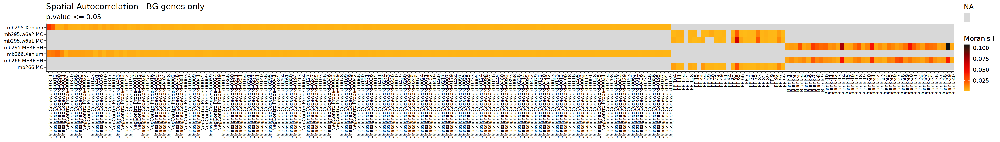

In [31]:
options(repr.plot.height = 6, repr.plot.width = 42)
pl4_sa

In [32]:
# export as pdf
ggsave(pl4_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_BG.pdf", 
       device = cairo_pdf,
       height = 6, width = 42, dpi = 200)

In [12]:
# if run on HPC, load saved table
obj.moransI.fast <- 
    data.table::fread./test/ob.   #data.table::fread(file = ".)    
obj.moransI.fast %>% str

Classes ‘data.table’ and 'data.frame':	2177 obs. of  10 variables:
 $ observed         : num  0.0835 0.0727 0.0683 0.0671 0.0669 ...
 $ expected         : num  -0.000008 -0.0000163 -0.0000163 -0.0000128 -0.0000128 ...
 $ sd               : num  0.0000214 0.0000425 0.0000425 0.0000341 0.0000341 ...
 $ p.value          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ sum.counts       : int  105538 281540 81554 294541 114447 125096 238074 39759 84316 33779 ...
 $ samples          : chr  "mb266.Xenium" "mb266.MERFISH" "mb266.MERFISH" "mb295.MERFISH" ...
 $ genes            : chr  "HHIP" "BOC" "MYCN" "BOC" ...
 $ genes_group      : chr  "Target" "Target" "Target" "Target" ...
 $ spatial_tech     : chr  "Xenium" "MERFISH" "MERFISH" "MERFISH" ...
 $ spatial_statistic: chr  "Morans_I" "Morans_I" "Morans_I" "Morans_I" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [15]:
# FP genes as of all techs together.
# provided that df.tp.fp exists
if (exists("df.tp.fp")) {
    } else { 
        # load it
        df.tp.fp <- 
            data.table::fread(file = "./spatial_techs_compare/fig4/panel_B/table4plot.csv")
    }
df.tp.fp %>% str

Classes ‘data.table’ and 'data.frame':	1006 obs. of  7 variables:
 $ samples     : chr  "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ spatial_tech: chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ genes       : chr  "SV2B" "NCAM1" "NRXN3" "QKI" ...
 $ sum.counts  : int  1225162 874793 837977 766071 624679 535411 485805 424709 421297 369208 ...
 $ ranks       : int  211 210 209 208 207 206 205 204 203 202 ...
 $ TP.FP.BG    : chr  "TP" "TP" "TP" "TP" ...
 $ TG.BG       : chr  "Target" "Target" "Target" "Target" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [16]:
fp_genes <-
lapply(df.tp.fp$spatial_tech %>% unique %>% seq, function(i) {
    df.tp.fp %>%
    mutate_if(is.factor, as.character.factor) %>%
    filter(spatial_tech == c(spatial_tech %>% unique)[i], 
           TP.FP.BG == "FP") %>% select(genes, spatial_tech, TP.FP.BG)})
fp_genes %>% str

List of 3
 $ :Classes ‘data.table’ and 'data.frame':	37 obs. of  3 variables:
  ..$ genes       : chr [1:37] "GPC5" "OLIG2" "FCGR3A" "PRDM6" ...
  ..$ spatial_tech: chr [1:37] "Xenium" "Xenium" "Xenium" "Xenium" ...
  ..$ TP.FP.BG    : chr [1:37] "FP" "FP" "FP" "FP" ...
  ..- attr(*, ".internal.selfref")=<externalptr> 
 $ :Classes ‘data.table’ and 'data.frame':	93 obs. of  3 variables:
  ..$ genes       : chr [1:93] "PBX3" "DCAF4" "CD163" "GRIN2B" ...
  ..$ spatial_tech: chr [1:93] "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
  ..$ TP.FP.BG    : chr [1:93] "FP" "FP" "FP" "FP" ...
  ..- attr(*, ".internal.selfref")=<externalptr> 
 $ :Classes ‘data.table’ and 'data.frame':	58 obs. of  3 variables:
  ..$ genes       : chr [1:58] "GLRA1" "EPHA5" "GFI1" "FCGR3A" ...
  ..$ spatial_tech: chr [1:58] "MC" "MC" "MC" "MC" ...
  ..$ TP.FP.BG    : chr [1:58] "FP" "FP" "FP" "FP" ...
  ..- attr(*, ".internal.selfref")=<externalptr> 


In [17]:
# make sure FP genes are FP per tech!!
obj.moransI.fast <-
lapply(seq(fp_genes), function(i) {
    obj.moransI.fast %>% 
    filter(spatial_tech == c(spatial_tech %>% unique)[i]) %>%
    mutate(genes_group = case_when(grepl(pattern = "Blank-|FP |NegControlProbe|UnassignedCodeword", 
                                         x = genes) ~ "Background",
                        !grepl(pattern = "Blank-|FP |NegControlProbe|UnassignedCodeword", 
                               x = genes) ~ "Target"),
           TP_FP_BG = genes_group,
           TP_FP_BG = case_when(genes %in% fp_genes[[i]]$genes ~ "FP", 
                                genes_group == "Target" ~ "TP",
                                genes_group == "Background" ~ "BG"))
}) %>% data.table::rbindlist()
obj.moransI.fast %<>% 
    # normalized moransI $observed from min-max
    mutate(observed_scaled = scales::rescale(observed))
obj.moransI.fast %>% str

Classes ‘data.table’ and 'data.frame':	2177 obs. of  12 variables:
 $ observed         : num  0.0835 0.0432 0.0386 0.0376 0.0373 ...
 $ expected         : num  -0.000008 -0.000008 -0.000008 -0.000008 -0.000008 ...
 $ sd               : num  0.0000214 0.0000214 0.0000214 0.0000214 0.0000214 ...
 $ p.value          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ sum.counts       : int  105538 1225162 71133 207247 837977 485805 237723 366079 369208 91479 ...
 $ samples          : chr  "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" "mb266.Xenium" ...
 $ genes            : chr  "HHIP" "SV2B" "MYCN" "BOC" ...
 $ genes_group      : chr  "Target" "Target" "Target" "Target" ...
 $ spatial_tech     : chr  "Xenium" "Xenium" "Xenium" "Xenium" ...
 $ spatial_statistic: chr  "Morans_I" "Morans_I" "Morans_I" "Morans_I" ...
 $ TP_FP_BG         : chr  "TP" "TP" "TP" "TP" ...
 $ observed_scaled  : num  1 0.518 0.464 0.452 0.448 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [18]:
# export as table .csv 
data.table::fwrite(obj.moransI.fast, 
                   file = "./spatial_techs_compare/fig4/panel_C/spatial_autocorr_moransI.csv")

In [283]:
#plot of gene expression (sum.counts) as a function of spatial autocorrelation
options(repr.plot.height = 5, repr.plot.width = 25)
test <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05) %>%
    arrange(desc(observed_scaled)) %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    ggplot(aes(x = observed_scaled, y = sum.counts) &
    geom_point(aes(fill = "genes_group")) &
    theme_classic(base_size = 20)       
           

ERROR: Error in parse(text = x, srcfile = src): <text>:13:0: unexpected end of input
11:     theme_classic(base_size = 20)       
12:            
   ^


In [ ]:
options(repr.plot.height = 5, repr.plot.width = 5)
test

In [21]:
# all target genes
# heatmap plot
pl1_sa <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05 & genes_group == "Target") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - matched target genes", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

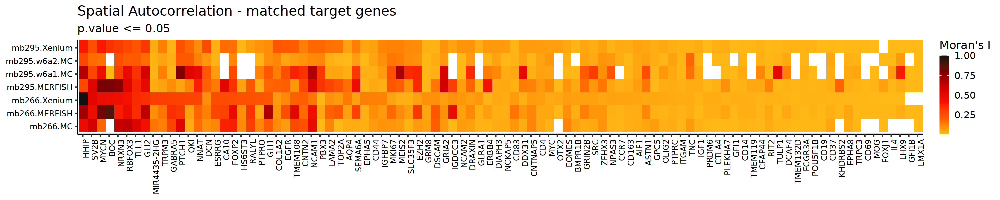

In [22]:
options(repr.plot.height = 5, repr.plot.width = 25)
pl1_sa

In [23]:
# export as pdf
ggsave(pl1_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_96genes.pdf", 
       device = cairo_pdf,
       height = 5, width = 25, dpi = 200)

In [24]:
# plot only TP genes
pl2_sa <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05 & TP_FP_BG == "TP") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - TP genes only", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

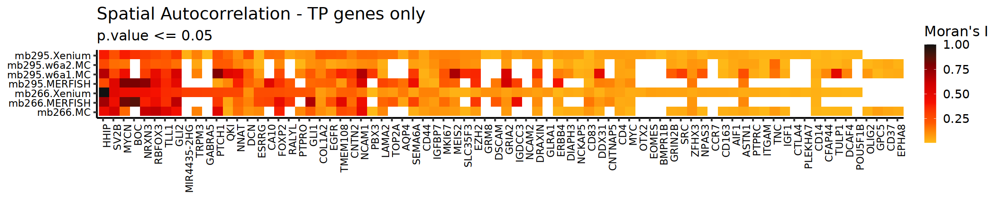

In [25]:
options(repr.plot.height = 4, repr.plot.width = 20)
pl2_sa

In [26]:
# export as pdf
ggsave(pl2_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_TP.pdf", 
       device = cairo_pdf,
       height = 4, width = 20, dpi = 200)

In [27]:
# plot only FP genes
pl3_sa <-
obj.moransI.fast %>%
    # only significant genes at 5%
    filter(p.value <= 0.05 & TP_FP_BG == "FP") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - FP genes only", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

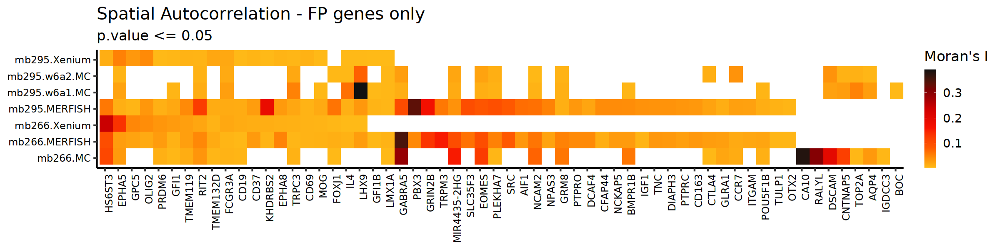

In [28]:
options(repr.plot.height = 5, repr.plot.width = 20)
pl3_sa

In [29]:
# export as pdf
ggsave(pl3_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_FP.pdf", 
       device = cairo_pdf,
       height = 5, width = 20, dpi = 200)

In [30]:
# plot only BG genes
pl4_sa <-
obj.moransI.fast %>%
    filter(TP_FP_BG == "BG") %>%
    mutate(genes = factor(genes, levels = pull(., genes) %>% unique())) %>%
    arrange(desc(observed_scaled)) %>%
    ggplot(aes(x = genes, y = samples, 
               colour = if (any(observed_scaled %>% is.na)) { "" }
                        )) &
                        #geom_tile(aes(fill = observed)) &
                        geom_raster(aes(fill = observed_scaled), 
                                    interpolate = F, show.legend = TRUE,
                                    hjust = 0.6, vjust = 0.6) &
   theme_classic(base_size = 20) &
   theme(legend.text = element_text(size = 17),
        axis.text = element_text(color = "black",
                                 size = 14),
        legend.position = "right",
        legend.key.height = grid::unit(1,"cm"),
        legend.key.width = grid::unit(0.6,"cm"),
        axis.text.x = element_text(angle = 90, vjust = 1, hjust = 1),
        plot.background = element_rect(fill = "white", color = "white")) &
   scale_fill_gradientn(name = "Moran's I", 
                        colours = scale.col,
                        na.value = alpha("gray70", 0.5)) &
                        { 
                          list(
                            scale_colour_manual(values = NA),
                            guides(colour = 
                                     guide_legend(title = "NA", order = 1,
                                                  override.aes = list(colour = alpha("gray70", 0.5), 
                                                                      fill = alpha("gray70", 0.5)
                                                  )))
                          )} &
   labs(title = "Spatial Autocorrelation - BG genes only", subtitle = "p.value <= 0.05", x = NULL, y = NULL) 

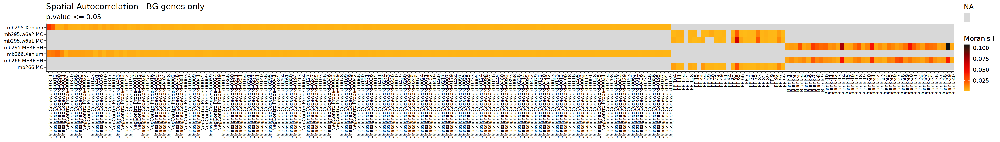

In [31]:
options(repr.plot.height = 6, repr.plot.width = 42)
pl4_sa

In [32]:
# export as pdf
ggsave(pl4_sa,
       file = "./spatial_techs_compare/fig4/panel_C/sp_autocorr_BG.pdf", 
       device = cairo_pdf,
       height = 6, width = 42, dpi = 200)

In [64]:
# Spatial plots
# plot nCounts & nFeature
if (!exists("scale.col_sp")) { 
    scale.col_sp <- c(alpha("gray12", 0.4), cet_pal(16, name = "fire")[2:16])
}

use.other.cols <- TRUE
if (use.other.cols) { 
# alternative colors
scale.col_sp <- c("deeppink", "navyblue", "cyan", 
               "yellow", "orangered", "gray14") %>% rev
    }

#i <- 5 # FOV to use
#Images(obj.bg)[i]
markers <- 
    c("HHIP", "BOC", "LAMA2", "NRXN3", "TULP1")
sp_pl1 <-
ImageFeaturePlot(obj.bg,
                 #fov = Images(obj.bg)[i],
                 fov = Images(obj.bg), # all FOVs
                 features = markers,
                 #cols = scale.col_sp,
                 #molecules = "LAMA2",
                 #mols.cols = "cyan1",
                 #mols.size = 0.5,
                 #nmols = 1000,
                 size = 1,
                 border.size = NA,
                 #border.color = alpha("blue1", 0.3),
                 boundaries = "centroids",
                 alpha = 0.7,
                 axes = TRUE,
                 combine = FALSE) 

# arrange data in an increasing order
for (i in markers %>% seq) {
    #sp_pl1[[i]]$data <- 
    #sp_pl1[[i]]$data[order(sp_pl1[[i]]$data[[markers[i]]]),]
    # sort using dpyr
    sp_pl1[[i]]$data %<>% arrange(!!as.symbol(markers[i]))
}
sp_pl1 %>% class
sp_pl1 %>% length

[1] "list"

[1] 35

In [65]:
# add FOV names as subtitle 
# repeat FOV names give number of genes
subtitle.fov <- 
    lapply(Images(obj.bg) %>% seq, 
           function(i) 
           rep_len(Images(obj.bg)[i], length.out = markers %>% length)) %>% 
           unlist
sp_pl1 <- 
lapply(sp_pl1 %>% seq, function(i) {
    sp_pl1[[i]] & 
    labs(subtitle = subtitle.fov[i]) &
    scale_fill_gradientn(colours = c("gray10", cet_pal(5, name = "fire")[-1])) })

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale

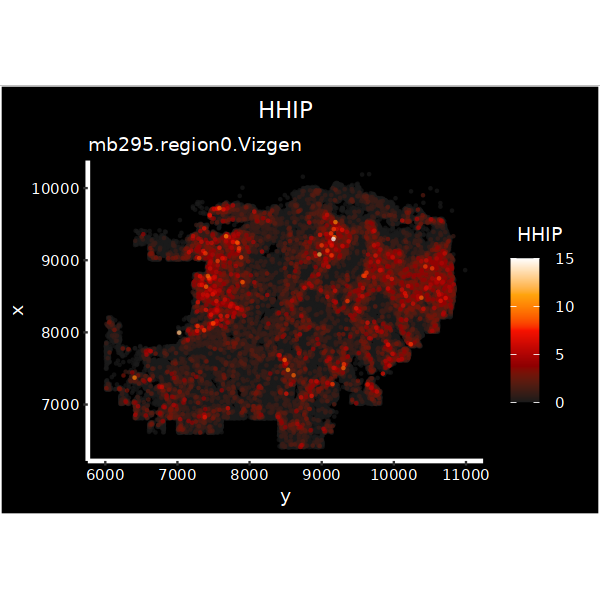

In [69]:
options(repr.plot.height = 5, repr.plot.width = 5)
sp_pl1[[1]]

In [77]:
sp_pl1 <- wrap_plots(sp_pl1, ncol = 5)

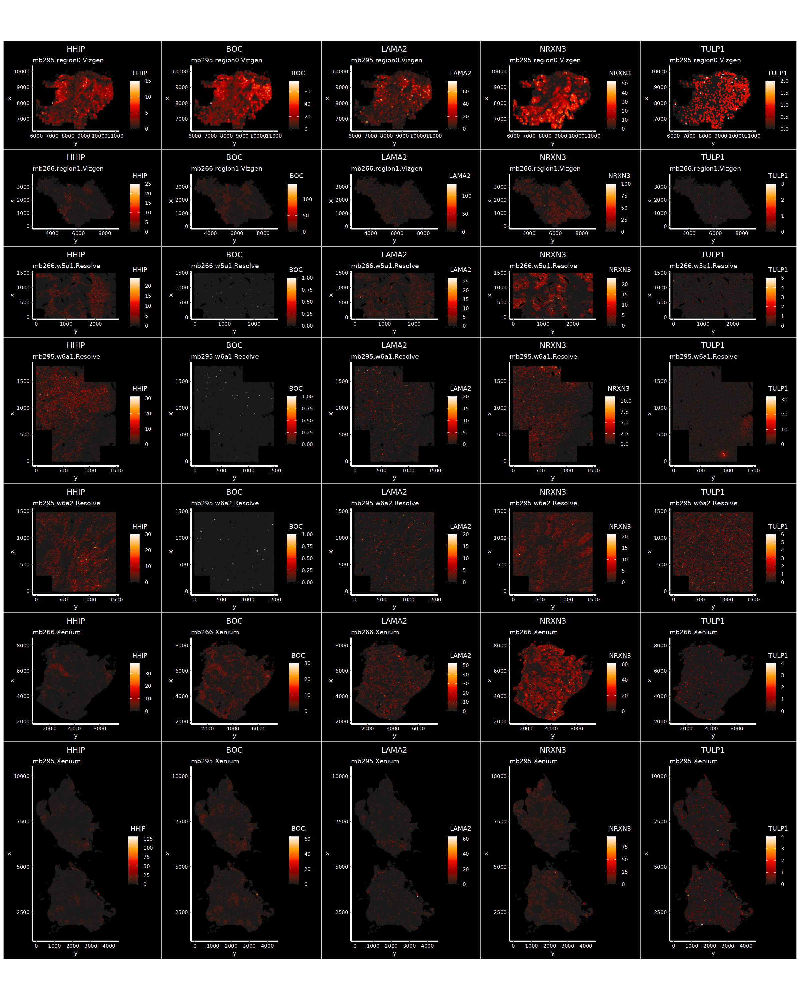

In [78]:
options(repr.plot.height = 25, repr.plot.width = 20)
sp_pl1

In [81]:
# save plot as pdf or png
ggsave(sp_pl1,
       file = "./fig4/panel_X/selected_markers_expression.png", 
       device = "png",
       height = 25, width = 20, dpi = 300)

#### <span style="font-size:12pt; color:gold"> Subset obj `VizResScXen` to - *mb295 & 266* samples </span>

In [ ]:
# clone original object to use later 
#obj_cloned <- obj
#obj_cloned

In [159]:
# Subset to keep only 2 samples - mb295 and mb266 ----
cells.use <- 
  obj %>%
  getMeta %>%
  slice(pull(., samples) %>% grep("295|266", .)) %>% rownames

# subset obj and FOVs ----
# load modified subset function
source("./scripts/subset_obj_seurat_v2.R")
obj %<>% subset_opt(cells = cells.use)

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found only in FOV: 
mb295.region0.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.region1.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.w5a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a2.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.Xenium

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.Xenium

Subsetting Centroids..

Removing FOVs where cells are NOT found: 
mb263.w4a1.Resolve
mb299.w7a1.Resolve
mb263.Xenium
mb299.Xenium


Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“A

In [163]:
# Update metadata ----
obj@meta.data %<>%
  mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = "") %>%
                     gsub(pattern = "10Xsn", 
                          replacement = "snRNA", .),
           spatial_tech = stringi::stri_replace_all_regex(spatial_tech, 
                                pattern = "10Xsn", 
                                replacement = "snRNA"))
obj

An object of class Seurat 
192 features across 531329 samples within 2 assays 
Active assay: SCT (96 features, 96 variable features)
 1 other assay present: MultiTech
 7 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb266.Xenium mb295.Xenium

In [164]:
obj$samples %>% table
obj$spatial_tech %>% table

.
     mb266.MC mb266.MERFISH   mb266.snRNA  mb266.Xenium      mb295.MC 
        34625         61514          3015        125056         40816 
mb295.MERFISH   mb295.snRNA  mb295.Xenium 
        78402          5966        181935 

.
     MC MERFISH   snRNA  Xenium 
  75441  139916    8981  306991 

#### <span style="font-size:12pt; color:gold"> Gene expression correlation analysis </span>
<span style="font-size:10pt; color:tomato">..*mb295 & 266* </span> <br /> 

In [209]:
# NOTE: run subset obj above to use only 2 samples!!

# match genes in the object
markers <- 
    c("RBFOX3", "GLI1", "DIAPH3", "CNTN2",
      "LAMA2", "NRXN3", "PTCH1", "LRRTM4", 
      "PBX3", "PLEKHA7", "TRPM3", "FOS")
# use markers matched to count matrix
Idents(obj) <- "spatial_tech"
expr_mat <- 
    GetAssayData(obj, slot = "counts", assay = "MultiTech")
expr_mat %>% str

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:12345368] 13 16 23 28 55 66 69 80 87 89 ...
  ..@ p       : int [1:531330] 0 10 12 13 39 58 81 83 101 132 ...
  ..@ Dim     : int [1:2] 96 531329
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:96] "CD4" "TLL1" "EPHA8" "CD69" ...
  .. ..$ : chr [1:531329] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100013" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" ...
  ..@ x       : num [1:12345368] 1 3 1 2 1 3 1 1 3 1 ...
  ..@ factors : list()


In [12]:
# FP genes within BG genes
if (FALSE) {
    markers <- 
    c("GLRA1","EPHA5","GFI1","FCGR3A","LMX1A",
      "CTLA4","IL4","FOXJ1","CD19","TMEM132D",
      "TMEM119","CCR7","MOG","OTX2","CD69","GFI1B")
}

In [210]:
# get HEGs - sorted high expressed genes 
df.expr <- 
FetchData(obj, vars = markers, slot = "counts") %>%
    # add samples/FOV names, and spatial tech
    mutate(spatial_tech = obj$spatial_tech, 
           samples = obj$samples)
df.expr %>% str

# make new df adding some calculations
df.expr.sum <-
df.expr %>%
    # convert from wide to long format
    reshape2::melt(.) %>%
    # rename vars
    rename(genes = variable, transcript_counts = value) %>%
    # group by vars
    group_by(samples, spatial_tech, genes, .drop = FALSE) %>%
    # sum all expression from all cells..
    summarise(sum.counts = sum(transcript_counts)) %>%
    ungroup() %>% 
    group_by(samples) %>%
    group_split() %>%
    purrr::map(., ~ mutate(., ranks = 
                         data.table::frank(., sum.counts, 
                                           ties.method = "dense"),
                          genes = as.character.factor(genes))) %>%
    data.table::rbindlist() %>%
    ungroup %>%
    # order value high-to-low
    arrange(desc(sum.counts))
df.expr.sum %>% head

Warning message in FetchData.Seurat(obj, vars = markers, slot = "counts"):
“The following requested variables were not found: LRRTM4, FOS”


'data.frame':	531329 obs. of  12 variables:
 $ RBFOX3      : num  0 1 12 0 0 1 1 0 0 1 ...
 $ GLI1        : num  0 0 0 1 0 0 0 0 0 0 ...
 $ DIAPH3      : num  0 0 0 0 0 1 0 0 0 0 ...
 $ CNTN2       : num  3 1 1 0 0 1 1 0 2 1 ...
 $ LAMA2       : num  0 0 0 0 3 0 0 0 3 0 ...
 $ NRXN3       : num  3 1 1 0 0 1 1 2 4 1 ...
 $ PTCH1       : num  0 1 1 1 2 1 1 0 0 0 ...
 $ PBX3        : num  0 0 0 0 0 0 0 0 0 0 ...
 $ PLEKHA7     : num  0 0 0 0 0 0 0 0 0 0 ...
 $ TRPM3       : num  0 0 0 0 0 0 0 2 0 0 ...
 $ spatial_tech: Named chr  "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
  ..- attr(*, "names")= chr [1:531329] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100013" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" ...
 $ samples     : Named chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" ...
  ..- attr(*, "names")= chr [1:531329] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vi

Using spatial_tech, samples as id variables

`summarise()` has grouped output by 'samples', 'spatial_tech'. You can override
using the `.groups` argument.


samples,spatial_tech,genes,sum.counts,ranks
<chr>,<chr>,<chr>,<dbl>,<int>
mb266.Xenium,Xenium,NRXN3,476581,10
mb295.Xenium,Xenium,NRXN3,474197,10
mb295.Xenium,Xenium,RBFOX3,348068,9
mb266.Xenium,Xenium,RBFOX3,275912,9
mb295.MERFISH,MERFISH,NRXN3,256252,10
mb295.Xenium,Xenium,PTCH1,220752,8


In [212]:
# get correlations and plots - only 10 genes
pbapply::pboptions(type = "timer", style = 1, char = "=")
corplots.selected.genes <- 
  pbapply::pblapply(c(obj$spatial_tech %>% unique) %>% seq, 
                           function(i) {
                           # cells per tech.    
                           cells_use <- Cells(obj)[which(obj$spatial_tech %in% 
                                                         c(obj$spatial_tech %>% unique)[i])]
                           # gene to use    
                           #genes_use <<- markers %<>% intersect(., rownames(obj))
                            
                           # gene sorted by highest summed expression (should be previously calculated)
                           genes_use <- 
                               df.expr.sum %>%
                               # tech specific HEGS
                               #filter(spatial_tech == c(obj$spatial_tech %>% unique)[i]) %>%
                               pull(genes) %>% 
                               #as.character.factor() %>%
                               unique()
                               
                           # make correlation matrix
                           cormat <- 
                             expr_mat[genes_use, cells_use] %>%
                             as.matrix %>% # convert to dense matrix
                             t %>% # transpose to compare genes (else cells/spots will be compared)
                             cor %>% # compute correlation between each pair
                             round(digits = 2) %>% # round up correlation values
                             reshape2::melt(.) #%>% # convert from wide to long format
                             # sort genes from high to low correlations  
                             #arrange(-desc(value)) %>%
                             #mutate_if(is.factor, as.character.factor)
                            
                           # check for NAs
                           if (any(cormat$value %>% is.na)) {
                             message("NAs are present")
                           } else { message("No NAs - all clean!") }
                           
                           #scale.col <- c("orangered", "blue1", "gray8")
                           
                           # make breaks
                           breaks.cor <- 
                             classInt::classIntervals(c(min(cormat %>% pull(value), na.rm = TRUE), 
                                                        pretty(cormat %>% pull(value) %>% 
                                                               na.omit, n = 20)[-1] %>% 
                                                        sort %>% unique), 
                                                      n = 5, style = "quantile")$brks
                               
                           corplot <-
                             cormat %>%
                             ggplot(aes(x = factor(Var1), y = factor(Var2), fill = value, 
                                        colour = if (any(value %>% is.na)) { "" }
                                       )) &
                             #geom_tile() &
                             geom_raster(interpolate = F, show.legend = TRUE,
                                         hjust = 0.6, vjust = 0.6) &
                             scale_fill_gradient2(name = NULL, 
                                                  #mid = "white",
                                                  low = "navy",
                                                  high = "orangered2",
                                                  breaks = breaks.cor,
                                                  labels = breaks.cor %>% round(digits = 1),
                                                  limits = breaks.cor %>% range,
                                                  na.value = alpha("gray70", 0.5) # NA values
                                                  
                             ) &
                             { if (any(cormat$value %>% is.na)) {
                                 list(
                                 scale_colour_manual(values = NA),
                                 guides(colour = 
                                        guide_legend(title = "NA", order = 1,
                                                     override.aes = list(colour = alpha("gray70", 0.5), 
                                                                         fill = alpha("gray70", 0.5)
                                                                        )))
                             )}} & 
                             theme_classic(base_size = 14) & #%>% dark_mode &
                             theme(axis.text = element_text(size = 14, color = "black"),
                                   legend.text = element_text(size = 14),
                                   legend.position = "right", 
                                   legend.key.height = grid::unit(0.85,"cm"),
                                   legend.key.width = grid::unit(0.5,"cm"), 
                                   axis.text.x = element_text(angle = 90, vjust = 0.6, hjust=1)) &
                             labs(title = "Expression correlations", 
                                  subtitle = c(obj$spatial_tech %>% unique)[i], x = NULL, y = NULL)
                           
                         }
) %>% suppressMessages()

corplots.selected.genes %>% class
corplots.selected.genes %>% length

  |==================================================| 100% elapsed=14s, remaining~00s


[1] "list"

[1] 4

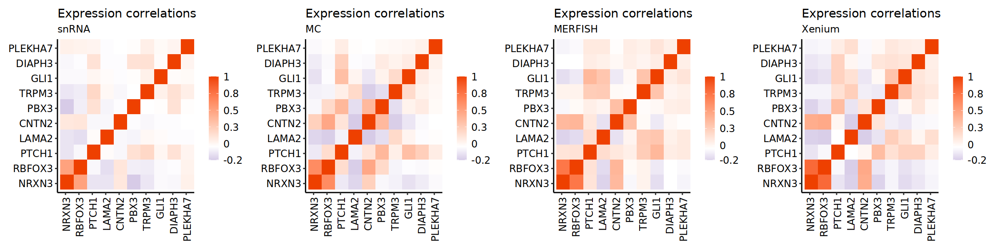

In [213]:
options(repr.plot.height = 5, repr.plot.width = 20)
corplots.selected.genes[c(3,2,1,4)] %>% wrap_plots(nrow = 1)

In [175]:
# clone object
obj_2samples <- obj

<span style="font-size:11pt; color:tomato"> Get correlations between all gene pairs </span> <br />
<span style="font-size:10pt; color:tomato">..filter for genes with high and anti-correlations </span> <br /> 


In [218]:
pbapply::pboptions(type = "timer", style = 1, char = "=")
corr.dfs <- 
  pbapply::pblapply(c(obj$spatial_tech %>% unique) %>% seq, 
                           function(i) {
                           # cells per tech.    
                           cells_use <- Cells(obj)[which(obj$spatial_tech %in% 
                                                         c(obj$spatial_tech %>% unique)[i])]
                           # gene to use    
                           genes_use <- rownames(obj)
                               
                           # make correlation matrix
                           cormat <- 
                             expr_mat[genes_use, cells_use] %>%
                             as.matrix %>% # convert to dense matrix
                             t %>% # transpose to compare genes (else cells/spots will be compared)
                             cor %>% # compute correlation between each pair
                             round(digits = 2) %>% # round up correlation values
                             reshape2::melt(.) # convert from wide to long format
                           }
                   )
corr.dfs %>% length
names(corr.dfs) <- obj$spatial_tech %>% unique

  |=========================                         | 50% elapsed=09s, remaining~09s

Warning message in cor(.):
“the standard deviation is zero”


  |==================================================| 100% elapsed=18s, remaining~00s


[1] 4

In [237]:
# filter for high and anti-corrs
genes_use <-
corr.dfs$snRNA %>% 
    mutate_if(is.factor, as.character.factor) %>%
    # strong filtering
    filter(value <= -0.14 | value >= 0.6 & value != 1) %>% 
    # less strong filtering
    #filter(value <= -0.14 | value >= 0.4 & value != 1) %>% 
    pull(Var1) %>% unique %>% sort

In [238]:
# get correlations and plots - only 10 genes
pbapply::pboptions(type = "timer", style = 1, char = "=")
corplots.genes <- 
  pbapply::pblapply(c(obj$spatial_tech %>% unique) %>% seq, 
                           function(i) {
                           # cells per tech.    
                           cells_use <- Cells(obj)[which(obj$spatial_tech %in% 
                                                         c(obj$spatial_tech %>% unique)[i])]
                           # gene to use are custom
                               
                           # make correlation matrix
                           cormat <- 
                             expr_mat[genes_use, cells_use] %>%
                             as.matrix %>% # convert to dense matrix
                             t %>% # transpose to compare genes (else cells/spots will be compared)
                             cor %>% # compute correlation between each pair
                             round(digits = 2) %>% # round up correlation values
                             reshape2::melt(.) #%>% # convert from wide to long format
                             # sort genes from high to low correlations  
                             #arrange(-desc(value)) %>%
                             #mutate_if(is.factor, as.character.factor)
                            
                           # check for NAs
                           if (any(cormat$value %>% is.na)) {
                             message("NAs are present")
                           } else { message("No NAs - all clean!") }
                           
                           #scale.col <- c("orangered", "blue1", "gray8")
                           
                           # make breaks
                           breaks.cor <- 
                             classInt::classIntervals(c(min(cormat %>% pull(value), na.rm = TRUE), 
                                                        pretty(cormat %>% pull(value) %>% 
                                                               na.omit, n = 20)[-1] %>% 
                                                        sort %>% unique), 
                                                      n = 5, style = "quantile")$brks
                               
                           corplot <-
                             cormat %>%
                             ggplot(aes(x = factor(Var1), y = factor(Var2), fill = value, 
                                        colour = if (any(value %>% is.na)) { "" }
                                       )) &
                             #geom_tile() &
                             geom_raster(interpolate = F, show.legend = TRUE,
                                         hjust = 0.6, vjust = 0.6) &
                             scale_fill_gradient2(name = NULL, 
                                                  #mid = "white",
                                                  low = "navy",
                                                  high = "orangered2",
                                                  breaks = breaks.cor,
                                                  labels = breaks.cor %>% round(digits = 1),
                                                  limits = breaks.cor %>% range,
                                                  na.value = alpha("steelblue4", 0.5) # NA values
                                                  
                             ) &
                             { if (any(cormat$value %>% is.na)) {
                                 list(
                                 scale_colour_manual(values = NA),
                                 guides(colour = 
                                        guide_legend(title = "NA", order = 1,
                                                     override.aes = list(colour = alpha("steelblue4", 0.5), 
                                                                         fill = alpha("steelblue4", 0.5)
                                                                        )))
                             )}} & 
                             theme_classic(base_size = 14) & #%>% dark_mode &
                             theme(axis.text = element_text(size = 14, color = "black"),
                                   legend.text = element_text(size = 14),
                                   legend.position = "right", 
                                   legend.key.height = grid::unit(0.85,"cm"),
                                   legend.key.width = grid::unit(0.5,"cm"), 
                                   axis.text.x = element_text(angle = 90, vjust = 0.6, hjust=1)) &
                             labs(title = "Expression correlations", 
                                  subtitle = c(obj$spatial_tech %>% unique)[i], x = NULL, y = NULL)
                           
                         }
) %>% suppressMessages()

corplots.genes %>% class
corplots.genes %>% length

  |==================================================| 100% elapsed=14s, remaining~00s


[1] "list"

[1] 4

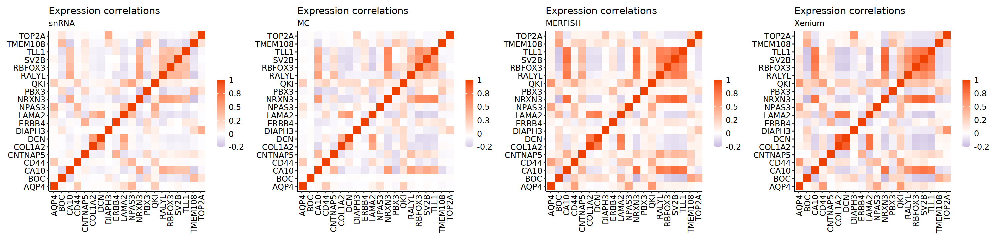

In [235]:
# sorted by ranked highest gene expression - less filtering
options(repr.plot.height = 6, repr.plot.width = 25)
corplots.genes[c(3,2,1,4)] %>% wrap_plots(nrow = 1)
#corplots.genes %>% wrap_plots(nrow = 1)

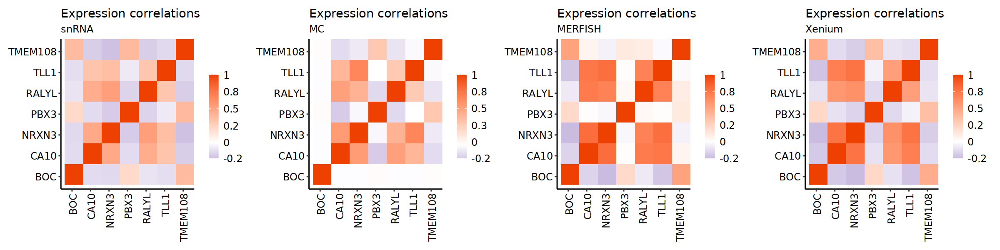

In [242]:
# sorted by ranked highest gene expression - strong filtering
options(repr.plot.height = 5, repr.plot.width = 20)
corplots.genes[c(3,2,1,4)] %>% wrap_plots(nrow = 1)

#### <span style="font-size:12pt; color:gold"> Gene expression correlation analysis - including RNAScope </span>
<span style="font-size:10pt; color:tomato">..using 10 genes - *mb295 & 266* </span> <br /> 

In [43]:
obj$samples %>% table

.
   mb263.10Xsn       mb263.MC   mb263.Xenium    mb266.10Xsn       mb266.MC 
          2932          31371          81415           2989          33485 
 mb266.MERFISH MB266.RNAScope   mb266.Xenium    mb295.10Xsn  mb295.MERFISH 
         58855          25858         123394           5819          73568 
MB295.RNAScope  mb295.w6a1.MC  mb295.w6a2.MC   mb295.Xenium    mb299.10Xsn 
         70470          18676          20665         178183           5302 
      mb299.MC MB299.RNAScope   mb299.Xenium 
         30214          48274         254662 

In [44]:
# NOTE, obj should be -> vz.re.sc.rs.xen_matched.rds

# Subset to keep only 2 samples - mb295 and mb266 ----
cells.use <- 
  obj %>%
  getMeta %>%
  slice(pull(., samples) %>% grep("295|266", .)) %>% rownames

# subset obj and FOVs ----
# load modified subset function
source("./scripts/subset_obj_seurat_v2.R")
obj %<>% subset_opt(cells = cells.use)

# Update metadata ----
obj@meta.data %<>%
  mutate(samples = stringi::stri_replace_all_regex(samples, 
                                pattern = "region[0-1].|w(.)[^:][0-9].", 
                                replacement = "") %>%
                     gsub(pattern = "10Xsn", 
                          replacement = "snRNA", .),
           spatial_tech = stringi::stri_replace_all_regex(spatial_tech, 
                                pattern = "10Xsn", 
                                replacement = "snRNA"))
obj

Updating object slots..

Cloing object..

Matching cells in FOVs..

Cell subsets are found only in FOV: 
mb295.region0.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.region1.Vizgen

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.w5a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a1.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.w6a2.Resolve

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.RNAScope

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.RNAScope

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb266.Xenium

Subsetting Centroids..

Cell subsets are found only in FOV: 
mb295.Xenium

Subsetting Centroids..

Removing FOVs where cells are NOT found: 
mb263.w4a1.Resolve
mb299.w7a1.Resolve
mb299.RNAScope
mb263.Xenium
mb299.Xenium


Warning message:
“Adding image data that isn't associated with any assay present”
Warning messag

An object of class Seurat 
10 features across 611962 samples within 1 assay 
Active assay: MultiTech (10 features, 0 variable features)
 9 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb266.RNAScope mb295.RNAScope mb266.Xenium mb295.Xenium

In [45]:
# clone/store obj
obj_rs_2samples <- obj

<span style="font-size:12pt; color:gold"> Normalize data </span> <br >
<span style="font-size:10pt; color:tomato"> `SCTransform` </span> 

In [142]:
start.time <- Sys.time()
  # fast analysis
  obj %<>% 
    SCTransform(assay = "MultiTech", 
                #clip.range = c(-10, 10), 
                verbose = FALSE) #%>%
  #RunPCA(npcs = 30, features = rownames(obj), verbose = FALSE) %>%
  #RunUMAP(reduction = "pca", dims = 1:30, verbose = FALSE) %>%
  #FindNeighbors(reduction = "pca", dims = 1:30) %>%
  #FindClusters(resolution = 0.15, 
  #             method = "igraph", 
  #             algorithm = 1 #algorithm = 4 # leiden clustering
  #            ) %>% suppressWarnings()
  end.time <- Sys.time()
  end.time - start.time
obj

Time difference of 47.3393 secs

An object of class Seurat 
20 features across 611962 samples within 2 assays 
Active assay: SCT (10 features, 10 variable features)
 1 other assay present: MultiTech
 9 spatial fields of view present: mb295.region0.Vizgen mb266.region1.Vizgen mb266.w5a1.Resolve mb295.w6a1.Resolve mb295.w6a2.Resolve mb266.RNAScope mb295.RNAScope mb266.Xenium mb295.Xenium

In [46]:
# NOTE: run subset obj to use only 2 samples
# match genes in the object
markers <- 
    rownames(obj)
# use markers matched to count matrix
Idents(obj) <- "spatial_tech"
expr_mat <-
    GetAssayData(obj, slot = "counts",
                 assay = "MultiTech"
                 #assay = "SCT"
                )
expr_mat %>% str

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:2384938] 0 6 8 1 7 1 5 0 1 4 ...
  ..@ p       : int [1:611963] 0 2 3 5 7 12 14 17 22 23 ...
  ..@ Dim     : int [1:2] 10 611962
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:10] "CNTN2" "PTCH1" "PBX3" "TRPM3" ...
  .. ..$ : chr [1:611962] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" "Vz_mb295.region0.Vizgen_112833000000100021" ...
  ..@ x       : num [1:2384938] 1 1 1 3 1 1 2 1 1 1 ...
  ..@ factors : list()


In [47]:
obj@meta.data %<>%
mutate(samples = samples %>% gsub("MB", "mb", .))

In [48]:
# get HEGs - sorted high expressed genes 
DefaultAssay(obj) <- "MultiTech"
#DefaultAssay(obj) <- "SCT"
df.expr <- 
FetchData(obj, vars = markers, slot = "counts") %>%
    # add samples/FOV names, and spatial tech
    mutate(spatial_tech = obj$spatial_tech,
           samples = obj$samples)

df.expr %>% str

# make new df adding some calculations
df.expr.sum <-
df.expr %>%
    # convert from wide to long format
    reshape2::melt(.) %>%
    # rename vars
    rename(genes = variable, transcript_counts = value) %>%
    # group by vars
    group_by(samples, spatial_tech, genes, .drop = FALSE) %>%
    # sum all expression from all cells..
    summarise(sum.counts = sum(transcript_counts)) %>%
    ungroup() %>% 
    group_by(samples) %>%
    group_split() %>%
    purrr::map(., ~ mutate(., ranks = 
                         data.table::frank(., sum.counts, 
                                           ties.method = "dense"),
                          genes = as.character.factor(genes))) %>%
    data.table::rbindlist() %>%
    ungroup %>%
    # order value high-to-low
    arrange(desc(sum.counts))
df.expr.sum %>% head

'data.frame':	611962 obs. of  12 variables:
 $ CNTN2       : num  1 0 0 0 1 0 2 4 0 2 ...
 $ PTCH1       : num  0 0 3 1 1 0 0 4 0 0 ...
 $ PBX3        : num  0 0 0 0 0 0 0 1 0 0 ...
 $ TRPM3       : num  0 0 0 0 0 1 0 0 0 0 ...
 $ DIAPH3      : num  0 0 0 0 1 0 0 0 0 0 ...
 $ LAMA2       : num  0 0 0 2 0 0 3 0 5 0 ...
 $ NRXN3       : num  1 0 0 0 1 1 4 1 0 0 ...
 $ GLI1        : num  0 0 1 0 0 0 0 0 0 0 ...
 $ RBFOX3      : num  0 1 0 0 1 0 0 3 0 0 ...
 $ PLEKHA7     : num  0 0 0 0 0 0 0 0 0 0 ...
 $ spatial_tech: Named chr  "MERFISH" "MERFISH" "MERFISH" "MERFISH" ...
  ..- attr(*, "names")= chr [1:611962] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Vizgen_112833000000100016" "Vz_mb295.region0.Vizgen_112833000000100020" "Vz_mb295.region0.Vizgen_112833000000100021" ...
 $ samples     : Named chr  "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" "mb295.MERFISH" ...
  ..- attr(*, "names")= chr [1:611962] "Vz_mb295.region0.Vizgen_112833000000100009" "Vz_mb295.region0.Viz

Using spatial_tech, samples as id variables

`summarise()` has grouped output by 'samples', 'spatial_tech'. You can override
using the `.groups` argument.


samples,spatial_tech,genes,sum.counts,ranks
<chr>,<chr>,<chr>,<dbl>,<int>
mb266.Xenium,Xenium,NRXN3,837977,10
mb295.Xenium,Xenium,NRXN3,497537,10
mb266.Xenium,Xenium,RBFOX3,485805,9
mb295.Xenium,Xenium,RBFOX3,372354,9
mb266.MERFISH,MERFISH,NRXN3,352996,10
mb295.RNAScope,RNAScope,RBFOX3,313992,10


In [49]:
# get correlations and plots - only 10 genes - per tech!
pbapply::pboptions(type = "timer", style = 1, char = "=")
corplots.selected.genes <- 
  pbapply::pblapply(c(obj$spatial_tech %>% unique) %>% seq, 
                           function(i) {
                           # cells per tech.    
                           cells_use <- Cells(obj)[which(obj$spatial_tech %in% 
                                                         c(obj$spatial_tech %>% unique)[i])]
                           # gene to use    
                           #genes_use <<- markers %<>% intersect(., rownames(obj))
                           # custom    
                           genes_use <- c("CNTN2", "NRXN3", "RBFOX3",
                                          "PBX3", "PTCH1", "LAMA2", "TRPM3",
                                          "GLI1", "PLEKHA7", "DIAPH3")
                           # gene sorted by highest summed expression (should be previously calculated)
                           if (FALSE) {
                            genes_use <- 
                               df.expr.sum %>%
                               # tech specific HEGS
                               #filter(samples == c(obj$samples %>% unique)[i]) %>%
                               pull(genes) %>% 
                               #as.character.factor() %>%
                               unique()
                           } 
                           
                           mat4cor <- # store as global var.
                             expr_mat[genes_use, cells_use] %>%
                             as.matrix %>% # convert to dense matrix
                             t # transpose to compare genes (else cells/spots will be compared)
                               
                           # make correlation matrix
                           #cormat <- 
                           #  expr_mat[genes_use, cells_use] %>%
                           #  as.matrix %>% # convert to dense matrix
                           #  t %>% # transpose to compare genes (else cells/spots will be compared)
                          cormat <-
                            mat4cor %>%   
                            cor %>% # compute correlation between each pair
                            round(digits = 2) %>% # round up correlation values
                            reshape2::melt(.) #%>% # convert from wide to long format
                             # sort genes from high to low correlations  
                             #arrange(-desc(value)) %>%
                             #mutate_if(is.factor, as.character.factor)
                            
                           # check for NAs
                           if (any(cormat$value %>% is.na)) {
                             message("NAs are present")
                           } else { message("No NAs - all clean!") }
                           
                           #scale.col <- c("orangered", "blue1", "gray8")
                           
                           # make breaks
                           breaks.cor <- 
                             classInt::classIntervals(c(min(cormat %>% pull(value), na.rm = TRUE), 
                                                        pretty(cormat %>% pull(value) %>% 
                                                               na.omit, n = 20)[-1] %>% 
                                                        sort %>% unique), 
                                                      n = 5, style = "quantile")$brks
                               
                           corplot <-
                             cormat %>%
                             ggplot(aes(x = factor(Var1), y = factor(Var2), fill = value, 
                                        colour = if (any(value %>% is.na)) { "" }
                                       )) &
                             #geom_tile() &
                             geom_raster(interpolate = F, show.legend = TRUE,
                                         hjust = 0.6, vjust = 0.6) &
                             scale_fill_gradient2(name = NULL, 
                                                  #mid = "white",
                                                  low = "navy",
                                                  high = "orangered2",
                                                  breaks = breaks.cor,
                                                  labels = breaks.cor %>% round(digits = 1),
                                                  limits = breaks.cor %>% range,
                                                  na.value = alpha("gray70", 0.5) # NA values
                                                  
                             ) &
                             { if (any(cormat$value %>% is.na)) {
                                 list(
                                 scale_colour_manual(values = NA),
                                 guides(colour = 
                                        guide_legend(title = "NA", order = 1,
                                                     override.aes = list(colour = alpha("gray70", 0.5), 
                                                                         fill = alpha("gray70", 0.5)
                                                                        )))
                             )}} & 
                             theme_classic(base_size = 14) & #%>% dark_mode &
                             theme(axis.text = element_text(size = 14, color = "black"),
                                   legend.text = element_text(size = 14),
                                   legend.position = "right", 
                                   legend.key.height = grid::unit(0.85,"cm"),
                                   legend.key.width = grid::unit(0.5,"cm"), 
                                   axis.text.x = element_text(angle = 90, vjust = 0.6, hjust=1)) &
                             labs(title = "Expression correlations", 
                                  subtitle = c(obj$spatial_tech %>% unique)[i], x = NULL, y = NULL)                   
                         }
) %>% suppressMessages()

corplots.selected.genes %>% class
corplots.selected.genes %>% length

  |==================================================| 100% elapsed=22s, remaining~00s


[1] "list"

[1] 5

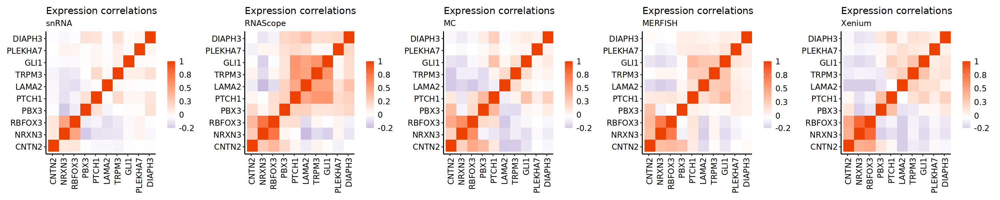

In [52]:
options(repr.plot.height = 5, repr.plot.width = 25)
corplots.selected.genes[c(3,4,2,1,5)] %>% wrap_plots(nrow = 1)

In [38]:
# save plot
ggsave(corplots.selected.genes[c(3,4,2,1,5)] %>% wrap_plots(nrow = 1), 
      file = "./fig4/panel_A/corr_tech_10genes.pdf", 
       device = cairo_pdf,
       height = 5, width = 25, dpi = 200)
dev.off()

null device 
          1

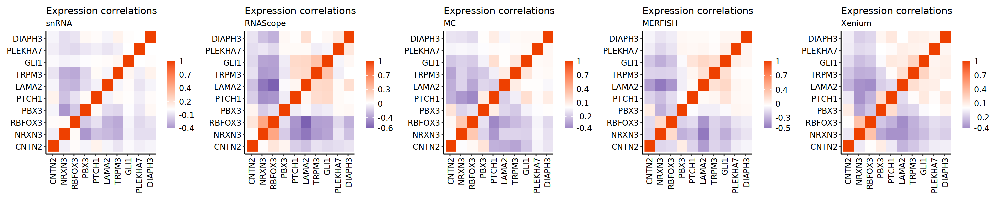

In [166]:
options(repr.plot.height = 5, repr.plot.width = 25)
corplots.selected.genes[c(3,4,2,1,5)] %>% wrap_plots(nrow = 1)

In [152]:
# save plot
ggsave(corplots.selected.genes[c(3,4,2,1,5)] %>% wrap_plots(nrow = 1), 
      file = "./fig4/panel_A/corr_tech_10genes_SCT.pdf", 
       device = cairo_pdf,
       height = 5, width = 25, dpi = 200)
dev.off()

null device 
          1

In [53]:
# export .csv table of correlations 
corplots.selected.genes <- corplots.selected.genes[c(3,4,2,1,5)]
cor_tables <-
lapply(seq(corplots.selected.genes), function(i) {
    corplots.selected.genes[[i]]$data %>%
    mutate_if(is.factor, as.character.factor) %>% 
    mutate(spatial_tech = corplots.selected.genes[[i]]$labels$subtitle)
})
cor_tables %>% str

List of 5
 $ :'data.frame':	100 obs. of  4 variables:
  ..$ Var1        : chr [1:100] "CNTN2" "NRXN3" "RBFOX3" "PBX3" ...
  ..$ Var2        : chr [1:100] "CNTN2" "CNTN2" "CNTN2" "CNTN2" ...
  ..$ value       : num [1:100] 1 0.13 0.14 -0.01 -0.03 -0.03 -0.04 -0.01 0 -0.01 ...
  ..$ spatial_tech: chr [1:100] "snRNA" "snRNA" "snRNA" "snRNA" ...
 $ :'data.frame':	100 obs. of  4 variables:
  ..$ Var1        : chr [1:100] "CNTN2" "NRXN3" "RBFOX3" "PBX3" ...
  ..$ Var2        : chr [1:100] "CNTN2" "CNTN2" "CNTN2" "CNTN2" ...
  ..$ value       : num [1:100] 1 0.29 0.4 0.21 0.05 -0.07 0.07 0.01 -0.05 0 ...
  ..$ spatial_tech: chr [1:100] "RNAScope" "RNAScope" "RNAScope" "RNAScope" ...
 $ :'data.frame':	100 obs. of  4 variables:
  ..$ Var1        : chr [1:100] "CNTN2" "NRXN3" "RBFOX3" "PBX3" ...
  ..$ Var2        : chr [1:100] "CNTN2" "CNTN2" "CNTN2" "CNTN2" ...
  ..$ value       : num [1:100] 1 0.25 0.48 0.38 0.13 -0.2 -0.19 -0.1 0 -0.03 ...
  ..$ spatial_tech: chr [1:100] "MC" "MC" "MC" "MC" .

In [30]:
# export
for (i in seq(cor_tables)) {
    data.table::fwrite(x = cor_tables[[i]],
                       file = paste0("./fig4/panel_A/", 
                                     cor_tables[[i]]$spatial_tech %>% unique, 
                                     "_corr_tech_10genes.csv")
                      )}

##### <span style="font-size:11pt; color:gold"> Cacluate Cosine similarity using correlations as input </span>
<span style="font-size:10pt; color:tomato"> techs vs techs </span>

In [ ]:
# each tech vs each tech
library(lsa)

In [278]:
compar_4 <-
lapply(seq(cor_tables), function(i) {
    data.frame(cosine_sim =
        cosine(cor_tables[[2]]$value, 
              cor_tables[[i]]$value)) %>%
    mutate(comparison = paste0(cor_tables[[2]]$spatial_tech %>% unique, "_vs_",
                          cor_tables[[i]]$spatial_tech %>% unique))
}) %>% data.table::rbindlist()
compar_4 %<>% arrange(desc(cosine_sim))

In [196]:
# test only
compar_4 <-
lapply(seq(cor_tables), function(i) {
    data.frame(cosine_sim =
        cosine(cor_tables[[2]]$value %>% z_fisher(r = .) %>% 
.[is.finite(cor_tables[[2]]$value %>% z_fisher(r = .))] 
, 
              cor_tables[[i]]$value %>% z_fisher(r = .) %>% 
.[is.finite(cor_tables[[i]]$value %>% z_fisher(r = .))] 
)) %>%
    mutate(comparison = paste0(cor_tables[[2]]$spatial_tech %>% unique, "_vs_",
                          cor_tables[[i]]$spatial_tech %>% unique))
}) %>% data.table::rbindlist()
compar_4

cosine_sim,comparison
<dbl>,<chr>
0.669340,RNAScope_vs_snRNA
1.000000,RNAScope_vs_RNAScope
0.711523,RNAScope_vs_MC
0.890322,RNAScope_vs_MERFISH
0.775034,RNAScope_vs_Xenium


In [279]:
compar_4 %<>% 
mutate(comparison = comparison, 
       tech = gsub("RNAScope_vs_", "", compar_4$comparison),
       tech_vs = "RNAScope")

In [280]:
compar_4

cosine_sim,comparison,tech,tech_vs
<dbl>,<chr>,<chr>,<chr>
1.000000,RNAScope_vs_RNAScope,RNAScope,RNAScope
0.949440,RNAScope_vs_MERFISH,MERFISH,RNAScope
0.910355,RNAScope_vs_Xenium,Xenium,RNAScope
0.887560,RNAScope_vs_MC,MC,RNAScope
0.857359,RNAScope_vs_snRNA,snRNA,RNAScope


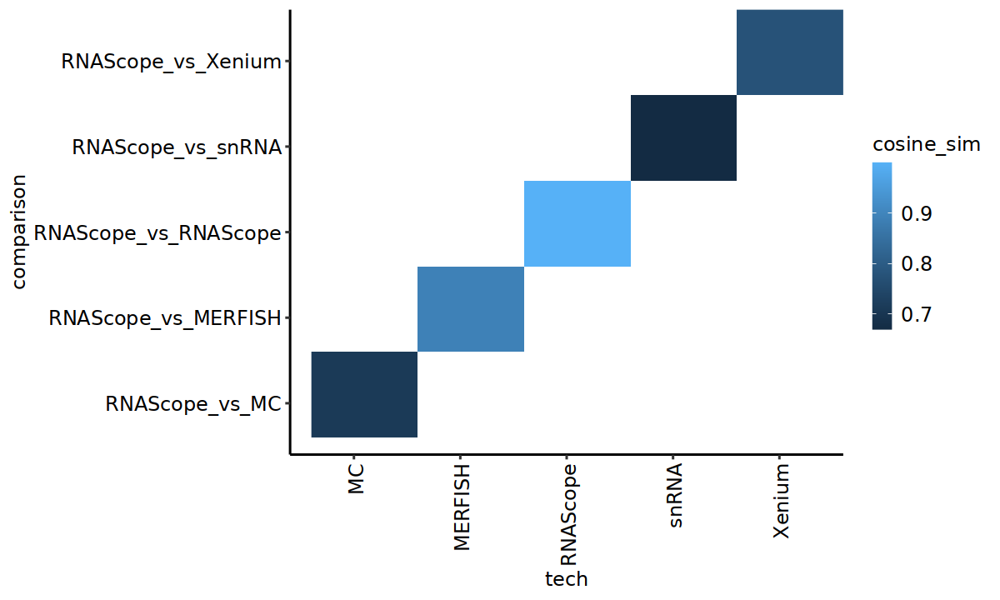

In [274]:
options(repr.plot.height = 6, repr.plot.width = 10)
compar_4 %>%
ggplot(aes(x = tech, 
           y = comparison, fill = cosine_sim)) &
geom_raster(interpolate = F, show.legend = TRUE, hjust = 0.6, vjust = 0.6) &
theme_classic(base_size = 14) & #%>% dark_mode &
                             theme(axis.text = element_text(size = 14, color = "black"),
                                   legend.text = element_text(size = 14),
                                   legend.position = "right", 
                                   legend.key.height = grid::unit(0.85,"cm"),
                                   legend.key.width = grid::unit(0.5,"cm"), 
                                   axis.text.x = element_text(angle = 90, vjust = 0.6, hjust=1))

##### <span style="font-size:11pt; color:gold"> Get correlations and plots - only 10 genes - per sample! </span>

In [248]:
# get correlations and plots - only 10 genes - per sample!
pbapply::pboptions(type = "timer", style = 1, char = "=")
corplots.selected.genes <- 
  pbapply::pblapply(c(obj$samples %>% unique) %>% seq, 
                           function(i) {
                           # cells per tech.    
                           cells_use <- Cells(obj)[which(obj$samples %in% 
                                                         c(obj$samples %>% unique)[i])]
                           # gene to use    
                           #genes_use <<- markers %<>% intersect(., rownames(obj))
                           # custom    
                           genes_use <- c("CNTN2", "NRXN3", "RBFOX3", 
                                          "PTCH1", "LAMA2", "TRPM3", 
                                          "PBX3", "GLI1", "PLEKHA7", "DIAPH3")
                               
                           # gene sorted by highest summed expression (should be previously calculated)
                           if (FALSE) {
                            genes_use <- 
                               df.expr.sum %>%
                               # tech specific HEGS
                               #filter(samples == c(obj$samples %>% unique)[i]) %>%
                               pull(genes) %>% 
                               #as.character.factor() %>%
                               unique()
                           }   
                           # make correlation matrix
                           cormat <- 
                             expr_mat[genes_use, cells_use] %>%
                             as.matrix %>% # convert to dense matrix
                             t %>% # transpose to compare genes (else cells/spots will be compared)
                             cor %>% # compute correlation between each pair
                             round(digits = 2) %>% # round up correlation values
                             reshape2::melt(.) #%>% # convert from wide to long format
                             # sort genes from high to low correlations  
                             #arrange(-desc(value)) %>%
                             #mutate_if(is.factor, as.character.factor)
                            
                           # check for NAs
                           if (any(cormat$value %>% is.na)) {
                             message("NAs are present")
                           } else { message("No NAs - all clean!") }
                           
                           #scale.col <- c("orangered", "blue1", "gray8")
                           
                           # make breaks
                           breaks.cor <- 
                             classInt::classIntervals(c(min(cormat %>% pull(value), na.rm = TRUE), 
                                                        pretty(cormat %>% pull(value) %>% 
                                                               na.omit, n = 20)[-1] %>% 
                                                        sort %>% unique), 
                                                      n = 5, style = "quantile")$brks
                               
                           corplot <-
                             cormat %>%
                             ggplot(aes(x = factor(Var1), y = factor(Var2), fill = value, 
                                        colour = if (any(value %>% is.na)) { "" }
                                       )) &
                             #geom_tile() &
                             geom_raster(interpolate = F, show.legend = TRUE,
                                         hjust = 0.6, vjust = 0.6) &
                             scale_fill_gradient2(name = NULL, 
                                                  #mid = "white",
                                                  low = "navy",
                                                  high = "orangered2",
                                                  breaks = breaks.cor,
                                                  labels = breaks.cor %>% round(digits = 1),
                                                  limits = breaks.cor %>% range,
                                                  na.value = alpha("gray70", 0.5) # NA values
                                                  
                             ) &
                             { if (any(cormat$value %>% is.na)) {
                                 list(
                                 scale_colour_manual(values = NA),
                                 guides(colour = 
                                        guide_legend(title = "NA", order = 1,
                                                     override.aes = list(colour = alpha("gray70", 0.5), 
                                                                         fill = alpha("gray70", 0.5)
                                                                        )))
                             )}} & 
                             theme_classic(base_size = 14) & #%>% dark_mode &
                             theme(axis.text = element_text(size = 14, color = "black"),
                                   legend.text = element_text(size = 14),
                                   legend.position = "right", 
                                   legend.key.height = grid::unit(0.85,"cm"),
                                   legend.key.width = grid::unit(0.5,"cm"), 
                                   axis.text.x = element_text(angle = 90, vjust = 0.6, hjust=1)) &
                             labs(title = "Expression correlations", 
                                  subtitle = c(obj$samples %>% unique)[i], x = NULL, y = NULL)
                           
                         }
) %>% suppressMessages()

corplots.selected.genes %>% class
corplots.selected.genes %>% length

  |==================================================| 100% elapsed=40s, remaining~00s


[1] "list"

[1] 10

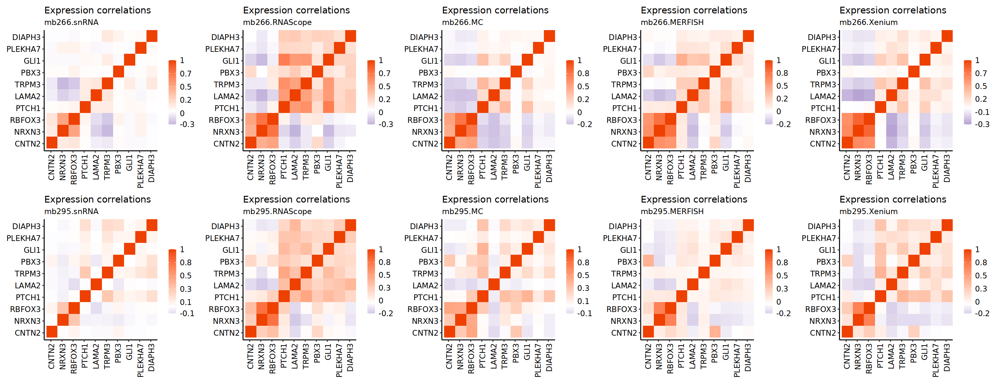

In [254]:
options(repr.plot.height = 10, repr.plot.width = 26)
# ordered
corplots.selected.genes[c(6,7,3,2,9,5,8,4,1,10)] %>% wrap_plots(nrow = 2)
#corplots.selected.genes  %>% wrap_plots(nrow = 2)